# Analyses and plots genetic load manuscript

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import os
import gzip
from matplotlib.gridspec import GridSpec
from matplotlib import colormaps
from Bio.Phylo.TreeConstruction import DistanceTreeConstructor, DistanceMatrix
from Bio import Phylo
from skbio import DistanceMatrix
from skbio.tree import nj
from io import StringIO
from skbio import TreeNode
jn = os.path.join
import sys, ete3
sys.path.append('/data/antwerpen/grp/asvardal/hs_tools')
from pypopgen3.modules import treetools as tt
from pypopgen3.modules import diversity
from ete3 import TreeStyle, NodeStyle
from scipy.stats import shapiro, ttest_ind, mannwhitneyu
import matplotlib.font_manager as fm
import pysam
import math
import glob

In [2]:
import logging
logging.getLogger("matplotlib.font_manager").setLevel(logging.ERROR)

### 1.1. PCA plot

In [30]:
# read the eigen vectors and values from the file
eigenvectors = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/PCA/psiculus_inbreeding_all.eigenvec", sep="\t").iloc[:, 2:].to_numpy()
eigenvalues = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/PCA/psiculus_inbreeding_all.eigenval", sep=" ", header=None).iloc[:, 0].to_numpy()
eigenvector_samples = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/PCA/psiculus_inbreeding_all.eigenvec", sep="\t", usecols=[1], header=None).iloc[:, 0].tolist()

In [31]:
eigenvector_samples1 = eigenvector_samples[1:] 

In [32]:
# extract the population codes from sample names
populations = [
    sample[2:4] if sample.startswith("24") else sample[:2] 
    for sample in eigenvector_samples
]
# remove "II"
populations = [pop for pop in populations if pop != 'II']
# recode CV and FV to RG
populations = ['RG' if pop in ['CV', 'FV'] else pop for pop in populations]
# get unique populations
unique_populations = list(set(populations))
unique_populations


['PJ', 'SC', 'MP', 'TR', 'BJ', 'TM', 'KP', 'SP', 'PM', 'RG', 'VS', 'PL', 'PK']

In [75]:
# define a specific color for each population
# color_map = {
#     'PJ':'#6BAED6',
#     'MP': '#2171B5',
#     'KP': '#4292C6',
#     'PM': '#08306B',
#     'BJ': '#08519C',
#     'SC': '#9ECAE1',
#     'PK': '#C6DBEF',
#     'VS': '#238B45',
#     'TM': '#00441B',
#     'RG': '#BAE4B3',
#     'SP': '#74C476',
#     'TR': '#006D2C',
#     'PL': '#41AB5D'
# }

color_map = {
    'PJ':'#E4F1F8',
    'MP': '#C5E1EF',
    'KP': '#3A93C2',
    'PM': '#0C4A70',
    'BJ': '#6CB0D6',
    'SC': '#9EC9E2',
    'PK': '#246D9C',
    'VS': '#0A592A',
    'TM': '#3FAD5B',
    'RG': '#218B3B',
    'SP': '#CDE5D2',
    'TR': '#9CCEA7',
    'PL': '#6CB97D'
}
# assign colors to each sample based on population
population_colors = [color_map[pop] for pop in populations]

if len(population_colors) > eigenvectors.shape[0]:
    population_colors = population_colors[:eigenvectors.shape[0]]

In [34]:
# calculate the proportion of variance explained by each PC
variance_explained = eigenvalues / np.sum(eigenvalues) * 100

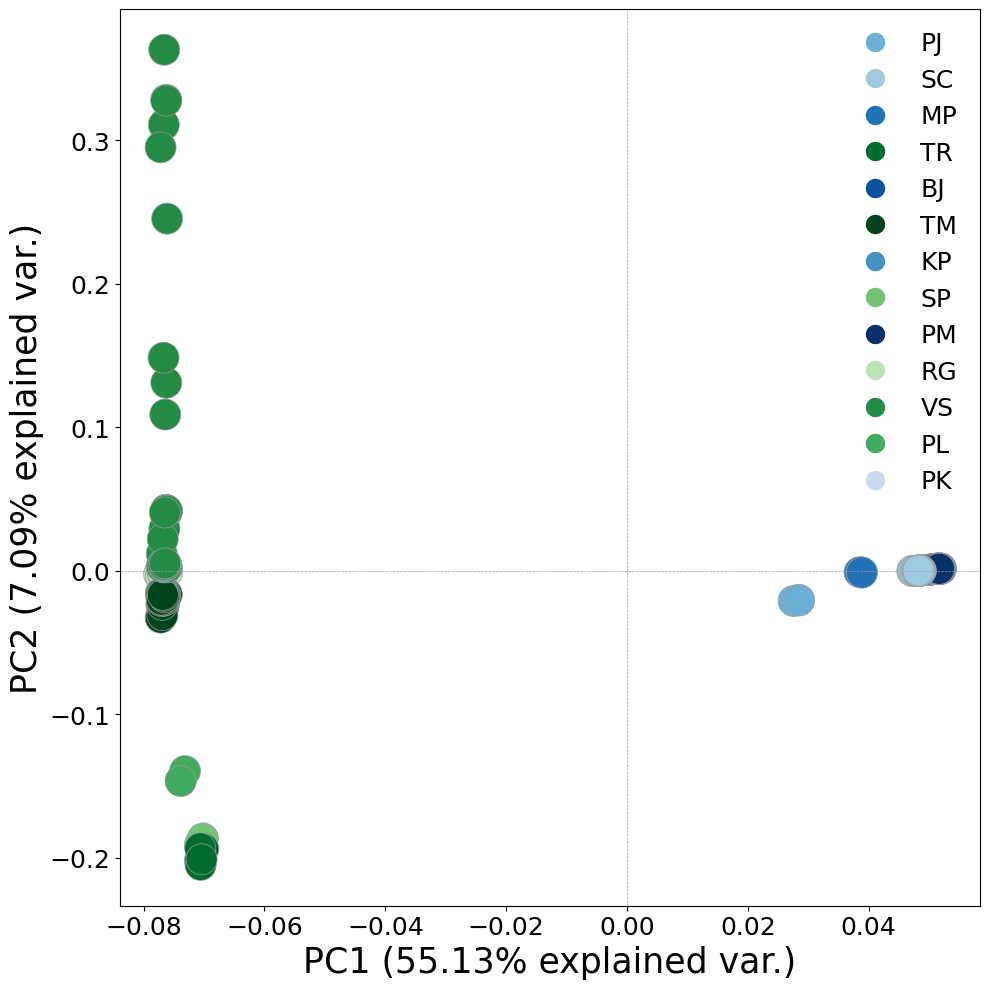

In [35]:
# create the PCA plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(eigenvectors[:, 0], eigenvectors[:, 1], c=population_colors, edgecolor='#9B9FA1', s=500, linewidths = 0.5)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[pop], markersize=15) 
           for pop in unique_populations]
plt.legend(handles, unique_populations, loc="best", frameon=True, framealpha=0, edgecolor='black', fontsize = 18)
plt.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5)
plt.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(f'PC1 ({variance_explained[0]:.2f}% explained var.)', fontsize = 25)
plt.ylabel(f'PC2 ({variance_explained[1]:.2f}% explained var.)', fontsize = 25)
plt.tight_layout()
#plt.savefig("1.svg", format="svg")
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

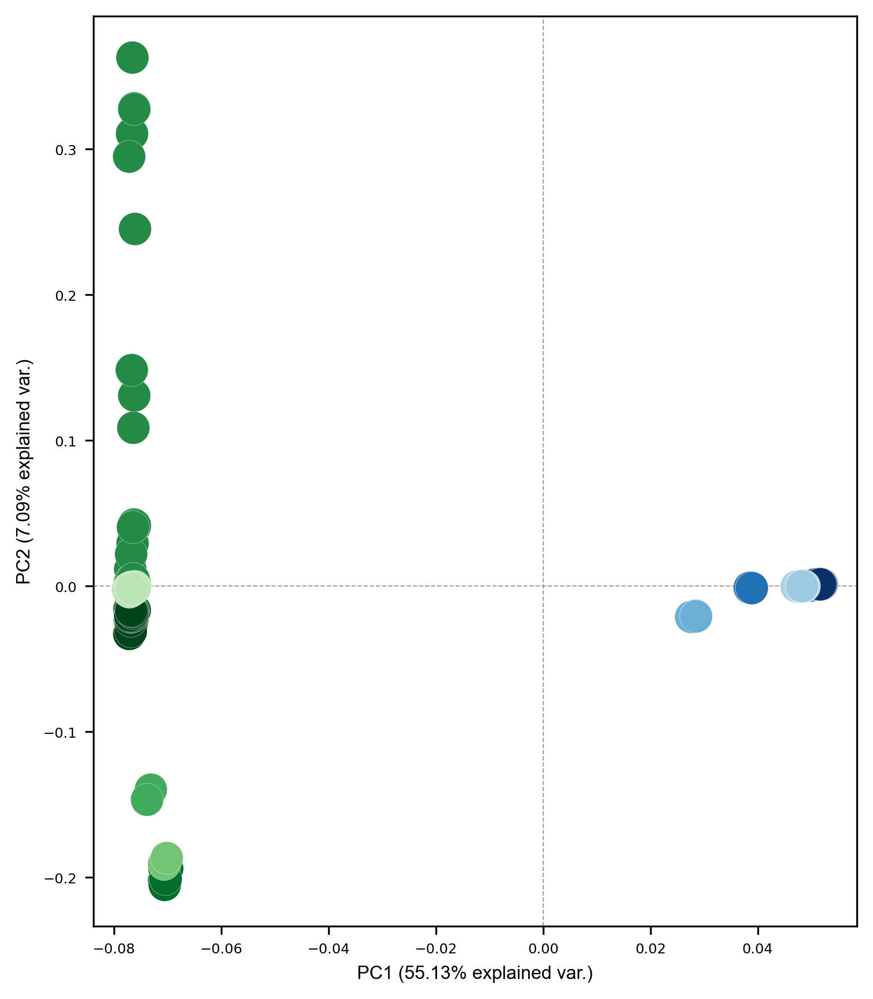

In [36]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

# === Load Arial font from scratch ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Figure size in cm (~15 cm) ===
cm = 1 / 2.54
fig_width = 15 * cm
fig_height = 18 * cm
fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)

# Adjust margins to minimize whitespace
#fig.subplots_adjust(left=0.01, right=0.01, bottom=0.01, top=0.01)

# === Grey reference lines behind ===
ax.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)
ax.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)

# === Plotting order: others first, then RG, then SP ===
rg_idx = [i for i, pop in enumerate(populations) if pop == 'RG']
sp_idx = [i for i, pop in enumerate(populations) if pop == 'SP']
other_idx = [i for i, pop in enumerate(populations) if pop not in ['RG', 'SP']]

# Others
ax.scatter(
    eigenvectors[other_idx, 0],
    eigenvectors[other_idx, 1],
    c=[population_colors[i] for i in other_idx],
    edgecolor='white',   # added edge color
    linewidths=0.1,
    s=200,
    zorder=2
)

# RG on top
ax.scatter(
    eigenvectors[rg_idx, 0],
    eigenvectors[rg_idx, 1],
    c=[population_colors[i] for i in rg_idx],
    edgecolor='white',   # added edge color
    linewidths=0.1,
    s=200,
    zorder=3
)

# SP on very top
ax.scatter(
    eigenvectors[sp_idx, 0],
    eigenvectors[sp_idx, 1],
    c=[population_colors[i] for i in sp_idx],
    edgecolor='white',   # added edge color
    linewidths=0.1,
    s=200,
    zorder=4
)

# === Legend (optional, uncomment if needed) ===
# handles = [
#     plt.Line2D([0], [0], marker='o', color='w',
#                markerfacecolor=color_map[pop],
#                markersize=6, linewidth=0)
#     for pop in unique_populations
# ]
# ax.legend(handles, unique_populations, loc="best", frameon=False,
#           fontsize=6, prop=arial_font)

# === Axis labels ===
ax.set_xlabel(f'PC1 ({variance_explained[0]:.2f}% explained var.)',
              fontsize=8, fontproperties=arial_font)
ax.set_ylabel(f'PC2 ({variance_explained[1]:.2f}% explained var.)',
              fontsize=8, fontproperties=arial_font)

# === Tick labels ===
plt.xticks(fontsize=6) # default font 
plt.yticks(fontsize=6)

# === Save figure ===
#plt.savefig("Figure_1b_v1.png", format="png", dpi=300, bbox_inches='tight')
plt.show()


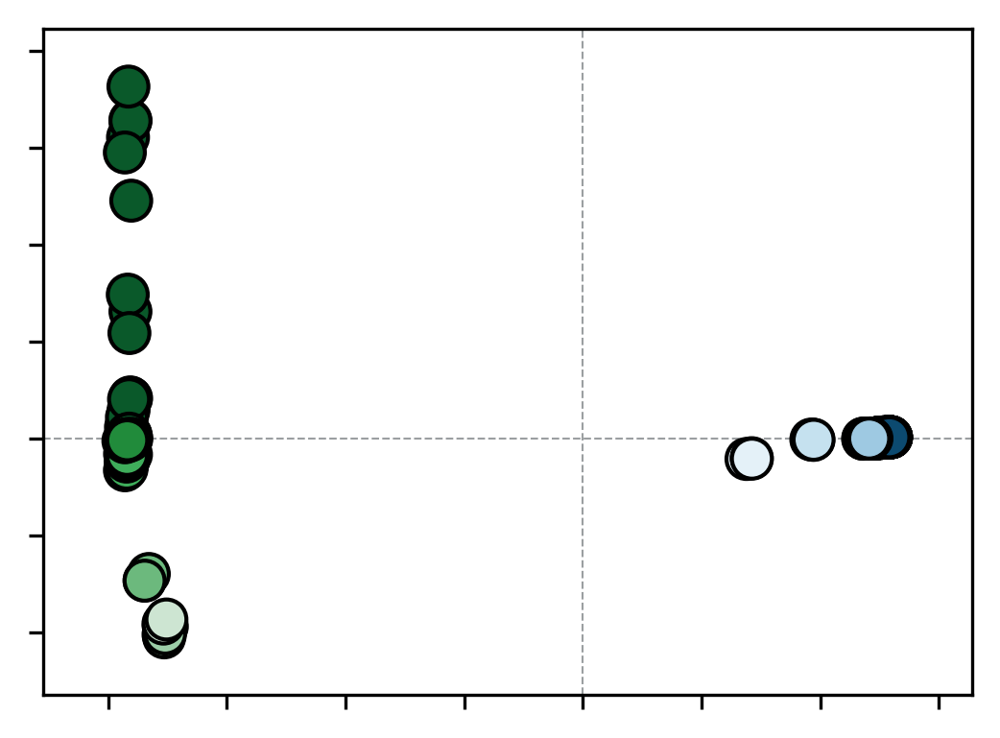

In [86]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# Keep fonts editable in vector graphics
#plt.rcParams['svg.fonttype'] = 'none'

# Font sizes
plt.rcParams['font.size'] = 3
plt.rcParams['axes.labelsize'] = 3
plt.rcParams['xtick.labelsize'] = 3
plt.rcParams['ytick.labelsize'] = 3


# =========================
# Exact figure size
# =========================
cm = 1 / 2.54
fig_width = 9.53 * cm
fig_height = 7 * cm

fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)

# =========================
# Grey reference lines
# =========================
ax.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)
ax.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)


# =========================
# Plotting order
# =========================
rg_idx = [i for i, pop in enumerate(populations) if pop == 'RG']
sp_idx = [i for i, pop in enumerate(populations) if pop == 'SP']
other_idx = [i for i, pop in enumerate(populations) if pop not in ['RG', 'SP']]


# Others
ax.scatter(
    eigenvectors[other_idx, 0],
    eigenvectors[other_idx, 1],
    c=[population_colors[i] for i in other_idx],
    edgecolor='black',
    linewidths=1,
    s=100,
    zorder=2
)

# RG
ax.scatter(
    eigenvectors[rg_idx, 0],
    eigenvectors[rg_idx, 1],
    c=[population_colors[i] for i in rg_idx],
    edgecolor='black',
    linewidths=1,
    s=100,
    zorder=3
)

# SP
ax.scatter(
    eigenvectors[sp_idx, 0],
    eigenvectors[sp_idx, 1],
    c=[population_colors[i] for i in sp_idx],
    edgecolor='black',
    linewidths=1,
    s=100,
    zorder=4
)


# =========================
# Axis labels
# =========================
#ax.set_xlabel(f'PC1 ({variance_explained[0]:.2f}% explained var.)',labelpad=10)

#ax.set_ylabel(f'PC2 ({variance_explained[1]:.2f}% explained var.)',labelpad=10)

ax.set_xlabel("")
ax.set_ylabel("")

# =========================
# Ensure tick fonts = Arial
# =========================
# Tick appearance
ax.tick_params(axis='both', labelsize=3, pad=5)

# Remove tick numbers but keep ticks
ax.set_xticklabels([])
ax.set_yticklabels([])

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontproperties(arial_font)

# Expand axis limits
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

xrange = xmax - xmin
yrange = ymax - ymin

ax.set_xlim(xmin - 0.05*xrange, xmax + 0.05*xrange)
ax.set_ylim(ymin - 0.05*yrange, ymax + 0.05*yrange)
ax.set_position([0.12, 0.14, 0.86, 0.84])
# force layout calculation
fig.canvas.draw()

plt.savefig(
    "Figure_1b_PCA.svg",
    format="svg",
    dpi=300
)

#plt.close()

plt.show()

In [ ]:
plt.figure(figsize=(10, 10))
scatter = plt.scatter(
    eigenvectors[:, 0],
    eigenvectors[:, 1],
    c=population_colors,
    edgecolor='#9B9FA1',
    s=500,
    linewidths=0.5
)

# Add legend
handles = [plt.Line2D([0], [0], marker='o', color='w',
                      markerfacecolor=color_map[pop], markersize=15) 
           for pop in unique_populations]
plt.legend(handles, unique_populations, loc="best",
           frameon=True, framealpha=0, edgecolor='black', fontsize=18)

# Axis lines
plt.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5)
plt.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5)

# Label each point
for i, sample in enumerate(eigenvector_samples1):  # sample_ids = list of your individual names
    plt.text(
        eigenvectors[i, 0], eigenvectors[i, 1],
        sample,
        fontsize=10,
        ha='center', va='center'
    )

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(f'PC1 ({variance_explained[0]:.2f}% explained var.)', fontsize=25)
plt.ylabel(f'PC2 ({variance_explained[1]:.2f}% explained var.)', fontsize=25)
plt.tight_layout()
plt.show()


### 1.2. PCA plot islands only

In [87]:
# read the eigen vectors and values from the file
eigenvectors = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/PCA/psiculus_inbreeding_island.eigenvec", sep="\t").iloc[:, 2:].to_numpy()
eigenvalues = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/PCA/psiculus_inbreeding_island.eigenval", sep=" ", header=None).iloc[:, 0].to_numpy()
eigenvector_samples = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/PCA/psiculus_inbreeding_island.eigenvec", sep="\t", usecols=[1], header=None).iloc[:, 0].tolist()

In [88]:
# extract the population codes from sample names
populations = populations = [
    sample[2:4] if sample.startswith("24") else sample[:2] 
    for sample in eigenvector_samples]

populations = [pop for pop in populations if pop != 'II']
unique_populations = list(set(populations))
unique_populations

['PJ', 'SC', 'MP', 'BJ', 'KP', 'PM', 'PK']

In [90]:
# define a specific color for each population
# color_map = {
#     'PJ':'#6BAED6',
#     'MP': '#2171B5',
#     'KP': '#4292C6',
#     'PM': '#08306B',
#     'BJ': '#08519C',
#     'SC': '#9ECAE1',
#     'PK': '#C6DBEF',
#     'VS': '#238B45',
#     'TM': '#00441B',
#     'RG': '#BAE4B3',
#     'SP': '#74C476',
#     'TR': '#006D2C',
#     'PL': '#41AB5D'
# }

color_map = {
    'PJ':'#E4F1F8',
    'MP': '#C5E1EF',
    'KP': '#3A93C2',
    'PM': '#0C4A70',
    'BJ': '#6CB0D6',
    'SC': '#9EC9E2',
    'PK': '#246D9C',
    'VS': '#0A592A',
    'TM': '#3FAD5B',
    'RG': '#218B3B',
    'SP': '#CDE5D2',
    'TR': '#9CCEA7',
    'PL': '#6CB97D'
}
# assign colors to each sample based on population
population_colors = [color_map[pop] for pop in populations]

if len(population_colors) > eigenvectors.shape[0]:
    population_colors = population_colors[:eigenvectors.shape[0]]

In [91]:
# calculate the proportion of variance explained by each PC
variance_explained = eigenvalues / np.sum(eigenvalues) * 100

In [ ]:
# create the PCA plot
plt.figure(figsize=(10, 10))
scatter = plt.scatter(eigenvectors[:, 0], eigenvectors[:, 1], c=population_colors, edgecolor='#9B9FA1', s=500, linewidths = 0.5)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[pop], markersize=15) 
           for pop in unique_populations]
plt.legend(handles, unique_populations, loc="best", frameon=True, framealpha=0, edgecolor='black', fontsize = 18)
plt.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5)
plt.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel(f'PC1 ({variance_explained[0]:.2f}% explained var.)', fontsize = 25)
plt.ylabel(f'PC2 ({variance_explained[1]:.2f}% explained var.)', fontsize = 25)
plt.tight_layout()
#plt.savefig("1.svg", format="svg")
plt.show()

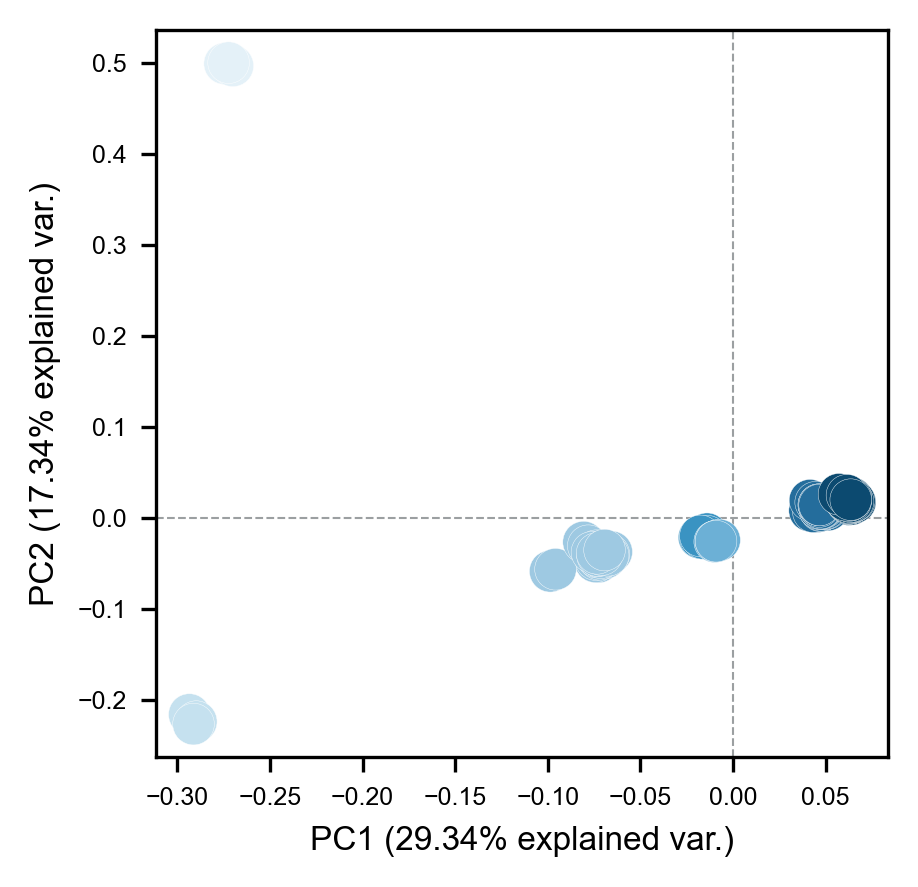

In [92]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

# === Load Arial font from scratch ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Figure size in cm (~15 cm) ===
cm = 1 / 2.54
fig_width = 8 * cm
fig_height = 8 * cm
fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)

# === Grey reference lines behind ===
ax.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)
ax.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)

# === Plotting order: others first, then RG, then SP ===
other_idx = [i for i, pop in enumerate(populations) if pop not in ['RG', 'SP']]

# Others
ax.scatter(
    eigenvectors[other_idx, 0],
    eigenvectors[other_idx, 1],
    c=[population_colors[i] for i in other_idx],
    s=100,
    edgecolor='white',   # added edge color
    linewidths=0.1,      # small visible border
    zorder=2
)



# === Axis labels ===
ax.set_xlabel(f'PC1 ({variance_explained[0]:.2f}% explained var.)',
              fontsize=8, fontproperties=arial_font)
ax.set_ylabel(f'PC2 ({variance_explained[1]:.2f}% explained var.)',
              fontsize=8, fontproperties=arial_font)

# === Tick labels ===
plt.xticks(fontsize=6) # default font 
plt.yticks(fontsize=6)

# === Save figure ===
#plt.savefig("Figure_1b_island_v1.png", format="png", dpi=300, bbox_inches='tight')
plt.show()


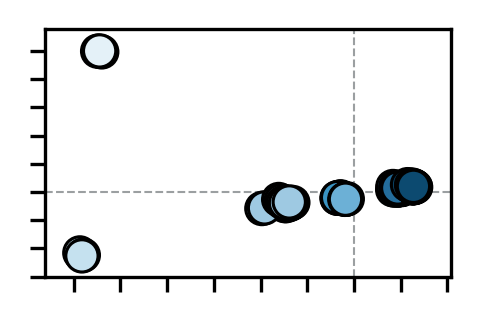

In [95]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# =========================
# Font sizes
# =========================
plt.rcParams['font.size'] = 3
plt.rcParams['axes.labelsize'] = 3
plt.rcParams['xtick.labelsize'] = 3
plt.rcParams['ytick.labelsize'] = 3


# =========================
# Exact figure size
# =========================
cm = 1 / 2.54
fig_width = 4 * cm
fig_height = 2.5 * cm

fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)


# =========================
# Grey reference lines
# =========================
ax.axhline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)
ax.axvline(0, color='#9B9FA1', linestyle='--', linewidth=0.5, zorder=1)


# =========================
# Plotting order
# =========================
other_idx = [i for i, pop in enumerate(populations) if pop not in ['RG', 'SP']]

ax.scatter(
    eigenvectors[other_idx, 0],
    eigenvectors[other_idx, 1],
    c=[population_colors[i] for i in other_idx],
    s=60,
    edgecolor='black',
    linewidths=0.75,
    zorder=2
)


# =========================
# Axis labels (empty)
# =========================
ax.set_xlabel("")
ax.set_ylabel("")


# =========================
# Tick styling
# =========================
ax.tick_params(axis='both', labelsize=3, pad=5)

# remove numbers but keep ticks
ax.set_xticklabels([])
ax.set_yticklabels([])

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontproperties(arial_font)


# =========================
# Expand axis limits
# =========================
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

xrange = xmax - xmin
yrange = ymax - ymin

ax.set_xlim(xmin - 0.05 * xrange, xmax + 0.05 * xrange)
ax.set_ylim(ymin - 0.05 * yrange, ymax + 0.05 * yrange)


# =========================
# Layout (same system)
# =========================
ax.set_position([0.12, 0.14, 0.86, 0.84])


# =========================
# Save figure
# =========================
fig.canvas.draw()

plt.savefig(
    "Figure_1b_island.svg",
    format="svg",
    dpi=300
)

plt.show()

### 2.1. Neighbour-Joining Tree

#### 2.1.1. Plink2

In [ ]:
from Bio.Phylo.TreeConstruction import DistanceMatrix, DistanceTreeConstructor
from Bio import Phylo
import matplotlib.pyplot as plt

# Load sample IDs
with open("../results/population_analyses/rPodSic1.hap1.1/tree/NJ/psiculus_inbreeding.mdist.id") as f:
    sample_ids = [line.strip().replace(" ", "_") for line in f]  # sanitize names

# Load distance matrix (skip row labels if present)
dmatrix = []
with open("../results/population_analyses/rPodSic1.hap1.1/tree/NJ/psiculus_inbreeding.mdist") as f:
    for i, line in enumerate(f):
        row = line.strip().split()
        # Remove sample label if present (first element)
        if row[0] == sample_ids[i]:
            row = row[1:]
        # Keep only the lower triangle part
        dmatrix.append([float(x) for x in row[:i+1]])

# Create Biopython DistanceMatrix
dm = DistanceMatrix(sample_ids, dmatrix)

# Build NJ tree
constructor = DistanceTreeConstructor()
nj_tree = constructor.nj(dm)

# Optional: root with outgroup
if 'PMU01' in sample_ids:
    nj_tree.root_with_outgroup('PMU01')

# Save tree as Newick
Phylo.write(nj_tree, "psiculus_inbreeding_plink_nj_tree.nwk", "newick")

# Plot tree
Phylo.draw(nj_tree)

#### 2.2.2. pypopgen3

In [ ]:
chromosomes = [f'OZ0768{i}.1' for i in range(38,58) if i!= 52 if i!= 56]
chrom_length = pd.read_csv('/scratch/antwerpen/grp/asvardal/projects/psiculus/genome/GCA_964188175.1_rPodSic1.hap1.1_genomic.fna.fai',
                           sep='\t',usecols=[0,1],names=['chrom','len'],index_col=0)
print(chrom_length.iloc[0:20])

In [ ]:
pwd_path = "/scratch/antwerpen/grp/asvardal/projects/psiculus/results/population_analyses/rPodSic1.hap1.1/tree/NJ/pairwise_differences_matrix_full.csv"
pwd_df = pd.read_csv(pwd_path, index_col=0)

# Confirm it's square and symmetric
assert pwd_df.shape[0] == pwd_df.shape[1]
assert (pwd_df.values == pwd_df.values.T).all()

samples = pwd_df.index.tolist()
pwd_matrix = pwd_df.values

In [ ]:
tree = diversity.get_nj_tree(
    pairwise_differences=pwd_matrix,
    samples=samples,
    outgroup="PMU01",
    prune_outgroup=False  
)

In [ ]:
newick_str = tree.write(format=1)[0]
with open("psiculus_inbreeding_nj_tree.nwk", "w") as f:
    f.write(newick_str)

In [ ]:
tree_path = "psiculus_inbreeding_nj_tree.nwk"
tree = Phylo.read(tree_path, "newick")
fig = plt.figure(figsize=(15, 30))  # adjust size based on number of taxa
axes = fig.add_subplot(1, 1, 1)
Phylo.draw(tree, do_show=False, axes=axes)
plt.show()


In [ ]:
tree.set_outgroup("PMU01", end_at_present=False)
pwd_window_df = pd.read_csv("/scratch/antwerpen/grp/asvardal/projects/psiculus/results/population_analyses/rPodSic1.hap1.1/tree/NJ/pairwise_differences_matrix_windows.csv", index_col=[0, 1])


In [ ]:
support_tree, support_series = diversity.get_bootstrap_support(
    real_tree=tree,
    pwd_window=pwd_window_df,
    n_bootstrap_samples=100,
    outgroup="PMU01"  # or whichever sample you want to root on
)

In [ ]:
for node in support_tree.iter_descendants():
    if not node.is_leaf():
        print(f"{node.get_name()}: {getattr(node, 'pct_support', None)}% support")

In [ ]:
newick_str = support_tree.write(format=1)[0]  # Extract from tuple if needed
output_path = "/scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/psiculus_inbreeding_nj_tree_bootstrap.nwk"

with open(output_path, "w") as f:
    f.write(newick_str)

print(f"✅ Bootstrapped Newick tree saved to: {output_path}")


In [ ]:
# Assign bootstrap support to node names
for node in support_tree.iter_descendants():
    if not node.is_leaf():
        node.name = str(int(getattr(node, "pct_support", 0)))

# Get Newick string (unpack from tuple)
newick_str = support_tree.write(format=1)[0]

# Write to file
output_path = "/scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/psiculus_inbreeding_nj_tree_bootstrap.nwk"
with open(output_path, "w") as f:
    f.write(newick_str)

print(f"✅ Bootstrapped Newick tree saved to: {output_path}")


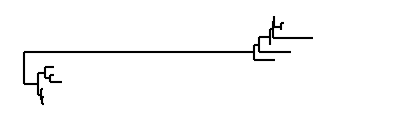

In [128]:
from Bio import Phylo
import matplotlib.pyplot as plt

# =========================
# Load tree
# =========================
tree = Phylo.read("tree.tre", "newick")

# =========================
# Root with outgroup
# =========================
tree.root_with_outgroup({"name": "PMU"})

# =========================
# Remove outgroup
# =========================
tree.prune("PMU")

# =========================
# Remove bootstrap/support labels
# =========================
for clade in tree.find_clades():
    clade.confidence = None

# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(9.53*cm, 2.55*cm))

# =========================
# Draw tree
# =========================
Phylo.draw(
    tree,
    axes=ax,
    do_show=False,
    label_func=lambda x: None
)

# round branch corners
for line in ax.get_lines():
    line.set_solid_joinstyle("round")
    line.set_solid_capstyle("round")

# remove axes
ax.set_axis_off()

# fill figure
ax.set_position([0, 0, 1, 1])
ax.margins(0)

plt.savefig("tree_branches_only.svg", bbox_inches='tight', pad_inches=0)
plt.show()

### 3.0. CV error

In [ ]:
# cross-validation error result: K = ...
cv = "../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2.cv.error"
cv_error = pd.read_csv(cv, sep=' ', header=None)
cv_error

### 3.1. Admixture plot with best K-value

In [96]:
# full path to the PED file used for Admixture
fileped = "../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2_columns.ped"
# full path to the Q file to use for plotting
fileq = "../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2.2.Q"
# read in ped file as dataframe, this file is delimited by whitespace
df_ped = pd.read_csv(fileped, sep=' ', header=None)
# read in the Q file, which is also whitespace delimited 
df_q = pd.read_csv(fileq, sep=' ', header=None)

In [97]:
# automatically generate column names based on number of columns in Q (pop1, pop2, pop3, etc.)
names = ["pop{}".format(i) for i in range(1, df_q.shape[1]+1)]
# add column names to dataframe
df_q.columns = names
# insert the sample names into the first column position
df_q.insert(0, 'Sample', df_ped[0])
# now  set the dataframe index to the sample names (e.g., the 'Sample' column)
df_q.set_index('Sample', inplace=True)

df_q['assignment'] = df_q.idxmax(axis=1)

In [98]:
pal = sns.color_palette(['#ADD8E6',"#a6daae"])
pal

[(0.6784313725490196, 0.8470588235294118, 0.9019607843137255),
 (0.6509803921568628, 0.8549019607843137, 0.6823529411764706)]

In [99]:
def sort_df_by_pops_nocat(df):
    temp_dfs = []
    for pop in sorted(df['assignment'].unique()):
        temp = df.loc[df['assignment'] == pop].sort_values(by=[pop], ascending=False)
        temp_dfs.append(temp)
    return temp_dfs

In [100]:
# A list of the subdataframes is returned:
sub_dfs = sort_df_by_pops_nocat(df_q)
df_custom_sort = pd.concat([sub_dfs[0], sub_dfs[1]])

# Remember python indices are zero-based!
# If your K value is higher or lower, make sure to include all the subdataframes in 
# the list for pd.concat() . For example with K=6, you'll need sub_dfs[0] to sub_dfs[5].

In [101]:
df_custom_sort

,pop1,pop2,assignment
Sample,,,
24VS11,0.999990,0.000010,pop1
24VS12,0.999990,0.000010,pop1
24VS13,0.999990,0.000010,pop1
24VS14,0.999990,0.000010,pop1
24VS15,0.999990,0.000010,pop1
...,...,...,...
MP07,0.054396,0.945604,pop2
MP03,0.058228,0.941772,pop2
PJ14,0.182865,0.817135,pop2


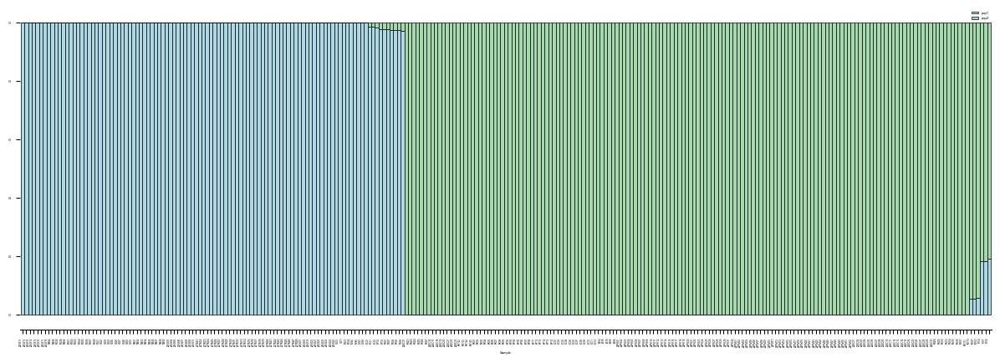

In [102]:
ax = df_custom_sort.plot.bar(stacked=True, 
                             figsize=(15,5), 
                             width=1,
                             color=pal, 
                             fontsize='x-small',
                             edgecolor='black', 
                             linewidth=0.5)
# 1) these commands eliminate the bounding box for the barplot
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
# 2) this controls rotation of the sample names along the x-axis
ax.set_xticklabels(df_custom_sort.index, rotation=90, ha='right')
# 3) this controls the placement of the legend, as well as 
# font (fontsize), spacing (labelspacing), and bounding box (frameon)
ax.legend(bbox_to_anchor=(1,1), fontsize='medium', labelspacing=0.5, frameon=False)

### 3.2. Admixture plot with all K-values

In [103]:
# File paths
ped_file = "../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2_columns.ped"
metadata_file = "../metadata/samples2025_pop.txt"
K_values = 2,3,4,7,8

# Load .ped file to get sample order
df_ped = pd.read_csv(ped_file, sep=' ', header=None)
df_ped.columns = ['FamilyID', 'SampleID'] + [f"col{i}" for i in range(2, df_ped.shape[1])]
sample_order = df_ped['SampleID'].tolist()

# Load population metadata
pop_df = pd.read_csv(metadata_file, sep='\t', header=None, names=["Sample", "Population"])

# Reassign CV* and FV* samples to RG
pop_df.loc[pop_df["Sample"].str.startswith(("CV", "FV")), "Population"] = "RG"

# Keep only samples in sample_order and preserve that order
pop_df = pop_df[pop_df["Sample"].isin(sample_order)]
pop_df = pop_df.set_index("Sample").loc[sample_order].reset_index()

# Define your custom population order
desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]
pop_df["Population"] = pd.Categorical(pop_df["Population"], categories=desired_order, ordered=True)

In [104]:
desired_order

['PL', 'TR', 'SP', 'TM', 'RG', 'VS', 'MP', 'SC', 'BJ', 'KP', 'PK', 'PM', 'PJ']

In [105]:
# Generate a color palette generator function
def get_colors(n):
    """
    Generate n visually distinct colors from a custom 8-color palette.
    """
    # Define the 8-color palette
    palette = [
    "#8A7661",   # deep muted brown, more rich
    "#D3D3D3",  # light beige  #ACA49B
    "#D9CFC0",  # soft taupe
    "#C8B39D",  # muted tan, warmer
    "#5C4532",  # warm grey-brown, more saturated
    "#EDE8DF",  # darker earthy brown, more contrast
    "#A07F66",  # cool grey, slightly warmer
    "#B69078",  # very light, slightly warmer
]
    
    # If n > palette length, interpolate by repeating colors
    if n <= len(palette):
        return palette[:n]
    else:
        # Repeat colors evenly
        idxs = np.linspace(0, len(palette) - 1, n)
        colors = [palette[int(round(i))] for i in idxs]
        return colors
    
# Function to plot a single admixture barplot
# Load Arial from the specific path
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust path if needed
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()  # set globally

# Function to plot a single admixture barplot
def plot_admixture(q_df, k, ax, colors):
    ancestry_cols = [col for col in q_df.columns if col.startswith("Ancestry_")]
    
    # Plot stacked bars
    q_df[ancestry_cols].plot(kind='bar', stacked=True, ax=ax, width=1.0,
                             linewidth=0.3, edgecolor='black', color=colors, legend=False)

    # Remove extra space around bars
    ax.margins(x=0)
    ax.set_xlim(-0.5, len(q_df)-0.5)
    ax.set_ylim(0, 1)

    # Add vertical lines between populations
    pop_change = q_df["Population"].ne(q_df["Population"].shift()).cumsum()
    boundaries = q_df.groupby(pop_change, observed=True).size().cumsum()[:-1]
    for boundary in boundaries:
        ax.axvline(boundary - 0.5, color='black', linestyle='--', linewidth=1)

    # Add population labels
    pop_sizes = q_df.groupby("Population", observed=True).size()
    pop_centers = pop_sizes.cumsum() - pop_sizes / 2
    for pop, center in pop_centers.items():
        ax.text(center, -0.1, pop, ha="center", va="top", rotation=45,
                fontsize=6, fontproperties=arial_font, transform=ax.get_xaxis_transform())

    ax.set_title(f"K={k}", fontsize=10, fontproperties=arial_font)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('', fontproperties=arial_font)
    ax.set_ylabel('', fontsize=8, fontproperties=arial_font)


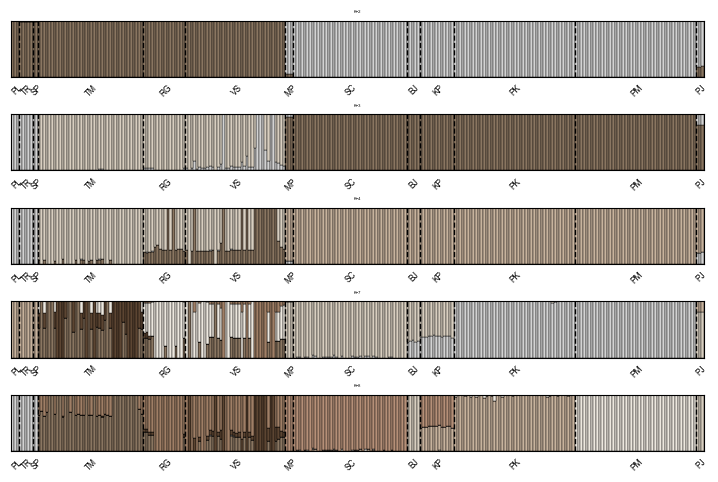

In [106]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.font_manager as fm

# # Load Arial font
# arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust path if needed
# arial_font = fm.FontProperties(fname=arial_path)
# plt.rcParams['font.family'] = arial_font.get_name()

# Convert cm to inches for figsize
cm = 1 / 2.54
fig = plt.figure(figsize=(18*cm, 12*cm))  # width x height in inches
gs = GridSpec(len(K_values), 1, figure=fig)

last_q_df = None
last_colors = None

for i, k in enumerate(K_values):
    ax = fig.add_subplot(gs[i, 0])
    q_file = f"../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2.{k}.Q"
    df_q = pd.read_csv(q_file, delim_whitespace=True, header=None)
    df_q.columns = [f"Ancestry_{j+1}" for j in range(k)]
    df_q["Sample"] = pop_df["Sample"].values
    df_q["Population"] = pop_df["Population"].values
    df_q = df_q.sort_values(by=["Population", "Sample"]).reset_index(drop=True)

    colors = get_colors(k)
    plot_admixture(df_q, k, ax, colors)

    # Save final for global legend
    last_q_df = df_q
    last_colors = colors

# Global legend using last_q_df
# ancestry_cols = [col for col in last_q_df.columns if col.startswith("Ancestry_")]
# handles = [plt.Rectangle((0, 0), 1, 1, color=last_colors[i]) for i in range(len(ancestry_cols))]
# fig.legend(handles, ancestry_cols, loc='upper right', bbox_to_anchor=(1.15, 0.9), fontsize=9)

plt.tight_layout()
#plt.savefig("Figure_1c_v1.png", format="png", dpi=300, bbox_inches='tight')
#plt.savefig("Figure_1c_v1_test.svg", format="svg", dpi=300, bbox_inches='tight')
plt.show()


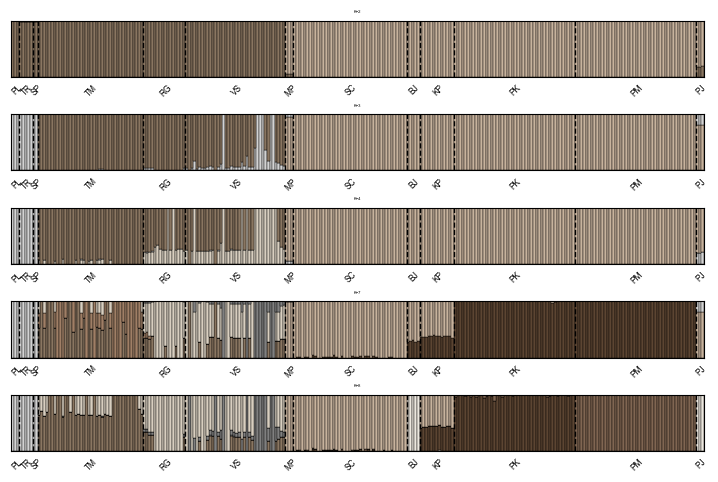

In [107]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.font_manager as fm
import pandas as pd
import numpy as np

# --- Load Arial font ---
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust path if needed
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# --- Custom color palette generator ---
def get_colors_for_components(component_colors, k):
    """
    Return a list of colors for K components based on a predefined dict.
    component_colors: dict mapping 'Ancestry_1', 'Ancestry_2', etc. to hex colors
    """
    colors = [component_colors.get(f"Ancestry_{i+1}", "#CCCCCC") for i in range(k)]
    return colors

# --- Plotting function ---
def plot_admixture(q_df, k, ax, colors):
    ancestry_cols = [col for col in q_df.columns if col.startswith("Ancestry_")]
    
    # Plot stacked bars
    q_df[ancestry_cols].plot(kind='bar', stacked=True, ax=ax, width=1.0,
                             linewidth=0.3, edgecolor='black', color=colors, legend=False)

    # Remove extra space around bars
    ax.margins(x=0)
    ax.set_xlim(-0.5, len(q_df)-0.5)
    ax.set_ylim(0, 1)

    # Add vertical lines between populations
    pop_change = q_df["Population"].ne(q_df["Population"].shift()).cumsum()
    boundaries = q_df.groupby(pop_change, observed=True).size().cumsum()[:-1]
    for boundary in boundaries:
        ax.axvline(boundary - 0.5, color='black', linestyle='--', linewidth=1)

    # Add population labels
    pop_sizes = q_df.groupby("Population", observed=True).size()
    pop_centers = pop_sizes.cumsum() - pop_sizes / 2
    for pop, center in pop_centers.items():
        ax.text(center, -0.1, pop, ha="center", va="top", rotation=45,
                fontsize=6, fontproperties=arial_font, transform=ax.get_xaxis_transform())

    ax.set_title(f"K={k}", fontsize=10, fontproperties=arial_font)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('', fontproperties=arial_font)
    ax.set_ylabel('', fontsize=8, fontproperties=arial_font)

# --- Define colors per component (can be different for each K) ---
# Example: you can manually specify which color each ancestry component should have
component_colors_by_K = {
    2: {"Ancestry_1": "#8A7661", "Ancestry_2": "#C8B39D"},
    3: {"Ancestry_1": "#C8B39D", "Ancestry_2": "#D3D3D3", "Ancestry_3": "#8A7661"},
    4: {"Ancestry_1": "#D9CFC0", "Ancestry_2": "#D3D3D3", "Ancestry_3": "#8A7661", "Ancestry_4": "#C8B39D"},
    7: {"Ancestry_1": "#8A7661", "Ancestry_2": "#5C4532", "Ancestry_3": "#C8B39D", "Ancestry_4": "#D3D3D3", "Ancestry_5": "#A07F66", "Ancestry_6": "#D9CFC0", "Ancestry_7": "grey"},
    8: {"Ancestry_1": "#8A7661", "Ancestry_2": "#D3D3D3", "Ancestry_3": "#EDE8DF", "Ancestry_4": "#5C4532", "Ancestry_5": "grey", "Ancestry_6": "#806652", "Ancestry_7": "#D9CFC0", "Ancestry_8": "#C8B39D"}
    # Add more Ks if needed
}

# --- Plotting loop ---
cm = 1 / 2.54
fig = plt.figure(figsize=(18*cm, 12*cm))  # width x height in inches
gs = GridSpec(len(K_values), 1, figure=fig)

for i, k in enumerate(K_values):
    ax = fig.add_subplot(gs[i, 0])
    q_file = f"../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2.{k}.Q"
    df_q = pd.read_csv(q_file, sep='\s+', header=None)
    df_q.columns = [f"Ancestry_{j+1}" for j in range(k)]
    df_q["Sample"] = pop_df["Sample"].values
    df_q["Population"] = pop_df["Population"].values
    df_q = df_q.sort_values(by=["Population", "Sample"]).reset_index(drop=True)
    
    # Get colors for this K
    colors = get_colors_for_components(component_colors_by_K.get(k, {}), k)
    
    plot_admixture(df_q, k, ax, colors)


plt.tight_layout()
plt.savefig("Figure_1c_v1.png", format="png", dpi=300, bbox_inches='tight')
plt.show()

In [108]:
pal = sns.color_palette(['#8A7661',"#C8B39D", "#D3D3D3", "#D9CFC0", "#5C4532", "#EDE8DF", "#A07F66", "grey", "#806652"])
pal

[(0.5411764705882353, 0.4627450980392157, 0.3803921568627451),
 (0.7843137254901961, 0.7019607843137254, 0.615686274509804),
 (0.8274509803921568, 0.8274509803921568, 0.8274509803921568),
 (0.8509803921568627, 0.8117647058823529, 0.7529411764705882),
 (0.3607843137254902, 0.27058823529411763, 0.19607843137254902),
 (0.9294117647058824, 0.9098039215686274, 0.8745098039215686),
 (0.6274509803921569, 0.4980392156862745, 0.4),
 (0.5019607843137255, 0.5019607843137255, 0.5019607843137255),
 (0.5019607843137255, 0.4, 0.3215686274509804)]

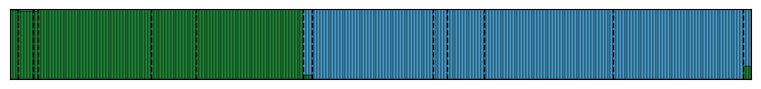

In [115]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd
import numpy as np

# =========================
# Load Arial font
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()


# =========================
# Choose K and colors
# =========================
k = 2

color1 = "#208438"   # choose first color
color2 = "#479BC9"   # choose second color

colors = [color1, color2]


# =========================
# Load admixture Q file
# =========================
q_file = f"../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2.{k}.Q"

df_q = pd.read_csv(q_file, sep='\s+', header=None)
df_q.columns = [f"Ancestry_{i+1}" for i in range(k)]

df_q["Sample"] = pop_df["Sample"].values
df_q["Population"] = pop_df["Population"].values

df_q = df_q.sort_values(by=["Population", "Sample"]).reset_index(drop=True)


# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(19.06*cm, 2*cm))


# =========================
# Plot stacked bars
# =========================
ancestry_cols = [f"Ancestry_{i+1}" for i in range(k)]

df_q[ancestry_cols].plot(
    kind='bar',
    stacked=True,
    ax=ax,
    width=1,
    linewidth=0.3,
    edgecolor='black',
    color=colors,
    legend=False
)


# =========================
# Axis formatting
# =========================
ax.set_xlim(-0.5, len(df_q)-0.5)
ax.set_ylim(0,1)

ax.set_xticks([])
ax.set_yticks([])

ax.set_xlabel("")
ax.set_ylabel("")


# =========================
# Population boundaries
# =========================
pop_change = df_q["Population"].ne(df_q["Population"].shift()).cumsum()
boundaries = df_q.groupby(pop_change).size().cumsum()[:-1]

for boundary in boundaries:
    ax.axvline(boundary-0.5, color='black', linestyle='--', linewidth=1)


# =========================
# Population labels
# =========================
# pop_sizes = df_q.groupby("Population").size()
# pop_centers = pop_sizes.cumsum() - pop_sizes/2

# for pop, center in pop_centers.items():
#     ax.text(center, -0.1, pop,
#             ha="center",
#             va="top",
#             rotation=45,
#             fontsize=6,
#             fontproperties=arial_font,
#             transform=ax.get_xaxis_transform())


# # =========================
# # Title
# # =========================
# ax.set_title(f"K={k}", fontsize=10, fontproperties=arial_font)


# =========================
# Save
# =========================
plt.tight_layout()

plt.savefig(
    "Figure_admixture_K2.svg",
    dpi=300,
)

plt.show()

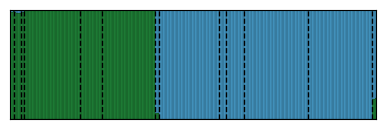

In [132]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd
import numpy as np

# =========================
# Load Arial font
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()


# =========================
# Choose K and colors
# =========================
k = 2

color1 = "#208438"   # choose first color
color2 = "#479BC9"   # choose second color

colors = [color1, color2]


# =========================
# Load admixture Q file
# =========================
q_file = f"../results/population_analyses/rPodSic1.hap1.1/admixture/psiculus_inbreeding_admixture2.{k}.Q"

df_q = pd.read_csv(q_file, sep='\s+', header=None)
df_q.columns = [f"Ancestry_{i+1}" for i in range(k)]

df_q["Sample"] = pop_df["Sample"].values
df_q["Population"] = pop_df["Population"].values

df_q = df_q.sort_values(by=["Population", "Sample"]).reset_index(drop=True)


# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(9.53*cm, 3*cm))


# =========================
# Plot stacked bars
# =========================
ancestry_cols = [f"Ancestry_{i+1}" for i in range(k)]

df_q[ancestry_cols].plot(
    kind='bar',
    stacked=True,
    ax=ax,
    width=1,
    linewidth=0.1,
    edgecolor='black',
    color=colors,
    legend=False
)


# =========================
# Axis formatting
# =========================
ax.set_xlim(-0.5, len(df_q)-0.5)
ax.set_ylim(0,1)

ax.set_xticks([])
ax.set_yticks([])

ax.set_xlabel("")
ax.set_ylabel("")


# =========================
# Population boundaries
# =========================
pop_change = df_q["Population"].ne(df_q["Population"].shift()).cumsum()
boundaries = df_q.groupby(pop_change).size().cumsum()[:-1]

for boundary in boundaries:
    ax.axvline(boundary-0.5, color='black', linestyle='--', linewidth=1)


# =========================
# Population labels
# =========================
# pop_sizes = df_q.groupby("Population").size()
# pop_centers = pop_sizes.cumsum() - pop_sizes/2

# for pop, center in pop_centers.items():
#     ax.text(center, -0.1, pop,
#             ha="center",
#             va="top",
#             rotation=45,
#             fontsize=6,
#             fontproperties=arial_font,
#             transform=ax.get_xaxis_transform())


# # =========================
# # Title
# # =========================
# ax.set_title(f"K={k}", fontsize=10, fontproperties=arial_font)


# =========================
# Save
# =========================
plt.tight_layout()

plt.savefig(
    "Figure_admixture_K2.svg",
    dpi=300,
)

plt.show()

In [ ]:
# Genome-wide output mainland vs. island
    # Weir and Cockerham mean Fst estimate: 0.086975
    # Weir and Cockerham weighted Fst estimate: 0.41471

# Genome-wide output clusters Lastovo vs. PJ
    # Weir and Cockerham mean Fst estimate: 0.26804
    # Weir and Cockerham weighted Fst estimate: 0.32685

# Genome-wide output clusters Lastovo vs. MP
    # Weir and Cockerham mean Fst estimate: 0.13984
    # Weir and Cockerham weighted Fst estimate: 0.23084

# Genome-wide output clusters MP vs. PJ
    # Weir and Cockerham mean Fst estimate: 0.19384
    # Weir and Cockerham weighted Fst estimate: 0.32304

### 4.1. Plot genome-wide Fst mainland vs. island

In [ ]:
# Read data from the output file of vcftools
Fst_data = "../results/population_analyses/rPodSic1.hap1.1/Fst/psiculus_inbreeding_mainland_island_50kb_Fst.windowed.weir.fst"
# Use pandas to read the file
Fst = pd.read_csv(Fst_data, sep='\t', skiprows=1, names=['CHROM', 'BIN_START', 'BIN_END', 'N_VARIANTS', 'WEIGHTED_FST', 'MEAN_FST'])

In [ ]:
# Add a new column for the x-axis index
Fst['chromosome'] = Fst['CHROM'].astype('category')
Fst['chromosome'] = Fst['chromosome'].cat.set_categories(sorted(Fst['chromosome'].unique()), ordered=True)
Fst = Fst.sort_values(['chromosome', 'BIN_START'])
Fst['ind'] = range(len(Fst))

# Group data by chromosome
Fst_grouped = Fst.groupby('chromosome', observed=True)

# Calculate the 99.5th percentile for the FST values
percentile_99_5 = Fst['MEAN_FST'].quantile(0.995)
print(percentile_99_5)

# Compute the genome-wide average weighted FST
weighted_fst_avg = Fst['WEIGHTED_FST'].mean()
print(weighted_fst_avg)

# Compute the genome-wide average mean FST
mean_fst_avg = Fst['MEAN_FST'].mean()
print(mean_fst_avg)

In [ ]:
# Create the Manhattan plot
fig = plt.figure(figsize=(14, 8))  # Set figure size
ax = fig.add_subplot(111)
colors = ['grey', 'black']  # Define alternating colors
x_labels = []
x_labels_pos = []

for num, (name, group) in enumerate(Fst_grouped):
    group.plot(kind='scatter', x='ind', y='MEAN_FST', color=colors[num % len(colors)], ax=ax, s=10)
    x_labels.append(name)
    x_labels_pos.append((group['ind'].iloc[-1] + group['ind'].iloc[0]) / 2)

# Add 99.5th percentile threshold line
ax.axhline(y=percentile_99_5, color='red', linestyle='-', label='99.5th Percentile')
ax.axhline(y=weighted_fst_avg, color='blue', linestyle='--', label='Weighted FST Average')
ax.axhline(y=mean_fst_avg, color='green', linestyle='--', label='Mean FST Average')
# Set x-axis labels
ax.set_xticks(x_labels_pos)
ax.set_xticklabels(x_labels, rotation=45, ha='right')

# Set axis limits
ax.set_xlim([0, len(Fst)])
ax.set_ylim([Fst['MEAN_FST'].min(), Fst['MEAN_FST'].max()])

# Add labels and title
ax.set_xlabel('Chromosome')
ax.set_ylabel('Mean FST')
ax.set_title('Fst-scan')

# Show the plot
plt.legend()
plt.tight_layout()
plt.show()

### 5.1. ROHs - ROHan v1

#### 5.1.1. ROHan summary file per individual

In [ ]:
# set your folder path
rohan_path = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan/'
# list of files
files = [f for f in os.listdir(rohan_path) if f.endswith("summary.txt")]

In [ ]:
# patterns for theta lines with three values
theta_patterns = {
    "theta_outside_ROH": r"Genome-wide theta outside ROH:\s+([\d.eE+-]+)\s+([\d.eE+-]+)\s+([\d.eE+-]+)",
    "theta_inside_ROH": r"Genome-wide theta inc\. ROH:\s+([\d.eE+-]+)\s+([\d.eE+-]+)\s+([\d.eE+-]+)"
}

# patterns for other lines: (main value regex, CI regex)
metric_patterns = {
    "segments_unclassified": r"Segments unclassified\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_unclassified_percent": r"Segments unclassified \(%\):\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_in_roh": r"Segments in ROH\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_in_roh_percent": r"Segments in ROH\(%\)\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_non_roh": r"Segments in non-ROH\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_non_roh_percent": r"Segments in non-ROH \(%\)\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "avg_roh_length": r"Avg\. length of ROH\s*:\s*([\d.eE+-]+)\s*\(\s*([\d.eE+-]+)\s*,\s*([\d.eE+-]+)\s*\)"
}

rohan_data = []

for file in files:
    file_path = os.path.join(rohan_path, file)
    with open(file_path, 'r') as f:
        text = f.read()

    data = {"individual": file.replace(".summary.txt", "")}

    # Handle theta values with three fields
    for key, pattern in theta_patterns.items():
        match = re.search(pattern, text)
        if match:
            data[f"{key}_mid"] = float(match.group(1))
            data[f"{key}_min"] = float(match.group(2))
            data[f"{key}_max"] = float(match.group(3))
        else:
            data[f"{key}_mid"] = None
            data[f"{key}_min"] = None
            data[f"{key}_max"] = None

    # Handle other fields
    for key, pattern in metric_patterns.items():
        match = re.search(pattern, text)
        if match:
            data[f"{key}_mid"] = float(match.group(1))
            data[f"{key}_min"] = float(match.group(2))
            data[f"{key}_max"] = float(match.group(3))
        else:
            data[f"{key}_mid"] = data[f"{key}_min"] = data[f"{key}_max"] = None

    rohan_data.append(data)

# Create DataFrame and export
rohan_df = pd.DataFrame(rohan_data)
#rohan_df.to_excel("ROHan_summary.xlsx", index=False)
rohan_df.head()

#### 5.1.2. %ROH plot

In [ ]:
# Extract population code from Individual_ID
rohan_df['population'] = rohan_df['individual'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))

# Step 1: collapse "24XX" into "XX"
rohan_df['population'] = rohan_df['population'].str.replace(r'^24', '', regex=True)

# Step 2: merge CV and FV into RG
rohan_df['population'] = rohan_df['population'].replace({'CV': 'RG', 'FV': 'RG'})
rohan_df.head()

# Step 3: remove BJ18 and RG08
#rohan_df = rohan_df[~rohan_df['individual'].isin(['BJ18', 'RG08'])]
rohan_df.head()

In [ ]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust if this is where your Arial is
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Make the plot ===
cm = 1 / 2.54  # cm to inches
plt.figure(figsize=(15*cm, 10*cm))  


# Strip plot first (dots in the background)
import matplotlib.ticker as mticker

plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()

plt.grid(
    which='minor',
    axis='y', # minor grid lines
    linestyle='--', 
    linewidth=0.3, 
    color='grey', 
    alpha=0.5
)
ax = sns.stripplot(
    data=rohan_df,
    x='population',
    y='segments_in_roh_percent_mid',
    palette=color_map,
    jitter=True,
    size=6,
    order=desired_order,
    alpha=0.3,  # make dots slightly transparent
    zorder=1     # put dots behind lines
)
ax.xaxis.set_tick_params(which='minor', bottom=False)

# Calculate median per population
stats = rohan_df.groupby('population')['segments_in_roh_percent_mid'].median().reindex(desired_order)

# Add median lines with same color as population
for i, pop in enumerate(desired_order):
    median = stats.loc[pop]
    color = color_map[pop]  # get color for this population
    
    ax.hlines(
        y=median,
        xmin=i - 0.3,
        xmax=i + 0.3,
        color=color,
        linewidth=3,
        zorder=2  # above dots
    )

ax.set_ylabel("% genome in ROHs", fontsize = 8, fontproperties=arial_font)
ax.tick_params(axis='x', rotation=45)
ax.set_xlabel("")
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12], labels=["", "","","","","","","","","","","",""], rotation=0, fontsize = 6)
plt.yticks(fontsize = 6)

plt.tight_layout()
plt.savefig("Figure_3b_v1.svg", format="svg", dpi=300)
plt.show()


#### 5.1.3. ROH length plot

In [ ]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust if this is where your Arial is
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

pop_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Make the plot ===
cm = 1 / 2.54  # cm to inches
plt.figure(figsize=(15*cm, 10*cm))  


# Strip plot first (dots in the background)
import matplotlib.ticker as mticker

plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()

plt.grid(
    which='minor',
    axis='y', # minor grid lines
    linestyle='--', 
    linewidth=0.3, 
    color='grey', 
    alpha=0.5
)
# Convert bp → Mb
rohan_df['avg_roh_length_Mb'] = rohan_df['avg_roh_length_mid'] / 1e6

ax = sns.stripplot(
    data=rohan_df,
    x='population',
    y='avg_roh_length_Mb',
    palette=color_map,
    jitter=True,
    size=6,
    order=desired_order,
    alpha=0.3,  # make dots slightly transparent
    zorder=1     # put dots behind lines
)
ax.xaxis.set_tick_params(which='minor', bottom=False)

# Calculate median per population in Mb
stats = rohan_df.groupby('population')['avg_roh_length_Mb'].median().reindex(pop_order)

# Add median lines with same color as population
for i, pop in enumerate(pop_order):
    median = stats.loc[pop]
    color = color_map[pop]  # get color for this population
    
    ax.hlines(
        y=median,
        xmin=i - 0.3,
        xmax=i + 0.3,
        color=color,
        linewidth=3,
        zorder=2  # above dots
    )

ax.set_ylabel("ROH length (Mb)", fontsize = 8, fontproperties=arial_font)
ax.tick_params(axis='x', rotation=45)
ax.set_xlabel("")
plt.yticks(fontsize = 6)

plt.tight_layout()
plt.show()
#plt.savefig("Figure_3b_v1.svg", format="svg", dpi=300)
plt.show()


In [ ]:
# Read the data from file
rohan_BJ18 = pd.read_table("../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan/BJ18.hEst.gz", compression='gzip', header=0)

# Get unique chromosomes
chromosomes = rohan_BJ18['#CHROM'].unique()

# Set up subplots (one row per chromosome)
fig, axes = plt.subplots(len(chromosomes), 1, figsize=(10, len(chromosomes) * 3), sharex=True)

# If only one subplot, 'axes' is not an array, so we ensure it's iterable
if len(chromosomes) == 1:
    axes = [axes]

# Loop through each chromosome and plot in its respective subplot
for i, chrom in enumerate(chromosomes):
    chrom_data = rohan_BJ18[rohan_BJ18['#CHROM'] == chrom]
    
    # Plotting in the current subplot (axes[i])
    axes[i].plot(chrom_data['BEGIN'], chrom_data['h'], color='black', linewidth=1)
    axes[i].axhline(y=0.00293692, color='darkgrey', linestyle='--')
    
    # Set labels and title for each subplot
    axes[i].set_ylabel('h')
    axes[i].set_title(f'Chromosome {chrom}')
    axes[i].set_ylim(-0.00, 0.030)
    
    # Tick labels for the x-axis (optional, might overlap with multiple plots)
    tick_labels = [f'{i * 100} Mb' for i in range(len(chrom_data['BEGIN'][::100]))]
    axes[i].set_xticks(chrom_data['BEGIN'][::100])
    axes[i].set_xticklabels(tick_labels, rotation=45)

# Set the x-axis label for the last subplot
axes[-1].set_xlabel('Genomic Position (Mb)')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


In [ ]:
# Read the data from file
rohan_RG08 = pd.read_table("../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan/RG08.hEst.gz", compression='gzip', header=0)

# Get unique chromosomes
chromosomes = rohan_RG08['#CHROM'].unique()

# Set up subplots (one row per chromosome)
fig, axes = plt.subplots(len(chromosomes), 1, figsize=(10, len(chromosomes) * 3), sharex=True)

# If only one subplot, 'axes' is not an array, so we ensure it's iterable
if len(chromosomes) == 1:
    axes = [axes]

# Loop through each chromosome and plot in its respective subplot
for i, chrom in enumerate(chromosomes):
    chrom_data = rohan_RG08[rohan_RG08['#CHROM'] == chrom]
    
    # Plotting in the current subplot (axes[i])
    axes[i].plot(chrom_data['BEGIN'], chrom_data['h'], color='black', linewidth=1)
    axes[i].axhline(y=0.00293692, color='darkgrey', linestyle='--')
    
    # Set labels and title for each subplot
    axes[i].set_ylabel('h')
    axes[i].set_title(f'Chromosome {chrom}')
    axes[i].set_ylim(-0.00, 0.030)
    
    # Tick labels for the x-axis (optional, might overlap with multiple plots)
    tick_labels = [f'{i * 100} Mb' for i in range(len(chrom_data['BEGIN'][::100]))]
    axes[i].set_xticks(chrom_data['BEGIN'][::100])
    axes[i].set_xticklabels(tick_labels, rotation=45)

# Set the x-axis label for the last subplot
axes[-1].set_xlabel('Genomic Position (Mb)')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


### 5.2. Heterozygosity - ROHan v1


#### 5.2.1. Heterozygosity summary per individual

In [ ]:
# folder path
input_directory = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan/'

In [ ]:
# create a list to store all individuals' data
hEst_data = []

# loop through all .hEst.gz files in the specified directory
for input_file in os.listdir(input_directory):
    if input_file.endswith(".hEst.gz"):
        # Full path to the input file
        input_file_path = os.path.join(input_directory, input_file)
        
        # Extract the base ID (e.g., "VS12" from "VS12.hEst.gz")
        base_id = input_file.split('.')[0]
        
        # Open the gzipped file and read the data
        with gzip.open(input_file_path, 'rt') as f:
            # Read the data into a pandas DataFrame
            df = pd.read_csv(f, sep="\t", comment='#', header=None)
        
        # Extract the 5th column (index 4) for 'h' values
        h_values = df.iloc[:, 4].dropna()  # Access the 5th column directly by index
        
        # Calculate total mean and standard error (SE)
        total_mean_h = np.mean(h_values)
        total_se_h = np.std(h_values, ddof=1) / np.sqrt(len(h_values))

        # Append the results to the list
        hEst_data.append([base_id, total_mean_h, total_se_h])

# Create a DataFrame with the summary data
hEst_df = pd.DataFrame(hEst_data, columns=["Individual_ID", "Mean_h", "SE_h"])

# Save the DataFrame to an Excel file
#hEst_df.to_excel("hEst_summary.xlsx", index=False)

# Display the first few rows of the summary
hEst_df.head()
    # outliers in ROH do not form problem here!

#### 5.2.2. Heterozygosity plot populations

In [ ]:
# First, create Population column, extracting letters from Individual_ID
hEst_df['Population'] = hEst_df['Individual_ID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
# Reassign CV and FV to RG
hEst_df.loc[hEst_df['Population'].isin(['CV', 'FV']), 'Population'] = 'RG'
# Define custom population order
pop_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

In [ ]:
# Plot boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=hEst_df, x='Population', y='Mean_h', order=pop_order)
plt.title('Heterozygosity')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### 5.2.3. Heterozygosity statistics

In [ ]:
### See also R

# Extract population code from Individual_ID
hEst_df['Population'] = hEst_df['Individual_ID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))

# Step 1: collapse "24XX" into "XX"
hEst_df['Population'] = hEst_df['Population'].str.replace(r'^24', '', regex=True)

# Step 2: merge CV and FV into RG
hEst_df['Population'] = hEst_df['Population'].replace({'CV': 'RG', 'FV': 'RG'})

In [ ]:
mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

hEst_df['Region'] = hEst_df['Population'].apply(assign_region)
hEst_df.to_excel("hEst_summary.xlsx", index=False)

In [ ]:
import statsmodels.formula.api as smf
# Fit a mixed-effects model: Region as fixed effect, Population as random effect
model = smf.mixedlm("Mean_h ~ Region", hEst_df, groups=hEst_df["Population"])
result = model.fit()

print(result.summary())

In [ ]:
model = smf.ols("Mean_h ~ Region", data=hEst_df).fit()
print(model.summary())

#### 5.2.4. Heterozygosity plot type

In [ ]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust if this is where your Arial is
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Define colors ===
palette = {"Mainland": "#009900", "Island": "#0066CC"}

# === Make the plot ===
cm = 1 / 2.54  # cm to inches
plt.figure(figsize=(10*cm, 10*cm))  

ax = sns.boxplot(
    data=hEst_df,
    x="Region",
    y="Mean_h",
    hue="Region",
    palette=palette,
    linewidth=1,       # box edge width
    fliersize=3,         # outlier size
    flierprops={"marker": "o", "markerfacecolor": "black", "markersize": 4},
    medianprops={"color": "black", "linewidth": 2},  # median line
    #boxprops={"facecolor":"none", "edgecolor":"black"}  # make boxes transparent or change edge
)

# Add dashed grey grid
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

plt.ylabel("Heterozygosity", fontsize = 8, fontproperties=arial_font)
plt.xlabel("")
plt.xticks(ticks=[0,1], labels=["", ""], rotation=0, fontsize = 6)
plt.yticks(fontsize = 6)
# --- Add statistical annotation ---
p_value = 0.0  # MixedLM p-value for Region effect is <0.0001, show as 0.0 or "<0.001"
x1, x2 = 0, 1  # positions of the boxes

# Compute max y value (top of plot) and offset
y_max = hEst_df['Mean_h'].max()
y = y_max + 0.0005  # start just above max value
h = 0.00005           # height of vertical ticks
line_width = 0.5     # shorter side lines

# Draw short side lines
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c='black')

# Add p-value text slightly above the line
ax.text((x1+x2)*0.5, y+h+0.0001, "p < 0.001", ha='center', va='bottom', color='black', fontsize=6, fontproperties=arial_font)


plt.tight_layout()
#plt.savefig("Figure_3a_v1.svg", format="svg", dpi=300)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Figure size in cm (~10x10 cm) ===
cm = 1 / 2.54
plt.figure(figsize=(10*cm, 10*cm))

# --- Grid setup ---
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()
plt.grid(
    which='minor',
    axis='y',   # horizontal minor lines only
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)

# --- Strip plot (dots in background) ---
ax = sns.stripplot(
    data=hEst_df,
    x='Region',
    y='Mean_h',
    hue='Region',
    palette=palette,
    jitter=True,
    size=6,
    alpha=0.3,  # slightly transparent dots
    zorder=1,    # behind median lines
    dodge=False
)
ax.xaxis.set_tick_params(which='minor', bottom=False)  # remove minor x ticks

# --- Add median lines per Region ---
stats = hEst_df.groupby('Region')['Mean_h'].median().reindex(palette.keys())

for i, region in enumerate(stats.index):
    median = stats.loc[region]
    color = palette[region]
    
    ax.hlines(
        y=median,
        xmin=i - 0.2,
        xmax=i + 0.2,
        color=color,
        linewidth=3,
        zorder=2  # above dots
    )

# --- Axes labels and ticks ---
ax.set_ylabel("Heterozygosity", fontsize=8, fontproperties=arial_font)
ax.set_xlabel("")
ax.tick_params(axis='x', rotation=45)
plt.xticks(ticks=range(len(stats.index)), labels=[""]*len(stats.index), fontsize=6)
plt.yticks(fontsize=6)

# --- Optional: Statistical annotation ---
x1, x2 = 0, 1
y_max = hEst_df['Mean_h'].max()
y = y_max + 0.0005  # start just above max value
h = 0.00005          # height of short vertical ticks
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=0.5, c='black')
ax.text((x1+x2)*0.5, y+h+0.0001, "p < 0.001", ha='center', va='bottom', color='black', fontsize=6, fontproperties=arial_font)

plt.tight_layout()
plt.savefig("Figure_3a_v1.svg", format="svg", dpi=300)
plt.show()


#### 5.2.5. Heterozygosity vs. %ROH

In [ ]:
merged = pd.merge(
    rohan_df,
    hEst_df,
    left_on="individual",
    right_on="Individual_ID",
)
print(merged)
#merged = merged[~merged['individual'].isin(['BJ18', 'RG08', 'BJ04', 'BJ06', 'BJ09', 'BJ16'])]

In [ ]:
plt.figure(figsize=(6,6))
sns.scatterplot(
    data=merged,
    x="segments_in_roh_percent_mid", # %genome in ROH, ! outliers removed
    y="Mean_h" # h
)
plt.xlabel("% genome in ROH (ROHan)")
plt.ylabel("Mean h")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged["Mean_h"].corr(merged["segments_in_roh_percent_mid"]) # outliers removed
print(f"Correlation between Mean h and ROHan %ROH: {corr:.3f}")

### 5.3. ROHs - ROHan v2

#### 5.3.1. ROHan summary file per individual

In [ ]:
# set your folder path
rohan_path2 = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan_v2/'
# list of files
files2 = [f for f in os.listdir(rohan_path2) if f.endswith("summary.txt")]

In [ ]:
# patterns for theta lines with three values
theta_patterns = {
    "theta_outside_ROH": r"Genome-wide theta outside ROH:\s+([\d.eE+-]+)\s+([\d.eE+-]+)\s+([\d.eE+-]+)",
    "theta_inside_ROH": r"Genome-wide theta inc\. ROH:\s+([\d.eE+-]+)\s+([\d.eE+-]+)\s+([\d.eE+-]+)"
}

# patterns for other lines: (main value regex, CI regex)
metric_patterns = {
    "segments_unclassified": r"Segments unclassified\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_unclassified_percent": r"Segments unclassified \(%\):\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_in_roh": r"Segments in ROH\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_in_roh_percent": r"Segments in ROH\(%\)\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_non_roh": r"Segments in non-ROH\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "segments_non_roh_percent": r"Segments in non-ROH \(%\)\s*:\s*([\d.eE+-]+)\s*\(([\d.eE+-]+),\s*([\d.eE+-]+)\)",
    "avg_roh_length": r"Avg\. length of ROH\s*:\s*([\d.eE+-]+)\s*\(\s*([\d.eE+-]+)\s*,\s*([\d.eE+-]+)\s*\)"
}

rohan_data = []

for file in files2:
    file_path = os.path.join(rohan_path2, file)
    with open(file_path, 'r') as f:
        text = f.read()

    data = {"individual": file.replace(".summary.txt", "")}

    # Handle theta values with three fields
    for key, pattern in theta_patterns.items():
        match = re.search(pattern, text)
        if match:
            data[f"{key}_mid"] = float(match.group(1))
            data[f"{key}_min"] = float(match.group(2))
            data[f"{key}_max"] = float(match.group(3))
        else:
            data[f"{key}_mid"] = None
            data[f"{key}_min"] = None
            data[f"{key}_max"] = None

    # Handle other fields
    for key, pattern in metric_patterns.items():
        match = re.search(pattern, text)
        if match:
            data[f"{key}_mid"] = float(match.group(1))
            data[f"{key}_min"] = float(match.group(2))
            data[f"{key}_max"] = float(match.group(3))
        else:
            data[f"{key}_mid"] = data[f"{key}_min"] = data[f"{key}_max"] = None

    rohan_data.append(data)

# Create DataFrame and export
rohan_df2 = pd.DataFrame(rohan_data)
rohan_df2.to_excel("ROHan_summary_v2.xlsx", index=False)
rohan_df2.head()

#### 5.3.2. %ROH plot

In [ ]:
# Extract population code from Individual_ID
rohan_df2['population'] = rohan_df2['individual'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))

# Step 1: collapse "24XX" into "XX"
rohan_df2['population'] = rohan_df2['population'].str.replace(r'^24', '', regex=True)

# Step 2: merge CV and FV into RG
rohan_df2['population'] = rohan_df2['population'].replace({'CV': 'RG', 'FV': 'RG'})
rohan_df2.head()

# Step 3: remove BJ18 and RG08
rohan_df2 = rohan_df2[~rohan_df2['individual'].isin(['PMU01'])]
rohan_df2.head()

In [ ]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust if this is where your Arial is
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Make the plot ===
cm = 1 / 2.54  # cm to inches
plt.figure(figsize=(15*cm, 10*cm))  


# Strip plot first (dots in the background)
import matplotlib.ticker as mticker

plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()

plt.grid(
    which='minor',
    axis='y', # minor grid lines
    linestyle='--', 
    linewidth=0.3, 
    color='grey', 
    alpha=0.5
)
ax = sns.stripplot(
    data=rohan_df2,
    x='population',
    y='segments_in_roh_percent_mid',
    palette=color_map,
    jitter=True,
    size=6,
    order=desired_order,
    alpha=0.3,  # make dots slightly transparent
    zorder=1     # put dots behind lines
)
ax.xaxis.set_tick_params(which='minor', bottom=False)

# Calculate median per population
stats = rohan_df2.groupby('population')['segments_in_roh_percent_mid'].median().reindex(desired_order)

# Add median lines with same color as population
for i, pop in enumerate(desired_order):
    median = stats.loc[pop]
    color = color_map[pop]  # get color for this population
    
    ax.hlines(
        y=median,
        xmin=i - 0.3,
        xmax=i + 0.3,
        color=color,
        linewidth=3,
        zorder=2  # above dots
    )

ax.set_ylabel("% genome in ROHs", fontsize = 8, fontproperties=arial_font)
ax.tick_params(axis='x', rotation=45)
ax.set_xlabel("")
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12], labels=["", "","","","","","","","","","","",""], rotation=0, fontsize = 6)
plt.yticks(fontsize = 6)

plt.tight_layout()
#plt.savefig("Figure_3b_v1.svg", format="svg", dpi=300)
plt.show()


### 5.4. Heterozygosity - ROHan v2

#### 5.4.1. Heterozygosity summary per individual

In [ ]:
# folder path
input_directory = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan_v2/'

In [ ]:
# create a list to store all individuals' data
hEst_data = []

# loop through all .hEst.gz files in the specified directory
for input_file in os.listdir(input_directory):
    if input_file.endswith(".hEst.gz"):
        # Full path to the input file
        input_file_path = os.path.join(input_directory, input_file)
        
        # Extract the base ID (e.g., "VS12" from "VS12.hEst.gz")
        base_id = input_file.split('.')[0]
        
        # open with pysam (works for BGZF)
        with pysam.BGZFile(input_file_path, 'r') as f:
            # decode bytes to text, then read with pandas
            df = pd.read_csv(f, sep="\t", comment='#', header=None)
        
        # Extract the 5th column (index 4) for 'h' values
        h_values = df.iloc[:, 4].dropna()  # Access the 5th column directly by index
        
        # Calculate total mean and standard error (SE)
        total_mean_h = np.mean(h_values)
        total_se_h = np.std(h_values, ddof=1) / np.sqrt(len(h_values))

        # Append the results to the list
        hEst_data.append([base_id, total_mean_h, total_se_h])

# Create a DataFrame with the summary data
hEst_df2 = pd.DataFrame(hEst_data, columns=["Individual_ID", "Mean_h", "SE_h"])

# Save the DataFrame to an Excel file
#hEst_df2.to_excel("hEst_summary2.xlsx", index=False)

# Display the first few rows of the summary
hEst_df2.head()
    # outliers in ROH do not form problem here!

In [ ]:
import os
import pandas as pd
import numpy as np
import pysam

# List of individuals to skip
skip_individuals = ["PMU01"]

# Create a list to store all individuals' data
hEst_data = []

# Loop through all .hEst.gz files in the specified directory
for input_file in os.listdir(input_directory):
    if input_file.endswith(".hEst.gz"):
        base_id = input_file.split('.')[0]
        
        # Skip if in the skip list
        if base_id in skip_individuals:
            print(f"Skipping {base_id} because outgroup")
            continue
        
        input_file_path = os.path.join(input_directory, input_file)
        
        try:
            # Open with pysam (works for BGZF)
            with pysam.BGZFile(input_file_path, 'r') as f:
                df = pd.read_csv(f, sep="\t", comment='#', header=None)
            
            # Extract the 5th column (index 4) for 'h' values
            h_values = df.iloc[:, 4].dropna()
            
            # Calculate mean and standard error
            total_mean_h = np.mean(h_values)
            total_se_h = np.std(h_values, ddof=1) / np.sqrt(len(h_values))
            
            # Calculate % of times h < 0.003
            percent_below_0_003 = 100 * np.sum(h_values < 0.003) / len(h_values)
            
            # Append the results to the list
            hEst_data.append([base_id, total_mean_h, total_se_h, percent_below_0_003])
        
        except Exception as e:
            print(f"Error reading {base_id}: {e}")
            continue

# Create a DataFrame with the summary data
hEst_df3 = pd.DataFrame(hEst_data, columns=["Individual_ID", "Mean_h", "SE_h", "%_h_below_0.003"])

# Display the first few rows
hEst_df3.head()


#### 5.4.2. Heterozygosity vs. %ROH: %h below 0.003

In [ ]:
merged2 = pd.merge(
    rohan_df2,
    hEst_df3,
    left_on="individual",
    right_on="Individual_ID",
    how="inner"
)
print(merged2)

In [ ]:
plt.figure(figsize=(6,6))


sns.scatterplot(
    data=merged2,
    x="segments_in_roh_percent_mid", # %genome in ROH, ! outliers removed
    y="%_h_below_0.003" # h
)


plt.xlabel("% genome in ROH (bcftools)")
plt.ylabel("%_h_below_0.003 (ROHan)")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged2["segments_in_roh_percent_mid"].corr(merged2["%_h_below_0.003"]) # okay correlation
print(f"Correlation between ROHan %ROH and ROHan h value below 0.003: {corr:.3f}")

In [ ]:
plt.figure(figsize=(6,6))


sns.scatterplot(
    data=merged2,
    x="segments_in_roh_percent_mid", # %genome in ROH, ! outliers removed
    y="Mean_h" # h
)


plt.xlabel("% genome in ROH (ROHan)")
plt.ylabel("Mean_h (ROHan)")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged2["segments_in_roh_percent_mid"].corr(merged2["Mean_h"]) # okay correlation
print(f"Correlation between ROHan %ROH and ROHan h value below 0.003: {corr:.3f}")

#### 5.4.3. Heterozygosity ROHan vs. bcftools ROH

In [ ]:
merged = pd.merge(
    roh_per_ind,
    hEst_df3,
    left_on="Sample",
    right_on="Individual_ID",
    how="inner"
)
print(merged)

In [ ]:
plt.figure(figsize=(6,6))

# Add a regression line
sns.regplot(
    data=merged,
    x="percent_genome_in_roh",
    y="%_h_below_0.003",
    scatter=False,   # don't plot points again
    color='red'
)
sns.scatterplot(
    data=merged,
    x="percent_genome_in_roh", # %genome in ROH, ! outliers removed
    y="%_h_below_0.003" # h
)

# Add y=x line
max_val = max(merged["percent_genome_in_roh"].max(), merged["%_h_below_0.003"].max())
plt.plot([0, max_val], [0, max_val], color='gray', linestyle='--')

plt.xlabel("% genome in ROH (bcftools)")
plt.ylabel("%_h_below_0.003 (ROHan)")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged["percent_genome_in_roh"].corr(merged["%_h_below_0.003"]) # very good!
print(f"Correlation between bcftools and ROHan %_h_below_0.003: {corr:.3f}")

In [ ]:
corr = merged["percent_genome_in_roh"].corr(merged["Mean_h"]) # very good!
print(f"Correlation between bcftools and ROHan Mean_h: {corr:.3f}")

#### 5.4.4. Example individual VS07

In [ ]:
vs07_data = merged[merged["Individual_ID"] == "VS07"]
print(vs07_data) # rohan is 98% of genome in ROH! == huge mismatch!

In [ ]:
# Read the data from file
rohan_VS07 = pd.read_table("../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan_v2/VS07.hEst.gz", compression='gzip', header=0)

# Get unique chromosomes
chromosomes = rohan_VS07['#CHROM'].unique()

# Set up subplots (one row per chromosome)
fig, axes = plt.subplots(len(chromosomes), 1, figsize=(10, len(chromosomes) * 3), sharex=True)

# If only one subplot, 'axes' is not an array, so we ensure it's iterable
if len(chromosomes) == 1:
    axes = [axes]

# Loop through each chromosome and plot in its respective subplot
for i, chrom in enumerate(chromosomes):
    chrom_data = rohan_VS07[rohan_VS07['#CHROM'] == chrom]
    
    # Plotting in the current subplot (axes[i])
    axes[i].plot(chrom_data['BEGIN'], chrom_data['h'], color='black', linewidth=1)
    axes[i].axhline(y=0.00293692, color='darkgrey', linestyle='--')
    
    # Set labels and title for each subplot
    axes[i].set_ylabel('h')
    axes[i].set_title(f'Chromosome {chrom}')
    axes[i].set_ylim(-0.00, 0.030)
    
    # Tick labels for the x-axis (optional, might overlap with multiple plots)
    tick_labels = [f'{i * 100} Mb' for i in range(len(chrom_data['BEGIN'][::100]))]
    axes[i].set_xticks(chrom_data['BEGIN'][::100])
    axes[i].set_xticklabels(tick_labels, rotation=45)

# Set the x-axis label for the last subplot
axes[-1].set_xlabel('Genomic Position (Mb)')

# Adjust layout and show plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the data
rohan_VS07 = pd.read_table(
    "../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/rohan_v2/VS07.hEst.gz",
    compression='gzip'
)

# Sort chromosomes naturally if needed (assuming names like "chr1", "chr2", ..., or "1", "2", ...)
def natural_key(chrom):
    try:
        return int(chrom.replace("chr", ""))
    except ValueError:
        return chrom

chromosomes = sorted(rohan_VS07['#CHROM'].unique(), key=natural_key)

# Prepare concatenated coordinate
offset = 0
concat_positions = []
chrom_boundaries = []

for chrom in chromosomes:
    chrom_data = rohan_VS07[rohan_VS07['#CHROM'] == chrom].copy()
    chrom_data['concat_pos'] = chrom_data['BEGIN'] + offset
    concat_positions.append(chrom_data)
    chrom_boundaries.append((chrom, chrom_data['concat_pos'].iloc[-1]))
    offset = chrom_data['concat_pos'].iloc[-1] + 1_000_000  # add 1 Mb gap between chromosomes

# Combine all chromosomes
df_concat = pd.concat(concat_positions, ignore_index=True)

# Plot
plt.figure(figsize=(14,5))
plt.plot(df_concat['concat_pos']/1e6, df_concat['h'], color='black', lw=0.8)
#plt.axhline(y=0.00293692, color='darkgrey', linestyle='--', label='Reference h')

# Mark chromosome boundaries
#for chrom, boundary in chrom_boundaries[:-1]:
    #plt.axvline(x=boundary/1e6, color='lightgrey', linestyle=':')
    #plt.text(boundary/1e6, 0.029, chrom, ha='right', va='bottom', fontsize=8, rotation=90)

plt.xlabel('Concatenated genomic position (Mb)')
plt.ylabel('Heterozygosity (h)')
plt.title('Genome-wide heterozygosity (concatenated chromosomes) – VS07')
plt.ylim(0, 0.03)
plt.legend()
plt.tight_layout()
plt.show()


#### 5.4.5. Heterozygosity plot type

In [ ]:
### See also R
# Extract population code from Individual_ID
hEst_df2['Population'] = hEst_df2['Individual_ID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))

# Step 1: collapse "24XX" into "XX"
hEst_df2['Population'] = hEst_df2['Population'].str.replace(r'^24', '', regex=True)

# Step 2: merge CV and FV into RG
hEst_df2['Population'] = hEst_df2['Population'].replace({'CV': 'RG', 'FV': 'RG'})
hEst_df2 = hEst_df2[~hEst_df2['Individual_ID'].isin(['PMU01'])]

In [ ]:
mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

hEst_df2['Region'] = hEst_df2['Population'].apply(assign_region)
hEst_df2.to_excel("hEst_summary2.xlsx", index=False)

In [ ]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"  # adjust if this is where your Arial is
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Define colors ===
palette = {"Mainland": "#009900", "Island": "#0066CC"}

# === Make the plot ===
cm = 1 / 2.54  # cm to inches
plt.figure(figsize=(10*cm, 10*cm))  

ax = sns.boxplot(
    data=hEst_df2,
    x="Region",
    y="Mean_h",
    hue="Region",
    #palette=palette,
    linewidth=1,       # box edge width
    fliersize=3,         # outlier size
    flierprops={"marker": "o", "markerfacecolor": "black", "markersize": 4},
    medianprops={"color": "black", "linewidth": 2},  # median line
    #boxprops={"facecolor":"none", "edgecolor":"black"}  # make boxes transparent or change edge
)

# Add dashed grey grid
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

plt.ylabel("Heterozygosity", fontsize = 8, fontproperties=arial_font)
plt.xlabel("")
plt.xticks(ticks=[0,1], labels=["", ""], rotation=0, fontsize = 6)
plt.yticks(fontsize = 6)
# --- Add statistical annotation ---
p_value = 0.0  # MixedLM p-value for Region effect is <0.0001, show as 0.0 or "<0.001"
x1, x2 = 0, 1  # positions of the boxes

# Compute max y value (top of plot) and offset
y_max = hEst_df2['Mean_h'].max()
y = y_max + 0.0005  # start just above max value
h = 0.00005           # height of vertical ticks
line_width = 0.5     # shorter side lines

# Draw short side lines
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c='black')

# Add p-value text slightly above the line
ax.text((x1+x2)*0.5, y+h+0.0001, "p < 0.001", ha='center', va='bottom', color='black', fontsize=6, fontproperties=arial_font)


plt.tight_layout()
#plt.savefig("Figure_3a_v1.svg", format="svg", dpi=300)
plt.show()

### 6.1. BCFtools/RoH Viterbi training

In [ ]:
# Step 1: Load the Viterbi output
df = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/bcftools_roh/vt_final_per_sample.txt", sep='\s+', header=None)
df.columns = ["type", "sample", "iteration", "dAZ", "dHW", "1-P(HW|HW)", "P(AZ|HW)", "1-P(AZ|AZ)", "P(HW|AZ)"]

# Keep only relevant columns
vt = df[["sample", "P(AZ|HW)", "P(HW|AZ)"]].copy()

# ──────────────────────────────────────────────────────────────
# Step 2: Extract population codes from sample names
populations = []
for s in vt["sample"]:
    if s.startswith("24"):
        pop = s[2:4]
    else:
        pop = s[:2]
    populations.append(pop)

# Clean and recode populations
populations = ["RG" if p in ["CV", "FV"] else p for p in populations]
vt["population"] = populations

# ──────────────────────────────────────────────────────────────
# Step 3: Define regions and assign each population
mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

vt["region"] = vt["population"].apply(assign_region)

# ──────────────────────────────────────────────────────────────
# Step 4: Summaries

# (a) Per-population
vt_pop = (
    vt.groupby("population")[["P(AZ|HW)", "P(HW|AZ)"]]
      .agg(["mean", "std", "count"])
      .reset_index()
)

# (b) Per-region (Mainland vs Island)
vt_region = (
    vt.groupby("region")[["P(AZ|HW)", "P(HW|AZ)"]]
      .agg(["mean", "std", "count"])
      .reset_index()
)

# (c) Overall
vt_overall = vt[["P(AZ|HW)", "P(HW|AZ)"]].agg(["mean", "std", "count"])

# ──────────────────────────────────────────────────────────────
# Step 5: Print summaries
print("🧬 Per-population summary:\n")
print(vt_pop, "\n")

print("🌍 Mainland vs Island summary:\n")
print(vt_region, "\n")

print("📊 Overall summary:\n")
print(vt_overall, "\n")

# ──────────────────────────────────────────────────────────────
# Step 6: Save summaries to files
#vt_pop.to_csv("vt_per_population_summary.txt", sep="\t", index=False)
#vt_region.to_csv("vt_per_region_summary.txt", sep="\t", index=False)
#vt_overall.to_csv("vt_overall_summary.txt", sep="\t", index=True)


### 6.2. BCFtools/RoH summary

In [171]:
#roh_file = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/bcftools_roh/bcftools_roh_r_out.txt' # version 1
roh_file = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/bcftools_roh/bcftools_roh_r_out_v2.txt' # version 2 = good one!

df_bcftoolsROH = pd.read_csv(
    roh_file,
    comment='#',  # skip bcftools headers
    sep='\s+',
    header=None,
    names=["Tag", "Sample", "Chromosome", "Start", "End", "Length_bp", "Markers", "Quality"]
)

df_bcftoolsROH = df_bcftoolsROH[df_bcftoolsROH["Tag"] == "RG"]
print(df_bcftoolsROH)

         Tag  Sample  Chromosome     Start       End  Length_bp  Markers  \
0         RG    VS12  OZ076838.1     91717    100642       8926      100   
1         RG    VS12  OZ076838.1    103887    105336       1450       26   
2         RG    VS12  OZ076838.1    106962    108119       1158       78   
3         RG    VS12  OZ076838.1    108920    110227       1308       34   
4         RG    VS12  OZ076838.1    110850    116060       5211       82   
...       ..     ...         ...       ...       ...        ...      ...   
31762141  RG  24VS26  OZ076857.1  12774121  12776466       2346       26   
31762142  RG  24VS26  OZ076857.1  12838746  12839460        715       34   
31762143  RG  24VS26  OZ076857.1  12842098  12876560      34463       21   
31762144  RG  24VS26  OZ076857.1  13267812  13268649        838       38   
31762145  RG  24VS26  OZ076857.1  13270625  13272443       1819       39   

          Quality  
0            11.2  
1             4.8  
2            12.9  
3      

In [172]:
# Extract population code from Individual_ID
df_bcftoolsROH['Population'] = df_bcftoolsROH['Sample'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))

# Step 1: collapse "24XX" into "XX"
df_bcftoolsROH['Population'] = df_bcftoolsROH['Population'].str.replace(r'^24', '', regex=True)

# Step 2: merge CV and FV into RG
df_bcftoolsROH['Population'] = df_bcftoolsROH['Population'].replace({'CV': 'RG', 'FV': 'RG'})
df_bcftoolsROH.head()


,Tag,Sample,Chromosome,Start,End,Length_bp,Markers,Quality,Population
0,RG,VS12,OZ076838.1,91717,100642,8926,100,11.2,VS
1,RG,VS12,OZ076838.1,103887,105336,1450,26,4.8,VS
2,RG,VS12,OZ076838.1,106962,108119,1158,78,12.9,VS
3,RG,VS12,OZ076838.1,108920,110227,1308,34,12.7,VS
4,RG,VS12,OZ076838.1,110850,116060,5211,82,17.7,VS


#### 6.2.1. %ROH plot

In [173]:
# roh length per individual
roh_per_ind = df_bcftoolsROH.groupby(["Population", "Sample"])["Length_bp"].sum().reset_index()
roh_per_ind.rename(columns={"Length_bp": "total_roh_bp"}, inplace=True)

# genome size

fai_file = "../genome/GCA_964188175.1_rPodSic1.hap1.1_genomic.fna.fai" 
fai = pd.read_csv(fai_file, sep="\t", header=None, usecols=[0, 1], names=["Chromosome", "Length"])

scaffolds_in_roh = set(df_bcftoolsROH["Chromosome"].unique())

missing_from_fai = scaffolds_in_roh - set(fai["Chromosome"])
if missing_from_fai:
    print("Warning: these scaffolds in the ROH file were NOT found in the .fai (check naming):")
    print(missing_from_fai)

# Keep only scaffolds that are both in .fai and in the ROH/VCF (this matches autosomes used)
fai_sub = fai[fai["Chromosome"].isin(scaffolds_in_roh)].copy()

genome_length_autosomes = fai_sub["Length"].sum()
print(f"Genome length (sum of scaffolds present in ROH/VCF): {genome_length_autosomes:,} bp")

# % of genome in roh

roh_per_ind["percent_genome_in_roh"] = roh_per_ind["total_roh_bp"] / genome_length_autosomes * 100
roh_per_ind["Froh"] = roh_per_ind["percent_genome_in_roh"] / 100
# === 5. Save summary ===
#roh_per_ind.to_csv("bcftools_roh_summary.csv", index=False)
#print(roh_per_ind)
roh_per_ind.head()

Genome length (sum of scaffolds present in ROH/VCF): 1,423,562,263 bp


,Population,Sample,total_roh_bp,percent_genome_in_roh,Froh
0,BJ,BJ04,1098673000,77.177727,0.771777
1,BJ,BJ06,1077946804,75.721788,0.757218
2,BJ,BJ09,1079235993,75.812349,0.758123
3,BJ,BJ16,1107765742,77.816459,0.778165
4,BJ,BJ18,1095643729,76.964932,0.769649


/tmp/ipykernel_2805681/2022061199.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.stripplot(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

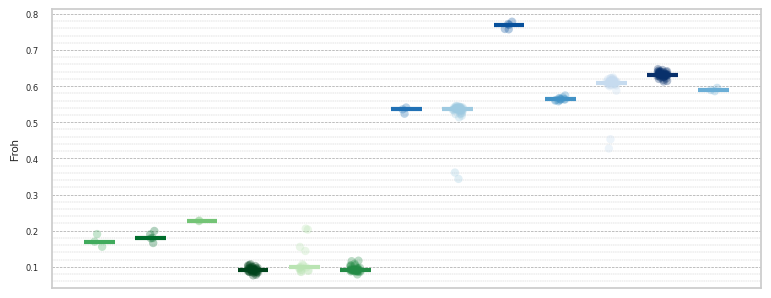

In [172]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf" 
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# color_map = {
#     'PJ':'#6BAED6',
#     'MP': '#2171B5',
#     'KP': '#4292C6',
#     'PM': '#08306B',
#     'BJ': '#08519C',
#     'SC': '#9ECAE1',
#     'PK': '#C6DBEF',
#     'VS': '#238B45',
#     'TM': '#00441B',
#     'RG': '#BAE4B3',
#     'SP': '#74C476',
#     'TR': '#006D2C',
#     'PL': '#41AB5D'
# }

color_map = {
    'PJ':'#E4F1F8',
    'MP': '#C5E1EF',
    'KP': '#3A93C2',
    'PM': '#0C4A70',
    'BJ': '#6CB0D6',
    'SC': '#9EC9E2',
    'PK': '#246D9C',
    'VS': '#0A592A',
    'TM': '#3FAD5B',
    'RG': '#218B3B',
    'SP': '#CDE5D2',
    'TR': '#9CCEA7',
    'PL': '#6CB97D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Make the plot ===
cm = 1 / 2.54  # cm to inches
plt.figure(figsize=(20*cm, 8*cm))  


# Strip plot first (dots in the background)
import matplotlib.ticker as mticker

plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()

plt.grid(
    which='minor',
    axis='y', # minor grid lines
    linestyle='--', 
    linewidth=0.3, 
    color='grey', 
    alpha=0.5
)
ax = sns.stripplot(
    data=roh_per_ind,
    x='Population',
    y='Froh',
    palette=color_map,
    jitter=True,
    size=6,
    order=desired_order,
    alpha=0.3,  # make dots slightly transparent
    zorder=1     # put dots behind lines
)
ax.xaxis.set_tick_params(which='minor', bottom=False)

# Calculate median per population
stats = roh_per_ind.groupby('Population')['Froh'].median().reindex(desired_order)

# Add median lines with same color as population
for i, pop in enumerate(desired_order):
    median = stats.loc[pop]
    color = color_map[pop]  # get color for this population
    
    ax.hlines(
        y=median,
        xmin=i - 0.3,
        xmax=i + 0.3,
        color=color,
        linewidth=3,
        zorder=2  # above dots
    )

ax.set_ylabel("Froh", fontsize = 8, fontproperties=arial_font)
ax.tick_params(axis='x', rotation=45)
ax.set_xlabel("")
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12], labels=["", "","","","","","","","","","","",""], rotation=0, fontsize = 6)
plt.yticks(fontsize = 6)

plt.tight_layout()
plt.savefig("Figure_3c_v1.png", format="png", dpi=300)
plt.show()


/tmp/ipykernel_1696330/2666535515.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


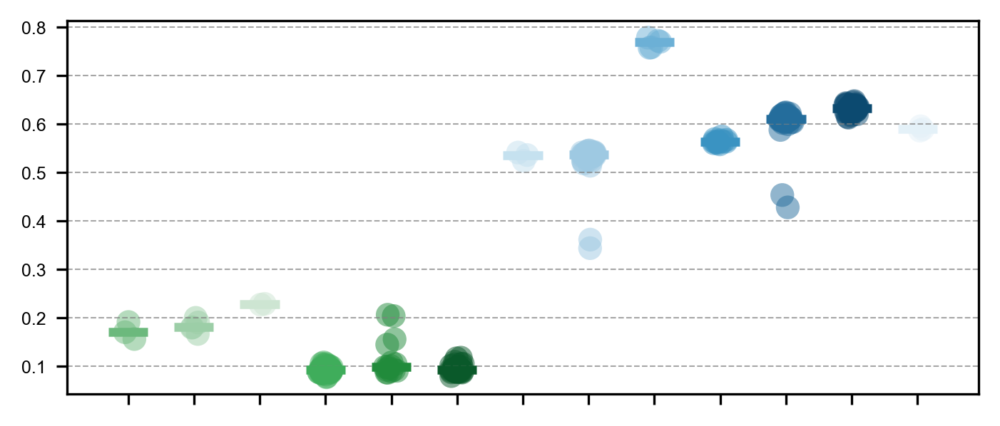

In [184]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# Font sizes (same system as other figures)
plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Colors and order
# =========================
color_map = {
    'PJ':'#E4F1F8','MP': '#C5E1EF','KP': '#3A93C2','PM': '#0C4A70',
    'BJ': '#6CB0D6','SC': '#9EC9E2','PK': '#246D9C','VS': '#0A592A',
    'TM': '#3FAD5B','RG': '#218B3B','SP': '#CDE5D2','TR': '#9CCEA7','PL': '#6CB97D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]


# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 6*cm), dpi=300)


# =========================
# Grid
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

#ax.minorticks_on()

ax.grid(
    which='minor',
    axis='y',
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)


# =========================
# Strip plot
# =========================
sns.stripplot(
    data=roh_per_ind,
    x='Population',
    y='Froh',
    palette=color_map,
    jitter=True,
    size=8,
    order=desired_order,
    alpha=0.5,
    zorder=1,
    ax=ax
)

ax.xaxis.set_tick_params(which='minor', bottom=False)


# =========================
# Median lines
# =========================
stats = roh_per_ind.groupby('Population')['Froh'].median().reindex(desired_order)

for i, pop in enumerate(desired_order):

    ax.hlines(
        y=stats.loc[pop],
        xmin=i-0.3,
        xmax=i+0.3,
        color=color_map[pop],
        linewidth=3,
        zorder=2
    )


# =========================
# Labels
# =========================
ax.set_ylabel("", labelpad=10)
ax.set_xlabel("")

# keep ticks but hide population labels
ax.tick_params(axis='x', labelbottom=False, pad=4)
#ax.tick_params(axis='y', labelleft=False,pad=4)


# =========================
# Layout (same system)
# =========================
ax.set_position([0.10, 0.18, 0.88, 0.74])


# =========================
# Save
# =========================
fig.canvas.draw()

plt.savefig(
    "Figure_3c_v1.svg",
    format="svg",
    dpi=300
)

plt.show()

/tmp/ipykernel_1696330/3046640156.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.stripplot(


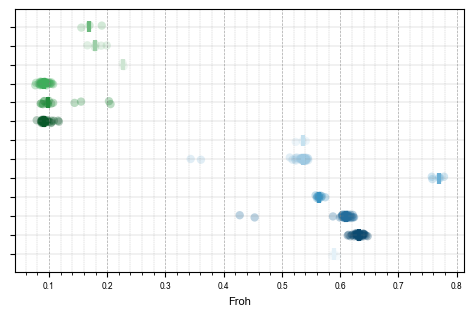

In [175]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Colors and order ===
# color_map = {
#     'PJ':'#6BAED6',
#     'MP': '#2171B5',
#     'KP': '#4292C6',
#     'PM': '#08306B',
#     'BJ': '#08519C',
#     'SC': '#9ECAE1',
#     'PK': '#C6DBEF',
#     'VS': '#238B45',
#     'TM': '#00441B',
#     'RG': '#BAE4B3',
#     'SP': '#74C476',
#     'TR': '#006D2C',
#     'PL': '#41AB5D'
# }

color_map = {
    'PJ':'#E4F1F8',
    'MP': '#C5E1EF',
    'KP': '#3A93C2',
    'PM': '#0C4A70',
    'BJ': '#6CB0D6',
    'SC': '#9EC9E2',
    'PK': '#246D9C',
    'VS': '#0A592A',
    'TM': '#3FAD5B',
    'RG': '#218B3B',
    'SP': '#CDE5D2',
    'TR': '#9CCEA7',
    'PL': '#6CB97D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Figure setup ===
cm = 1 / 2.54
plt.figure(figsize=(12*cm, 8*cm))  # swapped width/height for sideways layout

plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
plt.minorticks_on()
plt.grid(
    which='minor',
    axis='x',   # grid along x now (since x is Froh)
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)

# === Strip plot (horizontal orientation) ===
ax = sns.stripplot(
    data=roh_per_ind,
    y='Population',       # swapped axes
    x='Froh',             # Froh on x-axis now
    palette=color_map,
    jitter=True,
    size=6,
    order=desired_order,
    alpha=0.3,
    zorder=1
)
ax.yaxis.set_tick_params(which='minor', left=False)
ax.yaxis.grid(True, which='major', linestyle='-', linewidth=0.3, color='grey', alpha=0.5)

# === Median lines (vertical now) ===
stats = roh_per_ind.groupby('Population')['Froh'].median().reindex(desired_order)

for i, pop in enumerate(desired_order):
    median = stats.loc[pop]
    color = color_map[pop]
    ax.vlines(                # vertical lines for median
        x=median,
        ymin=i - 0.3,
        ymax=i + 0.3,
        color=color,
        linewidth=3,
        zorder=2
    )

# === Labels and formatting ===
ax.set_xlabel("Froh", fontsize=8, fontproperties=arial_font)
ax.set_ylabel("")
plt.yticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12], labels=["", "","","","","","","","","","","",""], rotation=0, fontsize = 6)
plt.xticks(fontsize=6)

plt.tight_layout()
plt.savefig("Figure_3b_v1_horizontal.svg", format="svg", dpi=300)
plt.show()


/tmp/ipykernel_1696330/2576008912.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


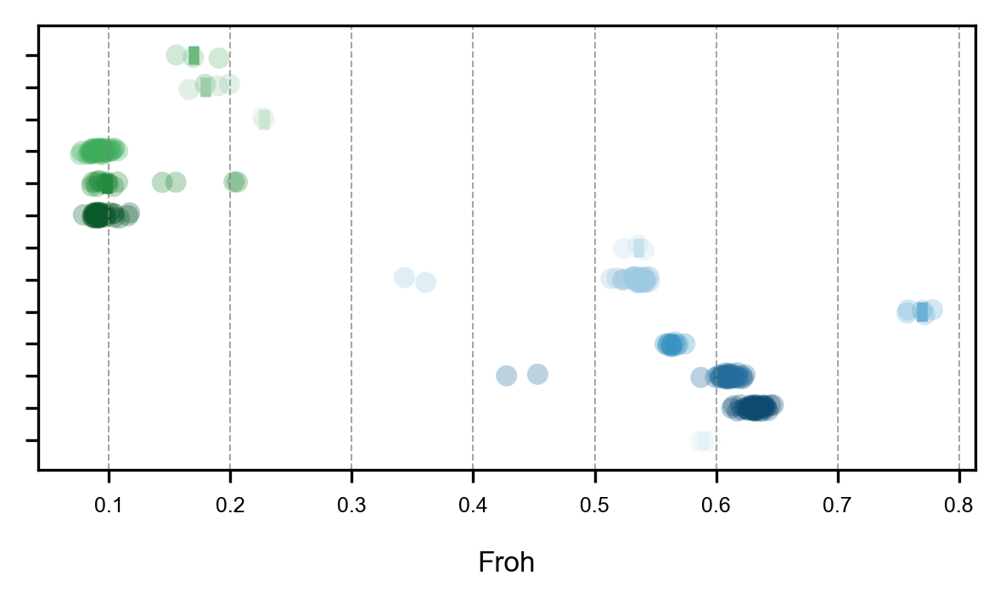

In [177]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# Font sizes (same system as other figures)
plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Colors and order
# =========================
color_map = {
    'PJ':'#E4F1F8','MP': '#C5E1EF','KP': '#3A93C2','PM': '#0C4A70',
    'BJ': '#6CB0D6','SC': '#9EC9E2','PK': '#246D9C','VS': '#0A592A',
    'TM': '#3FAD5B','RG': '#218B3B','SP': '#CDE5D2','TR': '#9CCEA7','PL': '#6CB97D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]


# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 6*cm), dpi=300)


# =========================
# Grid
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

#ax.minorticks_on()

ax.grid(
    which='minor',
    axis='x',
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)


# =========================
# Strip plot
# =========================
sns.stripplot(
    data=roh_per_ind,
    y='Population',
    x='Froh',
    palette=color_map,
    jitter=True,
    size=6,
    order=desired_order,
    alpha=0.3,
    zorder=1,
    ax=ax
)

# keep grid + ticks but hide population labels
ax.tick_params(axis='y', labelleft=False, pad=4)


# =========================
# Median lines
# =========================
stats = roh_per_ind.groupby('Population')['Froh'].median().reindex(desired_order)

for i, pop in enumerate(desired_order):

    ax.vlines(
        x=stats.loc[pop],
        ymin=i-0.3,
        ymax=i+0.3,
        color=color_map[pop],
        linewidth=3,
        zorder=2
    )


# =========================
# Labels
# =========================
ax.set_xlabel("Froh", labelpad=10)
ax.set_ylabel("")

ax.tick_params(axis='x', pad=4)


# =========================
# Layout (same system)
# =========================
ax.set_position([0.18, 0.18, 0.76, 0.74])


# =========================
# Save
# =========================
fig.canvas.draw()

plt.savefig(
    "Figure_3b_v1_horizontal.svg",
    format="svg",
    dpi=300
)

plt.show()

In [445]:
mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

roh_per_ind['Region'] = roh_per_ind['Population'].apply(assign_region)
roh_per_ind = roh_per_ind[~roh_per_ind['Sample'].isin(['PMU01'])]
#df_angsd.to_excel("ANGSD_summary.xlsx", index=False)

In [446]:
roh_per_ind = roh_per_ind[~roh_per_ind['Population'].isin(["PL", "TR", "SP", "RG", "MP", "BJ", "KP", "PJ"])]
print(roh_per_ind)

    Population  Sample  total_roh_bp  percent_genome_in_roh      Froh  \
24          PK  24PK01     870365660              61.139978  0.611400   
25          PK  24PK02     880947057              61.883283  0.618833   
26          PK  24PK03     859709584              60.391428  0.603914   
27          PK  24PK04     868204130              60.988139  0.609881   
28          PK  24PK05     886053158              62.241967  0.622420   
..         ...     ...           ...                    ...       ...   
258         VS    VS08     112552797               7.906419  0.079064   
259         VS    VS09     143198230              10.059148  0.100591   
260         VS    VS10     130435117               9.162586  0.091626   
261         VS    VS11     133990869               9.412364  0.094124   
262         VS    VS12     154575376              10.858350  0.108584   

       Region  
24     Island  
25     Island  
26     Island  
27     Island  
28     Island  
..        ...  
258  Mainla

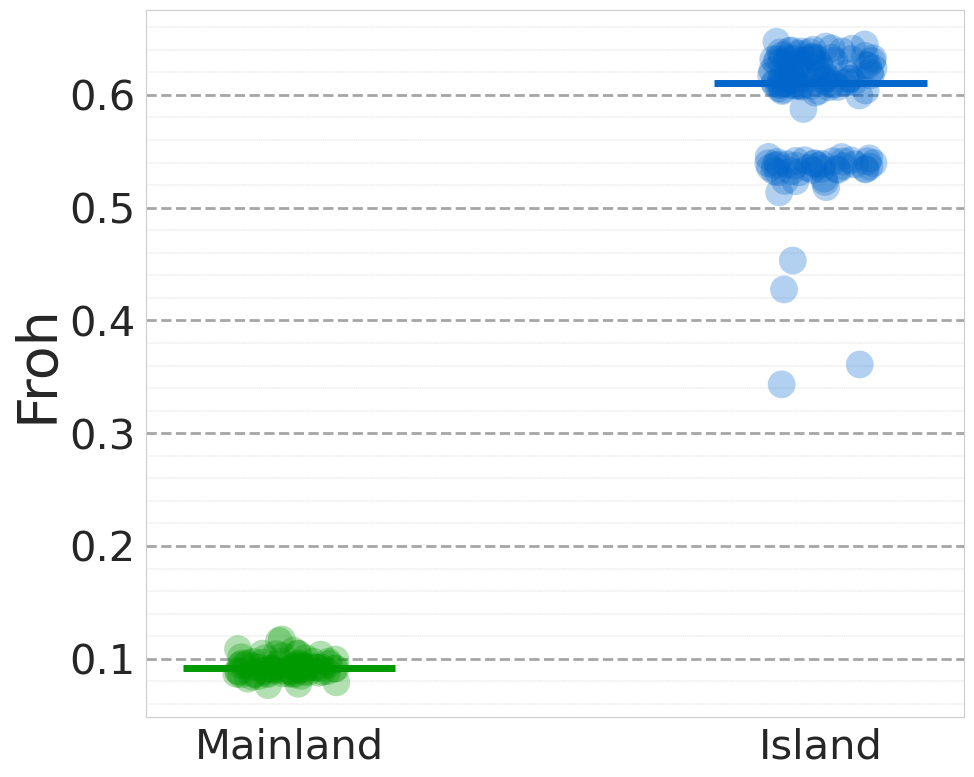

In [604]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = "DejaVu Sans"

# === Figure size in cm (~10x10 cm) ===
cm = 1 / 2.54
plt.figure(figsize=(25*cm, 20*cm))

# === Define colors ===
palette = {"Mainland": "#009900", "Island": "#0066CC"}

# --- Grid setup ---
plt.grid(True, linestyle="--", linewidth=2, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()
plt.grid(
    which='minor',
    axis='y',   # horizontal minor lines only
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)

# --- Strip plot (dots in background) ---
order = list(palette.keys())
ax = sns.stripplot(
    data=roh_per_ind,
    x='Region',
    y='Froh',
    hue='Region',
    palette=palette,
    jitter=True,
    size=20,
    alpha=0.3,
    order=order, # slightly transparent dots
    zorder=1,    # behind median lines
    dodge=False
)
#ax.xaxis.set_tick_params(which='minor', bottom=False)  # remove minor x ticks

# --- Add median lines per Region ---
stats = roh_per_ind.groupby('Region')['Froh'].median().reindex(palette.keys())

for i, region in enumerate(stats.index):
    median = stats.loc[region]
    color = palette[region]
    
    ax.hlines(
        y=median,
        xmin=i - 0.2,
        xmax=i + 0.2,
        color=color,
        linewidth=5,
        zorder=2  # above dots
    )

# --- Axes labels and ticks ---
ax.set_ylabel("Froh", fontsize=40)
ax.set_xlabel("")
ax.tick_params(axis='x', rotation=0)
#plt.xticks(ticks=range(len(stats.index)), labels=[""]*len(stats.index), fontsize=6)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
# --- Optional: Statistical annotation ---
x1, x2 = 0, 1
y_max = roh_per_ind['Froh'].max()
y = y_max + 0  # start just above max value
h = 0.5          # height of short vertical ticks
#ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=0.5, c='black')
#ax.text((x1+x2)*0.5, y+h+0.75, "p < 0.001", ha='center', va='bottom', color='black', fontsize=6, fontproperties=arial_font)

plt.tight_layout()
plt.savefig("Froh_poster.svg", format="svg", dpi=300)
plt.show()


#### 6.2.2. ROH sizes

In [186]:
# --- Create ROH length bins ---
#bins = [0, 5e4, 1e5, 5e5, 1e6, 3e6, 3e7] 
#labels = ['<50Kb', '50-100Kb', '100-500Kb', '500Kb-1Mb', '1-3Mb', '>3Mb']

bins = [5e4, 1e5, 5e5, 1e6, 3e6, 3e9]  
labels = ['50-100Kb', '100-500Kb', '500Kb-1Mb', '1-3Mb', '>3Mb']
df_bcftoolsROH['ROH_bin'] = pd.cut(df_bcftoolsROH['Length_bp'], bins=bins, labels=labels, right=False)
print(df_bcftoolsROH)

         Tag  Sample  Chromosome     Start       End  Length_bp  Markers  \
0         RG    VS12  OZ076838.1     91717    100642       8926      100   
1         RG    VS12  OZ076838.1    103887    105336       1450       26   
2         RG    VS12  OZ076838.1    106962    108119       1158       78   
3         RG    VS12  OZ076838.1    108920    110227       1308       34   
4         RG    VS12  OZ076838.1    110850    116060       5211       82   
...       ..     ...         ...       ...       ...        ...      ...   
31762141  RG  24VS26  OZ076857.1  12774121  12776466       2346       26   
31762142  RG  24VS26  OZ076857.1  12838746  12839460        715       34   
31762143  RG  24VS26  OZ076857.1  12842098  12876560      34463       21   
31762144  RG  24VS26  OZ076857.1  13267812  13268649        838       38   
31762145  RG  24VS26  OZ076857.1  13270625  13272443       1819       39   

          Quality Population ROH_bin  
0            11.2         VS     NaN  
1        

In [187]:
# --- Create ROH length bins ---
bins = [1e4, 5e4, 1e5, 5e5, 1e6, 1e9]
labels = [
    '10-50Kb',
    '50-100Kb',
    '100-500Kb',
    '500Kb-1Mb',
    '>1Mb',
]

df_bcftoolsROH['ROH_bin'] = pd.cut(
    df_bcftoolsROH['Length_bp'],
    bins=bins,
    labels=labels,
    right=False
)


In [188]:
# === Calculate average number of ROHs per bin per population ===
roh_counts = (
    df_bcftoolsROH.groupby(['Population', 'Sample', 'ROH_bin'], observed=True)
      .size()
      .reset_index(name='Count')
)

avg_roh_counts = (
    roh_counts.groupby(['Population', 'ROH_bin'], observed=True)['Count']
    .mean()
    .reset_index()
)

In [221]:
mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

roh_counts['Region'] = roh_counts['Population'].apply(assign_region)
roh_counts = roh_counts[~roh_counts['Sample'].isin(['PMU01'])]
#df_angsd.to_excel("ANGSD_summary.xlsx", index=False)

from scipy.stats import mannwhitneyu

results = []

for b in roh_counts['ROH_bin'].dropna().unique():
    
    subset = roh_counts[roh_counts['ROH_bin'] == b]
    
    ml = subset[subset['Region'] == 'Mainland']['Count']
    il = subset[subset['Region'] == 'Island']['Count']
    
    stat, p = mannwhitneyu(ml, il, alternative='two-sided')
    
    results.append({
        'ROH_bin': b,
        'ML_mean': ml.mean(),
        'IL_mean': il.mean(),
        'p_value': p
    })

import pandas as pd
pd.DataFrame(results)

,ROH_bin,ML_mean,IL_mean,p_value
0,10-50Kb,1176.548077,11219.383648,9.623433e-43
1,50-100Kb,106.461538,1891.081761,1.623790e-42
2,100-500Kb,49.365385,1103.578616,1.945843e-41
3,500Kb-1Mb,5.038462,20.528302,3.034016e-31
4,>1Mb,1.181818,2.307692,4.463045e-09


In [224]:
import pandas as pd

roh_counts['Region'] = roh_counts['Region'].astype('category')
roh_counts['ROH_bin'] = roh_counts['ROH_bin'].astype('category')
roh_counts['Population'] = roh_counts['Population'].astype('category')

import statsmodels.api as sm
import statsmodels.formula.api as smf

model = smf.gee(
    "Count ~ Region * ROH_bin",
    groups="Population",
    data=roh_counts,
    family=sm.families.Poisson()
)

result = model.fit()

print(result.summary())

                               GEE Regression Results                              
Dep. Variable:                       Count   No. Observations:                 1250
Model:                                 GEE   No. clusters:                       13
Method:                        Generalized   Min. cluster size:                  10
                      Estimating Equations   Max. cluster size:                 230
Family:                            Poisson   Mean cluster size:                96.2
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Fri, 13 Mar 2026   Scale:                           1.000
Covariance type:                    robust   Time:                         17:48:40
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Intercept                   

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

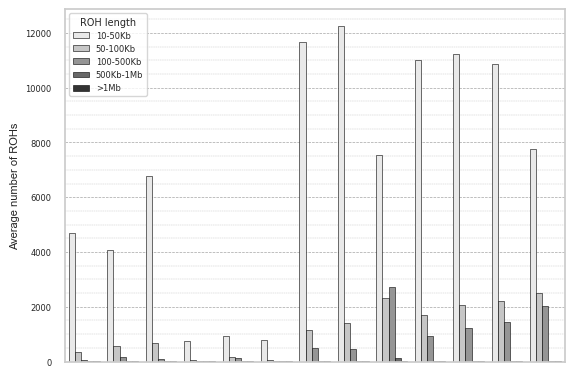

In [196]:
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Make the plot ===
cm = 1 / 2.54
plt.figure(figsize=(15 * cm, 10 * cm))
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
plt.minorticks_on()
plt.grid(which='minor', axis='y', linestyle='--', linewidth=0.3, color='grey', alpha=0.5)

# Fully opaque bars (alpha=1)
ax = sns.barplot(
    data=avg_roh_counts,
    x='Population',
    y='Count',
    hue='ROH_bin',
    order=desired_order,
    palette='Greys',
    edgecolor='black',
    linewidth=0.4,
    alpha=1
)

# # === Add small count labels above bars ===
# for container in ax.containers:
#     ax.bar_label(
#         container,
#         labels=[f"{c.get_height():.0f}" if c.get_height() > 0 else "" for c in container],
#         fontsize=4,
#         fontproperties=arial_font,
#         padding=2,
#         color='black'
#     )

# === Formatting ===
ax.set_ylabel("Average number of ROHs", fontsize=8, fontproperties=arial_font)
ax.set_xlabel("", fontsize=8, fontproperties=arial_font)
ax.tick_params(axis='x', rotation=45)
ax.legend(title="ROH length", fontsize=6, title_fontsize=7)
plt.xticks(ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12], labels=["", "","","","","","","","","","","",""], rotation=0, fontsize = 6)
plt.yticks(fontsize=6)
plt.tight_layout()

# === Show or save ===
#plt.savefig("avg_roh_bins_per_population.svg", format="svg", dpi=300)
plt.show()

/tmp/ipykernel_2805681/658070474.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=0.01, rect=[0, 0, 0.9, 1])
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font 

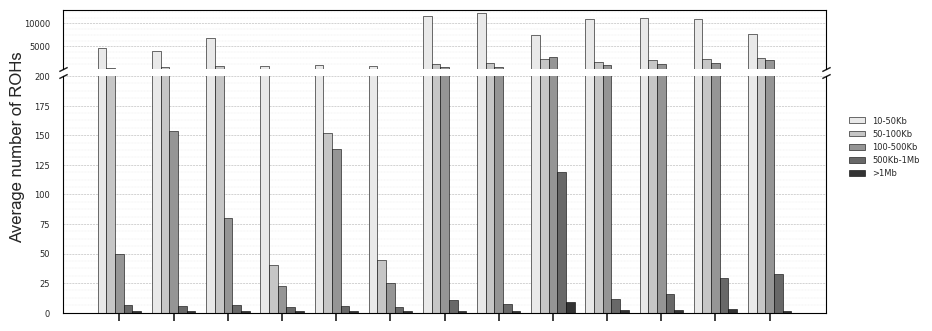

In [199]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Order of populations ===
desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Figure setup ===
cm = 1 / 2.54
fig, (ax1, ax2) = plt.subplots(
    2, 1, sharex=True,
    figsize=(25 * cm, 10 * cm),
    gridspec_kw={'height_ratios': [0.5, 2], 'hspace': 0.05}
)

# === Define the y-axis break points ===
ymin, ybreak, ymax = 0, 200, 13000  

# === Shared styling for both panels ===
common_kws = dict(
    data=avg_roh_counts,
    x='Population',
    y='Count',
    hue='ROH_bin',
    order=desired_order,
    palette='Greys',
    edgecolor='black',
    linewidth=0.4,
    alpha=1
)

# === Plot both panels ===
sns.barplot(**common_kws, ax=ax1)
sns.barplot(**common_kws, ax=ax2)

# === Y-axis limits ===
ax1.set_ylim(ybreak, ymax)
ax2.set_ylim(ymin, ybreak)

# === Hide connecting spines ===
ax1.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)

# === Force outer axes (spines) to black ===
for ax in [ax1, ax2]:
    for side, spine in ax.spines.items():
        if spine.get_visible():      # only outer, visible spines
            spine.set_color("black")
            spine.set_linewidth(0.8)

# === Remove top x tick labels and bottom labels entirely ===
ax1.tick_params(labelbottom=False, bottom=False)
ax2.tick_params(axis='x', labelbottom=False, bottom=True)

# === Add diagonal break marks ===
d = .5  # proportion of vertical to horizontal size of the slanted lines
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=6, linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

# === Y-axis label only on bottom axis ===
ax1.set_ylabel("")  # remove top label
#ax2.set_ylabel("Average number of ROHs", fontsize=8, fontproperties=arial_font)
# === Y-axis label only on bottom axis, moved up ===
ax2.set_ylabel("Average number of ROHs", fontsize=8, fontproperties=arial_font, labelpad=15)
ax2.yaxis.set_label_coords(-0.05, 0.70)  # x, y in axis coordinates (0-1)

from matplotlib.ticker import AutoMinorLocator
import numpy as np

for ax in [ax1, ax2]:
    ax.set_xlabel("")
    ax.tick_params(labelsize=6)
    ax.yaxis.label.set_fontproperties(arial_font)
    ax.set_axisbelow(True)  # ensure grid is behind bars

    # Major horizontal grid lines
    ax.grid(True, which='major', linestyle="--", linewidth=0.4, color="grey", alpha=0.6, axis='y')

    # Minor horizontal grid lines manually
    minor_locator = AutoMinorLocator(n=4)  # 4 minor ticks between each major tick
    ax.yaxis.set_minor_locator(minor_locator)

    # Draw minor grid lines
    for tick in ax.yaxis.get_minorticklocs():
        ax.axhline(y=tick, linestyle="--", linewidth=0.2, color="grey", alpha=0.3, zorder=0)



# === Legend on right side, moved up ===
ax1.legend_.remove()
leg = ax2.legend(
    title="",
    fontsize=6,
    title_fontsize=1,
    loc='center left',
    bbox_to_anchor=(1.02, 0.70),  # moved up (0.85 instead of 0.5)
    frameon=False,
)

# === Layout ===
#plt.tight_layout(h_pad=0.05, rect=[0, 0, 0.9, 1])
#plt.tight_layout(h_pad=0.05, rect=[0, 0, 0.5, 1])
plt.tight_layout(h_pad=0.01, rect=[0, 0, 0.9, 1])
plt.savefig("avg_roh_bins_per_population.png", format="png", dpi=300)
plt.show()


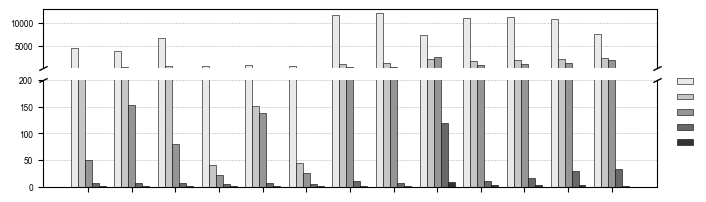

In [203]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
from matplotlib.ticker import AutoMinorLocator

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# Font sizes (same as other figures)
plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Population order
# =========================
desired_order = ["PL","TR","SP","TM","RG","VS","MP","SC","BJ","KP","PK","PM","PJ"]


# =========================
# Figure setup
# =========================
cm = 1/2.54
fig, (ax1, ax2) = plt.subplots(
    2,1,
    sharex=True,
    figsize=(19.5*cm,6*cm),
    gridspec_kw={'height_ratios':[0.5,2], 'hspace':0.02}
)


# =========================
# Axis break limits
# =========================
ymin, ybreak, ymax = 0, 200, 13000


# =========================
# Bar plot parameters
# =========================
common_kws = dict(
    data=avg_roh_counts,
    x='Population',
    y='Count',
    hue='ROH_bin',
    order=desired_order,
    palette='Greys',
    edgecolor='black',
    linewidth=0.4,
    alpha=1
)


# =========================
# Plot both panels
# =========================
sns.barplot(**common_kws, ax=ax1)
sns.barplot(**common_kws, ax=ax2)


# =========================
# Y limits
# =========================
ax1.set_ylim(ybreak, ymax)
ax2.set_ylim(ymin, ybreak)


# =========================
# Spine styling
# =========================
ax1.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)

for ax in [ax1, ax2]:
    for side, spine in ax.spines.items():
        if spine.get_visible():
            spine.set_color("black")
            spine.set_linewidth(0.8)


# =========================
# X ticks
# =========================
ax1.tick_params(labelbottom=False, bottom=False)
ax2.tick_params(axis='x', labelbottom=False, bottom=True, pad=4)


# =========================
# Axis labels
# =========================
ax1.set_ylabel("")

ax2.set_ylabel(
    "",
    labelpad=10,
    fontproperties=arial_font
)

ax2.yaxis.set_label_coords(-0.05,0.70)


# =========================
# Grid styling
# =========================
for ax in [ax1, ax2]:

    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelleft=True)  # hides y-axis numbers
    ax.set_axisbelow(True)

    # Major grid
    ax.grid(
        True,
        which='major',
        linestyle="--",
        linewidth=0.4,
        color="grey",
        alpha=0.6,
        axis='y'
    )

    # # Minor grid
    # ax.yaxis.set_minor_locator(AutoMinorLocator(4))

    # for tick in ax.yaxis.get_minorticklocs():
    #     ax.axhline(
    #         y=tick,
    #         linestyle="--",
    #         linewidth=0.2,
    #         color="grey",
    #         alpha=0.3,
    #         zorder=0
    #     )


# =========================
# Diagonal axis break
# =========================
d = .5

kwargs = dict(
    marker=[(-1,-d),(1,d)],
    markersize=6,
    linestyle="none",
    color='k',
    mec='k',
    mew=1,
    clip_on=False
)

ax1.plot([0,1],[0,0], transform=ax1.transAxes, **kwargs)
ax2.plot([0,1],[1,1], transform=ax2.transAxes, **kwargs)


# =========================
# Legend
# =========================
ax1.legend_.remove()

leg = ax2.legend(
    title="",
    fontsize=6,
    loc='center left',
    bbox_to_anchor=(1.02,0.70),
    frameon=False,
    handlelength=2,   # size of squares
    handletextpad=0,
    labelspacing=0.75# remove space between square and label
)

# remove legend text labels
for text in leg.get_texts():
    text.set_text("")


# =========================
# Layout (same system)
# =========================
ax1.set_position([0.065,0.65,0.80,0.25])
ax2.set_position([0.065,0.15,0.80,0.45])


# =========================
# Save
# =========================
fig.canvas.draw()

plt.savefig(
    "avg_roh_bins_per_population.svg",
    format="svg",
    dpi=300
)

plt.show()

/tmp/ipykernel_2805681/3732049835.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=0.01, rect=[0, 0, 0.9, 1])
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font 

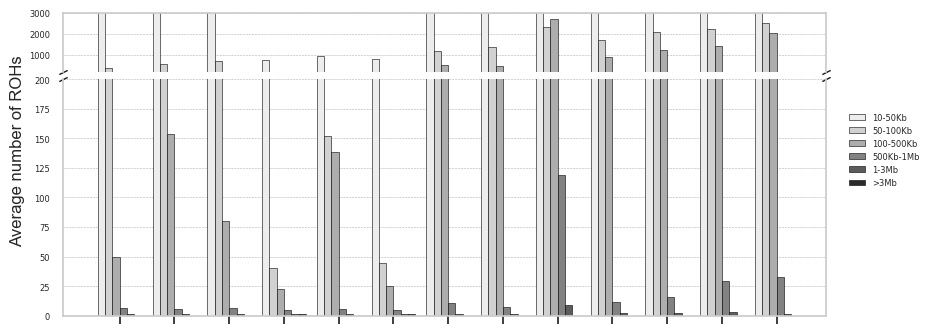

In [152]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
from matplotlib.ticker import AutoMinorLocator
import numpy as np

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Order of populations ===
desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Figure setup ===
cm = 1 / 2.54
fig, (ax1, ax2) = plt.subplots(
    2, 1, sharex=True,
    figsize=(25 * cm, 10 * cm),
    gridspec_kw={'height_ratios': [0.5, 2], 'hspace': 0.05}
)

# === Define the y-axis break points ===
ymin, ybreak, ymax = 0, 200, 3000  

# === Shared styling for both panels ===
common_kws = dict(
    data=avg_roh_counts,
    x='Population',
    y='Count',
    hue='ROH_bin',
    order=desired_order,
    palette='Greys',
    edgecolor='black',
    linewidth=0.4,
    alpha=1
)

# === Plot both panels ===
sns.barplot(**common_kws, ax=ax1)
sns.barplot(**common_kws, ax=ax2)

# === Y-axis limits ===
ax1.set_ylim(ybreak, ymax)
ax2.set_ylim(ymin, ybreak)

# === Hide connecting spines ===
ax1.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)

# === Remove top x tick labels and bottom labels entirely ===
ax1.tick_params(labelbottom=False, bottom=False)
ax2.tick_params(axis='x', labelbottom=False, bottom=True)

# === Add diagonal break marks ===
d = .5  # proportion of vertical to horizontal size of the slanted lines
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=6, linestyle="none", color='k', mec='k', mew=1, clip_on=False)
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

# === Y-axis label only on bottom axis, moved up ===
ax1.set_ylabel("")  # remove top label
ax2.set_ylabel("Average number of ROHs", fontsize=8, fontproperties=arial_font, labelpad=15)
ax2.yaxis.set_label_coords(-0.05, 0.70)  # x, y in axis coordinates (0-1)

# === Grid lines for both panels ===
#plt.minorticks_on()
for ax in [ax1, ax2]:
    ax.set_xlabel("")
    ax.tick_params(labelsize=6)
    ax.yaxis.label.set_fontproperties(arial_font)
    ax.set_axisbelow(True)  # ensure grid is behind bars

    # Major horizontal grid lines
    ax.grid(True, which='both', linestyle="--", linewidth=0.4, color="grey", alpha=0.6, axis='y')
    
    # Enable minor ticks and grid
    ax.grid(True, which='minor', linestyle="--", linewidth=0.2, color="grey", alpha=0.3, axis='y')
    
    # # Set minor locator for y-axis
    # minor_locator = AutoMinorLocator(n=4)  # 4 minor ticks between each major tick
    # ax.yaxis.set_minor_locator(minor_locator)

# === Legend on right side, moved up ===
ax1.legend_.remove()
leg = ax2.legend(
    title="",
    fontsize=6,
    title_fontsize=1,
    loc='center left',
    bbox_to_anchor=(1.02, 0.70),
    frameon=False,
)

# === Layout ===
plt.tight_layout(h_pad=0.01, rect=[0, 0, 0.9, 1])
#plt.savefig("avg_roh_bins_per_population.png", format="png", dpi=300)
plt.show()

/tmp/ipykernel_2805681/590539719.py:119: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=0.01, rect=[0, 0, 0.9, 1])
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font 

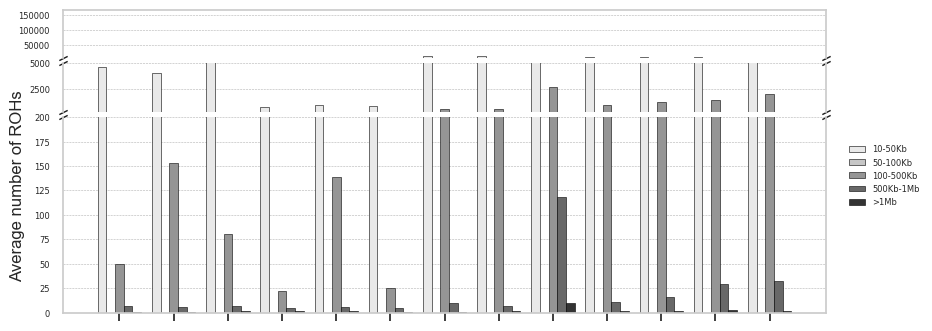

In [184]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
from matplotlib.ticker import AutoMinorLocator
import numpy as np

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Order of populations ===
desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Figure setup (THREE PANELS = TWO BREAKS) ===
cm = 1 / 2.54
fig, (ax1, ax2, ax3) = plt.subplots(
    3, 1, sharex=True,
    figsize=(25 * cm, 10 * cm),
    gridspec_kw={'height_ratios': [0.5, 0.5, 2], 'hspace': 0.05}
)

# === Define y-axis ranges ===
ymin = 0
ybreak1 = 200
ybreak2 = 5000
ymax = 170000

# === Shared barplot settings ===
common_kws = dict(
    data=avg_roh_counts,
    x='Population',
    y='Count',
    hue='ROH_bin',
    order=desired_order,
    palette='Greys',
    edgecolor='black',
    linewidth=0.4,
    alpha=1
)

# === Plot bars on all panels ===
sns.barplot(**common_kws, ax=ax1)
sns.barplot(**common_kws, ax=ax2)
sns.barplot(**common_kws, ax=ax3)

# === Apply y-limits ===
ax1.set_ylim(ybreak2, ymax)
ax2.set_ylim(ybreak1, ybreak2)
ax3.set_ylim(ymin, ybreak1)

# === Hide spines between panels ===
ax1.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax3.spines['top'].set_visible(False)

# === Tick handling ===
ax1.tick_params(labelbottom=False, bottom=False)
ax2.tick_params(labelbottom=False, bottom=False)
ax3.tick_params(axis='x', labelbottom=False, bottom=True)

# === Add diagonal break marks ===
d = 0.5
kwargs = dict(
    marker=[(-1, -d), (1, d)],
    markersize=6,
    linestyle="none",
    color='k',
    mec='k',
    mew=1,
    clip_on=False
)

# Break between ax1 and ax2
ax1.plot([0, 1], [0, 0], transform=ax1.transAxes, **kwargs)
ax2.plot([0, 1], [1, 1], transform=ax2.transAxes, **kwargs)

# Break between ax2 and ax3
ax2.plot([0, 1], [0, 0], transform=ax2.transAxes, **kwargs)
ax3.plot([0, 1], [1, 1], transform=ax3.transAxes, **kwargs)

# === Y-axis label (only bottom panel) ===
ax1.set_ylabel("")
ax2.set_ylabel("")
ax3.set_ylabel(
    "Average number of ROHs",
    fontsize=8,
    fontproperties=arial_font,
    labelpad=15
)
ax3.yaxis.set_label_coords(-0.05, 0.65)

# === Grid + styling ===
for ax in [ax1, ax2, ax3]:
    ax.set_xlabel("")
    ax.tick_params(labelsize=6)
    ax.yaxis.label.set_fontproperties(arial_font)
    ax.set_axisbelow(True)

    ax.grid(True, which='both', linestyle="--",
            linewidth=0.4, color="grey", alpha=0.6, axis='y')
    ax.grid(True, which='minor', linestyle="--",
            linewidth=0.2, color="grey", alpha=0.3, axis='y')

# === Legend ===
ax1.legend_.remove()
ax2.legend_.remove()
leg = ax3.legend(
    title="",
    fontsize=6,
    title_fontsize=1,
    loc='center left',
    bbox_to_anchor=(1.02, 0.70),
    frameon=False,
)

# === Layout ===
plt.tight_layout(h_pad=0.01, rect=[0, 0, 0.9, 1])
# plt.savefig("avg_roh_bins_per_population.png", dpi=300)
plt.show()


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

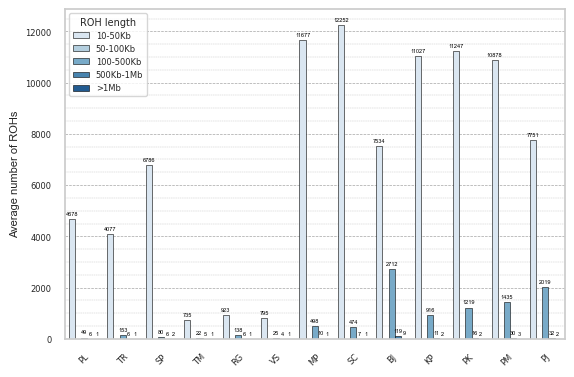

In [183]:
# === Remove the smallest bin ===
avg_roh_counts = avg_roh_counts[avg_roh_counts['ROH_bin'] != '50-100Kb']
# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Define color map and order ===
color_map = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}
desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Make the plot ===
cm = 1 / 2.54
plt.figure(figsize=(15 * cm, 10 * cm))
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
plt.minorticks_on()
plt.grid(which='minor', axis='y', linestyle='--', linewidth=0.3, color='grey', alpha=0.5)

# Fully opaque bars (alpha=1)
ax = sns.barplot(
    data=avg_roh_counts,
    x='Population',
    y='Count',
    hue='ROH_bin',
    order=desired_order,
    palette='Blues',
    edgecolor='black',
    linewidth=0.4,
    alpha=1
)

# === Add small count labels above bars ===
for container in ax.containers:
    ax.bar_label(
        container,
        labels=[f"{c.get_height():.0f}" if c.get_height() > 0 else "" for c in container],
        fontsize=4,
        fontproperties=arial_font,
        padding=2,
        color='black'
    )

# === Formatting ===
ax.set_ylabel("Average number of ROHs", fontsize=8, fontproperties=arial_font)
ax.set_xlabel("", fontsize=8, fontproperties=arial_font)
ax.tick_params(axis='x', rotation=45)
ax.legend(title="ROH length", fontsize=6, title_fontsize=7)
plt.xticks(fontsize=6)
plt.yticks(fontsize=6)
plt.tight_layout()

# === Show or save ===
#plt.savefig("avg_roh_bins_per_population.svg", format="svg", dpi=300)
plt.show()

#### 6.2.2.1 Froh only >100KB ROH

In [ ]:
import pandas as pd

# --- Define genome length ---
genome_length = 1423562263

# --- Define ROH thresholds ---
thresholds = [50_000, 100_000, 500_000, 1_000_000, 2_000_000, 3_000_000]

# --- Initialize dictionary to store per-individual sums ---
roh_dict = {}

for t in thresholds:
    col_name = f'Sum_ROH_gt{int(t/1000)}kb'  # Column name like Sum_ROH_gt50kb
    temp = (
        df_bcftoolsROH[df_bcftoolsROH['Length_bp'] >= t]
        .groupby('Sample')['Length_bp']
        .sum()
        .reset_index(name=col_name)
    )
    if not roh_dict:
        roh_dict['df'] = temp
    else:
        roh_dict['df'] = roh_dict['df'].merge(temp, on='Sample', how='outer')

# --- Final dataframe ---
df_Froh_sizes = roh_dict['df']

# --- Calculate FROH for each threshold ---
for t in thresholds:
    col_sum = f'Sum_ROH_gt{int(t/1000)}kb'
    col_froh = f'FROH_gt{int(t/1000)}kb'
    df_Froh_sizes[col_froh] = df_Froh_sizes[col_sum] / genome_length

# --- Optional: fill NaN with 0 for individuals with no ROHs in that category ---
df_Froh_sizes = df_Froh_sizes.fillna(0)

print(df_Froh_sizes)


In [ ]:
# Extract population code from Individual_ID
df_Froh_sizes['Population'] = df_Froh_sizes['Sample'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))

# Step 1: collapse "24XX" into "XX"
df_Froh_sizes['Population'] = df_Froh_sizes['Population'].str.replace(r'^24', '', regex=True)

# Step 2: merge CV and FV into RG
df_Froh_sizes['Population'] = df_Froh_sizes['Population'].replace({'CV': 'RG', 'FV': 'RG'})

mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

df_Froh_sizes['Region'] = df_Froh_sizes['Population'].apply(assign_region)
print(df_Froh_sizes)
df_Froh_sizes.to_excel("Froh_sizes_summary.xlsx", index=False)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker
import pandas as pd

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Define color map and population order ===
color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}
desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Define thresholds for which Froh was calculated ===
thresholds = [50_000, 100_000, 500_000, 1_000_000, 2_000_000, 3_000_000]

# === Loop through each FROH threshold and make a plot ===
cm = 1 / 2.54  # cm to inches

for t in thresholds:
    col_froh = f'FROH_gt{int(t/1000)}kb'
    
    plt.figure(figsize=(20*cm, 8*cm))
    plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    plt.minorticks_on()
    plt.grid(which='minor', axis='y', linestyle='--', linewidth=0.3, color='grey', alpha=0.5)
    
    ax = sns.stripplot(
        data=df_Froh_sizes,
        x='Population',
        y=col_froh,
        palette=color_map,
        jitter=True,
        size=6,
        order=desired_order,
        alpha=0.3,
        zorder=1
    )
    ax.xaxis.set_tick_params(which='minor', bottom=False)

    # Calculate median per population
    stats = df_Froh_sizes.groupby('Population')[col_froh].median().reindex(desired_order)

    # Add median lines
    for i, pop in enumerate(desired_order):
        median = stats.loc[pop]
        color = color_map[pop]
        ax.hlines(
            y=median,
            xmin=i - 0.3,
            xmax=i + 0.3,
            color=color,
            linewidth=3,
            zorder=2
        )

    # === Styling ===
    ax.set_ylabel(f"{col_froh.replace('_', ' ')}", fontsize=8, fontproperties=arial_font)
    ax.set_xlabel("")
    ax.tick_params(axis='x', rotation=45)
    plt.xticks(fontsize=6)
    plt.yticks(fontsize=6)
    plt.tight_layout()

    # === Save and show ===
    plt.savefig(f"Figure_Froh_{int(t/1000)}kb.png", format="png", dpi=300)
    plt.show()


#### 6.2.3. Comparison ROHan v1 - bcftools roh 

In [ ]:
merged = pd.merge(
    roh_per_ind,
    rohan_df,
    left_on="Sample",
    right_on="individual",
    how="inner"
)
merged = merged[~merged['Sample'].isin(['BJ18', 'RG08', 'BJ04', 'BJ06', 'BJ09', 'BJ16'])]

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6,6))
sns.scatterplot(
    data=merged,
    x="percent_genome_in_roh",               # bcftools
    y="segments_in_roh_percent_mid"          # rohan
)
plt.xlabel("% genome in ROH (bcftools)")
plt.ylabel("% genome in ROH (ROHan)")
plt.title("Comparison of %ROH between bcftools and ROHan")
plt.tight_layout()
plt.show()


In [ ]:
corr = merged["percent_genome_in_roh"].corr(merged["segments_in_roh_percent_mid"]) # with outliers very bad correlation, but without very good!
print(f"Correlation between bcftools and ROHan %ROH: {corr:.3f}")

In [ ]:
merged2 = pd.merge(
    roh_per_ind,
    hEst_df,
    left_on="Sample",
    right_on="Individual_ID",
)
print(merged2)
#merged2 = merged2[~merged2['Sample'].isin(['BJ18', 'RG08', 'BJ04', 'BJ06', 'BJ09', 'BJ16'])]

In [ ]:
plt.figure(figsize=(6,6))
sns.scatterplot(
    data=merged2,
    x="percent_genome_in_roh", # %genome in ROH, ! outliers removed
    y="Mean_h" # h
)
plt.xlabel("% genome in ROH (bcftools)")
plt.ylabel("Mean h")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged2["percent_genome_in_roh"].corr(merged2["Mean_h"]) # with or without outliers very good correlation!
print(f"Correlation between bcftools and ROHan h: {corr:.3f}")

#### 6.2.4. Comparison ROHan v2 - bcftools roh

In [ ]:
merged = pd.merge(
    roh_per_ind,
    rohan_df2,
    left_on="Sample",
    right_on="individual",
    how="inner"
)
print(merged)
#merged = merged[~merged['Sample'].isin(['BJ18', 'RG08', 'BJ04', 'BJ06', 'BJ09', 'BJ16'])]
#merged = merged[merged['segments_in_roh_percent_mid'] != 100]

In [ ]:

plt.figure(figsize=(6,6))
sns.scatterplot(
    data=merged,
    x="percent_genome_in_roh",               # bcftools
    y="segments_in_roh_percent_mid"          # rohan
)

# Annotate each point with the Sample name
for i, row in merged.iterrows():
    plt.text(
        row['percent_genome_in_roh'],
        row['segments_in_roh_percent_mid'],
        row['Sample'],
        fontsize=8,               # smaller font to avoid clutter
        ha='right',               # horizontal alignment
        va='bottom'               # vertical alignment
    )

plt.xlabel("% genome in ROH (bcftools)")
plt.ylabel("% genome in ROH (ROHan)")
plt.title("Comparison of %ROH between bcftools and ROHan v2")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged["percent_genome_in_roh"].corr(merged["segments_in_roh_percent_mid"]) 
print(f"Correlation between bcftools and ROHan v2 %ROH: {corr:.3f}")

#### 6.2.5. bcftools roh %genome vs. ROHan het

In [ ]:
merged2 = pd.merge(
    roh_per_ind,
    hEst_df3,
    left_on="Sample",
    right_on="Individual_ID",
    how="inner"
)
print(merged2)

In [ ]:
plt.figure(figsize=(6,6))


sns.scatterplot(
    data=merged2,
    x="Mean_h", # het ANGSD
    y="percent_genome_in_roh" # mean_h ROHan
)

plt.xlabel("h (ROHan)")
plt.ylabel("%ROH (bcftools ROH)")
plt.tight_layout()
plt.show()

In [ ]:
corr = merged2["Mean_h"].corr(merged2["percent_genome_in_roh"]) # good correlation
print(f"Correlation between het rohan h and bcftools %ROH: {corr:.3f}")

### 7.1. ANGSD H summary per individual

In [133]:
# set your folder path
angsd_path = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/angsd/'

In [134]:
import pandas as pd
import glob
import os
import numpy as np

# Path to your folder
angsd_path = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/angsd/'

# Get all individuals that have the global.het.txt file
global_files = glob.glob(os.path.join(angsd_path, '*_global.het.txt'))

summary_data = []

for gfile in global_files:
    indiv = os.path.basename(gfile).split('_global')[0]  # e.g. "VS10"
    # --- Read global heterozygosity ---
    try:
        with open(gfile) as f:
            global_h = float(f.readline().split()[0])
    except Exception as e:
        print(f"Error reading {gfile}: {e}")
        global_h = np.nan

    # --- Read 100KB heterozygosity file and compute mean ---
    hfile = os.path.join(angsd_path, f"{indiv}_100KB.het.txt")
    if os.path.exists(hfile):
        try:
            df = pd.read_csv(hfile, sep='\s+', header=None)
            mean_h = df[0].mean()
        except Exception as e:
            print(f"Error reading {hfile}: {e}")
            mean_h = np.nan
    else:
        mean_h = np.nan

    summary_data.append([indiv, global_h, mean_h])

# Create dataframe
df_angsd = pd.DataFrame(summary_data, columns=['individual', 'global_het', 'mean_100KB_het'])
df_angsd.head()

,individual,global_het,mean_100KB_het
0,VS07,0.006486,0.006527
1,PK07,0.002189,0.002229
2,24PM03,0.001567,0.001609
3,24TM18,0.006776,0.006803
4,SC01,0.002088,0.002154


In [135]:
# First, create Population column, extracting letters from Individual_ID
df_angsd['population'] = df_angsd['individual'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
# Reassign CV and FV to RG
df_angsd.loc[df_angsd['population'].isin(['CV', 'FV']), 'population'] = 'RG'
# Define custom population order
pop_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

In [136]:
mainland_pops = ["PL", "TR", "SP", "TM", "RG", "VS"]
island_pops   = ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

def assign_region(pop):
    if pop in mainland_pops:
        return "Mainland"
    elif pop in island_pops:
        return "Island"
    else:
        return "Unknown"

df_angsd['region'] = df_angsd['population'].apply(assign_region)
df_angsd = df_angsd[~df_angsd['individual'].isin(['PMU01'])]
#df_angsd.to_excel("ANGSD_summary.xlsx", index=False)

In [137]:
df_angsd.head()

,individual,global_het,mean_100KB_het,population,region
0,VS07,0.006486,0.006527,VS,Mainland
1,PK07,0.002189,0.002229,PK,Island
2,24PM03,0.001567,0.001609,PM,Island
3,24TM18,0.006776,0.006803,TM,Mainland
4,SC01,0.002088,0.002154,SC,Island


### 7.2. Heterozygosity plot per type

In [140]:
import statsmodels.formula.api as smf
# Fit a mixed-effects model: Region as fixed effect, Population as random effect
model = smf.mixedlm("mean_100KB_het ~ region", df_angsd, groups=df_angsd["population"])
result = model.fit()

print(result.summary())

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: mean_100KB_het
No. Observations: 263     Method:             REML          
No. Groups:       13      Scale:              0.0000        
Min. group size:  2       Log-Likelihood:     1905.2040     
Max. group size:  46      Converged:          Yes           
Mean group size:  20.2                                      
------------------------------------------------------------
                   Coef. Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept          0.002    0.000 12.143 0.000  0.002  0.002
region[T.Mainland] 0.005    0.000 20.254 0.000  0.004  0.005
Group Var          0.000    0.001                           



/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [141]:
model = smf.ols("mean_100KB_het ~ region", data=df_angsd).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:         mean_100KB_het   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                 1.904e+04
Date:                Fri, 13 Mar 2026   Prob (F-statistic):          6.49e-246
Time:                        13:28:36   Log-Likelihood:                 1780.9
No. Observations:                 263   AIC:                            -3558.
Df Residuals:                     261   BIC:                            -3551.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.0018   2.21

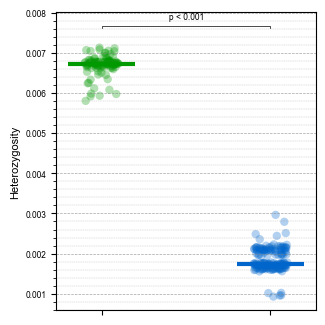

In [142]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

# === Figure size in cm (~10x10 cm) ===
cm = 1 / 2.54
plt.figure(figsize=(8*cm, 8*cm))

# === Define colors ===
palette = {"Mainland": "#009900", "Island": "#0066CC"}

# --- Grid setup ---
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()
plt.grid(
    which='minor',
    axis='y',   # horizontal minor lines only
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)

# --- Strip plot (dots in background) ---
ax = sns.stripplot(
    data=df_angsd,
    x='region',
    y='mean_100KB_het',
    hue='region',
    palette=palette,
    jitter=True,
    size=6,
    alpha=0.3,  # slightly transparent dots
    zorder=1,    # behind median lines
    dodge=False
)
ax.xaxis.set_tick_params(which='minor', bottom=False)  # remove minor x ticks

# --- Add median lines per Region ---
stats = df_angsd.groupby('region')['mean_100KB_het'].median().reindex(palette.keys())

for i, region in enumerate(stats.index):
    median = stats.loc[region]
    color = palette[region]
    
    ax.hlines(
        y=median,
        xmin=i - 0.2,
        xmax=i + 0.2,
        color=color,
        linewidth=3,
        zorder=2  # above dots
    )

# --- Axes labels and ticks ---
ax.set_ylabel("Heterozygosity", fontsize=8, fontproperties=arial_font)
ax.set_xlabel("")
ax.tick_params(axis='x', rotation=45)
plt.xticks(ticks=range(len(stats.index)), labels=[""]*len(stats.index), fontsize=6)
plt.yticks(fontsize=6)

# --- Optional: Statistical annotation ---
x1, x2 = 0, 1
y_max = df_angsd['mean_100KB_het'].max()
y = y_max + 0.0005  # start just above max value
h = 0.00005          # height of short vertical ticks
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=0.5, c='black')
ax.text((x1+x2)*0.5, y+h+0.0001, "p < 0.001", ha='center', va='bottom', color='black', fontsize=6, fontproperties=arial_font)

plt.tight_layout()
plt.savefig("Figure_3a_v1.svg", format="svg", dpi=300)
plt.show()


In [ ]:
color1 = "#208438"   # choose first color
color2 = "#479BC9"   # choose second color

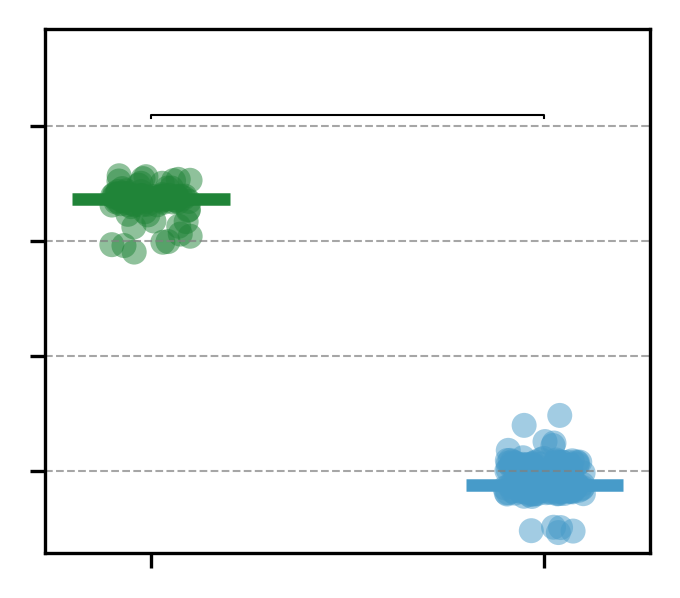

In [181]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# Font sizes (same system as other plots)
plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(6.75*cm, 6*cm), dpi=300)


# =========================
# Colors
# =========================
palette = {"Mainland": "#208438", "Island": "#479BC9"}


# =========================
# Grid
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
# ax.minorticks_on()

# ax.grid(
#     which='minor',
#     axis='y',
#     linestyle='--',
#     linewidth=0.3,
#     color='grey',
#     alpha=0.5
# )


# =========================
# Strip plot
# =========================
sns.stripplot(
    data=df_angsd,
    x='region',
    y='mean_100KB_het',
    hue='region',
    palette=palette,
    jitter=True,
    size=6,
    alpha=0.5,
    dodge=False,
    zorder=1,
    ax=ax
)

# remove duplicated legend


# =========================
# Median lines
# =========================
stats = df_angsd.groupby('region')['mean_100KB_het'].median().reindex(palette.keys())

for i, region in enumerate(stats.index):
    median = stats.loc[region]

    ax.hlines(
        y=median,
        xmin=i-0.2,
        xmax=i+0.2,
        color=palette[region],
        linewidth=3,
        zorder=2
    )


# =========================
# Axes labels
# =========================
# remove y axis completely
ax.set_ylabel("")
# keep grid but hide y tick labels and tick marks
ax.tick_params(axis='y', labelleft=False)


#ax.set_yticks([])
#ax.spines['left'].set_visible(False)
ax.set_xlabel("")



# =========================
# Tick styling
# =========================
ax.tick_params(axis='x', rotation=45, pad=4)
ax.tick_params(axis='y', pad=4)

plt.xticks(ticks=range(len(stats.index)), labels=[""]*len(stats.index))

# =========================
# Statistical annotation
# =========================
x1, x2 = 0, 1
y_max = df_angsd['mean_100KB_het'].max()

y = y_max + 0.001
h = 0.00005

ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=0.5, c='black')

ax.text(
    (x1+x2)*0.5,
    y+h+0.0004,
    "",
    ha='center',
    va='bottom',
    fontsize=6,
    fontproperties=arial_font
)

# add space above the annotation
ax.set_ylim(top=y + h + 0.0015)


# =========================
# Layout control (same style)
# =========================
ax.set_position([0.18, 0.18, 0.76, 0.74])


# =========================
# Save
# =========================
fig.canvas.draw()

plt.savefig(
    "Figure_3a_v1.svg",
    format="svg",
    dpi=300
)

plt.show()

/tmp/ipykernel_1696330/3131692249.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.stripplot(


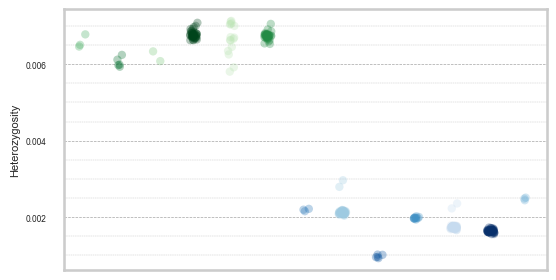

In [259]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# === Load Arial font ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]

# === Figure size in cm (~10x10 cm) ===
cm = 1 / 2.54
plt.figure(figsize=(15*cm, 8*cm))

# === Define colors ===
palette = {"Mainland": "#009900", "Island": "#0066CC"}

# --- Grid setup ---
plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)  # major grid
plt.minorticks_on()
plt.grid(
    which='minor',
    axis='y',   # horizontal minor lines only
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)

# --- Strip plot (dots in background) ---
ax = sns.stripplot(
    data=df_angsd,
    x='population',
    y='mean_100KB_het',
    order=desired_order,
    palette=color_map,
    jitter=True,
    size=6,
    alpha=0.3,  # slightly transparent dots
    zorder=1,    # behind median lines
    dodge=False
)
ax.xaxis.set_tick_params(which='minor', bottom=False)  # remove minor x ticks


# --- Axes labels and ticks ---
ax.set_ylabel("Heterozygosity", fontsize=8, fontproperties=arial_font)
ax.set_xlabel("")
ax.tick_params(axis='x', rotation=45)
plt.xticks(ticks=range(len(stats.index)), labels=[""]*len(stats.index), fontsize=6)
plt.yticks(fontsize=6)

# --- Optional: Statistical annotation ---

plt.tight_layout()
#plt.savefig("Figure_3a_v1.svg", format="svg", dpi=300)
plt.show()


/tmp/ipykernel_1696330/3061034394.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


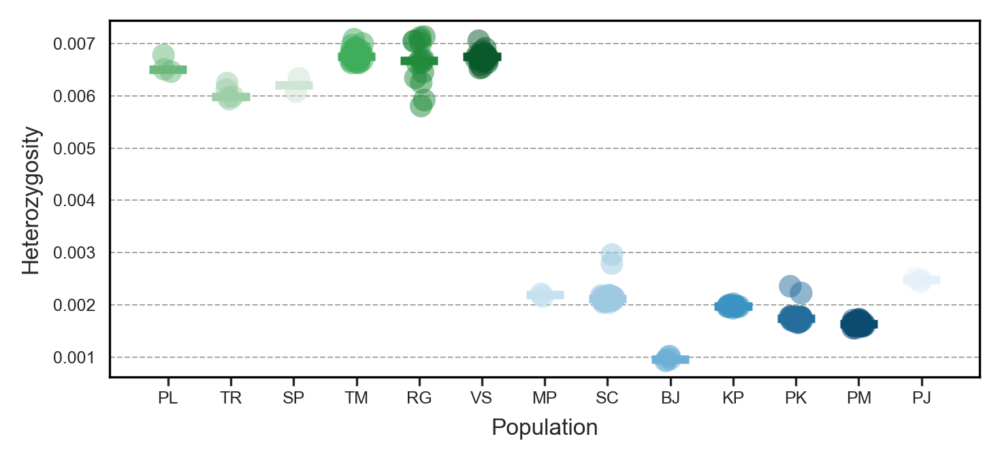

In [273]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# =========================
# Load and register Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

# Font sizes (same system as other figures)
plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Colors and order
# =========================
color_map = {
    'PJ':'#E4F1F8','MP': '#C5E1EF','KP': '#3A93C2','PM': '#0C4A70',
    'BJ': '#6CB0D6','SC': '#9EC9E2','PK': '#246D9C','VS': '#0A592A',
    'TM': '#3FAD5B','RG': '#218B3B','SP': '#CDE5D2','TR': '#9CCEA7','PL': '#6CB97D'
}

desired_order = ["PL", "TR", "SP", "TM", "RG", "VS", "MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]


# =========================
# Figure size
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 6*cm), dpi=300)


# =========================
# Grid
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

ax.grid(
    which='minor',
    axis='y',
    linestyle='--',
    linewidth=0.3,
    color='grey',
    alpha=0.5
)


# =========================
# Strip plot
# =========================
sns.stripplot(
    data=df_angsd,
    x='population',
    y='mean_100KB_het',
    palette=color_map,
    jitter=True,
    size=8,
    order=desired_order,
    alpha=0.5,
    zorder=1,
    ax=ax
)

ax.xaxis.set_tick_params(which='minor', bottom=False)


# =========================
# Median lines
# =========================
stats = df_angsd.groupby('population')['mean_100KB_het'].median().reindex(desired_order)

for i, pop in enumerate(desired_order):

    ax.hlines(
        y=stats.loc[pop],
        xmin=i-0.3,
        xmax=i+0.3,
        color=color_map[pop],
        linewidth=3,
        zorder=2
    )


# --- Y axis cleanup ---
#ax.set_ylabel("")
ax.tick_params(
    axis='y',
    which='major',
    length=3,        # shorter ticks
    width=0.8,       # thinner
    direction='out', # cleaner look
    pad=2
)

ax.tick_params(
    axis='x',
    which='major',
    bottom=True,
    length=3,
    width=0.8,
    direction='out',
    pad=2
)

ax.set_xlabel("Population")
ax.set_ylabel("Heterozygosity")

# --- Black spines ---
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color("black")
    spine.set_linewidth(0.8)

# =========================
# Layout (IDENTICAL)
# =========================
ax.set_position([0.10, 0.18, 0.88, 0.74])


# =========================
# Save
# =========================
fig.canvas.draw()

plt.savefig(
    "Figure_S2.png",
    format="png",
    dpi=300
)

plt.show()

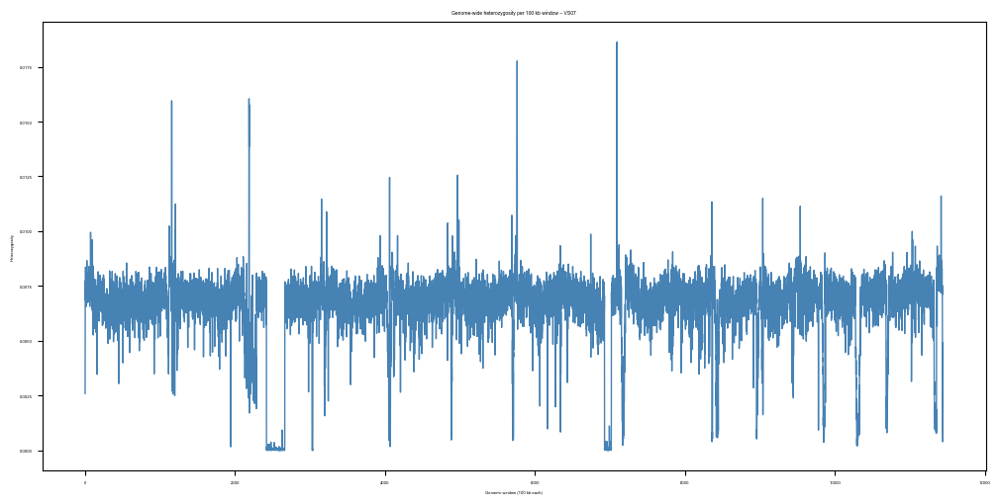

In [138]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Folder and individual
angsd_path = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/angsd/'
indiv = 'VS07'

# Path to the file
het_file = os.path.join(angsd_path, f'{indiv}_100KB.het.txt')

# Load data
df = pd.read_csv(het_file, delim_whitespace=True, header=None, names=['het', 'sample'])

# Plot
plt.figure(figsize=(10,5))
plt.plot(df['het'], color='steelblue', lw=1)
plt.xlabel('Genomic window (100 kb each)')
plt.ylabel('Heterozygosity')
plt.title(f'Genome-wide heterozygosity per 100 kb window – {indiv}')
plt.tight_layout()
plt.show()


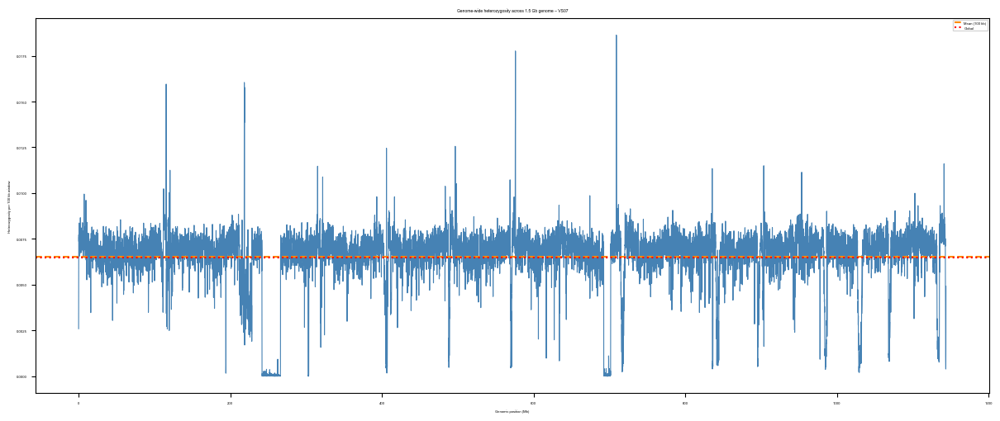

In [139]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np

# Folder and individual
angsd_path = '../results/population_analyses/rPodSic1.hap1.1/genetic_diversity/angsd/'
indiv = 'VS07'

# File paths
het_file = os.path.join(angsd_path, f'{indiv}_100KB.het.txt')
global_file = os.path.join(angsd_path, f'{indiv}_global.het.txt')

# Load data
df = pd.read_csv(het_file, delim_whitespace=True, header=None, names=['het', 'sample'])

# Approximate genomic midpoints (in Mb)
window_size = 100_000  # 100 kb
df['window_start_bp'] = np.arange(0, len(df)) * window_size
df['window_mid_Mb'] = (df['window_start_bp'] + window_size / 2) / 1e6

# Read global heterozygosity
with open(global_file) as f:
    global_het = float(f.readline().split()[0])

# Compute mean across windows
mean_het = df['het'].mean()

# Plot
plt.figure(figsize=(12,5))
plt.plot(df['window_mid_Mb'], df['het'], color='steelblue', lw=0.8)
plt.axhline(mean_het, color='darkorange', linestyle='--', label='Mean (100 kb)')
plt.axhline(global_het, color='red', linestyle=':', label='Global')

plt.xlabel('Genomic position (Mb)')
plt.ylabel('Heterozygosity per 100 kb window')
plt.title(f'Genome-wide heterozygosity across 1.5 Gb genome – {indiv}')
plt.legend()
plt.tight_layout()
plt.show()


### 7.3. Heterozygosity and ROHs comparisons

#### 7.3.1. Heterozygosity ROHan vs. ANGSD

In [ ]:
mergedH = pd.merge(
    df_angsd,
    hEst_df3,
    left_on="individual",
    right_on="Individual_ID",
    how="inner"
)
print(mergedH)

In [ ]:
plt.figure(figsize=(6,6))


sns.scatterplot(
    data=mergedH,
    x="mean_100KB_het", # het ANGSD
    y="Mean_h" # mean_h ROHan
)


plt.xlabel("het (ANGSD)")
plt.ylabel("Mean_h (ROHan)")
plt.tight_layout()
plt.show()

In [ ]:
corr = mergedH["mean_100KB_het"].corr(mergedH["Mean_h"]) # very good correlation!
print(f"Correlation between het ANGSD and ROHan mean h: {corr:.3f}")

#### 7.3.2. ROHan %genome vs. ANGSD het

In [ ]:
mergedH2 = pd.merge(
    df_angsd,
    rohan_df2,
    left_on="individual",
    right_on="individual",
    how="inner"
)
print(mergedH2)

In [ ]:
plt.figure(figsize=(6,6))


sns.scatterplot(
    data=mergedH2,
    x="mean_100KB_het", # het ANGSD
    y="segments_roh_percent_mid" # mean_h ROHan
)


plt.xlabel("het (ANGSD)")
plt.ylabel("%ROH (ROHan)")
plt.tight_layout()
plt.show()

In [ ]:
corr = mergedH2["mean_100KB_het"].corr(mergedH2["segments_in_roh_percent_mid"]) # okay correlation
print(f"Correlation between het ANGSD and ROHan %ROH: {corr:.3f}")

#### 7.3.3. bcftools ROH %genome vs. ANGSD het

In [67]:
mergedH3 = pd.merge(
    df_angsd,
    roh_per_ind,
    left_on="individual",
    right_on="Sample",
    how="inner"
)
print(mergedH3)

NameError: name 'roh_per_ind' is not defined

In [ ]:
plt.figure(figsize=(6,6))


sns.scatterplot(
    data=mergedH3,
    x="mean_100KB_het", # het ANGSD
    y="percent_genome_in_roh" # mean_h ROHan
)

plt.xlabel("het (ANGSD)")
plt.ylabel("%ROH (bcftools ROH)")
plt.tight_layout()
plt.show()

In [ ]:
corr = mergedH3["mean_100KB_het"].corr(mergedH3["percent_genome_in_roh"]) # very good correlation
print(f"Correlation between het ANGSD and bcftools %ROH: {corr:.3f}")

### 8.1. PHLASH all samples

In [34]:
metadata = [
    {"name": "Island BJ", "output_dir": "results/BJ"},
    {"name": "Island KP", "output_dir": "results/KP"},
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island PJ", "output_dir": "results/PJ"},
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
    {"name": "Island SC (all years)", "output_dir": "results/SC_all"},
    {"name": "Mainland HR", "output_dir": "results/HR"},
    {"name": "Mainland IT", "output_dir": "results/IT"},
]


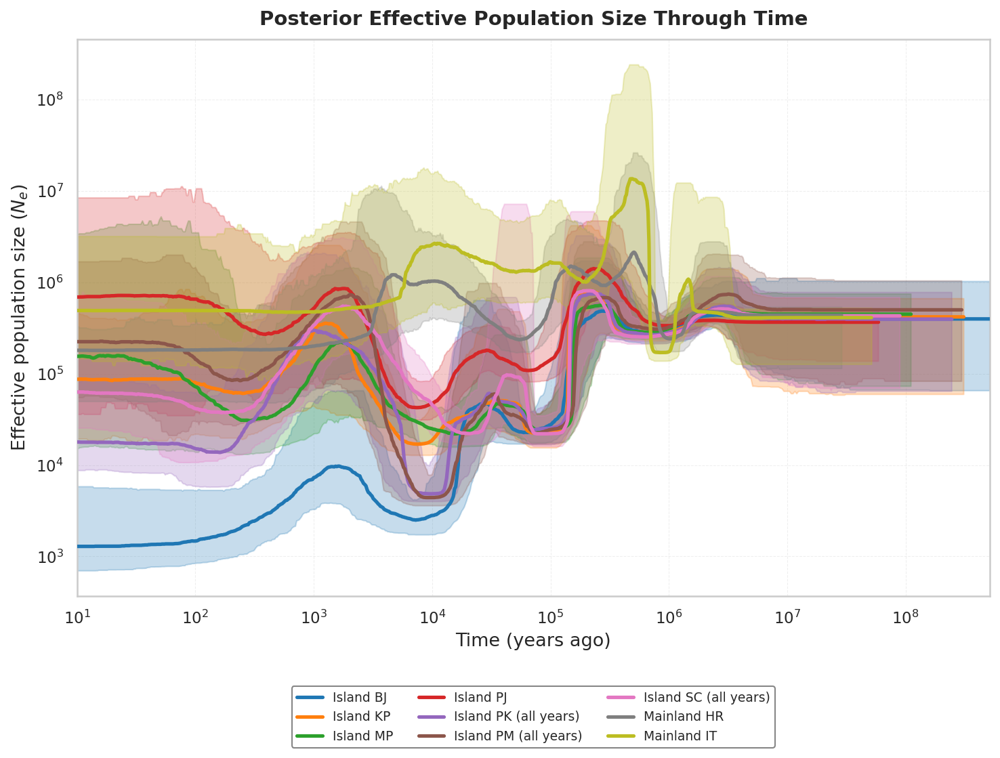

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.ticker import FuncFormatter

# --- Enhanced Style Configuration ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

# Create figure with single plot
fig, ax = plt.subplots(1, 1, figsize=(10, 7), dpi=150)

# Use tab10 palette - excellent for 9 distinguishable colors
colors = sns.color_palette("tab10", n_colors=9)

# Combine all files
all_files = metadata

max_time = 0
missing_files = []

def plot_population_data(ax, files, colors):
    """Helper function to plot data on a given axis"""
    global max_time
    
    for idx, file in enumerate(files):
        path = f"..//results/demographic_analyses/{file['output_dir']}/posterior_ne.npz"
        
        if not os.path.exists(path):
            missing_files.append(file['name'])
            continue
        
        try:
            data = np.load(path)
            x = data["times"] * 2
            y = np.quantile(data["ne"], 0.5, axis=0)
            y_low = np.quantile(data["ne"], 0.025, axis=0)
            y_high = np.quantile(data["ne"], 0.975, axis=0)
            
            max_time = max(max_time, x[-1])
            
            # Plot with distinct colors and improved styling
            color = colors[idx % len(colors)]
            ax.plot(x, y, lw=2.5, label=file["name"], color=color, zorder=3)
            ax.fill_between(x, y_low, y_high, alpha=0.25, color=color, zorder=2)
            
        except Exception as e:
            print(f"Error loading {file['name']}: {e}")
            missing_files.append(file['name'])

# Plot all populations
plot_population_data(ax, all_files, colors)

# Formatting
ax.set_yscale("log")
ax.set_xscale("symlog")
ax.set_ylabel("Effective population size ($N_e$)", fontsize=13, fontweight='medium')
ax.set_xlabel("Time (years ago)", fontsize=13, fontweight='medium')
ax.set_title("Posterior Effective Population Size Through Time", 
             fontsize=14, fontweight='bold', pad=10)

# Legend below the plot
ax.legend(frameon=True, fontsize=9, loc='upper center', framealpha=0.95,
          edgecolor='gray', fancybox=True, ncol=3, bbox_to_anchor=(0.5, -0.15))

ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)
ax.set_xlim(10, max_time)

# Tighter layout with extra space for legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# --- Save in multiple formats ---
plt.savefig("posterior_ne_all_islands.pdf", format="pdf", 
            bbox_inches="tight", dpi=300)
plt.savefig("posterior_ne_all_islands.png", format="png", 
            bbox_inches="tight", dpi=300)

# Report missing files if any
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

plt.show()

In [45]:
# --- Metadata ---
metadata = [
    {"name": "Island BJ", "output_dir": "results/BJ"},
    {"name": "Island KP", "output_dir": "results/KP"},
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island PJ", "output_dir": "results/PJ"},
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
    {"name": "Island SC (all years)", "output_dir": "results/SC_all"},
    {"name": "Mainland HR", "output_dir": "results/HR"},
    {"name": "Mainland IT", "output_dir": "results/IT"},
]

# --- Custom color scheme ---
color_map = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT will use this
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',  # HR will use this
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

# === Load Arial font from scratch ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

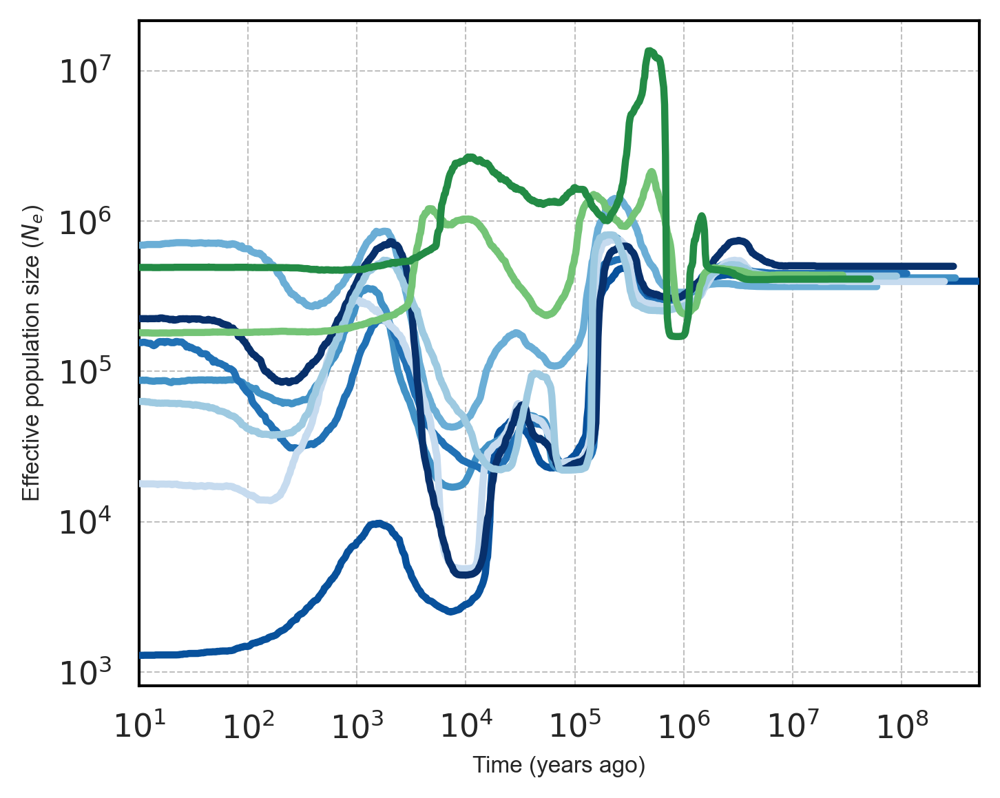

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.ticker import FuncFormatter


# --- Plot styling ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']
plt.rcParams['axes.labelsize'] = 3
plt.rcParams['axes.titlesize'] = 3

# Create figure
fig, ax = plt.subplots(1, 1, figsize=(5, 4), dpi=300)

max_time = 0
missing_files = []

def get_population_code(name):
    """Extracts population code from metadata name"""
    if "Island" in name:
        code = name.split("Island ")[1].split(" ")[0]
    elif "Mainland" in name:
        code = name.split("Mainland ")[1].split(" ")[0]
    else:
        code = name
    return code

def get_color(code):
    """Assign custom color for each population"""
    if code == "IT":
        return color_map["VS"]  # IT uses VS color
    elif code == "HR":
        return color_map["SP"]  # HR uses SP color
    else:
        # Handle "(all years)" variants like PK_all → PK
        base_code = code.replace("_all", "")
        return color_map.get(base_code, "#999999")  # default gray fallback

def plot_population_data(ax, files):
    """Helper function to plot data on a given axis"""
    global max_time
    # Grey background
    #ax.set_facecolor("#E5E4E2")
    # White dashed grid behind everything
    #ax.grid(True, color='white', linestyle='--', linewidth=0.7, alpha=1)
    #ax.set_axisbelow(True)
    
    for file in files:
        path = f"..//results/demographic_analyses/{file['output_dir']}/posterior_ne.npz"
        
        if not os.path.exists(path):
            missing_files.append(file["name"])
            continue
        
        try:
            data = np.load(path)
            x = data["times"] * 2
            y = np.quantile(data["ne"], 0.5, axis=0)
            #y_low = np.quantile(data["ne"], 0.025, axis=0)
            #y_high = np.quantile(data["ne"], 0.975, axis=0)
            
            max_time = max(max_time, x[-1])
            
            code = get_population_code(file["name"])
            color = get_color(code)
            
            ax.plot(x, y, lw=2.5, label=file["name"], color=color, zorder=3)
            #ax.fill_between(x, y_low, y_high, alpha=0.25, color=color, zorder=2)
            
        except Exception as e:
            print(f"Error loading {file['name']}: {e}")
            missing_files.append(file['name'])


plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.5)
# --- Plot all populations ---
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1)
plot_population_data(ax, metadata)


# --- Formatting ---
ax.set_yscale("log")
ax.set_xscale("symlog")
ax.set_ylabel("Effective population size ($N_e$)", fontsize=8, fontweight='medium', fontproperties=arial_font)
ax.set_xlabel("Time (years ago)", fontsize=8, fontweight='medium', fontproperties=arial_font)

# Legend below the plot
#ax.legend(frameon=True, fontsize=9, loc='upper center', framealpha=0.95,
#          edgecolor='gray', fancybox=True, ncol=3, bbox_to_anchor=(0.5, -0.15))


ax.set_axisbelow(True)
ax.set_xlim(10, max_time)


# Layout and save
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
#plt.savefig("posterior_ne_all_islands.pdf", format="pdf", bbox_inches="tight", dpi=300)
#plt.savefig("posterior_ne_all_islands.svg", format="svg", bbox_inches="tight", dpi=300)

# Missing file report
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

plt.show()


In [42]:
# --- Metadata ---
metadata = [
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
]

# --- Custom color scheme ---
color_map = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT will use this
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',  # HR will use this
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

# === Load Arial font from scratch ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

In [177]:
# --- Metadata ---
metadata = [
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Mainland IT", "output_dir": "results/IT"}]

# --- Custom color scheme ---
color_map = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT will use this
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',  # HR will use this
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

# === Load Arial font from scratch ===
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
arial_font = fm.FontProperties(fname=arial_path)
plt.rcParams['font.family'] = arial_font.get_name()

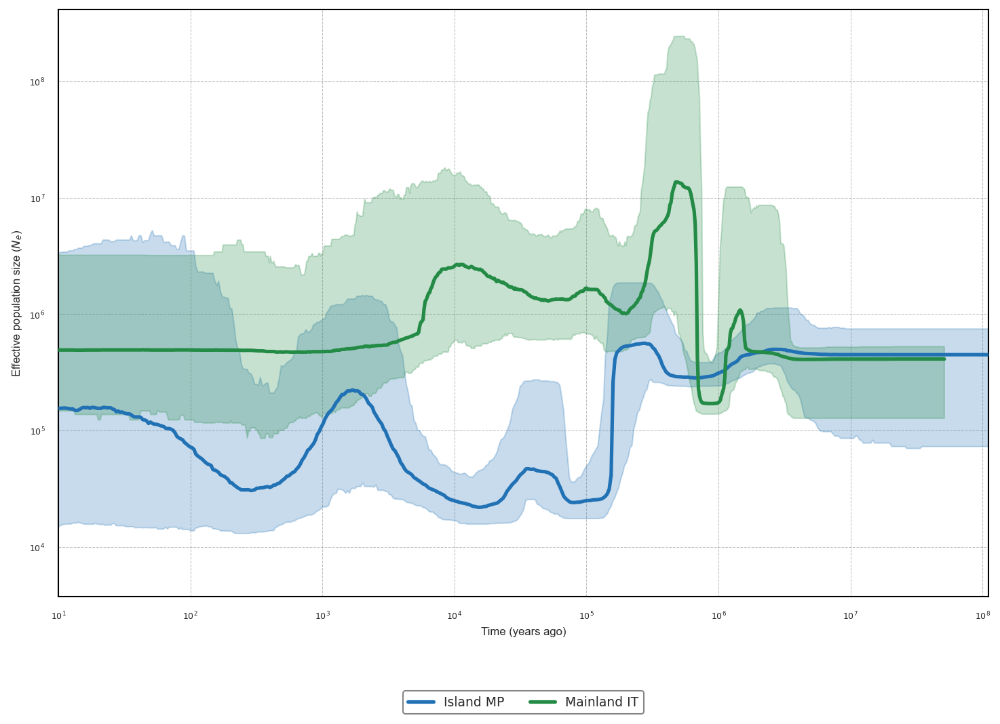

In [178]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.ticker import FuncFormatter


# --- Plot styling ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']
plt.rcParams['axes.labelsize'] = 6
plt.rcParams['axes.titlesize'] = 6

# Create figure
fig, ax = plt.subplots(1, 1, figsize=(10, 7), dpi=150)

max_time = 0
missing_files = []

def get_population_code(name):
    """Extracts population code from metadata name"""
    if "Island" in name:
        code = name.split("Island ")[1].split(" ")[0]
    elif "Mainland" in name:
        code = name.split("Mainland ")[1].split(" ")[0]
    else:
        code = name
    return code

def get_color(code):
    """Assign custom color for each population"""
    if code == "IT":
        return color_map["VS"]  # IT uses VS color
    elif code == "HR":
        return color_map["SP"]  # HR uses SP color
    else:
        # Handle "(all years)" variants like PK_all → PK
        base_code = code.replace("_all", "")
        return color_map.get(base_code, "#999999")  # default gray fallback

def plot_population_data(ax, files):
    """Helper function to plot data on a given axis"""
    global max_time
    # Grey background
    #ax.set_facecolor("#E5E4E2")
    # White dashed grid behind everything
    #ax.grid(True, color='white', linestyle='--', linewidth=0.7, alpha=1)
    #ax.set_axisbelow(True)
    
    for file in files:
        path = f"..//results/demographic_analyses/{file['output_dir']}/posterior_ne.npz"
        
        if not os.path.exists(path):
            missing_files.append(file["name"])
            continue
        
        try:
            data = np.load(path)
            x = data["times"] * 2
            y = np.quantile(data["ne"], 0.5, axis=0)
            y_low = np.quantile(data["ne"], 0.025, axis=0)
            y_high = np.quantile(data["ne"], 0.975, axis=0)
            
            max_time = max(max_time, x[-1])
            
            code = get_population_code(file["name"])
            color = get_color(code)
            
            ax.plot(x, y, lw=2.5, label=file["name"], color=color, zorder=3)
            ax.fill_between(x, y_low, y_high, alpha=0.25, color=color, zorder=2)
            
        except Exception as e:
            print(f"Error loading {file['name']}: {e}")
            missing_files.append(file['name'])


plt.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.5)
# --- Plot all populations ---
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1)
plot_population_data(ax, metadata)


# --- Formatting ---
ax.set_yscale("log")
ax.set_xscale("symlog")
ax.set_ylabel("Effective population size ($N_e$)", fontsize=8, fontweight='medium', fontproperties=arial_font)
ax.set_xlabel("Time (years ago)", fontsize=8, fontweight='medium', fontproperties=arial_font)

# Legend below the plot
ax.legend(frameon=True, fontsize=9, loc='upper center', framealpha=0.95,
          edgecolor='gray', fancybox=True, ncol=3, bbox_to_anchor=(0.5, -0.15))


ax.set_axisbelow(True)
ax.set_xlim(10, max_time)


# Layout and save
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
#plt.savefig("posterior_ne_all_islands.pdf", format="pdf", bbox_inches="tight", dpi=300)
#plt.savefig("posterior_ne_all_islands.svg", format="svg", bbox_inches="tight", dpi=300)

# Missing file report
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

plt.show()


### 8.2. PHLASH only 2024 samples

In [ ]:
metadata2 = [
    {"name": "Island PK (2024)", "output_dir": "results/PK_2024"},
    {"name": "Island PM (2024)", "output_dir": "results/PM_2024"},
    {"name": "Island SC (2024)", "output_dir": "results/SC_2024"},
    {"name": "Mainland HR", "output_dir": "results/TR"},
    {"name": "Mainland IT", "output_dir": "results/IT_2024"},
]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.ticker import FuncFormatter

# --- Enhanced Style Configuration ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

# Create figure with single plot
fig, ax = plt.subplots(1, 1, figsize=(10, 7), dpi=150)

# Use tab10 palette - excellent for 9 distinguishable colors
colors = sns.color_palette("tab10", n_colors=9)

# Combine all files
all_files = metadata2

max_time = 0
missing_files = []

def plot_population_data(ax, files, colors):
    """Helper function to plot data on a given axis"""
    global max_time
    
    for idx, file in enumerate(files):
        path = f"../results/demographic_analyses/{file['output_dir']}/posterior_ne.npz"
        
        if not os.path.exists(path):
            missing_files.append(file['name'])
            continue
        
        try:
            data = np.load(path)
            x = data["times"] * 2
            y = np.quantile(data["ne"], 0.5, axis=0)
            y_low = np.quantile(data["ne"], 0.025, axis=0)
            y_high = np.quantile(data["ne"], 0.975, axis=0)
            
            max_time = max(max_time, x[-1])
            
            # Plot with distinct colors and improved styling
            color = colors[idx % len(colors)]
            ax.plot(x, y, lw=2.5, label=file["name"], color=color, zorder=3)
            ax.fill_between(x, y_low, y_high, alpha=0.25, color=color, zorder=2)
            
        except Exception as e:
            print(f"Error loading {file['name']}: {e}")
            missing_files.append(file['name'])

# Plot all populations
plot_population_data(ax, all_files, colors)

# Formatting
ax.set_yscale("log")
ax.set_xscale("symlog")
ax.set_ylabel("Effective population size ($N_e$)", fontsize=13, fontweight='medium')
ax.set_xlabel("Time (years ago)", fontsize=13, fontweight='medium')
ax.set_title("Posterior Effective Population Size Through Time", 
             fontsize=14, fontweight='bold', pad=10)

# Legend below the plot
ax.legend(frameon=True, fontsize=9, loc='upper center', framealpha=0.95,
          edgecolor='gray', fancybox=True, ncol=3, bbox_to_anchor=(0.5, -0.15))

ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)
ax.set_xlim(100, max_time)

# Tighter layout with extra space for legend
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# --- Save in multiple formats ---
plt.savefig("posterior_ne_2024.pdf", format="pdf", 
            bbox_inches="tight", dpi=300)
plt.savefig("posterior_ne_2024.png", format="png", 
            bbox_inches="tight", dpi=300)

# Report missing files if any
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

plt.show()

### 8.3. PHLASH PLOTS

In [270]:
# ==============================
# CONFIGURATION
# ==============================

# --- Populations to include ---
METADATA = [
    {"name": "Island BJ", "output_dir": "results/BJ"},
    {"name": "Island KP", "output_dir": "results/KP"},
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island PJ", "output_dir": "results/PJ"},
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
    {"name": "Island SC (all years)", "output_dir": "results/SC_all"},
    {"name": "Mainland HR", "output_dir": "results/HR"},
    {"name": "Mainland IT", "output_dir": "results/IT"},
]

# --- Paths ---
BASE_RESULTS_DIR = "../results/demographic_analyses"
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

# --- Figure settings ---
FIGSIZE = (7,6)
DPI = 300
LINEWIDTH = 2.5

# --- Font sizes ---
LABEL_SIZE = 8
TICK_SIZE = 6
TITLE_SIZE = 8

# --- Axes scales & limits ---
X_SCALE = "symlog"
Y_SCALE = "log"
X_MIN = 10  # lower x-limit (years ago)
X_MAX = 10000000
# --- Grid & style ---
GRID_STYLE = dict(linestyle="--", linewidth=0.5, color="grey", alpha=0.5)

# --- Color scheme ---
COLOR_MAP = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT
    'SP': '#74C476',  # HR
}
DEFAULT_COLOR = "#999999"

# --- Global plot style ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})

arial_font = fm.FontProperties(fname=ARIAL_PATH)

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "axes.labelsize": LABEL_SIZE,
    "axes.titlesize": TITLE_SIZE,
    "xtick.labelsize": TICK_SIZE,
    "ytick.labelsize": TICK_SIZE,
})

# --- Major climatic transitions (years ago) ---
CLIMATE_EVENTS = [
    {
        "name": "LGM",
        "start": 19000,
        "end": 26000,
        "color": "#D3D3D3",
        "alpha": 0.75,
    },
    {
        "name": "PGM",
        "start": 130000,
        "end": 150000,
        "color": "#D3D3D3",
        "alpha": 0.75,
    },
    {
        "name": "MPT",
        "start": 550_000,
        "end": 1_250_000,
        "color": "#D3D3D3",
        "alpha": 0.75,
    },
]

SHOW_EVENT_LABELS = False
EVENT_LABEL_Y = 0.95   # axes fraction


In [272]:
def get_population_code(name):
    """Extract population code from metadata name."""
    if "Island" in name:
        return name.split("Island ")[1].split(" ")[0]
    if "Mainland" in name:
        return name.split("Mainland ")[1].split(" ")[0]
    return name


def get_color(code):
    """Return color for population code."""
    if code == "IT":
        return COLOR_MAP["VS"]
    if code == "HR":
        return COLOR_MAP["SP"]
    base_code = code.replace("_all", "")
    return COLOR_MAP.get(base_code, DEFAULT_COLOR)


def load_posterior_ne(path):
    """Load posterior Ne file and return time and median Ne."""
    data = np.load(path)
    times = data["times"] * 2
    ne_median = np.quantile(data["ne"], 0.5, axis=0)
    return times, ne_median

def plot_climate_events(ax):
    """Plot major climatic events as vertical bands."""
    for event in CLIMATE_EVENTS:
        ax.axvspan(
            event["start"],
            event["end"],
            color=event["color"],
            alpha=event["alpha"],
            zorder=0
        )

        if SHOW_EVENT_LABELS:
            x_mid = 0.5 * (event["start"] + event["end"])
            ax.text(
                x_mid,
                EVENT_LABEL_Y,
                event["name"],
                transform=ax.get_xaxis_transform(),
                ha="center",
                va="top",
                fontsize=TICK_SIZE,
                color="black"
            )

def plot_populations(ax, metadata):
    max_time = 0
    missing = []

    for pop in metadata:
        path = os.path.join(
            BASE_RESULTS_DIR,
            pop["output_dir"],
            "posterior_ne.npz"
        )

        if not os.path.exists(path):
            missing.append(pop["name"])
            continue

        try:
            x, y = load_posterior_ne(path)
            max_time = max(max_time, x[-1])

            code = get_population_code(pop["name"])
            color = get_color(code)

            ax.plot(
                x, y,
                lw=LINEWIDTH,
                color=color,
                label=pop["name"],
                zorder=3
            )

        except Exception as e:
            print(f"Error loading {pop['name']}: {e}")
            missing.append(pop["name"])

    return max_time, missing


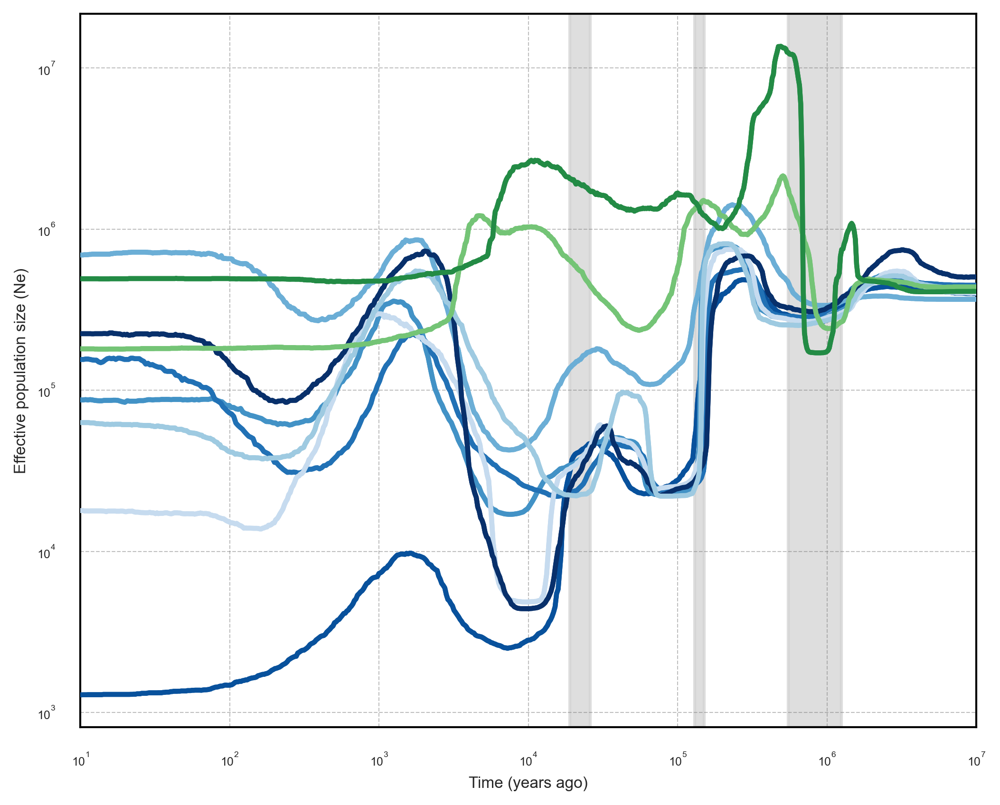

In [273]:
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI)
plot_climate_events(ax)          # ← includes LGM, PGM, MPT
max_time, missing = plot_populations(ax, METADATA)

# Grid & spines
ax.grid(True, **GRID_STYLE)
ax.set_axisbelow(True)
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# Plot data
max_time, missing_files = plot_populations(ax, METADATA)

# Axes formatting
ax.set_xscale(X_SCALE)
ax.set_yscale(Y_SCALE)
ax.set_xlim(X_MIN, X_MAX)

ax.set_xlabel("Time (years ago)", fontsize=8, fontproperties=arial_font)
ax.set_ylabel("Effective population size (Ne)", fontsize=8, fontproperties=arial_font)

# Layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# Optional legend
# ax.legend(ncol=3, frameon=True, fontsize=8, loc="upper center",
#           bbox_to_anchor=(0.5, -0.15))

# Report missing files
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")
plt.savefig("posterior_ne_all_islands.svg", format="svg", bbox_inches="tight", dpi=300)
plt.show()



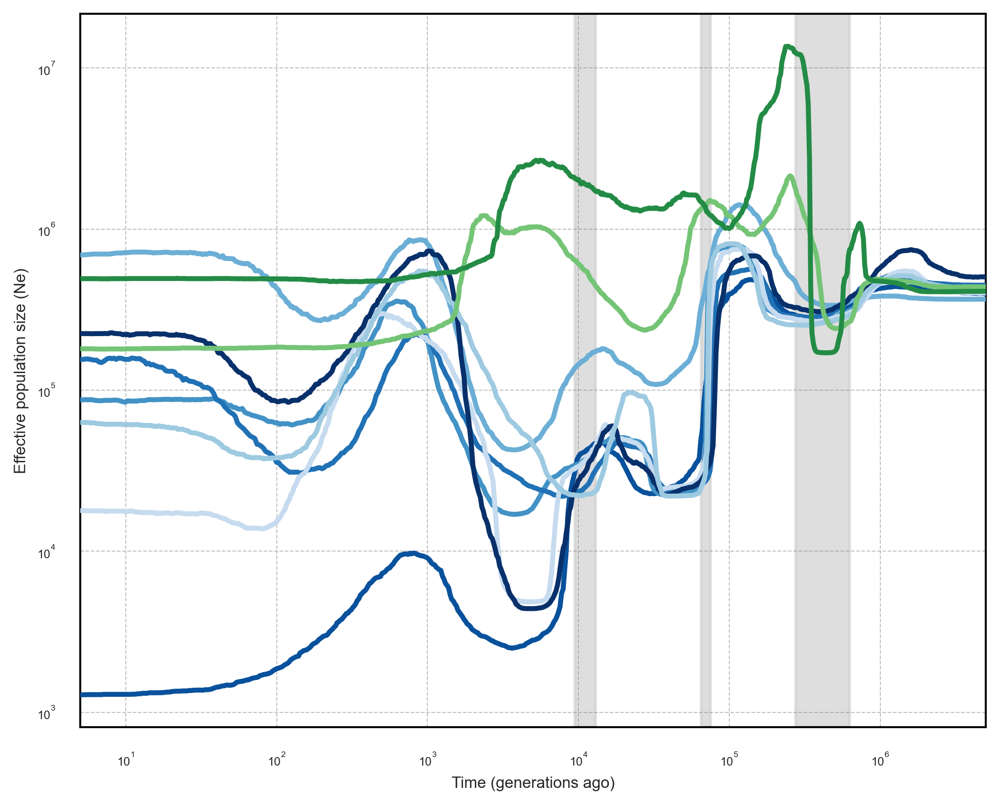

In [274]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# ==============================
# CONFIGURATION
# ==============================

GEN_TIME = 2  # years per generation

# --- Populations to include ---
METADATA = [
    {"name": "Island BJ", "output_dir": "results/BJ"},
    {"name": "Island KP", "output_dir": "results/KP"},
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island PJ", "output_dir": "results/PJ"},
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
    {"name": "Island SC (all years)", "output_dir": "results/SC_all"},
    {"name": "Mainland HR", "output_dir": "results/HR"},
    {"name": "Mainland IT", "output_dir": "results/IT"},
]

# --- Paths ---
BASE_RESULTS_DIR = "../results/demographic_analyses"
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

# --- Figure settings ---
FIGSIZE = (7, 6)
DPI = 300
LINEWIDTH = 2.5

# --- Font sizes ---
LABEL_SIZE = 8
TICK_SIZE = 6
TITLE_SIZE = 8

# --- Axes scales & limits (NOW IN GENERATIONS) ---
X_SCALE = "symlog"
Y_SCALE = "log"
X_MIN = 10 / GEN_TIME
X_MAX = 10000000 / GEN_TIME

# --- Grid & style ---
GRID_STYLE = dict(linestyle="--", linewidth=0.5, color="grey", alpha=0.5)

# --- Color scheme ---
COLOR_MAP = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT
    'SP': '#74C476',  # HR
}
DEFAULT_COLOR = "#999999"

# --- Global plot style ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})

arial_font = fm.FontProperties(fname=ARIAL_PATH)

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "axes.labelsize": LABEL_SIZE,
    "axes.titlesize": TITLE_SIZE,
    "xtick.labelsize": TICK_SIZE,
    "ytick.labelsize": TICK_SIZE,
})

# --- Major climatic transitions (years ago) ---
CLIMATE_EVENTS = [
    {"name": "LGM", "start": 19000, "end": 26000, "color": "#D3D3D3", "alpha": 0.75},
    {"name": "PGM", "start": 130000, "end": 150000, "color": "#D3D3D3", "alpha": 0.75},
    {"name": "MPT", "start": 550_000, "end": 1_250_000, "color": "#D3D3D3", "alpha": 0.75},
]

SHOW_EVENT_LABELS = False
EVENT_LABEL_Y = 0.95


# ==============================
# FUNCTIONS
# ==============================

def get_population_code(name):
    if "Island" in name:
        return name.split("Island ")[1].split(" ")[0]
    if "Mainland" in name:
        return name.split("Mainland ")[1].split(" ")[0]
    return name


def get_color(code):
    if code == "IT":
        return COLOR_MAP["VS"]
    if code == "HR":
        return COLOR_MAP["SP"]
    base_code = code.replace("_all", "")
    return COLOR_MAP.get(base_code, DEFAULT_COLOR)


def load_posterior_ne(path):
    """Return time in generations (NOT years)."""
    data = np.load(path)
    times = data["times"]  # already in generations
    ne_median = np.quantile(data["ne"], 0.5, axis=0)
    return times, ne_median


def plot_climate_events(ax):
    """Convert climate events from years → generations."""
    for event in CLIMATE_EVENTS:
        start = event["start"] / GEN_TIME
        end = event["end"] / GEN_TIME

        ax.axvspan(
            start,
            end,
            color=event["color"],
            alpha=event["alpha"],
            zorder=0
        )

        if SHOW_EVENT_LABELS:
            x_mid = 0.5 * (start + end)
            ax.text(
                x_mid,
                EVENT_LABEL_Y,
                event["name"],
                transform=ax.get_xaxis_transform(),
                ha="center",
                va="top",
                fontsize=TICK_SIZE,
                color="black"
            )


def plot_populations(ax, metadata):
    max_time = 0
    missing = []

    for pop in metadata:
        path = os.path.join(
            BASE_RESULTS_DIR,
            pop["output_dir"],
            "posterior_ne.npz"
        )

        if not os.path.exists(path):
            missing.append(pop["name"])
            continue

        try:
            x, y = load_posterior_ne(path)
            max_time = max(max_time, x[-1])

            code = get_population_code(pop["name"])
            color = get_color(code)

            ax.plot(
                x, y,
                lw=LINEWIDTH,
                color=color,
                label=pop["name"],
                zorder=3
            )

        except Exception as e:
            print(f"Error loading {pop['name']}: {e}")
            missing.append(pop["name"])

    return max_time, missing


# ==============================
# PLOT
# ==============================

fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI)

plot_climate_events(ax)
max_time, missing_files = plot_populations(ax, METADATA)

# Grid & spines
ax.grid(True, **GRID_STYLE)
ax.set_axisbelow(True)

for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# Axes formatting
ax.set_xscale(X_SCALE)
ax.set_yscale(Y_SCALE)
ax.set_xlim(X_MIN, X_MAX)

ax.set_xlabel("Time (generations ago)", fontsize=8, fontproperties=arial_font)
ax.set_ylabel("Effective population size (Ne)", fontsize=8, fontproperties=arial_font)

# Layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# Optional legend
# ax.legend(ncol=3, frameon=True, fontsize=8, loc="upper center",
#           bbox_to_anchor=(0.5, -0.15))

# Report missing files
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

# Save
plt.savefig("posterior_ne_all_islands_generations.svg", format="svg", bbox_inches="tight", dpi=300)

plt.show()

In [277]:
color_map = {
    'PJ':'#E4F1F8',
    'MP': '#C5E1EF',
    'KP': '#3A93C2',
    'PM': '#0C4A70',
    'BJ': '#6CB0D6',
    'SC': '#9EC9E2',
    'PK': '#246D9C',
    'VS': '#0A592A',
    'TM': '#3FAD5B',
    'RG': '#218B3B',
    'SP': '#CDE5D2',
    'TR': '#9CCEA7',
    'PL': '#6CB97D',
    'IT': '#218B3B',
    'HR': '#9CCEA7'
}

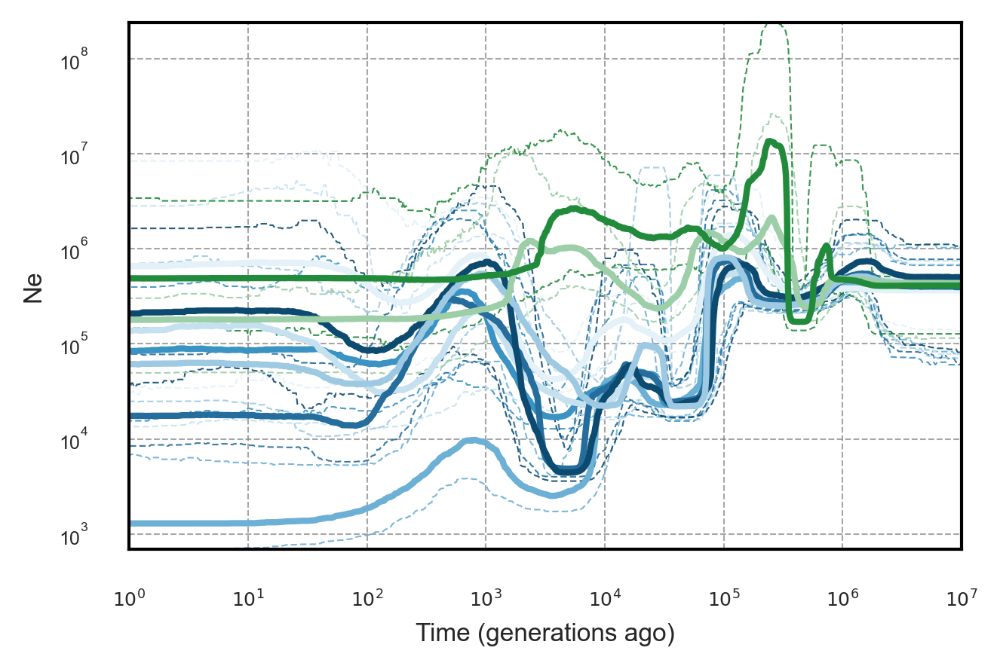

In [279]:
# =========================
# Load and register Arial
# =========================
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import numpy as np
import os

arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Figure size (match style)
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 8*cm), dpi=300)


# =========================
# Grid (same as strip plot)
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
ax.set_axisbelow(True)


# =========================
# Load function with CI
# =========================
def load_posterior_ne(path):
    data = np.load(path)
    times = data["times"]

    ne = data["ne"]

    median = np.quantile(ne, 0.5, axis=0)
    low = np.quantile(ne, 0.025, axis=0)
    high = np.quantile(ne, 0.975, axis=0)

    return times, median, low, high


# =========================
# Plot populations
# =========================
for pop in METADATA:
    path = os.path.join(
        BASE_RESULTS_DIR,
        pop["output_dir"],
        "posterior_ne.npz"
    )

    if not os.path.exists(path):
        continue

    x, y, y_low, y_high = load_posterior_ne(path)

    code = get_population_code(pop["name"])
    color = color_map.get(code.replace("_all", ""), "#999999")

    # --- 95% CI (dashed, thinner, behind) ---
    ax.plot(
        x, y_low,
        color=color,
        linewidth=0.5,
        linestyle=(0, (4, 2)),  # cleaner than "--"
        alpha=0.9,
        zorder=1
    )

    ax.plot(
        x, y_high,
        color=color,
        linewidth=0.5,
        linestyle=(0, (4, 2)),
        alpha=0.9,
        zorder=1
    )

    # --- Median (dominant line) ---
    ax.plot(
        x, y,
        color=color,
        linewidth=2,
        zorder=2
    )


# =========================
# Axes
# =========================
ax.set_xscale("log")
ax.set_yscale("log")

# --- Force exact limits ---
ax.set_xlim(1, 1e7)
# optional: control y if needed
# ax.set_ylim(1e2, 1e6)

# --- Remove padding ---
ax.margins(x=0, y=0)

# --- Clean log ticks (publication style) ---
ax.set_xticks([1, 10, 100, 1e3, 1e4, 1e5, 1e6, 1e7])
ax.set_xticklabels([
    r"$10^0$", r"$10^1$", r"$10^2$", r"$10^3$",
    r"$10^4$", r"$10^5$", r"$10^6$", r"$10^7$"
])

# Optional: cleaner y ticks too
# ax.set_yticks([1e2, 1e3, 1e4, 1e5, 1e6])
# ax.set_yticklabels([r"$10^2$", r"$10^3$", r"$10^4$", r"$10^5$", r"$10^6$"])

ax.set_xlabel("Time (generations ago)")
ax.set_ylabel("Ne")

ax.tick_params(axis='x', pad=4)
ax.tick_params(axis='y', pad=4)


# =========================
# Spines (clean, like your style)
# =========================
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")


# =========================
# Layout (match your margins)
# =========================
ax.set_position([0.18, 0.18, 0.76, 0.74])


# =========================
# Save
# =========================
plt.savefig(
    "posterior_ne_clean.svg",
    format="svg",
    dpi=300
)

plt.show()

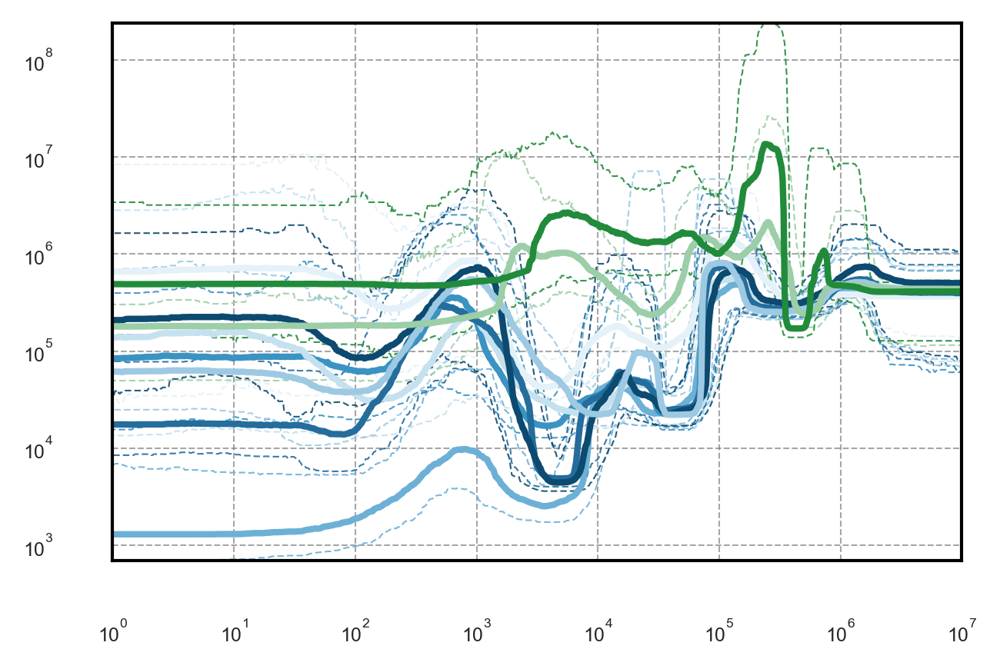

In [290]:
# =========================
# Load and register Arial
# =========================
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import numpy as np
import os

arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Figure size (match style)
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 8*cm), dpi=300)


# =========================
# Grid (same as strip plot)
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
ax.set_axisbelow(True)


# =========================
# Load function with CI
# =========================
def load_posterior_ne(path):
    data = np.load(path)
    times = data["times"]

    ne = data["ne"]

    median = np.quantile(ne, 0.5, axis=0)
    low = np.quantile(ne, 0.025, axis=0)
    high = np.quantile(ne, 0.975, axis=0)

    return times, median, low, high


# =========================
# Plot populations
# =========================
for pop in METADATA:
    path = os.path.join(
        BASE_RESULTS_DIR,
        pop["output_dir"],
        "posterior_ne.npz"
    )

    if not os.path.exists(path):
        continue

    x, y, y_low, y_high = load_posterior_ne(path)

    code = get_population_code(pop["name"])
    color = color_map.get(code.replace("_all", ""), "#999999")

    # --- 95% CI (dashed, thinner, behind) ---
    ax.plot(
        x, y_low,
        color=color,
        linewidth=0.5,
        linestyle=(0, (4, 2)),  # cleaner than "--"
        alpha=0.9,
        zorder=1
    )

    ax.plot(
        x, y_high,
        color=color,
        linewidth=0.5,
        linestyle=(0, (4, 2)),
        alpha=0.9,
        zorder=1
    )

    # --- Median (dominant line) ---
    ax.plot(
        x, y,
        color=color,
        linewidth=2,
        zorder=2
    )


# =========================
# Axes
# =========================
ax.set_xscale("log")
ax.set_yscale("log")

# --- Force exact limits ---
ax.set_xlim(1, 1e7)
# optional: control y if needed
# ax.set_ylim(1e2, 1e6)

# --- Remove padding ---
ax.margins(x=0, y=0)

# =========================
# Remove labels but keep ticks
# =========================

# Remove axis labels
ax.set_xlabel("")
ax.set_ylabel("")

# --- Force visible ticks ---
ax.minorticks_on()
ax.tick_params(
    axis='both',
    which='major',
    length=15,      # THIS is the key
    width=0.8,
    direction='out',
    color='black',
)




# =========================
# Spines (clean, like your style)
# =========================
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")


# =========================
# Layout (match your margins)
# =========================
ax.set_position([0.18, 0.18, 0.76, 0.74])


# =========================
# Save
# =========================
plt.savefig(
    "posterior_ne_clean.svg",
    format="svg",
    dpi=300
)

plt.show()

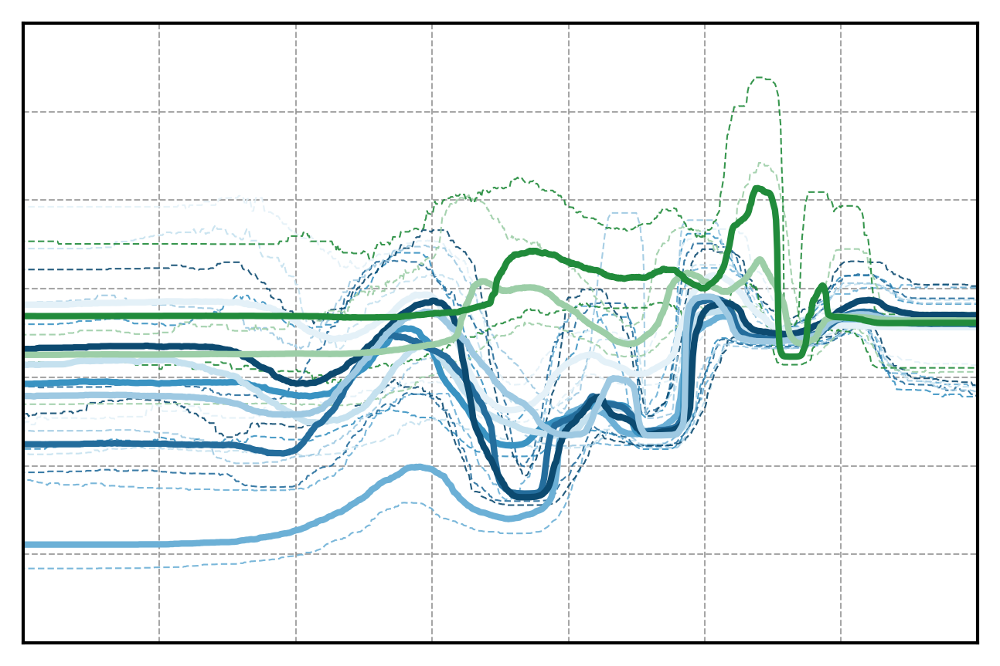

In [295]:
# =========================
# Load and register Arial
# =========================
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker
import seaborn as sns
import numpy as np
import os

arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6


# =========================
# Figure size (match style)
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 8*cm), dpi=300)


# =========================
# Grid (same as strip plot)
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
ax.set_axisbelow(True)


# =========================
# Load function with CI
# =========================
def load_posterior_ne(path):
    data = np.load(path)
    times = data["times"]
    ne = data["ne"]

    median = np.quantile(ne, 0.5, axis=0)
    low = np.quantile(ne, 0.025, axis=0)
    high = np.quantile(ne, 0.975, axis=0)

    return times, median, low, high


# =========================
# Plot populations
# =========================
for pop in METADATA:
    path = os.path.join(
        BASE_RESULTS_DIR,
        pop["output_dir"],
        "posterior_ne.npz"
    )

    if not os.path.exists(path):
        continue

    x, y, y_low, y_high = load_posterior_ne(path)

    code = get_population_code(pop["name"])
    color = color_map.get(code.replace("_all", ""), "#999999")

    # --- 95% CI ---
    ax.plot(
        x, y_low,
        color=color,
        linewidth=0.5,
        linestyle=(0, (4, 2)),
        alpha=0.9,
        zorder=1
    )

    ax.plot(
        x, y_high,
        color=color,
        linewidth=0.5,
        linestyle=(0, (4, 2)),
        alpha=0.9,
        zorder=1
    )

    # --- Median ---
    ax.plot(
        x, y,
        color=color,
        linewidth=2,
        zorder=2
    )


# =========================
# Axes (CRITICAL FIXES HERE)
# =========================
ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlim(1, 1e7)
ax.set_ylim(1e2, 1e9)
ax.margins(x=0, y=0)

# --- FORCE ticks to exist ---
ax.xaxis.set_major_locator(mticker.LogLocator(base=10))
ax.yaxis.set_major_locator(mticker.LogLocator(base=10))

ax.xaxis.set_minor_locator(mticker.LogLocator(base=10, subs='auto'))
ax.yaxis.set_minor_locator(mticker.LogLocator(base=10, subs='auto'))

# --- Remove labels but KEEP ticks ---
ax.set_xlabel("")
ax.set_ylabel("")

ax.tick_params(
    axis='both',
    which='major',
    length=4,
    width=0.8,
    direction='out',
    labelbottom=False,
    labelleft=False
)

ax.tick_params(
    axis='both',
    which='minor',
    length=2,
    width=0.6,
    direction='out'
)


# =========================
# Spines
# =========================
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")


# =========================
# Layout
# =========================
ax.set_position([0.10, 0.10, 0.85, 0.85])


# =========================
# Save
# =========================
plt.savefig(
    "posterior_ne_clean.svg",
    format="svg",
    dpi=300
)

plt.show()

/tmp/ipykernel_2116836/127089504.py:112: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.axvspan(


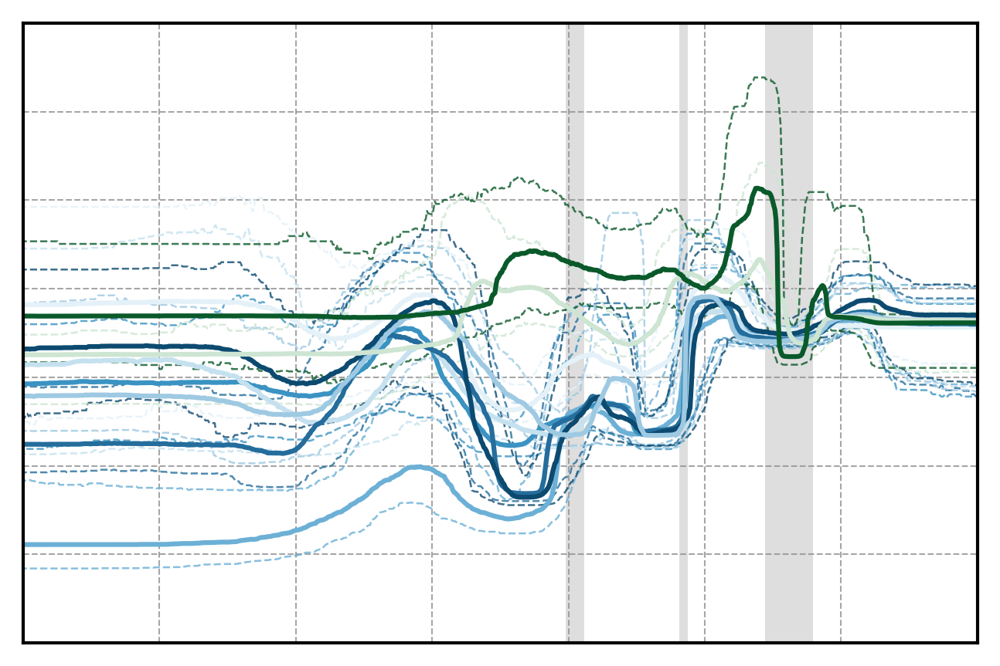

In [6]:
# ==============================
# CONFIGURATION
# ==============================

GEN_TIME = 2  # years per generation

METADATA = [
    {"name": "Island BJ", "output_dir": "results/BJ"},
    {"name": "Island KP", "output_dir": "results/KP"},
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island PJ", "output_dir": "results/PJ"},
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
    {"name": "Island SC (all years)", "output_dir": "results/SC_all"},
    {"name": "Mainland HR", "output_dir": "results/HR"},
    {"name": "Mainland IT", "output_dir": "results/IT"},
]

BASE_RESULTS_DIR = "../results/demographic_analyses"
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

# =========================
# Style
# =========================
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})

fm.fontManager.addfont(ARIAL_PATH)
arial = fm.FontProperties(fname=ARIAL_PATH)
arial_name = arial.get_name()

plt.rcParams.update({
    "font.family": arial_name,
    "font.size": 6,
    "axes.labelsize": 8,
    "xtick.labelsize": 6,
    "ytick.labelsize": 6,
})

# =========================
# Colors
# =========================
COLOR_MAP = {
    'PJ':'#E4F1F8',
    'MP': '#C5E1EF',
    'KP': '#3A93C2',
    'PM': '#0C4A70',
    'BJ': '#6CB0D6',
    'SC': '#9EC9E2',
    'PK': '#246D9C',
    'VS': '#0A592A',
    'TM': '#3FAD5B',
    'RG': '#218B3B',
    'SP': '#CDE5D2',
    'TR': '#9CCEA7',
    'PL': '#6CB97D',
    'IT': '#218B3B',
    'HR': '#9CCEA7'
}
DEFAULT_COLOR = "#999999"

# =========================
# Climate events (years)
# =========================
CLIMATE_EVENTS = [
    {"name": "LGM", "start": 19000, "end": 26000},
    {"name": "PGM", "start": 130000, "end": 150000},
    {"name": "MPT", "start": 550000, "end": 1250000},
]

SHOW_EVENT_LABELS = False

# =========================
# Helpers
# =========================
def get_population_code(name):
    if "Island" in name:
        return name.split("Island ")[1].split(" ")[0]
    if "Mainland" in name:
        return name.split("Mainland ")[1].split(" ")[0]
    return name

def get_color(code):
    if code == "IT":
        return COLOR_MAP["VS"]
    if code == "HR":
        return COLOR_MAP["SP"]
    return COLOR_MAP.get(code.replace("_all", ""), DEFAULT_COLOR)

def load_posterior_ne(path):
    data = np.load(path)
    times = data["times"]
    ne = data["ne"]

    median = np.quantile(ne, 0.5, axis=0)
    low = np.quantile(ne, 0.025, axis=0)
    high = np.quantile(ne, 0.975, axis=0)

    return times, median, low, high

# =========================
# Plot
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(12.3*cm, 8*cm), dpi=300)

# --- Climate bands ---
# --- Climate bands ---
for event in CLIMATE_EVENTS:
    start = event["start"] / GEN_TIME
    end = event["end"] / GEN_TIME

    ax.axvspan(
        start,
        end,
        color="#949494",     # ← updated grey
        alpha=0.3,
        edgecolor='none',    # ← remove border
        linewidth=0,         # ← ensure no edge rendering
        zorder=1
    )

    if SHOW_EVENT_LABELS:
        ax.text(
            (start + end) / 2,
            0.92,
            event["name"],
            transform=ax.get_xaxis_transform(),
            ha="center",
            va="top",
            fontsize=6
        )

# --- Grid ---
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
ax.set_axisbelow(True)

# --- Plot populations ---
for pop in METADATA:
    path = os.path.join(
        BASE_RESULTS_DIR,
        pop["output_dir"],
        "posterior_ne.npz"
    )

    if not os.path.exists(path):
        continue

    x, y, y_low, y_high = load_posterior_ne(path)

    code = get_population_code(pop["name"])
    color = get_color(code)

    # CI
    ax.plot(x, y_low, color=color, lw=0.6, linestyle="--", alpha=0.8, zorder=2)
    ax.plot(x, y_high, color=color, lw=0.6, linestyle="--", alpha=0.8, zorder=2)

    # Median
    ax.plot(x, y, color=color, lw=1.5, zorder=3)

# =========================
# Axes (FIXED)
# =========================
ax.set_xscale("log")   # ← critical fix
ax.set_yscale("log")

ax.set_xlim(1, 1e7)
ax.set_ylim(1e2, 1e9)

# labels (kept minimal like your clean version)
ax.set_xlabel("")
ax.set_ylabel("")

#ax.tick_params(axis='both', which='major', length=4, width=0.8, direction='out')
#ax.tick_params(axis='both', which='minor', length=2, width=0.6, direction='out')
ax.tick_params(
    axis='both',
    which='both',
    labelbottom=False,
    labelleft=False
)

# =========================
# Spines
# =========================
# =========================
# Spines (black frame)
# =========================
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1)
    ax.spines[side].set_color("black")
for spine in ax.spines.values():
    spine.set_zorder(3)

# =========================
# Layout
# =========================
ax.set_position([0.10, 0.10, 0.85, 0.85])

# =========================
# Save
# =========================
plt.savefig("posterior_ne_with_climate.svg", format="svg", dpi=300)
plt.show()

### 8.4. split times plot

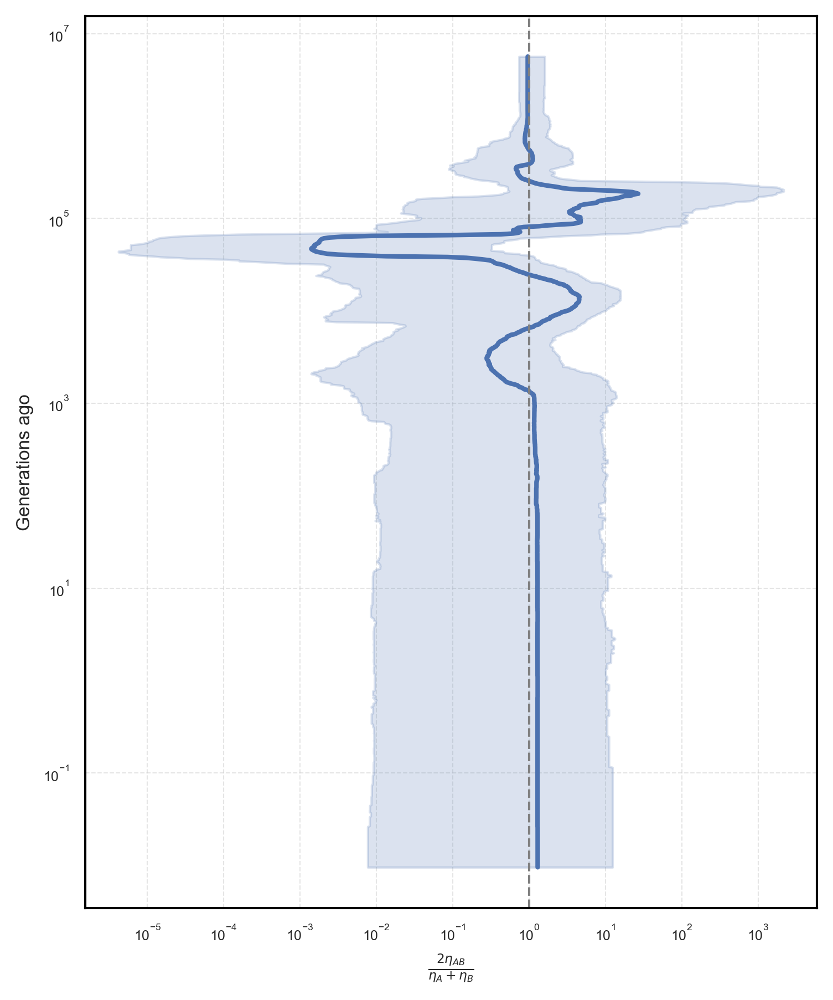

In [8]:
# =========================
# Mainland vs Island divergence timing (NO PICKLE)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import os

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

GROUP1 = "mainland_all"
GROUP2 = "islands_all"
POOLED = "mainland_island"

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Load data
# -------------------------
t1, ne1 = load_npz(GROUP1)
t2, ne2 = load_npz(GROUP2)
tp, ne_pooled = load_npz(POOLED)

# Use shared time grid (important!)
T = tp

# -------------------------
# Compute estimator
# -------------------------
estimator = 2 * ne_pooled / (ne1 + ne2)

median = np.quantile(estimator, 0.5, axis=0)
low = np.quantile(estimator, 0.025, axis=0)
high = np.quantile(estimator, 0.975, axis=0)

# -------------------------
# Plot
# -------------------------
fig, ax = plt.subplots(figsize=(5, 6), dpi=300)

# CI
ax.fill_betweenx(T, low, high, color="#4C72B0", alpha=0.2)

# Median
ax.plot(median, T, color="#4C72B0", linewidth=2)

# Reference line
ax.axvline(1, color="grey", linestyle="--", linewidth=1)

# Axes
ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel(r"$\frac{2\eta_{AB}}{\eta_A + \eta_B}$")
ax.set_ylabel("Generations ago")

# Clean look
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

plt.tight_layout()
plt.show()

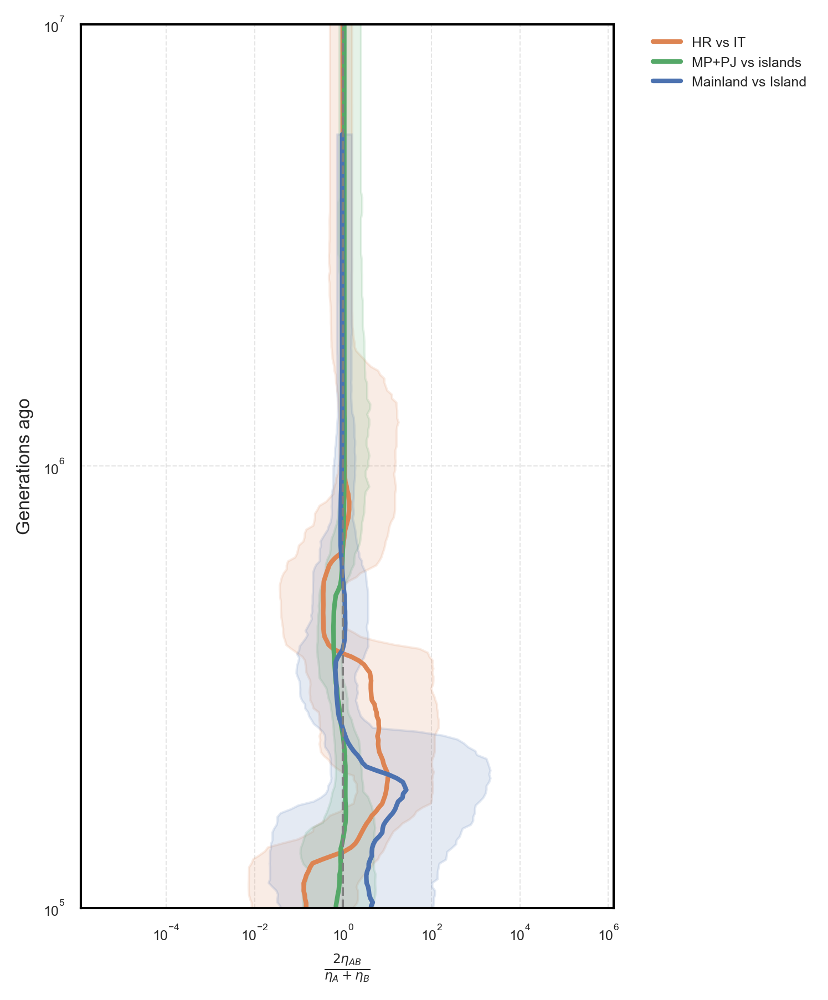

In [12]:
# =========================
# Multi divergence timing plot (NO PICKLE)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import os

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

COMPARISONS = [
    ("HR", "IT", "mainland_all", "HR vs IT", "#DD8452"),
    ("islands_MP_PJ", "islands_without_MP_PJ", "islands_all", "MP+PJ vs islands", "#55A868"),
    ("mainland_all", "islands_all", "mainland_island", "Mainland vs Island", "#4C72B0"),
]

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Plot function
# -------------------------
def plot_divergence(ax, g1, g2, pooled, label, color):

    _, ne1 = load_npz(g1)
    _, ne2 = load_npz(g2)
    T, ne_pooled = load_npz(pooled)

    estimator = 2 * ne_pooled / (ne1 + ne2)

    median = np.quantile(estimator, 0.5, axis=0)
    low = np.quantile(estimator, 0.025, axis=0)
    high = np.quantile(estimator, 0.975, axis=0)

    # CI
    ax.fill_betweenx(T, low, high, color=color, alpha=0.15)

    # Median
    ax.plot(median, T, color=color, linewidth=2, label=label)


# -------------------------
# Plot
# -------------------------
fig, ax = plt.subplots(figsize=(5, 6), dpi=300)

for g1, g2, pooled, label, color in COMPARISONS:
    plot_divergence(ax, g1, g2, pooled, label, color)

# Reference line
ax.axvline(1, color="grey", linestyle="--", linewidth=1)

# Axes
# Axes
ax.set_xscale("log")
ax.set_yscale("log")

# 🔥 ZOOM HERE
ax.set_ylim(1e5, 1e7)

ax.set_xlabel(r"$\frac{2\eta_{AB}}{\eta_A + \eta_B}$")
ax.set_ylabel("Generations ago")

# Style
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)

for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

ax.legend(frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()

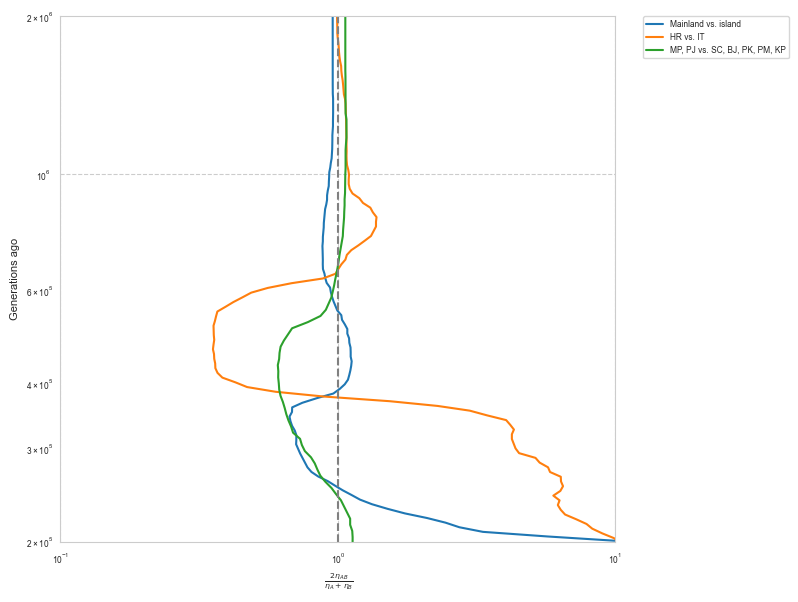

In [22]:
# =========================
# Recreate marimo split plot (NO PICKLE)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import os

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

COMPARISONS = [
    ("mainland_all", "islands_all", "mainland_island", "Mainland vs. island", "C0"),
    ("HR", "IT", "mainland_all", "HR vs. IT", "C1"),
    ("islands_MP_PJ", "islands_without_MP_PJ", "islands_all", "MP, PJ vs. SC, BJ, PK, PM, KP", "C2"),
    # ("PJ", "islands_without_MP_PJ", "islands_without_MP", "PJ vs. SC, BJ, PK, PM, KP", "C3"),
    # ("SC_all", "islands_without_MP_PJ_SC", "islands_without_MP_PJ", "SC vs. BJ, PK, PM, KP", "C4"),
    # ("SC_all", "islands_PK_PM", "islands_SC_PK_PM", "SC vs. PK, PM", "C5"),
    # ("SC_all", "KP", "islands_SC_KP", "SC vs. KP", "C6"),
    # ("SC_all", "BJ", "islands_SC_BJ", "SC vs. BJ", "C7"),
]

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Plot function (matches plot_split2)
# -------------------------
def plot_split(ax, g1, g2, pooled, label, color):

    _, ne1 = load_npz(g1)
    _, ne2 = load_npz(g2)
    T, ne_pooled = load_npz(pooled)

    estimator = 2 * ne_pooled / (ne1 + ne2)

    median = np.quantile(estimator, 0.5, axis=0)

    # NOTE: marimo version does NOT plot CI here
    ax.plot(median, T, color=color, label=label)


# -------------------------
# Plot
# -------------------------
fig, ax = plt.subplots(figsize=(8, 6))

for g1, g2, pooled, label, color in COMPARISONS:
    plot_split(ax, g1, g2, pooled, label, color)

# Reference line (same as original)
ax.axvline(1, color="grey", linestyle="--")

# Axes (same as marimo)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_ylim(2*1e5, 2*1e6)
ax.set_xlim(1e-1, +1e1)

ax.set_xlabel(r"$\ \frac{2\eta_{AB}}{\eta_{A}+\eta_{B}}$")
ax.set_ylabel("Generations ago")

# Limits (same implicit behavior)
# ax.set_ylim(T.min(), T.max())  # not strictly needed

# Legend (same placement)
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)

plt.tight_layout()
plt.savefig("split_times.pdf", dpi=300)
plt.show()

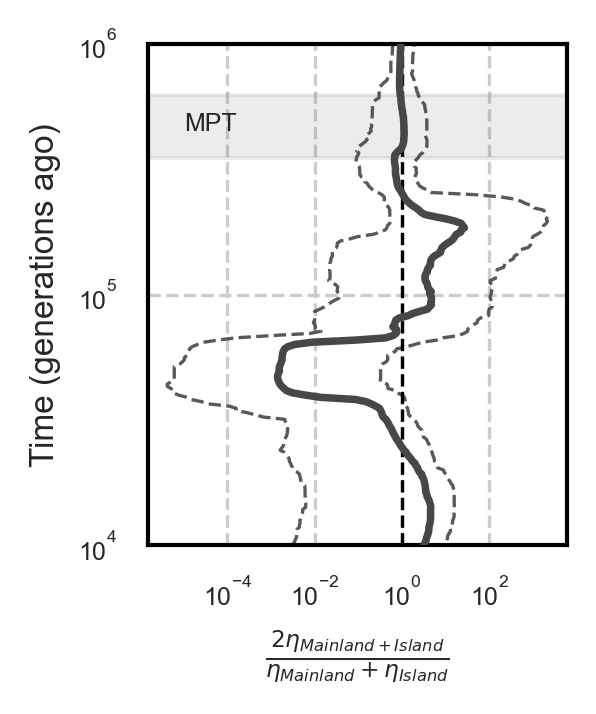

In [54]:
# =========================
# Split plot (Arial + dashed CI)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker
import os

# -------------------------
# Load Arial
# -------------------------
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(ARIAL_PATH)
arial = fm.FontProperties(fname=ARIAL_PATH)
arial_name = arial.get_name()

plt.rcParams.update({
    "font.family": arial_name,
    "font.size": 6,
    "axes.labelsize": 8,
    "xtick.labelsize": 6,
    "ytick.labelsize": 6,
})

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

COMPARISONS = [
    ("mainland_all", "islands_all", "mainland_island", "Mainland vs. island", "#474747"),
]

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Plot function
# -------------------------
def plot_split(ax, g1, g2, pooled, label, color):

    _, ne1 = load_npz(g1)
    _, ne2 = load_npz(g2)
    T, ne_pooled = load_npz(pooled)

    estimator = 2 * ne_pooled / (ne1 + ne2)

    median = np.quantile(estimator, 0.5, axis=0)
    low = np.quantile(estimator, 0.025, axis=0)
    high = np.quantile(estimator, 0.975, axis=0)

    # --- CI as dashed lines ---
    ax.plot(low, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)
    ax.plot(high, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)

    # --- Median ---
    ax.plot(median, T, color=color, linewidth=1.8, label=label, zorder=3)


# -------------------------
# Plot
# -------------------------
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(5*cm, 6*cm), dpi=300)

for g1, g2, pooled, label, color in COMPARISONS:
    plot_split(ax, g1, g2, pooled, label, color)

# Reference line
ax.axvline(1, color="black", linestyle="--", linewidth=0.8)

# -------------------------
# Axes
# -------------------------
ax.set_xscale("log")
ax.set_yscale("log")

#ax.set_xlim(1e-1, 1e1)
ax.set_ylim(1e4, 1e6)

# -------------------------
# Mid-Pleistocene Transition (MPT)
# -------------------------
mpt_low = 3.5e5
mpt_high = 6.25e5

# Shaded band (recommended)
ax.axhspan(mpt_low, mpt_high, color="grey", alpha=0.15, zorder=1)

# Optional: boundary lines
#ax.axhline(mpt_low, color="grey", linestyle=":", linewidth=0.8)
#ax.axhline(mpt_high, color="grey", linestyle=":", linewidth=0.8)

#Optional label
ax.text(
    0.0001e-1,  # slightly inside left x-limit (log scale safe)
    4.8e5,
    "MPT",
    fontsize=6,
    verticalalignment='center'
)

ax.set_xlabel(r"$\frac{2\eta_{Mainland+Island}}{\eta_{Mainland}+\eta_{Island}}$")
ax.set_ylabel("Time (generations ago)")

# Ticks
ax.xaxis.set_major_locator(mticker.LogLocator(base=10))
ax.yaxis.set_major_locator(mticker.LogLocator(base=10))

ax.tick_params(axis='both', which='major',
               length=4, width=0.8, direction='out')

ax.tick_params(axis='both', which='minor',
               length=2, width=0.6, direction='out')

# -------------------------
# Spines (black box)
# -------------------------
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# -------------------------
# Layout
# -------------------------
plt.tight_layout()

#ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

plt.savefig("split_times_clean_ML_IL.svg", format="svg", dpi=300)
plt.show()

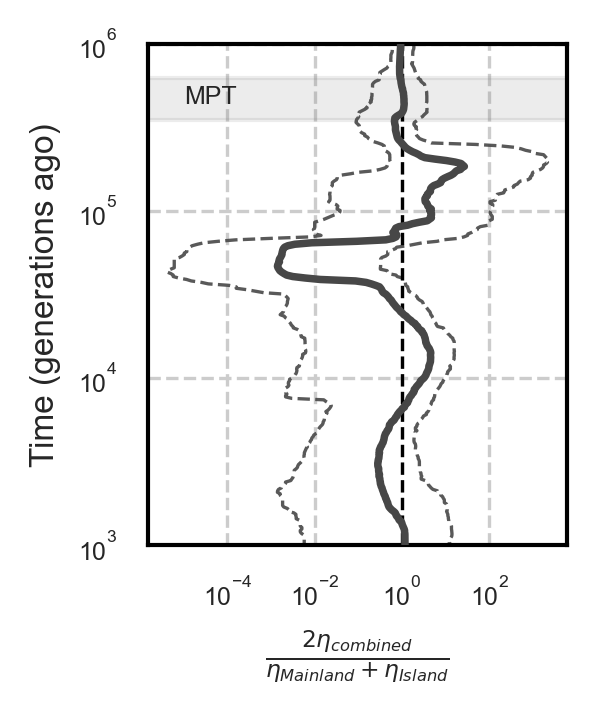

In [59]:
# =========================
# Split plot (Arial + dashed CI)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker
import os

# -------------------------
# Load Arial
# -------------------------
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(ARIAL_PATH)
arial = fm.FontProperties(fname=ARIAL_PATH)
arial_name = arial.get_name()

plt.rcParams.update({
    "font.family": arial_name,
    "font.size": 6,
    "axes.labelsize": 8,
    "xtick.labelsize": 6,
    "ytick.labelsize": 6,
})

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

COMPARISONS = [
    ("mainland_all", "islands_all", "mainland_island", "Mainland vs. island", "#474747"),
]

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Plot function
# -------------------------
def plot_split(ax, g1, g2, pooled, label, color):

    _, ne1 = load_npz(g1)
    _, ne2 = load_npz(g2)
    T, ne_pooled = load_npz(pooled)

    estimator = 2 * ne_pooled / (ne1 + ne2)

    median = np.quantile(estimator, 0.5, axis=0)
    low = np.quantile(estimator, 0.025, axis=0)
    high = np.quantile(estimator, 0.975, axis=0)

    # --- CI as dashed lines ---
    ax.plot(low, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)
    ax.plot(high, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)

    # --- Median ---
    ax.plot(median, T, color=color, linewidth=1.8, label=label, zorder=3)


# -------------------------
# Plot
# -------------------------
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(5*cm, 6*cm), dpi=300)

for g1, g2, pooled, label, color in COMPARISONS:
    plot_split(ax, g1, g2, pooled, label, color)

# Reference line
ax.axvline(1, color="black", linestyle="--", linewidth=0.8)

# -------------------------
# Axes
# -------------------------
ax.set_xscale("log")
ax.set_yscale("log")

#ax.set_xlim(1e-1, 1e1)
ax.set_ylim(1e3, 1e6)

# -------------------------
# Mid-Pleistocene Transition (MPT)
# -------------------------
mpt_low = 3.5e5
mpt_high = 6.25e5

# Shaded band (recommended)
ax.axhspan(mpt_low, mpt_high, color="grey", alpha=0.15, zorder=1)

# Optional: boundary lines
#ax.axhline(mpt_low, color="grey", linestyle=":", linewidth=0.8)
#ax.axhline(mpt_high, color="grey", linestyle=":", linewidth=0.8)

#Optional label
ax.text(
    0.0001e-1,  # slightly inside left x-limit (log scale safe)
    4.8e5,
    "MPT",
    fontsize=6,
    verticalalignment='center'
)

ax.set_xlabel(r"$\frac{2\eta_{combined}}{\eta_{Mainland}+\eta_{Island}}$")
ax.set_ylabel("Time (generations ago)")

# Ticks
ax.xaxis.set_major_locator(mticker.LogLocator(base=10))
ax.yaxis.set_major_locator(mticker.LogLocator(base=10))

ax.tick_params(axis='both', which='major',
               length=4, width=0.8, direction='out')

ax.tick_params(axis='both', which='minor',
               length=2, width=0.6, direction='out')

# -------------------------
# Spines (black box)
# -------------------------
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# -------------------------
# Layout
# -------------------------
plt.tight_layout()

#ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

plt.savefig("split_times_clean_ML_IL.svg", format="svg", dpi=300)
plt.show()

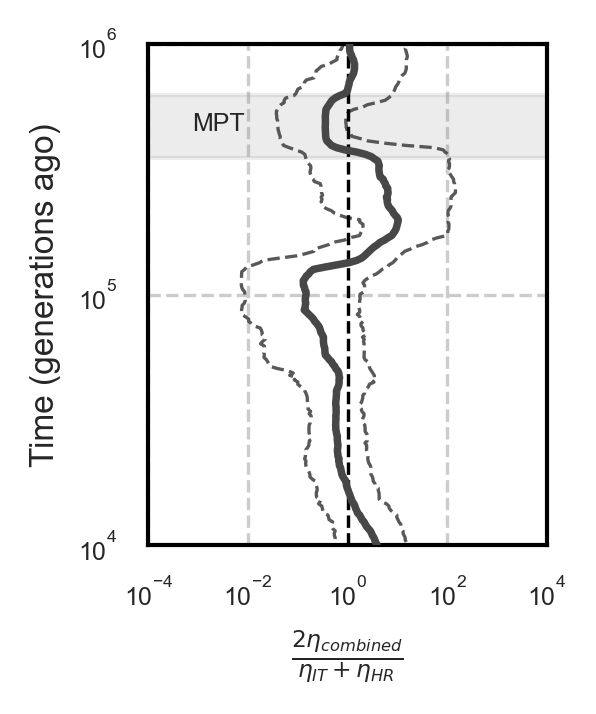

In [74]:
# =========================
# Split plot (Arial + dashed CI)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker
import os

# -------------------------
# Load Arial
# -------------------------
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(ARIAL_PATH)
arial = fm.FontProperties(fname=ARIAL_PATH)
arial_name = arial.get_name()

plt.rcParams.update({
    "font.family": arial_name,
    "font.size": 6,
    "axes.labelsize": 8,
    "xtick.labelsize": 6,
    "ytick.labelsize": 6,
})

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

COMPARISONS = [
    ("IT", "HR", "mainland_all", "HR vs. IT", "#474747"),
]

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Plot function
# -------------------------
def plot_split(ax, g1, g2, pooled, label, color):

    _, ne1 = load_npz(g1)
    _, ne2 = load_npz(g2)
    T, ne_pooled = load_npz(pooled)

    estimator = 2 * ne_pooled / (ne1 + ne2)

    median = np.quantile(estimator, 0.5, axis=0)
    low = np.quantile(estimator, 0.025, axis=0)
    high = np.quantile(estimator, 0.975, axis=0)

    # --- CI as dashed lines ---
    ax.plot(low, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)
    ax.plot(high, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)

    # --- Median ---
    ax.plot(median, T, color=color, linewidth=1.8, label=label, zorder=3)


# -------------------------
# Plot
# -------------------------
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(5*cm, 6*cm), dpi=300)

for g1, g2, pooled, label, color in COMPARISONS:
    plot_split(ax, g1, g2, pooled, label, color)

# Reference line
ax.axvline(1, color="black", linestyle="--", linewidth=0.8)

# -------------------------
# Axes
# -------------------------
ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlim(1e-4, 1e4)
ax.set_ylim(1e4, 1e6)

# -------------------------
# Mid-Pleistocene Transition (MPT)
# -------------------------
mpt_low = 3.5e5
mpt_high = 6.25e5

# Shaded band (recommended)
ax.axhspan(mpt_low, mpt_high, color="grey", alpha=0.15, zorder=1)

# Optional: boundary lines
#ax.axhline(mpt_low, color="grey", linestyle=":", linewidth=0.8)
#ax.axhline(mpt_high, color="grey", linestyle=":", linewidth=0.8)

#Optional label
ax.text(
    0.0075e-1,  # slightly inside left x-limit (log scale safe)
    4.8e5,
    "MPT",
    fontsize=6,
    verticalalignment='center'
)

ax.set_xlabel(r"$\frac{2\eta_{combined}}{\eta_{IT}+\eta_{HR}}$")
ax.set_ylabel("Time (generations ago)")

# Ticks
ax.xaxis.set_major_locator(mticker.LogLocator(base=10))
ax.yaxis.set_major_locator(mticker.LogLocator(base=10))

ax.tick_params(axis='both', which='major',
               length=4, width=0.8, direction='out')

ax.tick_params(axis='both', which='minor',
               length=2, width=0.6, direction='out')

# -------------------------
# Spines (black box)
# -------------------------
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# -------------------------
# Layout
# -------------------------
plt.tight_layout()

#ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

plt.savefig("split_times_clean_IT_HR.svg", format="svg", dpi=300)
plt.show()

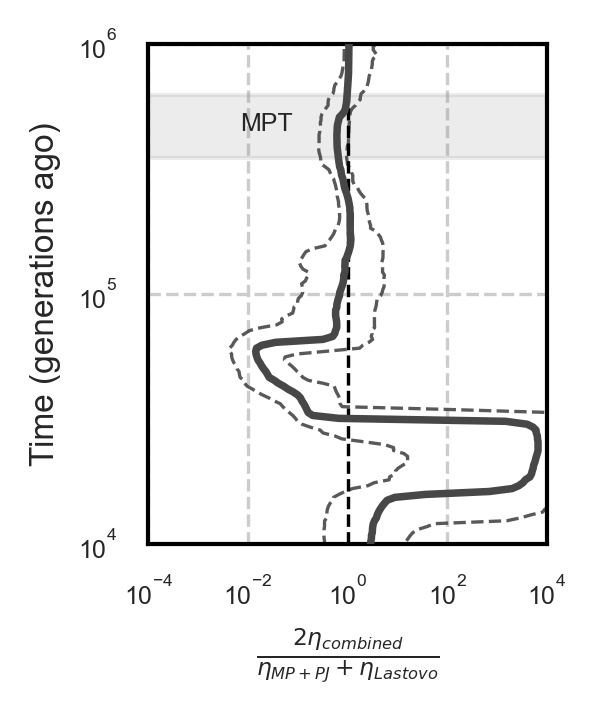

In [67]:
# =========================
# Split plot (Arial + dashed CI)
# =========================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.ticker as mticker
import os

# -------------------------
# Load Arial
# -------------------------
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(ARIAL_PATH)
arial = fm.FontProperties(fname=ARIAL_PATH)
arial_name = arial.get_name()

plt.rcParams.update({
    "font.family": arial_name,
    "font.size": 6,
    "axes.labelsize": 8,
    "xtick.labelsize": 6,
    "ytick.labelsize": 6,
})

# -------------------------
# Config
# -------------------------
BASE = "../results/demographic_analyses/results"

COMPARISONS = [
     ("islands_MP_PJ", "islands_without_MP_PJ", "islands_all", "MP, PJ vs. SC, BJ, PK, PM, KP", "#474747"),
]

# -------------------------
# Loader
# -------------------------
def load_npz(group):
    path = os.path.join(BASE, group, "posterior_ne.npz")
    data = np.load(path)
    return data["times"], data["ne"]

# -------------------------
# Plot function
# -------------------------
def plot_split(ax, g1, g2, pooled, label, color):

    _, ne1 = load_npz(g1)
    _, ne2 = load_npz(g2)
    T, ne_pooled = load_npz(pooled)

    estimator = 2 * ne_pooled / (ne1 + ne2)

    median = np.quantile(estimator, 0.5, axis=0)
    low = np.quantile(estimator, 0.025, axis=0)
    high = np.quantile(estimator, 0.975, axis=0)

    # --- CI as dashed lines ---
    ax.plot(low, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)
    ax.plot(high, T, color=color, linestyle="--", linewidth=0.8, alpha=0.9, zorder=2)

    # --- Median ---
    ax.plot(median, T, color=color, linewidth=1.8, label=label, zorder=3)


# -------------------------
# Plot
# -------------------------
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(5*cm, 6*cm), dpi=300)

for g1, g2, pooled, label, color in COMPARISONS:
    plot_split(ax, g1, g2, pooled, label, color)

# Reference line
ax.axvline(1, color="black", linestyle="--", linewidth=0.8)

# -------------------------
# Axes
# -------------------------
ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlim(1e-4, 1e4)
ax.set_ylim(1e4, 1e6)

# -------------------------
# Mid-Pleistocene Transition (MPT)
# -------------------------
mpt_low = 3.5e5
mpt_high = 6.25e5

# Shaded band (recommended)
ax.axhspan(mpt_low, mpt_high, color="grey", alpha=0.15, zorder=1)

# Optional: boundary lines
#ax.axhline(mpt_low, color="grey", linestyle=":", linewidth=0.8)
#ax.axhline(mpt_high, color="grey", linestyle=":", linewidth=0.8)

#Optional label
ax.text(
    0.07e-1,  # slightly inside left x-limit (log scale safe)
    4.8e5,
    "MPT",
    fontsize=6,
    verticalalignment='center'
)

ax.set_xlabel(r"$\frac{2\eta_{combined}}{\eta_{MP+PJ}+\eta_{Lastovo}}$")
ax.set_ylabel("Time (generations ago)")

# Ticks
ax.xaxis.set_major_locator(mticker.LogLocator(base=10))
ax.yaxis.set_major_locator(mticker.LogLocator(base=10))

ax.tick_params(axis='both', which='major',
               length=4, width=0.8, direction='out')

ax.tick_params(axis='both', which='minor',
               length=2, width=0.6, direction='out')

# -------------------------
# Spines (black box)
# -------------------------
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# -------------------------
# Layout
# -------------------------
plt.tight_layout()

#ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

plt.savefig("split_times_clean_lastovo.svg", format="svg", dpi=300)
plt.show()

#### 8.3.2. Subplots

In [179]:
# ==============================
# CONFIGURATION
# ==============================

# --- Populations to include ---
METADATA = [
    {"name": "Mainland HR", "output_dir": "results/HR"},
    {"name": "Mainland IT", "output_dir": "results/IT"},
#    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island PJ", "output_dir": "results/PJ"},
]

# --- Paths ---
BASE_RESULTS_DIR = "../results/demographic_analyses"
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

# --- Figure settings ---
FIGSIZE = (5, 3)
DPI = 300
LINEWIDTH = 2.5

# --- Font sizes ---
LABEL_SIZE = 8
TICK_SIZE = 6
TITLE_SIZE = 8

# --- Axes scales & limits ---
X_SCALE = "symlog"
Y_SCALE = "log"
X_MIN = 10  # lower x-limit (years ago)
X_MAX = 10000000
# --- Grid & style ---
GRID_STYLE = dict(linestyle="--", linewidth=0.5, color="grey", alpha=0.5)

# --- Color scheme ---
COLOR_MAP = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT
    'SP': '#74C476',  # HR
}
DEFAULT_COLOR = "#999999"

# --- Global plot style ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})

arial_font = fm.FontProperties(fname=ARIAL_PATH)

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "axes.labelsize": LABEL_SIZE,
    "axes.titlesize": TITLE_SIZE,
    "xtick.labelsize": TICK_SIZE,
    "ytick.labelsize": TICK_SIZE,
})

# --- Credible interval settings ---
PLOT_CI = True
CI_ALPHA = 0.25
CI_LOWER = 0.025
CI_UPPER = 0.975




In [180]:
def get_population_code(name):
    """Extract population code from metadata name."""
    if "Island" in name:
        return name.split("Island ")[1].split(" ")[0]
    if "Mainland" in name:
        return name.split("Mainland ")[1].split(" ")[0]
    return name


def get_color(code):
    """Return color for population code."""
    if code == "IT":
        return COLOR_MAP["VS"]
    if code == "HR":
        return COLOR_MAP["SP"]
    base_code = code.replace("_all", "")
    return COLOR_MAP.get(base_code, DEFAULT_COLOR)


def load_posterior_ne(path):
    """Load posterior Ne file and return time and Ne summaries."""
    data = np.load(path)

    times = data["times"] * 2
    ne = data["ne"]

    y = np.quantile(ne, 0.5, axis=0)
    y_low = np.quantile(ne, CI_LOWER, axis=0)
    y_high = np.quantile(ne, CI_UPPER, axis=0)

    return times, y, y_low, y_high



def plot_populations(ax, metadata):
    max_time = 0
    missing = []

    for pop in metadata:
        path = os.path.join(
            BASE_RESULTS_DIR,
            pop["output_dir"],
            "posterior_ne.npz"
        )

        if not os.path.exists(path):
            missing.append(pop["name"])
            continue

        try:
            x, y, y_low, y_high = load_posterior_ne(path)
            max_time = max(max_time, x[-1])

            code = get_population_code(pop["name"])
            color = get_color(code)

            ax.plot(
                x, y,
                lw=LINEWIDTH,
                color=color,
                label=pop["name"],
                zorder=3
            )

            if PLOT_CI:
                ax.fill_between(
                    x, y_low, y_high,
                    color=color,
                    alpha=CI_ALPHA,
                    zorder=2
                )

        except Exception as e:
            print(f"Error loading {pop['name']}: {e}")
            missing.append(pop["name"])

    return max_time, missing



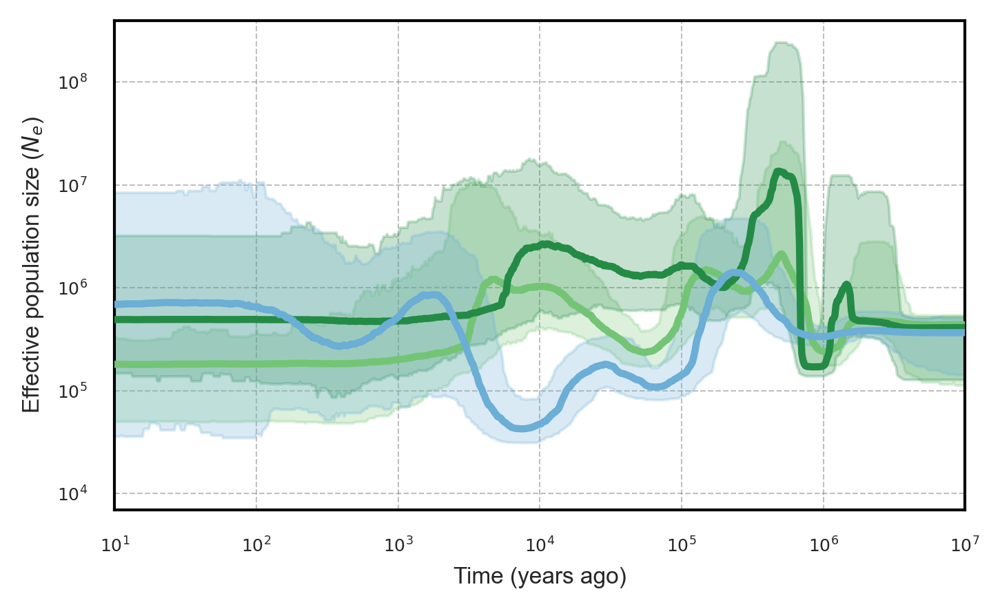

In [181]:
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI)


# Grid & spines
ax.grid(True, **GRID_STYLE)
ax.set_axisbelow(True)
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# Plot data
max_time, missing_files = plot_populations(ax, METADATA)

# Axes formatting
ax.set_xscale(X_SCALE)
ax.set_yscale(Y_SCALE)
ax.set_xlim(X_MIN, X_MAX)

ax.set_xlabel("Time (years ago)", fontsize = 8, fontproperties=arial_font)
ax.set_ylabel("Effective population size ($N_e$)", fontsize = 8, fontproperties=arial_font)

# Layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# Optional legend
# ax.legend(ncol=3, frameon=True, fontsize=8, loc="upper center",
#           bbox_to_anchor=(0.5, -0.15))

# Report missing files
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

plt.savefig("posterior_ne_mainlandislands.svg", format="svg", bbox_inches="tight", dpi=300)
plt.show()



In [182]:
# ==============================
# CONFIGURATION
# ==============================

# --- Populations to include ---
METADATA = [
    {"name": "Island PK (all years)", "output_dir": "results/PK_all"},
    {"name": "Island PM (all years)", "output_dir": "results/PM_all"},
    {"name": "Island SC (all years)", "output_dir": "results/SC_all"},
    {"name": "Island BJ", "output_dir": "results/BJ"},
    {"name": "Island MP", "output_dir": "results/MP"},
    {"name": "Island KP", "output_dir": "results/KP"},
]

# --- Paths ---
BASE_RESULTS_DIR = "../results/demographic_analyses"
ARIAL_PATH = "/scratch/antwerpen/206/vsc20666/arial.ttf"

# --- Figure settings ---
FIGSIZE = (5, 3)
DPI = 300
LINEWIDTH = 2.5

# --- Font sizes ---
LABEL_SIZE = 8
TICK_SIZE = 6
TITLE_SIZE = 8

# --- Axes scales & limits ---
X_SCALE = "symlog"
Y_SCALE = "log"
X_MIN = 10  # lower x-limit (years ago)
X_MAX = 10000000
# --- Grid & style ---
GRID_STYLE = dict(linestyle="--", linewidth=0.5, color="grey", alpha=0.5)

# --- Color scheme ---
COLOR_MAP = {
    'PJ': '#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',  # IT
    'SP': '#74C476',  # HR
}
DEFAULT_COLOR = "#999999"

# --- Global plot style ---
sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.alpha': 0.3})

arial_font = fm.FontProperties(fname=ARIAL_PATH)

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "axes.labelsize": LABEL_SIZE,
    "axes.titlesize": TITLE_SIZE,
    "xtick.labelsize": TICK_SIZE,
    "ytick.labelsize": TICK_SIZE,
})

# --- Credible interval settings ---
PLOT_CI = True
CI_ALPHA = 0.25
CI_LOWER = 0.025
CI_UPPER = 0.975


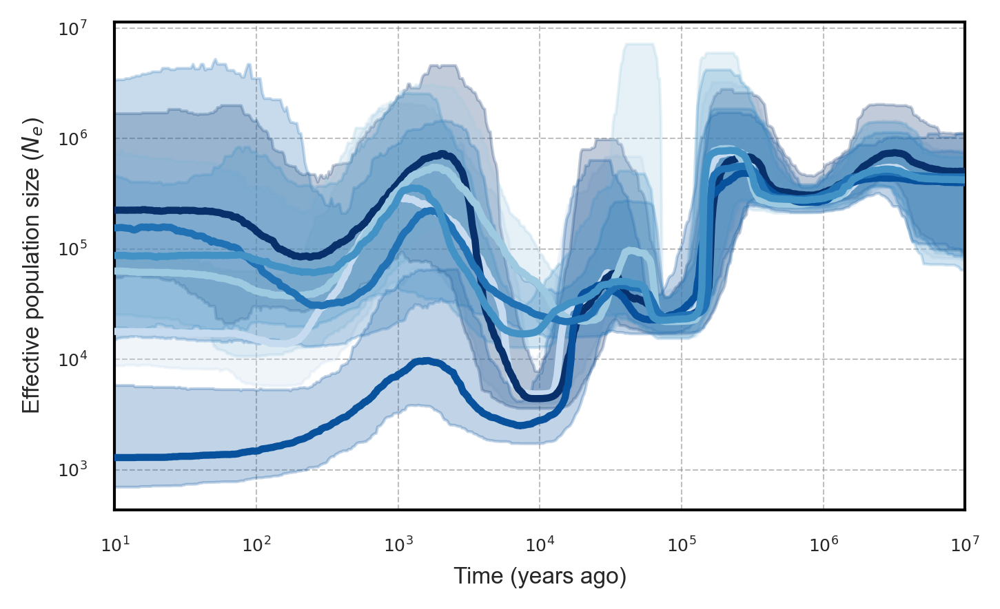

In [183]:
fig, ax = plt.subplots(figsize=FIGSIZE, dpi=DPI)

# Grid & spines
ax.grid(True, **GRID_STYLE)
ax.set_axisbelow(True)
for spine in ax.spines.values():
    spine.set_linewidth(1)
    spine.set_color("black")

# Plot data
max_time, missing_files = plot_populations(ax, METADATA)

# Axes formatting
ax.set_xscale(X_SCALE)
ax.set_yscale(Y_SCALE)
ax.set_xlim(X_MIN, X_MAX)

ax.set_xlabel("Time (years ago)", fontsize = 8, fontproperties=arial_font)
ax.set_ylabel("Effective population size ($N_e$)", fontsize = 8, fontproperties=arial_font)

# Layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

# Optional legend
# ax.legend(ncol=3, frameon=True, fontsize=8, loc="upper center",
#           bbox_to_anchor=(0.5, -0.15))

# Report missing files
if missing_files:
    print(f"\nWarning: {len(missing_files)} file(s) not found:")
    for name in missing_files:
        print(f"  - {name}")

plt.savefig("posterior_ne_lastovoislands.svg", format="svg", bbox_inches="tight", dpi=300)
plt.show()



### 9.1. SVL

#### 9.1.1. Plot GWAS

In [ ]:
# Read data
df_SVL = pd.read_csv('../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/svl/GWAS/psiculus_inbreeding_svl_GWAS.assoc.txt', sep='\t')

# ----- Bonferroni threshold -----
n_tests = df_SVL.shape[0]
alpha = 0.05 / n_tests
bonferroni_line = -np.log10(alpha)

In [ ]:
# Create basic Manhattan plot
plt.figure(figsize=(14, 6))

# Use simple numeric index for x-axis
x_positions = range(len(df_SVL))
p_values = -np.log10(df_SVL['p_lrt'])

# Color by chromosome
unique_chroms = df_SVL['chr'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_chroms)))

for i, chrom in enumerate(unique_chroms):
    chrom_mask = df_SVL['chr'] == chrom
    plt.scatter(np.array(x_positions)[chrom_mask], 
                p_values[chrom_mask], 
                color=colors[i], 
                s=10, 
                alpha=0.7,
                label=str(chrom))

# Add significance lines
plt.axhline(y=-np.log10(5e-8), color='grey', linestyle='--', linewidth=1, label='Genome-wide (5e-8)')
plt.axhline(y=bonferroni_line, color='red', linestyle='--', linewidth=1,
            label=f'Bonferroni (0.05/{n_tests:,} = {alpha:.2e})')

plt.xlabel('SNP Position')
plt.ylabel('-log10(P-value) - Likelihood Ratio Test')
plt.title('GEMMA LRT P-values SVL')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### 9.1.2. Plot genotypes

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re

sns.set(style="whitegrid")

# -----------------------------
# 1. Load raw genotypes and phenotype
# -----------------------------
df = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/svl/GWAS/svl_genotypes_GWAS.raw", delim_whitespace=True)
df["PHENOTYPE"] = df["PHENOTYPE"].replace(-9, np.nan)
df = df.dropna(subset=["PHENOTYPE"])
df.rename(columns={"PHENOTYPE":"phenotype"}, inplace=True)

# -----------------------------
# 2. Load allele lookup table
# -----------------------------
labels = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/svl/psiculus_inbreeding_svl_GWAS.bim", sep=r"\s+",
                     names=["CHR","SNP","CM","POS","A1","A0"])

# -----------------------------
# 3. Map numeric genotypes to allele labels
# -----------------------------
snp_cols = [c for c in df.columns if ":" in c]  # your SNP columns
for col in snp_cols:
    # get SNP name without "_allele" suffix
    snp_name = col.split("_")[0]
    row = labels[labels["SNP"] == snp_name]
    if row.empty:
        raise ValueError(f"Allele info not found for {col}")
    A1 = row["A1"].values[0]
    A0 = row["A0"].values[0]
    df[col + "_label"] = df[col].map({0: f"{A0}/{A0}", 1: f"{A0}/{A1}", 2: f"{A1}/{A1}"}).astype("category")

# -----------------------------
# 4. Extract population codes from IID
# -----------------------------
df['Population'] = df['IID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
df['Population'] = df['Population'].str.replace(r'^24', '', regex=True)
df['Population'] = df['Population'].replace({'CV': 'RG', 'FV': 'RG'})

# -----------------------------
# 5. Define color map
# -----------------------------
color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

# -----------------------------
# 6. Create one big multi-plot
# -----------------------------
n = len(snp_cols)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
axes = axes.flatten()

for ax, col in zip(axes, snp_cols):
    sns.boxplot(
        x=col+"_label", y="phenotype", data=df,
        showcaps=True, boxprops={'facecolor': 'None'},
        ax=ax
    )
    sns.stripplot(
        x=col+"_label", y="phenotype", data=df,
        hue="Population", dodge=True, jitter=True, size=4,
        alpha=0.8, palette=color_map, ax=ax
    )
    ax.set_xlabel("Genotype")
    ax.set_ylabel("Phenotype (SVL)")
    ax.set_title(f"{col} vs phenotype")

    # One legend for all subplots → remove here
    ax.legend([], [], frameon=False)

# Add single legend outside the grid
handles, labels_ = ax.get_legend_handles_labels()
fig.legend(handles, labels_, title="Population",
           bbox_to_anchor=(1.02, 0.5), loc="center left")

plt.tight_layout(rect=[0,0,0.92,1])

# Save if wanted
fig.savefig("SVL_9SNPs_3x3_multiplot.png", dpi=300, bbox_inches="tight")

plt.show()

### 9.2. BF

#### 9.2.1. Plot GWAS 

In [ ]:
df_BF = pd.read_csv('../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/bf/GWAS/psiculus_inbreeding_bf_GWAS.assoc.txt', sep='\t')

# ----- Bonferroni threshold -----
n_tests = df_BF.shape[0]
alpha = 0.05 / n_tests
bonferroni_line = -np.log10(alpha)

In [ ]:
# Create basic Manhattan plot
plt.figure(figsize=(14, 6))

# Use simple numeric index for x-axis
x_positions = range(len(df_BF))
p_values = -np.log10(df_BF['p_lrt'])

# Color by chromosome
unique_chroms = df_BF['chr'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_chroms)))

for i, chrom in enumerate(unique_chroms):
    chrom_mask = df_BF['chr'] == chrom
    plt.scatter(np.array(x_positions)[chrom_mask], 
                p_values[chrom_mask], 
                color=colors[i], 
                s=10, 
                alpha=0.7,
                label=str(chrom))


plt.axhline(y=bonferroni_line, color='red', linestyle='--', linewidth=1,
            label=f'Bonferroni (0.05/{n_tests:,} = {alpha:.2e})')
plt.axhline(y=-np.log10(5e-8), color='grey', linestyle='--', linewidth=1, label='Threshold 5e-8')

plt.xlabel('SNP Position')
plt.ylabel('-log10(P-value) - Likelihood Ratio Test')
plt.title('GEMMA LRT P-values Bite Force')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


#### 9.2.2. Plot genotypes

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re

sns.set(style="whitegrid")

# -----------------------------
# 1. Load raw genotypes and phenotype
# -----------------------------
df = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/bf/GWAS/bf_genotypes_GWAS.raw", delim_whitespace=True)
df["PHENOTYPE"] = df["PHENOTYPE"].replace(-9, np.nan)
df = df.dropna(subset=["PHENOTYPE"])
df.rename(columns={"PHENOTYPE":"phenotype"}, inplace=True)

# -----------------------------
# 2. Load allele lookup table
# -----------------------------
labels = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/bf/GWAS/bf_genotypes_GWAS_labelstop.txt", sep=r"\s+",
                     names=["CHR","SNP","CM","POS","A1","A0"])

# -----------------------------
# 3. Map numeric genotypes to allele labels
# -----------------------------
snp_cols = [c for c in df.columns if ":" in c]  # your SNP columns
for col in snp_cols:
    # get SNP name without "_allele" suffix
    snp_name = col.split("_")[0]
    row = labels[labels["SNP"] == snp_name]
    if row.empty:
        raise ValueError(f"Allele info not found for {col}")
    A1 = row["A1"].values[0]
    A0 = row["A0"].values[0]
    df[col + "_label"] = df[col].map({0: f"{A0}/{A0}", 1: f"{A0}/{A1}", 2: f"{A1}/{A1}"}).astype("category")

# -----------------------------
# 4. Extract population codes from IID
# -----------------------------
df['Population'] = df['IID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
df['Population'] = df['Population'].str.replace(r'^24', '', regex=True)

# -----------------------------
# 5. Define color map
# -----------------------------
color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

# -----------------------------
# 6. Plot SNPs vs phenotype colored by population
# -----------------------------
for col in snp_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=col+"_label", y="phenotype", data=df, showcaps=True, boxprops={'facecolor':'None'})
    sns.stripplot(x=col+"_label", y="phenotype", data=df, hue="Population",
                  dodge=True, jitter=True, size=6, alpha=0.8, palette=color_map)
    plt.xlabel("Genotype")
    plt.ylabel("Phenotype (Bite Force)")
    plt.title(f"{col} genotype vs phenotype")
    plt.legend(title="Population", bbox_to_anchor=(1.05,1))
    plt.tight_layout()
    
    # Save figure
    #plt.savefig(f"{col}_genotype_vs_phenotype.png", dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
import pandas as pd
import numpy as np
import re
import statsmodels.api as sm

# -----------------------------
# 1. Load raw genotypes and phenotype
# -----------------------------
df = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/bf/GWAS/bf_genotypes_GWAS.raw", delim_whitespace=True)
df["PHENOTYPE"] = df["PHENOTYPE"].replace(-9, np.nan)
df = df.dropna(subset=["PHENOTYPE"])
df.rename(columns={"PHENOTYPE":"phenotype"}, inplace=True)

# -----------------------------
# 2. Load allele lookup table
# -----------------------------
labels = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/bf/GWAS/bf_genotypes_GWAS_labelstop.txt", sep=r"\s+",
                     names=["CHR","SNP","CM","POS","A1","A0"])

# -----------------------------
# 3. Extract SNP columns
# -----------------------------
snp_cols = [c for c in df.columns if ":" in c]

# -----------------------------
# 4. Map numeric genotypes to allele labels and keep numeric for regression
# -----------------------------
for col in snp_cols:
    snp_name = col.split("_")[0]
    row = labels[labels["SNP"] == snp_name]
    if row.empty:
        raise ValueError(f"Allele info not found for {col}")
    A1 = row["A1"].values[0]
    A0 = row["A0"].values[0]
    df[col + "_label"] = df[col].map({0: f"{A0}/{A0}", 1: f"{A0}/{A1}", 2: f"{A1}/{A1}"}).astype("category")
    df[col + "_num"] = df[col]  # numeric genotype for regression

# -----------------------------
# 5. Extract population codes from IID
# -----------------------------
df['Population'] = df['IID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
df['Population'] = df['Population'].str.replace(r'^24', '', regex=True)

# -----------------------------
# 6. Run regression per SNP per population
# -----------------------------
results = []

for col in snp_cols:
    for pop in df['Population'].unique():
        pop_df = df[df['Population'] == pop].dropna(subset=['phenotype', col+"_num"])
        
        if len(pop_df) < 3:
            continue  # skip if too few samples
        
        X = sm.add_constant(pop_df[col+"_num"])  # intercept + genotype
        y = pop_df['phenotype']
        
        model = sm.OLS(y, X).fit()
        
        results.append({
            "SNP": col,
            "Population": pop,
            "N": len(pop_df),
            "Beta": model.params[col+"_num"],
            "SE": model.bse[col+"_num"],
            "t": model.tvalues[col+"_num"],
            "p_value": model.pvalues[col+"_num"],
            "R2": model.rsquared
        })

# -----------------------------
# 7. Combine results into a table
# -----------------------------
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(["SNP","Population"])
results_df.reset_index(drop=True, inplace=True)

results_df

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid")

# Loop over SNPs
for col in snp_cols:
    plt.figure(figsize=(7,5))
    
    # Boxplot per genotype, split by population
    sns.boxplot(x=col+"_num", y="phenotype", hue="Population", data=df,
                palette=color_map, showcaps=True, fliersize=0, width=0.6)
    
    # Jittered points on top of the boxplot
    for i, pop in enumerate(df['Population'].unique()):
        pop_df = df[df['Population']==pop].dropna(subset=[col+"_num","phenotype"])
        if len(pop_df) == 0:
            continue
        # small jitter for points
        jitter = np.random.uniform(-0.15, 0.15, size=len(pop_df))
        plt.scatter(pop_df[col+"_num"] + jitter, pop_df['phenotype'],
                    color=color_map.get(pop,'grey'), s=60, alpha=0.7, label=None)
        
        # Regression lines
        if len(pop_df) >= 3:
            sns.regplot(x=col+"_num", y="phenotype", data=pop_df,
                        scatter=False, color=color_map.get(pop,'grey'), ci=None)
            
            # Add p-value from previous regression results
            res_row = results_df[(results_df['SNP']==col) & (results_df['Population']==pop)]
            if not res_row.empty:
                pval = res_row['p_value'].values[0]
                # Annotate p-value above the boxplot for that population
                x_pos = pop_df[col+"_num"].mean()
                y_pos = pop_df['phenotype'].max() + 0.2
                plt.text(x_pos, y_pos, f"p={pval:.3g}", color=color_map.get(pop,'grey'), fontsize=10, ha='center')
    
    plt.xlabel("Genotype (0=hom ref, 1=het, 2=hom alt)")
    plt.ylabel("Phenotype (Bite Force)")
    plt.title(f"{col} genotype vs phenotype with regression per population")
    plt.legend(title="Population", bbox_to_anchor=(1.05,1))
    plt.tight_layout()
    
    # Optional: save figure
    # plt.savefig(f"{col}_box_regression_population.png", dpi=300, bbox_inches='tight')
    
    plt.show()


### 9.3. SPRINT

#### 9.3.1. Plot GWAS

In [ ]:
# Read data
df_SP = pd.read_csv('../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/sprint/GWAS/psiculus_inbreeding_sprint_GWAS.assoc.txt', sep='\t')
# ----- Bonferroni threshold -----
n_tests = df_SP.shape[0]
alpha = 0.05 / n_tests
bonferroni_line = -np.log10(alpha)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# Create basic Manhattan plot
plt.figure(figsize=(14, 6))

# Use simple numeric index for x-axis
x_positions = range(len(df_SP))
p_values = -np.log10(df_SP['p_lrt'])

# Color by chromosome
unique_chroms = df_SP['chr'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_chroms)))

for i, chrom in enumerate(unique_chroms):
    chrom_mask = df_SP['chr'] == chrom
    plt.scatter(np.array(x_positions)[chrom_mask], 
                p_values[chrom_mask], 
                color=colors[i], 
                s=10, 
                alpha=0.7,
                label=str(chrom))

# Add significance lines
plt.axhline(y=-np.log10(5e-8), color='grey', linestyle='--', linewidth=1, label='Genome-wide (5e-8)')
plt.axhline(y=bonferroni_line, color='red', linestyle='--', linewidth=1,
            label=f'Bonferroni (0.05/{n_tests:,} = {alpha:.2e})')

plt.xlabel('SNP Position')
plt.ylabel('-log10(P-value) - Likelihood Ratio Test')
plt.title('GEMMA LRT P-values SPRINT')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### 9.3.2. Plot genotypes

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re

sns.set(style="whitegrid")

# -----------------------------
# 1. Load raw genotypes and phenotype
# -----------------------------
df = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/sprint/GWAS/sprint_genotypes_GWAS.raw", delim_whitespace=True)
df["PHENOTYPE"] = df["PHENOTYPE"].replace(-9, np.nan)
df = df.dropna(subset=["PHENOTYPE"])
df.rename(columns={"PHENOTYPE":"phenotype"}, inplace=True)

# -----------------------------
# 2. Load allele lookup table
# -----------------------------
labels = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/psiculus_inbreeding_performance_GWAS.bim", sep=r"\s+",
                     names=["CHR","SNP","CM","POS","A1","A0"])

# -----------------------------
# 3. Map numeric genotypes to allele labels
# -----------------------------
snp_cols = [c for c in df.columns if ":" in c]  # your SNP columns
for col in snp_cols:
    # get SNP name without "_allele" suffix
    snp_name = col.split("_")[0]
    row = labels[labels["SNP"] == snp_name]
    if row.empty:
        raise ValueError(f"Allele info not found for {col}")
    A1 = row["A1"].values[0]
    A0 = row["A0"].values[0]
    df[col + "_label"] = df[col].map({0: f"{A0}/{A0}", 1: f"{A0}/{A1}", 2: f"{A1}/{A1}"}).astype("category")

# -----------------------------
# 4. Extract population codes from IID
# -----------------------------
df['Population'] = df['IID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
df['Population'] = df['Population'].str.replace(r'^24', '', regex=True)
df['Population'] = df['Population'].replace({'CV': 'RG', 'FV': 'RG'})

# -----------------------------
# 5. Define color map
# -----------------------------
color_map = {
    'PJ':'#6BAED6',
    'MP': '#2171B5',
    'KP': '#4292C6',
    'PM': '#08306B',
    'BJ': '#08519C',
    'SC': '#9ECAE1',
    'PK': '#C6DBEF',
    'VS': '#238B45',
    'TM': '#00441B',
    'RG': '#BAE4B3',
    'SP': '#74C476',
    'TR': '#006D2C',
    'PL': '#41AB5D'
}

# -----------------------------
# 6. Create one big multi-plot
# -----------------------------
n = len(snp_cols)
cols = 3
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
axes = axes.flatten()

for ax, col in zip(axes, snp_cols):
    sns.boxplot(
        x=col+"_label", y="phenotype", data=df,
        showcaps=True, boxprops={'facecolor': 'None'},
        ax=ax
    )
    sns.stripplot(
        x=col+"_label", y="phenotype", data=df,
        hue="Population", dodge=True, jitter=True, size=4,
        alpha=0.8, palette=color_map, ax=ax
    )
    ax.set_xlabel("Genotype")
    ax.set_ylabel("Phenotype (sprint)")
    ax.set_title(f"{col} vs phenotype")

    # One legend for all subplots → remove here
    ax.legend([], [], frameon=False)

# Add single legend outside the grid
handles, labels_ = ax.get_legend_handles_labels()
fig.legend(handles, labels_, title="Population",
           bbox_to_anchor=(1.02, 0.5), loc="center left")

plt.tight_layout(rect=[0,0,0.92,1])

# Save if wanted
fig.savefig("sprint_9SNPs_3x3_multiplot.png", dpi=300, bbox_inches="tight")

plt.show()

In [ ]:
import pandas as pd
import numpy as np
import re
import statsmodels.api as sm

# -----------------------------
# 1. Load raw genotypes and phenotype
# -----------------------------
df = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/sprint/GWAS/sprint_genotypes_GWAS.raw", delim_whitespace=True)
df["PHENOTYPE"] = df["PHENOTYPE"].replace(-9, np.nan)
df = df.dropna(subset=["PHENOTYPE"])
df.rename(columns={"PHENOTYPE":"phenotype"}, inplace=True)

# -----------------------------
# 2. Load allele lookup table
# -----------------------------
labels = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/psiculus_inbreeding_performance_GWAS.bim", sep=r"\s+",
                     names=["CHR","SNP","CM","POS","A1","A0"])

# -----------------------------
# 3. Extract SNP columns
# -----------------------------
snp_cols = [c for c in df.columns if ":" in c]

# -----------------------------
# 4. Map numeric genotypes to allele labels and keep numeric for regression
# -----------------------------
for col in snp_cols:
    snp_name = col.split("_")[0]
    row = labels[labels["SNP"] == snp_name]
    if row.empty:
        raise ValueError(f"Allele info not found for {col}")
    A1 = row["A1"].values[0]
    A0 = row["A0"].values[0]
    df[col + "_label"] = df[col].map({0: f"{A0}/{A0}", 1: f"{A0}/{A1}", 2: f"{A1}/{A1}"}).astype("category")
    df[col + "_num"] = df[col]  # numeric genotype for regression

# -----------------------------
# 5. Extract population codes from IID
# -----------------------------
df['Population'] = df['IID'].apply(lambda x: ''.join(re.findall(r'[A-Z]+', x)))
df['Population'] = df['Population'].str.replace(r'^24', '', regex=True)

# -----------------------------
# 6. Run regression per SNP per population
# -----------------------------
results = []

for col in snp_cols:
    for pop in df['Population'].unique():
        pop_df = df[df['Population'] == pop].dropna(subset=['phenotype', col+"_num"])
        
        if len(pop_df) < 3:
            continue  # skip if too few samples
        
        X = sm.add_constant(pop_df[col+"_num"])  # intercept + genotype
        y = pop_df['phenotype']
        
        model = sm.OLS(y, X).fit()
        
        results.append({
            "SNP": col,
            "Population": pop,
            "N": len(pop_df),
            "Beta": model.params[col+"_num"],
            "SE": model.bse[col+"_num"],
            "t": model.tvalues[col+"_num"],
            "p_value": model.pvalues[col+"_num"],
            "R2": model.rsquared
        })

# -----------------------------
# 7. Combine results into a table
# -----------------------------
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(["SNP","Population"])
results_df.reset_index(drop=True, inplace=True)

results_df

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid")

# Loop over SNPs
for col in snp_cols:
    plt.figure(figsize=(7,5))
    
    # Boxplot per genotype, split by population
    sns.boxplot(x=col+"_num", y="phenotype", hue="Population", data=df,
                palette=color_map, showcaps=True, fliersize=0, width=0.6)
    
    # Jittered points on top of the boxplot
    for i, pop in enumerate(df['Population'].unique()):
        pop_df = df[df['Population']==pop].dropna(subset=[col+"_num","phenotype"])
        if len(pop_df) == 0:
            continue
        # small jitter for points
        jitter = np.random.uniform(-0.15, 0.15, size=len(pop_df))
        plt.scatter(pop_df[col+"_num"] + jitter, pop_df['phenotype'],
                    color=color_map.get(pop,'grey'), s=60, alpha=0.7, label=None)
        
        # Regression lines
        if len(pop_df) >= 3:
            sns.regplot(x=col+"_num", y="phenotype", data=pop_df,
                        scatter=False, color=color_map.get(pop,'grey'), ci=None)
            
            # Add p-value from previous regression results
            res_row = results_df[(results_df['SNP']==col) & (results_df['Population']==pop)]
            if not res_row.empty:
                pval = res_row['p_value'].values[0]
                # Annotate p-value above the boxplot for that population
                x_pos = pop_df[col+"_num"].mean()
                y_pos = pop_df['phenotype'].max() + 0.2
                plt.text(x_pos, y_pos, f"p={pval:.3g}", color=color_map.get(pop,'grey'), fontsize=10, ha='center')
    
    plt.xlabel("Genotype (0=hom ref, 1=het, 2=hom alt)")
    plt.ylabel("Phenotype (Sprint)")
    plt.title(f"{col} genotype vs phenotype with regression per population")
    plt.legend(title="Population", bbox_to_anchor=(1.05,1))
    plt.tight_layout()
    
    # Optional: save figure
    # plt.savefig(f"{col}_box_regression_population.png", dpi=300, bbox_inches='tight')
    
    plt.show()


### 9.4. SPERMCOUNT

#### 9.4.1. Plot GWAS

In [ ]:
# Read data
df_SPC = pd.read_csv('../results/population_analyses/rPodSic1.hap1.1/genotype_phenotype/performance/spermc/GWAS/psiculus_inbreeding_spermc_GWAS.assoc.txt', sep='\t')
# ----- Bonferroni threshold -----
n_tests = df_SPC.shape[0]
alpha = 0.05 / n_tests
bonferroni_line = -np.log10(alpha)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# Create basic Manhattan plot
plt.figure(figsize=(14, 6))

# Use simple numeric index for x-axis
x_positions = range(len(df_SPC))
p_values = -np.log10(df_SPC['p_lrt'])

# Color by chromosome
unique_chroms = df_SPC['chr'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_chroms)))

for i, chrom in enumerate(unique_chroms):
    chrom_mask = df_SPC['chr'] == chrom
    plt.scatter(np.array(x_positions)[chrom_mask], 
                p_values[chrom_mask], 
                color=colors[i], 
                s=10, 
                alpha=0.7,
                label=str(chrom))

# Add significance lines
plt.axhline(y=-np.log10(5e-8), color='grey', linestyle='--', linewidth=1, label='Genome-wide (5e-8)')
plt.axhline(y=bonferroni_line, color='red', linestyle='--', linewidth=1,
            label=f'Bonferroni (0.05/{n_tests:,} = {alpha:.2e})')

plt.xlabel('SNP Position')
plt.ylabel('-log10(P-value) - Likelihood Ratio Test')
plt.title('GEMMA LRT P-values SPERMCOUNT')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### 10.1. Manhattan plot

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os

sns.set(style="whitegrid")

# --- Load ALL GWAS chromosome files ---
gwas_files = sorted(glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_ROHstatus/roh_gwas_*_ROHstatus.tsv"))

if len(gwas_files) == 0:
    raise FileNotFoundError("No GWAS files found!")

df_list = []
for f in gwas_files:
    tmp = pd.read_csv(f, sep="\t")
    df_list.append(tmp)

df = pd.concat(df_list, ignore_index=True)

print(f"Loaded {len(gwas_files)} chromosomes")
print(f"Total SNPs: {len(df)}")


Loaded 18 chromosomes
Total SNPs: 130543647


In [5]:
# --- Parse SNP info ---
df[['chrom', 'pos']] = df['SNP_ID'].str.split(':', expand=True)
df['pos'] = pd.to_numeric(df['pos'], errors='coerce')

# Convert stats to numeric
df['ROH_status_pval'] = pd.to_numeric(df['ROH_status_pval'], errors='coerce')
df['ROH_status_coef'] = pd.to_numeric(df['ROH_status_coef'], errors='coerce')
df['ROH_status_log10p'] = -np.log10(df['ROH_status_pval'])

# Drop incomplete rows
df = df.dropna(subset=['chrom', 'pos', 'ROH_status_log10p'])

# --- Chromosome ordering ---
chrom_order = (
    df[['chrom']]
    .drop_duplicates()
    .sort_values(by='chrom')
    ['chrom']
    .tolist()
)

df['chrom'] = pd.Categorical(df['chrom'], categories=chrom_order, ordered=True)
df = df.sort_values(['chrom', 'pos'])

# --- Create cumulative genomic positions ---
chrom_sizes = df.groupby('chrom')['pos'].max()
chrom_offsets = chrom_sizes.cumsum() - chrom_sizes

df['cum_pos'] = df.apply(
    lambda r: r['pos'] + chrom_offsets[r['chrom']],
    axis=1
)

# --- Bonferroni threshold ---
bonf_thresh = 0.05 / len(df)
bonf_line = -np.log10(bonf_thresh)

# --- X-axis chromosome centers ---
chrom_centers = chrom_offsets + chrom_sizes / 2


/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_943330/2600278054.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  chrom_sizes = df.groupby('chrom')['pos'].max()


/tmp/ipykernel_943330/3281933083.py:23: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


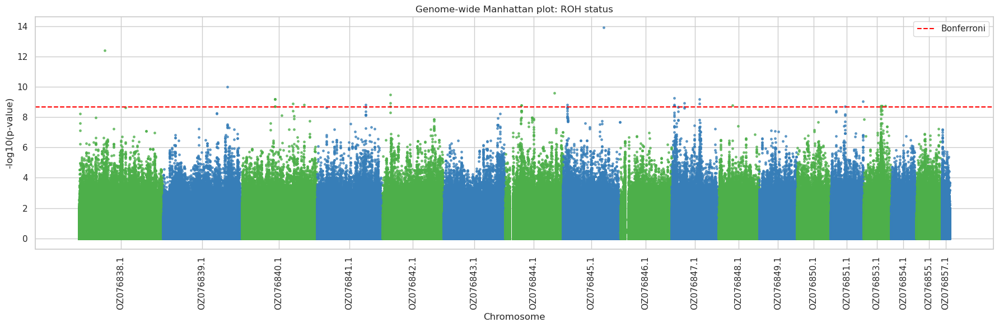

In [6]:
# --- Plot ---
plt.figure(figsize=(18, 6))

colors = ['#4daf4a', '#377eb8']

for i, chrom in enumerate(chrom_order):
    d = df[df['chrom'] == chrom]
    plt.scatter(
        d['cum_pos'],
        d['ROH_status_log10p'],
        s=6,
        color=colors[i % 2],
        alpha=0.7
    )

plt.axhline(bonf_line, color='red', linestyle='--', label='Bonferroni')

plt.xticks(chrom_centers, chrom_order, rotation=90)
plt.xlabel("Chromosome")
plt.ylabel("-log10(p-value)")
plt.title("Genome-wide Manhattan plot: BF ~ ROH status")
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_943330/1720422733.py:7: RuntimeWarning: divide by zero encountered in log10
  observed = -np.log10(np.sort(pvals))


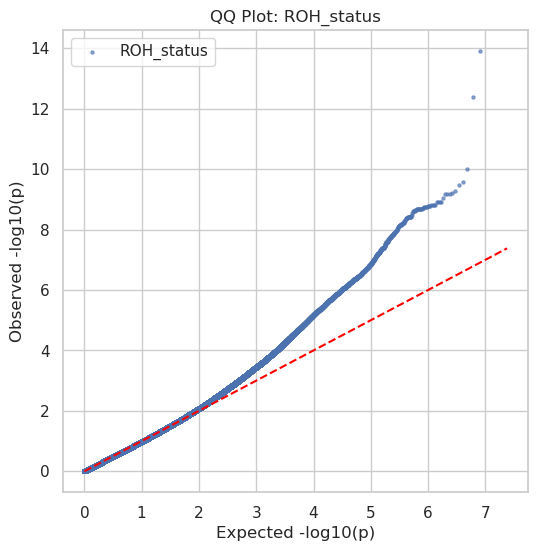

In [7]:
# --- QQ plot ---
plt.figure(figsize=(6,6))

for pred in ['ROH_status']:
    pvals = df[f'{pred}_pval'].dropna()
    expected = -np.log10(np.linspace(1/len(pvals), 1, len(pvals)))
    observed = -np.log10(np.sort(pvals))
    plt.scatter(expected, observed, s=5, alpha=0.6, label=pred)

plt.plot([0, max(expected)], [0, max(expected)], color='red', linestyle='--')
plt.xlabel('Expected -log10(p)')
plt.ylabel('Observed -log10(p)')
plt.title('QQ Plot: ROH_status')
plt.legend()
plt.show()

### 10.2. Significant SNPs 

In [20]:
alpha = 0.05
bonf_thresh = alpha / len(df)

print(f"Bonferroni p-value threshold: {bonf_thresh:.2e}")

sig_snps = df[
    (df['ROH_status_pval'] > 0) &                      # exclude p = 0
    (np.isfinite(df['ROH_status_log10p'])) &            # exclude inf / NaN
    (df['ROH_status_pval'] <= bonf_thresh)
].copy()

print(f"Number of Bonferroni-significant SNPs: {len(sig_snps)}")


Bonferroni p-value threshold: 2.08e-09
Number of Bonferroni-significant SNPs: 32


In [25]:
sig_snps = sig_snps[[
    'chrom',
    'pos',
    'SNP_ID',
    'ROH_status_coef',
    'ROH_status_pval',
    'ROH_status_log10p',
    'cum_pos'
]].sort_values('ROH_status_pval')
out_file = "bonferroni_significant_SNPs_ROHstatus_BF.tsv"
sig_snps.to_csv(out_file, sep="\t", index=False)

print(f"Saved significant SNPs to: {out_file}")

Saved significant SNPs to: bonferroni_significant_SNPs_ROHstatus_BF.tsv


#### 10.2.1. Effect sizes significant SNPs

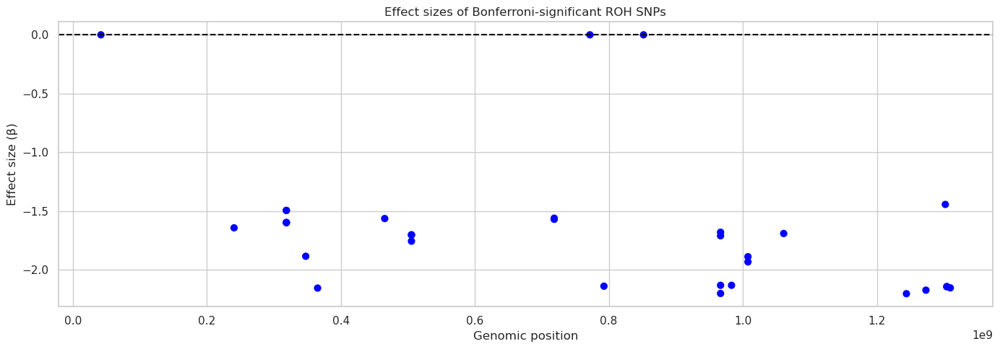

In [26]:
plt.figure(figsize=(14,5))

plt.scatter(
    sig_snps['cum_pos'],
    sig_snps['ROH_status_coef'],
    c=np.sign(sig_snps['ROH_status_coef']),
    cmap='bwr',
    s=40
)

plt.axhline(0, color='black', linestyle='--')

plt.xlabel('Genomic position')
plt.ylabel('Effect size (β)')
plt.title('Effect sizes of Bonferroni-significant ROH SNPs')

plt.tight_layout()
plt.show()


In [28]:
alpha = 0.05
bonf_thresh = alpha / len(df)

# Only finite, non-zero p-values count as significant
df['bonf_sig'] = (
    (df['ROH_status_pval'] > 0) &                      # exclude p = 0
    (np.isfinite(df['ROH_status_log10p'])) &           # exclude inf or NaN
    (df['ROH_status_pval'] <= bonf_thresh)            # Bonferroni threshold
)

print(f"Number of Bonferroni-significant SNPs: {df['bonf_sig'].sum()}")


Number of Bonferroni-significant SNPs: 32


/tmp/ipykernel_943330/1193598139.py:46: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


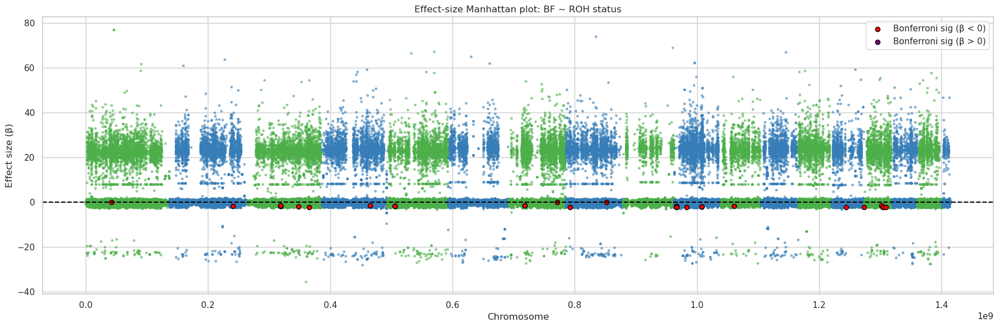

In [29]:
colors = ['#4daf4a', '#377eb8']

plt.figure(figsize=(18, 6))

# --- Background: all SNPs, alternating by chromosome ---
for i, chrom in enumerate(df['chrom'].cat.categories):
    d = df[df['chrom'] == chrom]
    plt.scatter(
        d['cum_pos'],
        d['ROH_status_coef'],
        s=6,
        alpha=0.5,
        color=colors[i % 2]
    )

# --- Significant SNPs: negative effects (red) ---
neg_sig = df['bonf_sig'] & (df['ROH_status_coef'] < 0)
plt.scatter(
    df.loc[neg_sig, 'cum_pos'],
    df.loc[neg_sig, 'ROH_status_coef'],
    s=35,
    color='red',
    edgecolor='black',
    label='Bonferroni sig (β < 0)'
)

# --- Significant SNPs: positive effects (purple) ---
pos_sig = df['bonf_sig'] & (df['ROH_status_coef'] > 0)
plt.scatter(
    df.loc[pos_sig, 'cum_pos'],
    df.loc[pos_sig, 'ROH_status_coef'],
    s=35,
    color='purple',
    edgecolor='black',
    label='Bonferroni sig (β > 0)'
)

# Reference line
plt.axhline(0, color='black', linestyle='--')

plt.xlabel('Chromosome')
plt.ylabel('Effect size (β)')
plt.title('Effect-size Manhattan plot: BF ~ ROH status')

plt.legend()
plt.tight_layout()
plt.show()


#### 10.2.2. ROH status - phenotype

In [32]:
import pandas as pd
import os

# --- Paths ---
INPUT_DIR = "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/roh_gwas_input/"
SIG_SNP_FILE = "bonferroni_significant_SNPs_ROHstatus_BF.tsv"
OUTPUT_FILE = "ROH_status_per_individual_all_significant_SNPs_.tsv"

# --- Load Bonferroni-significant SNPs ---
sig_snps = pd.read_csv(SIG_SNP_FILE, sep="\t")
print(f"Loaded {len(sig_snps)} Bonferroni-significant SNPs")

# --- Map SNP → effect size (coefficient) ---
beta_map = sig_snps.set_index('SNP_ID')['ROH_status_coef']

# --- Group SNPs by chromosome for fast lookup ---
snps_by_chrom = {chrom: set(sdf['SNP_ID']) for chrom, sdf in sig_snps.groupby('chrom')}
print("Significant SNPs per chromosome:")
for chrom, snps in snps_by_chrom.items():
    print(f"{chrom}: {len(snps)}")

# --- Remove old output if exists ---
if os.path.exists(OUTPUT_FILE):
    os.remove(OUTPUT_FILE)
    print("Existing output file removed")

# --- Stream through each chromosome and write filtered rows ---
first_write = True
CHUNKSIZE = 1_000_000  # increase if you have enough RAM

for chrom, snp_set in snps_by_chrom.items():

    input_file = os.path.join(INPUT_DIR, f"gwas_input_{chrom}.tsv")
    if not os.path.exists(input_file):
        print(f"⚠️ Input file missing for {chrom}, skipping")
        continue

    print(f"Processing {chrom} ({len(snp_set)} SNPs)")

    for chunk in pd.read_csv(input_file, sep="\t", chunksize=CHUNKSIZE, dtype=str):
        # Keep only SNPs in our significant set and make a copy
        filtered_chunk = chunk.loc[chunk['SNP_ID'].isin(snp_set)].copy()
        if not filtered_chunk.empty:
            # Add coefficient
            filtered_chunk['ROH_effect_beta'] = filtered_chunk['SNP_ID'].map(beta_map)
            # Write chunk directly
            filtered_chunk.to_csv(
                OUTPUT_FILE,
                sep="\t",
                mode='a',
                index=False,
                header=first_write
            )
            first_write = False  # only write header once


Loaded 32 Bonferroni-significant SNPs
Significant SNPs per chromosome:
OZ076838.1: 1
OZ076839.1: 1
OZ076840.1: 7
OZ076841.1: 1
OZ076842.1: 3
OZ076844.1: 3
OZ076845.1: 2
OZ076847.1: 7
OZ076848.1: 1
OZ076851.1: 2
OZ076853.1: 4
Existing output file removed
Processing OZ076838.1 (1 SNPs)
Processing OZ076839.1 (1 SNPs)
Processing OZ076840.1 (7 SNPs)
Processing OZ076841.1 (1 SNPs)
Processing OZ076842.1 (3 SNPs)
Processing OZ076844.1 (3 SNPs)
Processing OZ076845.1 (2 SNPs)
Processing OZ076847.1 (7 SNPs)
Processing OZ076848.1 (1 SNPs)
Processing OZ076851.1 (2 SNPs)
Processing OZ076853.1 (4 SNPs)


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np
import os

sns.set(style="whitegrid")

# --- Paths ---
INPUT_FILE = "ROH_status_per_individual_all_significant_SNPs.tsv"
OUT_DIR = "roh_status_plots_per_snp"
os.makedirs(OUT_DIR, exist_ok=True)

# --- Load data ---
df = pd.read_csv(INPUT_FILE, sep="\t")

# --- Clean phenotype ---
df["PHENO"] = pd.to_numeric(df["PHENO"], errors="coerce")
df = df.dropna(subset=["PHENO"])
df.rename(columns={"PHENO": "phenotype"}, inplace=True)

# --- Ensure ROH_status is categorical and ordered ---
df["ROH_status"] = df["ROH_status"].astype(int)
df["ROH_status"] = pd.Categorical(df["ROH_status"], categories=[0, 1], ordered=True)

# --- Extract population from IID ---
df["Population"] = df["IID"].str.extract(r'([A-Z]+)')
df["Population"] = df["Population"].str.replace(r'^24', '', regex=True)

# --- Population color map ---
color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D'
}

# --- Get unique SNPs ---
snps = df["SNP_ID"].unique()
print(f"Plotting {len(snps)} significant SNPs")

# --- Plot per SNP ---
for snp in snps:
    df_snp = df[df["SNP_ID"] == snp]

    if df_snp["ROH_status"].nunique() < 2:
        # Skip SNPs with no variation in ROH status
        continue

    beta = df_snp["ROH_effect_beta"].iloc[0]

    plt.figure(figsize=(6, 4))

    # Boxplot
    sns.boxplot(
        x="ROH_status",
        y="phenotype",
        data=df_snp,
        showcaps=True,
        boxprops={'facecolor': 'none'},
        width=0.5
    )

    # Population-colored points
    sns.stripplot(
        x="ROH_status",
        y="phenotype",
        data=df_snp,
        hue="Population",
        dodge=True,
        jitter=True,
        size=6,
        alpha=0.8,
        palette=color_map
    )

    plt.xlabel("ROH status (0 = no ROH, 1 = ROH)")
    plt.ylabel("Phenotype")
    plt.title(f"{snp}\nROH effect β = {beta:.3f}")

    plt.legend(
        title="Population",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()

    # --- Save instead of show (much faster for many SNPs) ---
    out_file = os.path.join(OUT_DIR, f"{snp.replace(':', '_')}_ROH_status_.png")
    plt.savefig(out_file, dpi=300)
    plt.close()

print("All plots saved.")


Plotting 32 significant SNPs
All plots saved.


In [6]:
def window_midpoint(window_id):
    """
    Extract midpoint from WINDOW_ID string:
    e.g. 'OZ076838.1:33015-132508'
    """
    try:
        coords = window_id.split(":")[1]
        start, end = coords.split("-")
        return (int(start) + int(end)) // 2
    except Exception:
        return np.nan

def chrom_numeric(chrom):
    """
    Extract numeric chromosome index from names like:
    'OZ076838.1' -> 76838
    """
    try:
        m = re.search(r"OZ(\d+)", chrom)
        return int(m.group(1)) if m else chrom
    except Exception:
        return chrom

def plot_manhattan(files, title, neff_genome):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    # ----------------------------
    # Load and concatenate
    # ----------------------------
    df = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    # ----------------------------
    # Compute window midpoint (visual only)
    # ----------------------------
    df["POS"] = df["WINDOW_ID"].apply(window_midpoint)
    df["LOGP"] = -np.log10(df["P_ROH_STATUS"])

    # ----------------------------
    # Chromosome order
    # ----------------------------
    chrom_order = sorted(
        df["CHR"].unique(),
        key=chrom_numeric
    )

    # ----------------------------
    # Cumulative positions
    # ----------------------------
    chrom_offsets = {}
    current_offset = 0

    for chrom in chrom_order:
        chrom_offsets[chrom] = current_offset
        current_offset += df.loc[df["CHR"] == chrom, "POS"].max()

    df["POS_CUM"] = df.apply(
        lambda r: r["POS"] + chrom_offsets[r["CHR"]],
        axis=1
    )

    # ----------------------------
    # Chromosome midpoints for x-axis labels
    # ----------------------------
    chrom_centers = []
    chrom_labels = []

    for chrom in chrom_order:
        sub = df[df["CHR"] == chrom]
        center = (sub["POS_CUM"].min() + sub["POS_CUM"].max()) / 2
        chrom_centers.append(center)
        chrom_labels.append(chrom)


    # ----------------------------
    # Classical Bonferroni
    # ----------------------------
    valid = df["P_ROH_STATUS"].notna() & np.isfinite(df["P_ROH_STATUS"])
    n_tests = valid.sum()

    bonf_p = 0.05 / n_tests
    bonf_logp = -np.log10(bonf_p)

    # ----------------------------
    # Effective Bonferroni (simpleM)
    # ----------------------------
    eff_bonf_p = 0.05 / neff_genome
    eff_bonf_logp = -np.log10(eff_bonf_p)

        # ----------------------------
    # Summary statistics for printing
    # ----------------------------
    valid = df["P_ROH_STATUS"].notna() & np.isfinite(df["P_ROH_STATUS"])

    n_windows_total = len(df)
    n_windows_tested = valid.sum()
    n_windows_na = n_windows_total - n_windows_tested

    # Classical Bonferroni
    bonf_p = 0.05 / n_windows_tested
    bonf_logp = -np.log10(bonf_p)

    # Effective Bonferroni
    eff_bonf_p = 0.05 / neff_genome
    eff_bonf_logp = -np.log10(eff_bonf_p)

    # Chromosome-level stats
    windows_per_chr = (
        df.loc[valid]
        .groupby("CHR")
        .size()
    )

    n_chromosomes = windows_per_chr.shape[0]

    # Sample size (if IID exists)
    if "IID" in df.columns:
        sample_size = df["IID"].nunique()
    else:
        sample_size = "NA"

    # ----------------------------
    # Print nicely formatted block
    # ----------------------------
    print("\n" + "=" * 60)
    print("ROH-GWAS Manhattan plot summary")
    print("=" * 60)
    print(f"Total windows loaded       : {n_windows_total:,}")
    print(f"Windows tested             : {n_windows_tested:,}")
    print(f"Windows excluded (NA/inf)  : {n_windows_na:,}")
    print()
    print(f"Number of chromosomes      : {n_chromosomes}")
    print(f"Windows per chromosome     :")
    print(f"  mean   = {windows_per_chr.mean():.1f}")
    print(f"  median = {windows_per_chr.median():.1f}")
    print(f"  range  = {windows_per_chr.min()}–{windows_per_chr.max()}")
    print()
    print(f"Sample size (N individuals): {sample_size}")
    print()
    print("Multiple testing thresholds")
    print(f"  Classical Bonferroni p   : {bonf_p:.3e}")
    print(f"  Classical Bonferroni -log10(p): {bonf_logp:.2f}")
    print(f"  Effective Bonferroni p   : {eff_bonf_p:.3e}")
    print(f"  Effective Bonferroni -log10(p): {eff_bonf_logp:.2f}")
    print("=" * 60 + "\n")


    # ----------------------------
    # Plot
    # ----------------------------
    plt.figure(figsize=(14, 5))
    colors = ["#4C72B0", "#DD8452"]
    
    for i, chrom in enumerate(chrom_order):
        sub = df[df["CHR"] == chrom]
        plt.scatter(
            sub["POS_CUM"],
            sub["LOGP"],
            s=10,
            color=colors[i % 2]
        )
    
    # Classical Bonferroni
    plt.axhline(
        bonf_logp,
        color="red",
        linestyle="--",
        linewidth=1,
        label="Classical Bonferroni"
    )
    
    # Effective Bonferroni
    plt.axhline(
        eff_bonf_logp,
        color="black",
        linestyle=":",
        linewidth=1.5,
        label="Effective Bonferroni (Nₑff)"
    )
    
    # --- Chromosome labels instead of positions ---
    plt.xticks(chrom_centers, chrom_labels, rotation=90)
    
    plt.xlabel("Chromosome")
    plt.ylabel(r"$-\log_{10}(P)$")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()



In [7]:
def plot_qq(files, title):
    """
    QQ plot for ROH-GWAS window-based p-values.

    Parameters
    ----------
    files : list of str
        List of GWAS result files (e.g. roh_gwas_windows_ALL_*.tsv)
    title : str
        Plot title
    """

    # ----------------------------
    # Load and concatenate
    # ----------------------------
    df = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    # ----------------------------
    # Extract and clean p-values
    # ----------------------------
    pvals = df["P_ROH_STATUS"].dropna().values
    pvals = pvals[pvals > 0]   # avoid log(0)

    n = len(pvals)
    if n == 0:
        print("No valid p-values to plot.")
        return

    # ----------------------------
    # Expected vs observed
    # ----------------------------
    pvals_sorted = np.sort(pvals)
    exp = -np.log10(np.arange(1, n + 1) / (n + 1))
    obs = -np.log10(pvals_sorted)

    # ----------------------------
    # Genomic inflation factor (λ)
    # ----------------------------
    chisq = np.quantile(
        -2 * np.log(pvals_sorted),
        0.5
    )
    lambda_gc = chisq / 0.4549364  # median of chi^2_1

    # ----------------------------
    # Plot
    # ----------------------------
    plt.figure(figsize=(5, 5))
    plt.scatter(exp, obs, s=10, alpha=0.7)
    plt.plot([0, exp.max()], [0, exp.max()], color="red", lw=1)

    plt.xlabel("Expected $-\\log_{10}(P)$")
    plt.ylabel("Observed $-\\log_{10}(P)$")
    plt.title(f"{title}\nλ = {lambda_gc:.3f}")

    plt.tight_layout()
    plt.show()


### 11.1. 1500 SNPs - 50% threshold

#### 11.1.1. Mainland

##### SimpleM 

In [8]:
POP_PREFIXES = {
    "ML": ("VS", "24VS", "TM", "24TM", "RG", "CV", "FV"),   # VS belongs to ML
    "IL": ("SC","24SC", "PK", "24PK", "PM", "24PM", "KP")         # only IL
}

In [9]:
def subset_population(df, pop):
    """
    Subset dataframe based on IID prefixes belonging to a population.
    """
    if "IID" not in df.columns:
        raise ValueError("IID column not found in input dataframe")

    if pop not in POP_PREFIXES:
        raise ValueError(f"Unknown population '{pop}'. Valid: {list(POP_PREFIXES)}")

    prefixes = POP_PREFIXES[pop]

    mask = df["IID"].astype(str).str.startswith(prefixes)
    return df[mask].copy()


In [38]:
import pandas as pd
import numpy as np
from numpy.linalg import eigh
def neff_from_roh_matrix(X, variance_threshold=0.995):
    """
    Compute effective number of independent tests (simpleM-style)
    from an individual × window ROH matrix.
    """

    # Drop windows with zero variance (all 0 or all 1)
    variances = X.var(axis=0)
    X = X.loc[:, variances > 0]

    # If too few windows remain, N_eff = number of windows
    if X.shape[1] <= 1:
        return X.shape[1]

    # Standardize
    X_std = (X - X.mean(axis=0)) / X.std(axis=0, ddof=0)
    X_std = X_std.fillna(0)

    # Correlation matrix
    R = np.corrcoef(X_std.values, rowvar=False)

    # Eigenvalues only (backward-compatible)
    eigvals = np.linalg.eigvalsh(R)
    eigvals = np.sort(eigvals)[::-1]

    cumvar = np.cumsum(eigvals) / np.sum(eigvals)
    neff = np.searchsorted(cumvar, variance_threshold) + 1

    return neff


def compute_neff_from_window_folder(
    input_dir,
    pop,
    variance_threshold=0.995,
    file_pattern="gwas_input_windows_covariates_*.tsv"
):
    """
    Compute genome-wide N_eff for windowed ROH-GWAS by scanning
    per-chromosome input files in a folder.

    Parameters
    ----------
    input_dir : str
        Directory containing per-chromosome window input files
    pop : str
        'ML' or 'IL'
    variance_threshold : float
        Cumulative variance threshold (default 0.995, simpleM)
    file_pattern : str
        Glob pattern to match chromosome files

    Returns
    -------
    total_neff : int
        Genome-wide effective number of independent windows
    summary_df : pandas.DataFrame
        Per-chromosome N_windows and N_eff
    """

    files = sorted(glob.glob(os.path.join(input_dir, file_pattern)))

    if not files:
        raise FileNotFoundError("No input files found in directory")

    total_neff = 0
    summary = []

    print(f"\nComputing N_eff for {pop}")
    print(f"Scanning {len(files)} chromosome files\n")

    for f in files:
        df = pd.read_csv(f, sep="\t")

        # Population subset
        df = subset_population(df, pop)

        if df.empty:
            continue

        chrom = df["CHR"].iloc[0]

        # Individual × window matrix
        X = (
            df.pivot_table(
                index="IID",
                columns="WINDOW_ID",
                values="ROH_STATUS",
                fill_value=0
            )
            .astype(float)
        )

        if X.shape[1] < 2:
            continue

        neff_chr = neff_from_roh_matrix(X, variance_threshold)

        total_neff += neff_chr

        summary.append({
            "CHR": chrom,
            "N_windows": X.shape[1],
            "N_eff": neff_chr
        })

        print(f"{pop} {chrom}: windows={X.shape[1]}  N_eff={neff_chr}")

    print(f"\n{pop} TOTAL genome-wide N_eff = {total_neff}\n")

    return total_neff, pd.DataFrame(summary)



In [212]:
INPUT_DIR = "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/roh_gwas_input_windows/1500_50"

neff_ml, neff_ml_chr = compute_neff_from_window_folder(
    INPUT_DIR,
    pop="ML"
)

neff_il, neff_il_chr = compute_neff_from_window_folder(
    INPUT_DIR,
    pop="IL"
)



Computing N_eff for ML
Scanning 18 chromosome files

ML OZ076838.1: windows=8590  N_eff=53
ML OZ076839.1: windows=7516  N_eff=53
ML OZ076840.1: windows=7606  N_eff=53
ML OZ076841.1: windows=6582  N_eff=53
ML OZ076842.1: windows=6252  N_eff=52
ML OZ076843.1: windows=6262  N_eff=53
ML OZ076844.1: windows=5538  N_eff=52
ML OZ076845.1: windows=5789  N_eff=53
ML OZ076846.1: windows=4895  N_eff=53
ML OZ076847.1: windows=4751  N_eff=53
ML OZ076848.1: windows=3952  N_eff=53
ML OZ076849.1: windows=3721  N_eff=53
ML OZ076850.1: windows=3130  N_eff=52
ML OZ076851.1: windows=3389  N_eff=53
ML OZ076853.1: windows=2977  N_eff=52
ML OZ076854.1: windows=2718  N_eff=53
ML OZ076855.1: windows=2627  N_eff=53
ML OZ076857.1: windows=728  N_eff=50

ML TOTAL genome-wide N_eff = 947


Computing N_eff for IL
Scanning 18 chromosome files

IL OZ076838.1: windows=8590  N_eff=79
IL OZ076839.1: windows=7516  N_eff=79
IL OZ076840.1: windows=7606  N_eff=78
IL OZ076841.1: windows=6582  N_eff=78
IL OZ076842.1: windows

##### Exploratory plots


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 7,763
Windows excluded (NA/inf)  : 79,260

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 431.3
  median = 405.5
  range  = 152–924

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 6.441e-06
  Classical Bonferroni -log10(p): 5.19
  Effective Bonferroni p   : 5.280e-05
  Effective Bonferroni -log10(p): 4.28



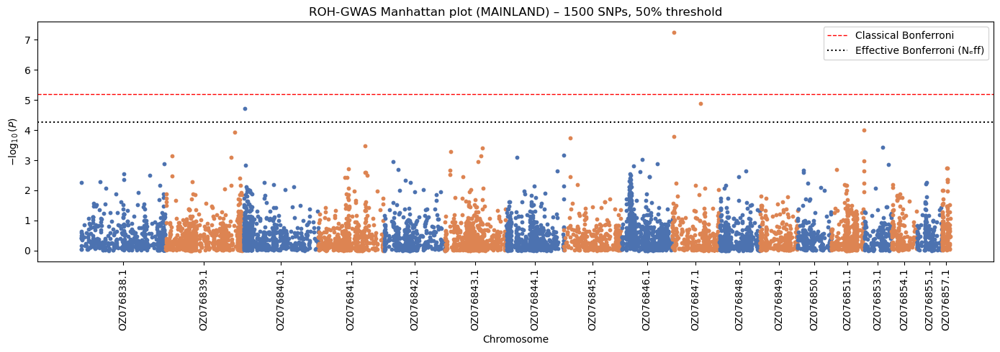

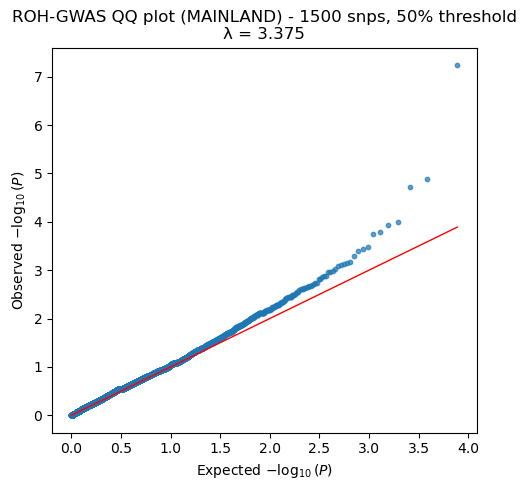

In [10]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_MAINLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (MAINLAND) – 1500 SNPs, 50% threshold",
    neff_genome=947
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_50/roh_gwas_windows_MAINLAND_*.tsv"),
    "ROH-GWAS QQ plot (MAINLAND) - 1500 snps, 50% threshold"
)


##### Significant windows

In [11]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "gwas_roh/roh_gwas_results_windows/1500_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "MAINLAND"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_ML = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_ML.shape[0]}")

# Load data
df_ML = df_ML.loc[
    df_ML["P_ROH_STATUS"].notna()
    & np.isfinite(df_ML["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_ML["LOGP"] = -np.log10(df_ML["P_ROH_STATUS"])
print(f"Total windows loaded: {df_ML.shape[0]}")

neff_genome_ML = 947  # your simpleM result

p_eff_ML = 0.05 / neff_genome_ML
logp_eff_ML = -np.log10(p_eff_ML)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_ML:.3e}")
print(f"  -log10(p) ≥ {logp_eff_ML:.4f}")

sig_df_ML = df_ML.loc[
    df_ML["LOGP"] >= logp_eff_ML
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_ML.shape[0]}")
print(sig_df_ML)

Found 18 result files
Total windows loaded (raw): 87023
Total windows loaded: 7763
Neff Bonferroni threshold:
  p ≤ 5.280e-05
  -log10(p) ≥ 4.2774
Significant windows (Neff, LOGP-based): 3
                          WINDOW_ID         CHR   N   WIN  THR  BETA_const  \
19383    OZ076840.1:3717698-3744202  OZ076840.1  54  1500   50    0.873405   
60260    OZ076847.1:2627012-2641500  OZ076847.1  54  1500   50    0.430166   
61610  OZ076847.1:45294238-45308999  OZ076847.1  54  1500   50    0.953395   

       SE_const   P_const  BETA_ROH_STATUS  SE_ROH_STATUS  ...  BETA_PC2_ML  \
19383  0.560554  0.125777        -1.429218       0.301155  ...    -8.498692   
60260  0.472875  0.367535        -2.381730       0.371199  ...    -5.008062   
61610  0.508328  0.066806        -1.534215       0.315438  ...    -3.406417   

       SE_PC2_ML  P_PC2_ML  BETA_PC3_ML  SE_PC3_ML  P_PC3_ML  FAIL_REASON  \
19383   2.695168  0.002783     3.897855   3.086290  0.212705           OK   
60260   2.268512  0.032082 

In [12]:
print(df_ML)

                            WINDOW_ID         CHR   N   WIN  THR  BETA_const  \
54     OZ076838.1:100755219-100770595  OZ076838.1  54  1500   50    2.361461   
122    OZ076838.1:101704677-101726918  OZ076838.1  54  1500   50    2.377051   
127    OZ076838.1:101785264-101799495  OZ076838.1  54  1500   50    2.714339   
132    OZ076838.1:101855910-101868293  OZ076838.1  54  1500   50    2.645448   
133    OZ076838.1:101868323-101882259  OZ076838.1  54  1500   50    2.758353   
...                               ...         ...  ..   ...  ...         ...   
86990        OZ076857.1:934855-951428  OZ076857.1  54  1500   50    1.161877   
86991        OZ076857.1:951437-964961  OZ076857.1  54  1500   50    1.161877   
86996        OZ076857.1:964973-982039  OZ076857.1  54  1500   50    1.171104   
87009        OZ076857.1:982051-994503  OZ076857.1  54  1500   50    1.161877   
87018       OZ076857.1:994520-1009306  OZ076857.1  54  1500   50    1.278139   

       SE_const   P_const  BETA_ROH_STA

In [13]:
df_ML["BETA_ROH_STATUS"].describe()

count    7763.000000
mean       -0.024763
std         0.503670
min        -2.381730
25%        -0.357797
50%         0.017679
75%         0.316520
max         1.651960
Name: BETA_ROH_STATUS, dtype: float64

Effect sizes excluded from plot (|β| outside [-3, 3]): 0


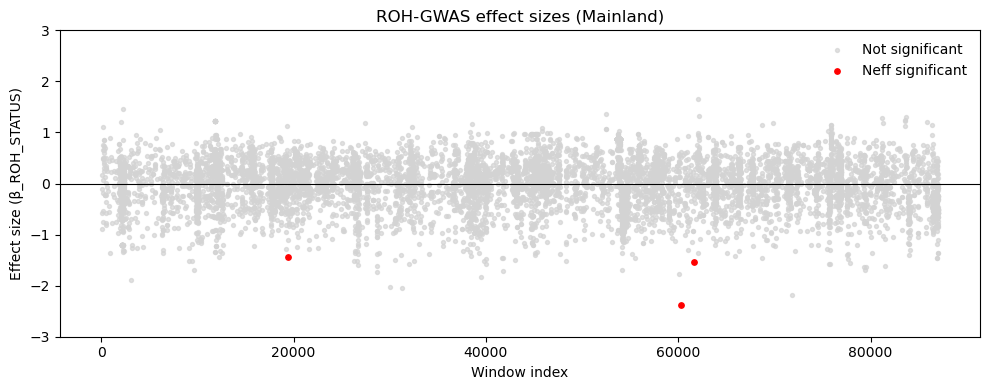

In [14]:
is_sig = df_ML["LOGP"] >= logp_eff_ML
beta_min = -3
beta_max = 3

beta_ok = (
    df_ML["BETA_ROH_STATUS"].notna()
    & (df_ML["BETA_ROH_STATUS"] >= beta_min)
    & (df_ML["BETA_ROH_STATUS"] <= beta_max)
)
plot_mask = beta_ok
sig_plot_mask = beta_ok & is_sig

n_excluded = (~beta_ok).sum()
print(f"Effect sizes excluded from plot (|β| outside [{beta_min}, {beta_max}]): {n_excluded}")


plt.figure(figsize=(10, 4))

# Non-significant (within beta limits)
plt.scatter(
    df_ML.loc[plot_mask & ~is_sig].index,
    df_ML.loc[plot_mask & ~is_sig, "BETA_ROH_STATUS"],
    color="lightgrey",
    s=8,
    alpha=0.7,
    label="Not significant"
)

# Significant (within beta limits)
plt.scatter(
    df_ML.loc[sig_plot_mask].index,
    df_ML.loc[sig_plot_mask, "BETA_ROH_STATUS"],
    color="red",
    s=15,
    label="Neff significant"
)

plt.axhline(0, color="black", linewidth=0.8)

plt.ylim(beta_min, beta_max)

plt.xlabel("Window index")
plt.ylabel("Effect size (β_ROH_STATUS)")
plt.title("ROH-GWAS effect sizes (Mainland)")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


Raw input rows loaded: 11661082
Significant windows: 3
Plotting 3 significant windows


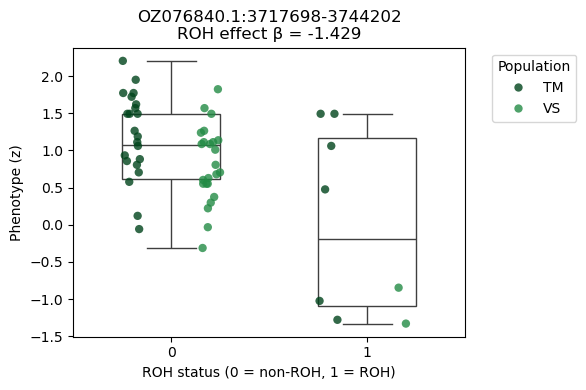

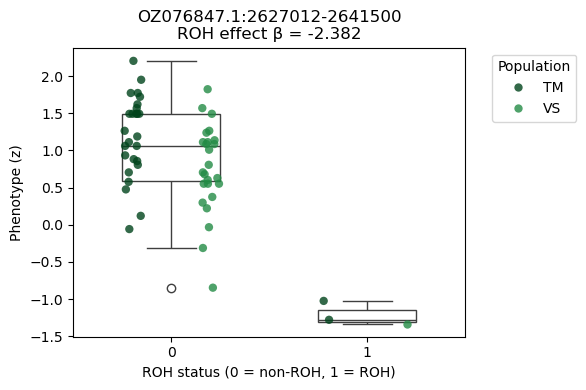

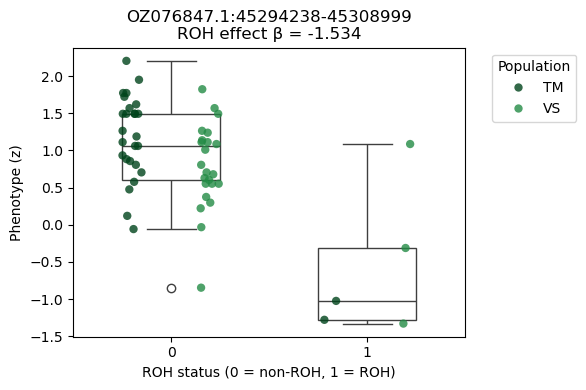

In [15]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_ML = df_input[df_input["PC1_ML"].notna()].copy()
df_input_ML["Population"] = df_input_ML["IID"].str.extract(r"([A-Z]+)")
df_input_ML["Population"] = df_input_ML["Population"].str.replace(r"^24", "", regex=True)

sig_windows_ML = sig_df_ML["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows_ML)}")

df_plot_ML = df_input_ML[df_input_ML["WINDOW_ID"].isin(sig_windows_ML)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D'
}

windows_ML = df_plot_ML["WINDOW_ID"].unique()
print(f"Plotting {len(windows_ML)} significant windows")

for window in windows_ML:

    df_w = df_plot_ML[df_plot_ML["WINDOW_ID"] == window]

    # Skip windows with no ROH variation
    if df_w["ROH_STATUS"].nunique() < 2:
        continue

    # Get effect size from GWAS results
    beta = sig_df_ML.loc[
        sig_df_ML["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    plt.figure(figsize=(6, 4))

    # Boxplot
    sns.boxplot(
        x="ROH_STATUS",
        y="PHENO_z",     # or PHENO if you prefer raw scale
        data=df_w,
        showcaps=True,
        boxprops={"facecolor": "none"},
        width=0.5
    )

    # Population-coloured points
    sns.stripplot(
        x="ROH_STATUS",
        y="PHENO_z",
        data=df_w,
        hue="Population",
        dodge=True,
        jitter=True,
        size=6,
        alpha=0.8,
        palette=color_map
    )

    plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
    plt.ylabel("Phenotype (z)")
    plt.title(f"{window}\nROH effect β = {beta:.3f}")

    plt.legend(
        title="Population",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()


In [16]:
sig_df_ML[["WINDOW_ID", "CHR", "BETA_ROH_STATUS", "N_ROH", "N_NONROH", "P_ROH_STATUS", "LOGP"]] \
    .to_csv("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_50/significant_windows/roh_neff_significant_windows_ML.tsv", sep="\t", index=False)


In [17]:
sig_df_ML.head()

,WINDOW_ID,CHR,N,WIN,THR,BETA_const,SE_const,P_const,BETA_ROH_STATUS,SE_ROH_STATUS,...,BETA_PC2_ML,SE_PC2_ML,P_PC2_ML,BETA_PC3_ML,SE_PC3_ML,P_PC3_ML,FAIL_REASON,N_ROH,N_NONROH,LOGP
19383,OZ076840.1:3717698-3744202,OZ076840.1,54,1500,50,0.873405,0.560554,0.125777,-1.429218,0.301155,...,-8.498692,2.695168,0.002783,3.897855,3.086290,0.212705,OK,8,46,4.720082
60260,OZ076847.1:2627012-2641500,OZ076847.1,54,1500,50,0.430166,0.472875,0.367535,-2.381730,0.371199,...,-5.008062,2.268512,0.032082,-0.759992,2.532983,0.765444,OK,3,51,7.238102
61610,OZ076847.1:45294238-45308999,OZ076847.1,54,1500,50,0.953395,0.508328,0.066806,-1.534215,0.315438,...,-3.406417,2.553033,0.188413,-1.022168,2.824439,0.719014,OK,5,49,4.892761


#### 11.1.2. Island

##### Exploratory plots


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 76,255
Windows excluded (NA/inf)  : 10,768

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 4236.4
  median = 4209.0
  range  = 630–7631

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 6.557e-07
  Classical Bonferroni -log10(p): 6.18
  Effective Bonferroni p   : 3.549e-05
  Effective Bonferroni -log10(p): 4.45



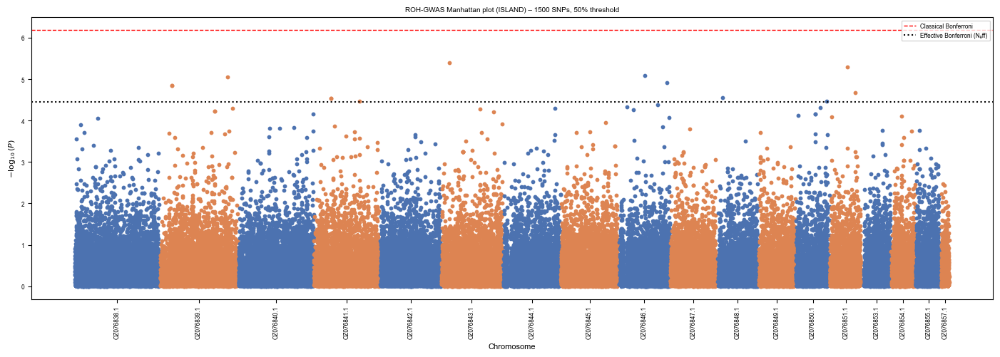

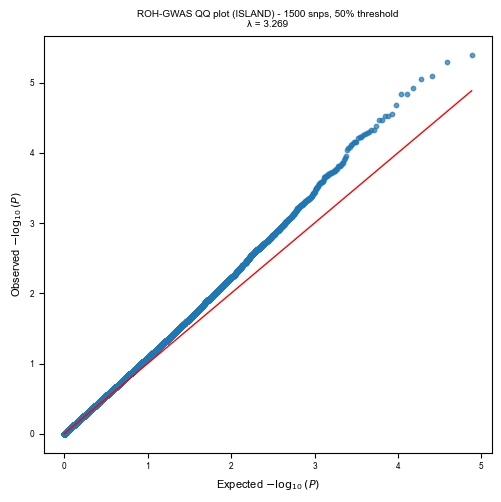

In [27]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_ISLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (ISLAND) – 1500 SNPs, 50% threshold",
    neff_genome=1409
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_50/roh_gwas_windows_ISLAND_*.tsv"),
    "ROH-GWAS QQ plot (ISLAND) - 1500 snps, 50% threshold"
)


##### Significant snps

In [28]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "gwas_roh/roh_gwas_results_windows/1500_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "ISLAND"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_IL = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_IL.shape[0]}")

# Load data
df_IL = df_IL.loc[
    df_IL["P_ROH_STATUS"].notna()
    & np.isfinite(df_IL["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_IL["LOGP"] = -np.log10(df_IL["P_ROH_STATUS"])
print(f"Total windows loaded: {df_IL.shape[0]}")

neff_genome_IL = 1409  # your simpleM result

p_eff_IL = 0.05 / neff_genome_IL
logp_eff_IL = -np.log10(p_eff_IL)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_IL:.3e}")
print(f"  -log10(p) ≥ {logp_eff_IL:.4f}")

sig_df_IL = df_IL.loc[
    df_IL["LOGP"] >= logp_eff_IL
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_IL.shape[0]}")
print(sig_df_IL)

Found 18 result files
Total windows loaded (raw): 87023
Total windows loaded: 76255
Neff Bonferroni threshold:
  p ≤ 3.549e-05
  -log10(p) ≥ 4.4499
Significant windows (Neff, LOGP-based): 13
                            WINDOW_ID         CHR   N   WIN  THR  BETA_const  \
9361   OZ076839.1:110102880-110121933  OZ076839.1  69  1500   50    1.213013   
10492    OZ076839.1:19596073-19611858  OZ076839.1  69  1500   50    0.641855   
10493    OZ076839.1:19611860-19623895  OZ076839.1  69  1500   50    0.641855   
25208    OZ076841.1:27290148-27302741  OZ076841.1  69  1500   50   -0.889283   
25209    OZ076841.1:27302744-27315309  OZ076841.1  69  1500   50   -0.889283   
28503    OZ076841.1:74121737-74134618  OZ076841.1  69  1500   50   -0.519052   
36677    OZ076843.1:12823412-12842841  OZ076843.1  69  1500   50   -0.002209   
56021    OZ076846.1:43057425-43070206  OZ076846.1  69  1500   50    1.367506   
58657    OZ076846.1:78553921-78567330  OZ076846.1  69  1500   50    1.246841   
67716    

In [29]:
df_IL["BETA_ROH_STATUS"].describe()

count    76255.000000
mean        -0.001458
std          0.165787
min         -1.262724
25%         -0.097451
50%         -0.000646
75%          0.097622
max          0.976420
Name: BETA_ROH_STATUS, dtype: float64

Effect sizes excluded from plot (|β| outside [-3, 3]): 0


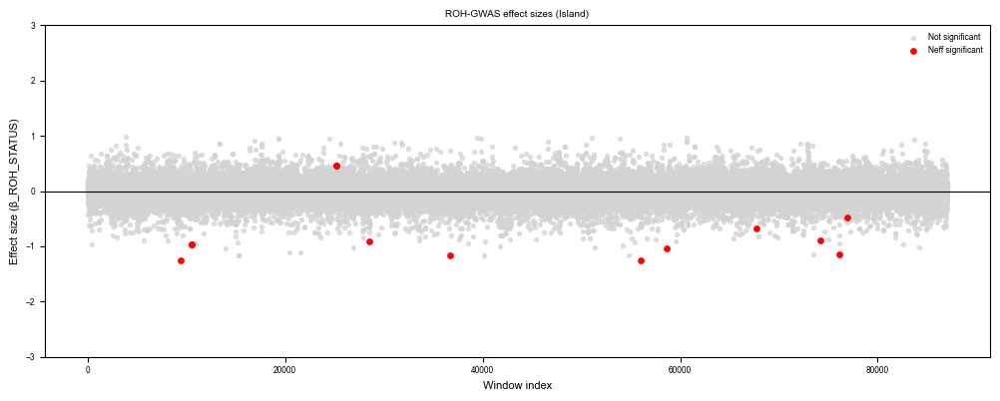

In [30]:
is_sig = df_IL["LOGP"] >= logp_eff_IL
beta_min = -3
beta_max = 3

beta_ok = (
    df_IL["BETA_ROH_STATUS"].notna()
    & (df_IL["BETA_ROH_STATUS"] >= beta_min)
    & (df_IL["BETA_ROH_STATUS"] <= beta_max)
)
plot_mask = beta_ok
sig_plot_mask = beta_ok & is_sig

n_excluded = (~beta_ok).sum()
print(f"Effect sizes excluded from plot (|β| outside [{beta_min}, {beta_max}]): {n_excluded}")


plt.figure(figsize=(10, 4))

# Non-significant (within beta limits)
plt.scatter(
    df_IL.loc[plot_mask & ~is_sig].index,
    df_IL.loc[plot_mask & ~is_sig, "BETA_ROH_STATUS"],
    color="lightgrey",
    s=8,
    alpha=0.7,
    label="Not significant"
)

# Significant (within beta limits)
plt.scatter(
    df_IL.loc[sig_plot_mask].index,
    df_IL.loc[sig_plot_mask, "BETA_ROH_STATUS"],
    color="red",
    s=15,
    label="Neff significant"
)

plt.axhline(0, color="black", linewidth=0.8)

plt.ylim(beta_min, beta_max)

plt.xlabel("Window index")
plt.ylabel("Effect size (β_ROH_STATUS)")
plt.title("ROH-GWAS effect sizes (Island)")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


Raw input rows loaded: 11661082
Significant windows: 13
Plotting 13 significant windows


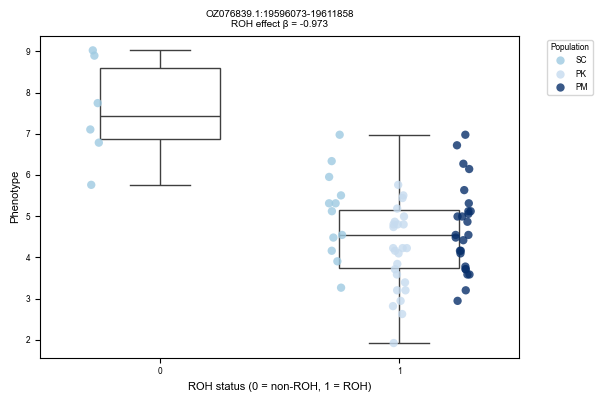

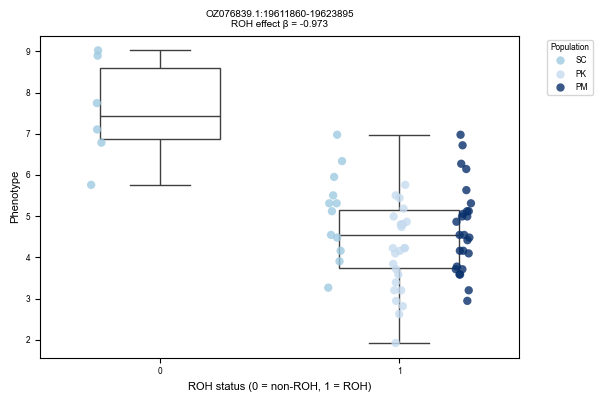

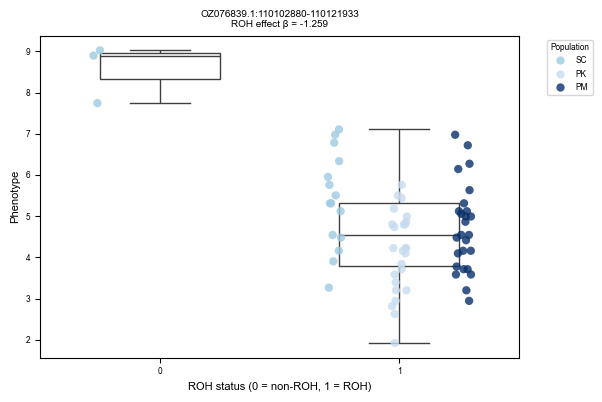

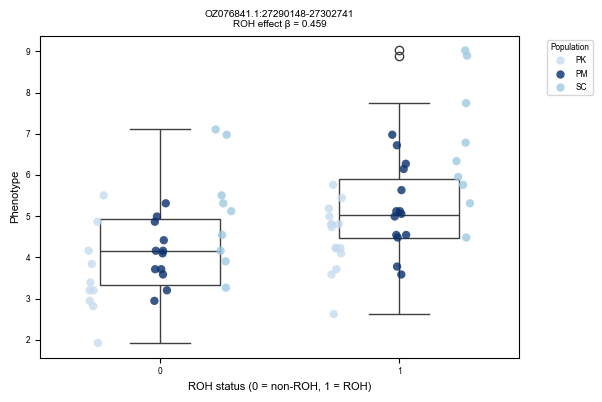

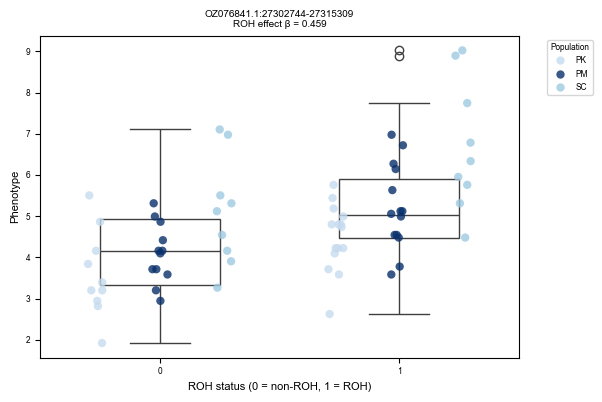

...

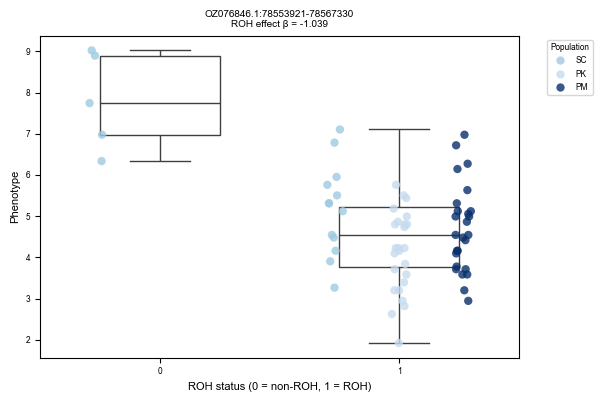

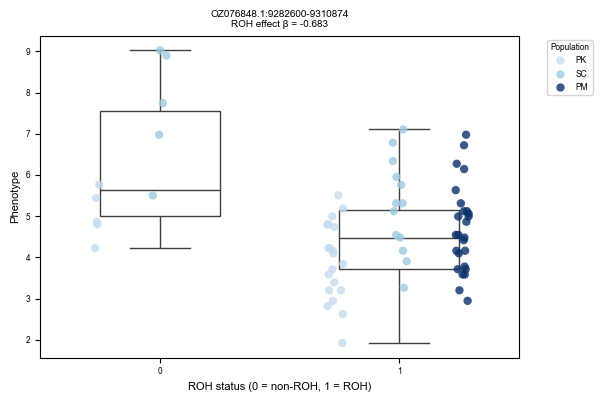

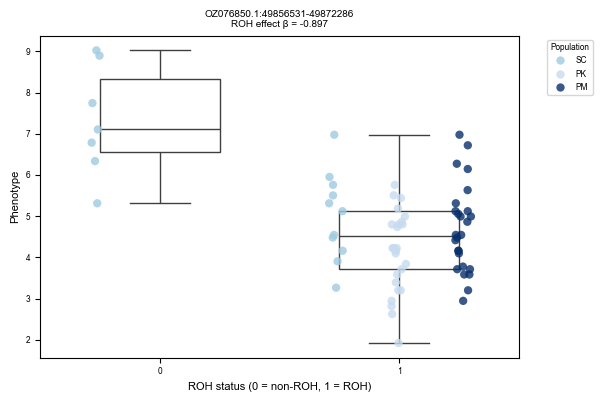

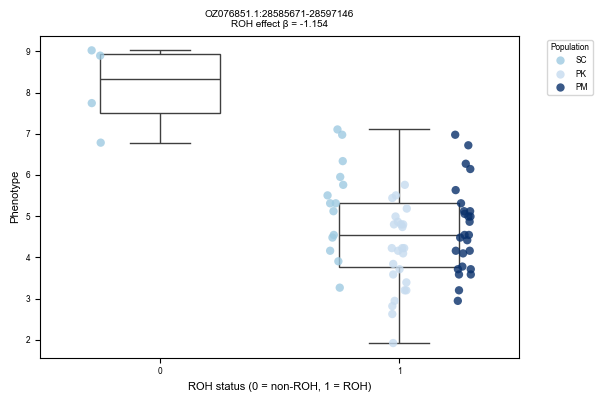

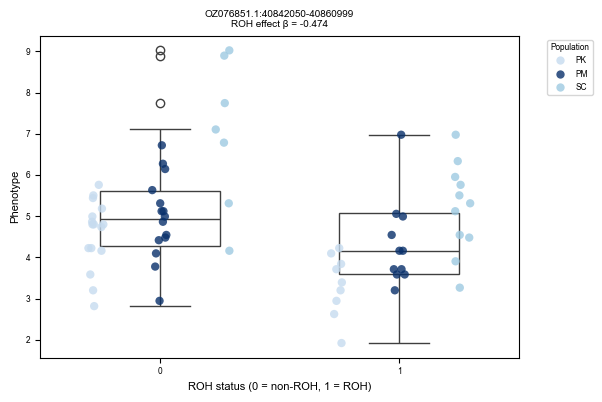

In [53]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_IL = df_input[df_input["PC1_IL"].notna()].copy()
df_input_IL["Population"] = df_input_IL["IID"].str.extract(r"([A-Z]+)")
df_input_IL["Population"] = df_input_IL["Population"].str.replace(r"^24", "", regex=True)

sig_windows = sig_df_IL["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows)}")

df_plot_IL = df_input_IL[df_input_IL["WINDOW_ID"].isin(sig_windows)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D'
}

windows = df_plot_IL["WINDOW_ID"].unique()
print(f"Plotting {len(windows)} significant windows")

for window in windows:

    df_w = df_plot_IL[df_plot_IL["WINDOW_ID"] == window]

    # Skip windows with no ROH variation
    if df_w["ROH_STATUS"].nunique() < 2:
        continue

    # Get effect size from GWAS results
    beta = sig_df_IL.loc[
        sig_df_IL["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    plt.figure(figsize=(6, 4))

    # Boxplot
    sns.boxplot(
        x="ROH_STATUS",
        y="PHENO",     # or PHENO if you prefer raw scale
        data=df_w,
        showcaps=True,
        boxprops={"facecolor": "none"},
        width=0.5
    )

    # Population-coloured points
    sns.stripplot(
        x="ROH_STATUS",
        y="PHENO",
        data=df_w,
        hue="Population",
        dodge=True,
        jitter=True,
        size=6,
        alpha=0.8,
        palette=color_map
    )

    plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
    plt.ylabel("Phenotype")
    plt.title(f"{window}\nROH effect β = {beta:.3f}")

    plt.legend(
        title="Population",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()


In [104]:
def plot_roh_windows_grid(
    df_plot,
    sig_df,
    color_map,
    effect_col="BETA_ROH_STATUS",
    fig_width_cm=20,   # <- wider overall
    fig_height_cm=5,
    n_cols=6,          # <- FEWER columns → wider panels
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    out_file=None
):
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import seaborn as sns
    import math
    import os

    # =========================
    # Font (HOUSE STYLE)
    # =========================
    fm.fontManager.addfont(arial_path)
    arial_font = fm.FontProperties(fname=arial_path)
    arial_name = arial_font.get_name()

    plt.rcParams['font.family'] = arial_name
    plt.rcParams['font.sans-serif'] = [arial_name]

    plt.rcParams['font.size'] = 6
    plt.rcParams['axes.labelsize'] = 8
    plt.rcParams['xtick.labelsize'] = 6
    plt.rcParams['ytick.labelsize'] = 6

    # =========================
    # Log-transform phenotype
    # =========================
    df_plot = df_plot.copy()
    df_plot["PHENO_LOG"] = np.log(df_plot["PHENO"])

    # =========================
    # Windows
    # =========================
    windows = df_plot["WINDOW_ID"].unique()
    n_plots = len(windows)

    # enforce 2 rows
    n_rows = 2
    n_cols = math.ceil(n_plots / n_rows)

    # =========================
    # Figure
    # =========================
    cm = 1 / 2.54
    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(fig_width_cm * cm, fig_height_cm * cm),
        dpi=300,
        squeeze=False
    )

    axes = axes.flatten()

    # consistent population order
    pop_order = sorted(color_map.keys())

    # =========================
    # Plot loop
    # =========================
    for i, window in enumerate(windows):

        ax = axes[i]
        df_w = df_plot[df_plot["WINDOW_ID"] == window]

        if df_w["ROH_STATUS"].nunique() < 2:
            ax.axis("off")
            continue

        beta = sig_df.loc[
            sig_df["WINDOW_ID"] == window,
            effect_col
        ].iloc[0]

        # Grid
        ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

        # Boxplot (log scale)
        sns.boxplot(
            x="ROH_STATUS",
            y="PHENO_LOG",
            data=df_w,
            showcaps=True,
            boxprops={"facecolor": "none", "linewidth": 0.8},
            whiskerprops={"linewidth": 0.8},
            medianprops={"linewidth": 1},
            width=0.5,
            ax=ax
        )

        # Stripplot (NO jitter, grouped populations)
        sns.stripplot(
            x="ROH_STATUS",
            y="PHENO_LOG",
            data=df_w,
            hue="Population",
            hue_order=pop_order,
            palette=color_map,
            jitter=False,      # <- key change
            dodge=True,        # <- separates populations
            size=4,
            alpha=0.9,
            ax=ax,
            zorder=2
        )

        # remove per-panel legend
        if ax.get_legend():
            ax.get_legend().remove()

        # Labels
        ax.set_xlabel("ROHstatus (0/1)", fontsize=6,labelpad=0.5)
        ax.set_ylabel("Ln(Bite force)", fontsize=6,labelpad=0.5)
        # =========================
        # Format window label (3 lines)
        # =========================
        chrom, coords = window.split(":")
        start, end = coords.split("-")
        
        coords_fmt = f"{int(start)}–{int(end)}"
        
        title = f"{chrom}\n{coords_fmt}\nβ = {beta:.2f}"
        
        ax.set_title(title, fontsize=6, linespacing=1.2)

        ax.tick_params(axis='x', pad=1)
        ax.tick_params(axis='y', pad=1)

    # =========================
    # Remove empty panels
    # =========================
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")


    # # =========================
    # # GLOBAL LEGEND
    # # =========================
    # handles = [
    #     plt.Line2D([0], [0], marker='o', linestyle='', color=color_map[p], label=p, markersize=4)
    #     for p in pop_order
    # ]

    # fig.legend(
    #     handles=handles,
    #     labels=pop_order,
    #     title="Population",
    #     loc="lower right",
    #     bbox_to_anchor=(0.5, 0.98),
    #     ncol=len(pop_order),
    #     fontsize=6,
    #     frameon=False
    # )

    # =========================
    # Layout (HOUSE STYLE)
    # =========================
    plt.subplots_adjust(
        left=0.08,
        right=0.98,   # <- use full width
        bottom=0.12,
        top=0.88,
        wspace=0.4,
        hspace=0.6    # <- more vertical space for titles
    )

    # =========================
    # Save
    # =========================
    if out_file is not None:
        plt.savefig(out_file, dpi=300)
        print(f"Saved figure to: {os.path.abspath(out_file)}")

    plt.show()

Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_windows_grid.svg


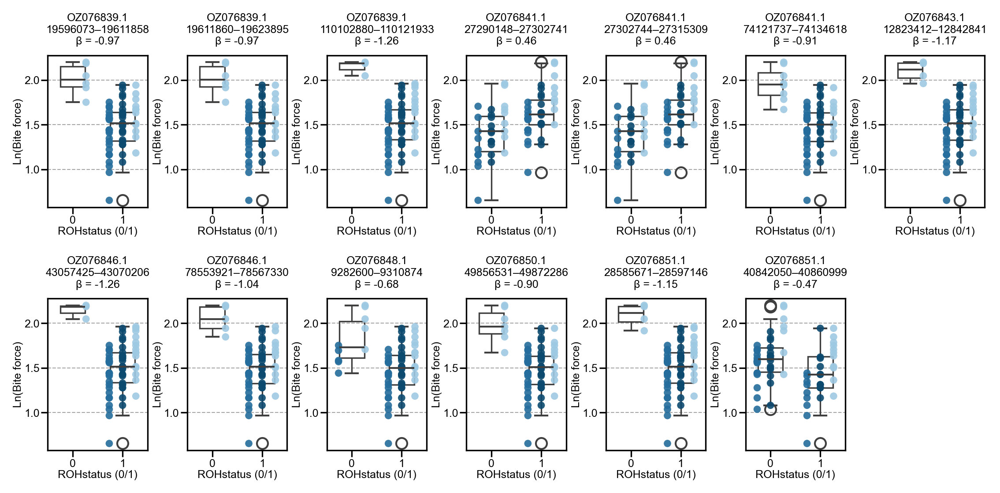

In [99]:
plot_roh_windows_grid(
    df_plot=df_plot_IL,
    sig_df=sig_df_IL,
    color_map=color_map1,
    out_file="ROH_windows_grid.svg"
)

In [112]:
def plot_roh_windows_grid(
    df_plot,
    sig_df,
    color_map,
    effect_col="BETA_ROH_STATUS",
    fig_width_cm=20,   # <- wider overall
    fig_height_cm=5,
    n_cols=6,          # <- FEWER columns → wider panels
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    out_file=None
):
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import seaborn as sns
    import math
    import os

    # =========================
    # Font (HOUSE STYLE)
    # =========================
    fm.fontManager.addfont(arial_path)
    arial_font = fm.FontProperties(fname=arial_path)
    arial_name = arial_font.get_name()

    plt.rcParams['font.family'] = arial_name
    plt.rcParams['font.sans-serif'] = [arial_name]

    plt.rcParams['font.size'] = 6
    plt.rcParams['axes.labelsize'] = 8
    plt.rcParams['xtick.labelsize'] = 6
    plt.rcParams['ytick.labelsize'] = 6

    # =========================
    # Log-transform phenotype
    # =========================
    df_plot = df_plot.copy()
    df_plot["PHENO_LOG"] = np.log(df_plot["PHENO"])

    # =========================
    # Windows
    # =========================
    windows = df_plot["WINDOW_ID"].unique()
    n_plots = len(windows)

    # enforce 2 rows
    n_rows = 1
    n_cols = n_plots

    # =========================
    # Figure
    # =========================
    cm = 1 / 2.54
    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(fig_width_cm * cm, fig_height_cm * cm),
        dpi=300,
        squeeze=False
    )

    axes = axes.flatten()

    # consistent population order
    pop_order = sorted(color_map.keys())

    # =========================
    # Plot loop
    # =========================
    for i, window in enumerate(windows):

        ax = axes[i]
        df_w = df_plot[df_plot["WINDOW_ID"] == window]

        if df_w["ROH_STATUS"].nunique() < 2:
            ax.axis("off")
            continue

        beta = sig_df.loc[
            sig_df["WINDOW_ID"] == window,
            effect_col
        ].iloc[0]

        # Grid
        ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

        # Boxplot (log scale)
        sns.boxplot(
            x="ROH_STATUS",
            y="PHENO_LOG",
            data=df_w,
            showcaps=True,
            boxprops={"facecolor": "none", "linewidth": 0.8},
            whiskerprops={"linewidth": 0.8},
            medianprops={"linewidth": 1},
            width=0.5,
            ax=ax
        )

        # Stripplot (NO jitter, grouped populations)
        sns.stripplot(
            x="ROH_STATUS",
            y="PHENO_LOG",
            data=df_w,
            hue="Population",
            hue_order=pop_order,
            palette=color_map,
            jitter=False,      # <- key change
            dodge=True,        # <- separates populations
            size=4,
            alpha=0.9,
            ax=ax,
            zorder=2
        )

        # remove per-panel legend
        if ax.get_legend():
            ax.get_legend().remove()

        # Labels
        ax.set_xlabel("ROHstatus (0/1)", fontsize=6,labelpad=0.5)
        ax.set_ylabel("Ln(Bite force)", fontsize=6,labelpad=0.5)
        # =========================
        # Format window label (3 lines)
        # =========================
        chrom, coords = window.split(":")
        start, end = coords.split("-")
        
        coords_fmt = f"{int(start)}–{int(end)}"
        
        title = f"{chrom}\n{coords_fmt}\nβ = {beta:.2f}"
        
        ax.set_title(title, fontsize=6, linespacing=1.2)

        ax.tick_params(axis='x', pad=1)
        ax.tick_params(axis='y', pad=1)

    # =========================
    # Remove empty panels
    # =========================
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")


    # # =========================
    # # GLOBAL LEGEND
    # # =========================
    # handles = [
    #     plt.Line2D([0], [0], marker='o', linestyle='', color=color_map[p], label=p, markersize=4)
    #     for p in pop_order
    # ]

    # fig.legend(
    #     handles=handles,
    #     labels=pop_order,
    #     title="Population",
    #     loc="lower right",
    #     bbox_to_anchor=(0.5, 0.98),
    #     ncol=len(pop_order),
    #     fontsize=6,
    #     frameon=False
    # )

    # =========================
    # Layout (HOUSE STYLE)
    # =========================
    plt.subplots_adjust(
        left=0.08,
        right=0.74,   # <- use full width
        bottom=0.12,
        top=0.74,
        wspace=0.4,
        hspace=0.6    # <- more vertical space for titles
    )

    # =========================
    # Save
    # =========================
    if out_file is not None:
        plt.savefig(out_file, dpi=300)
        print(f"Saved figure to: {os.path.abspath(out_file)}")

    plt.show()

Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_windows_grid_ML.svg


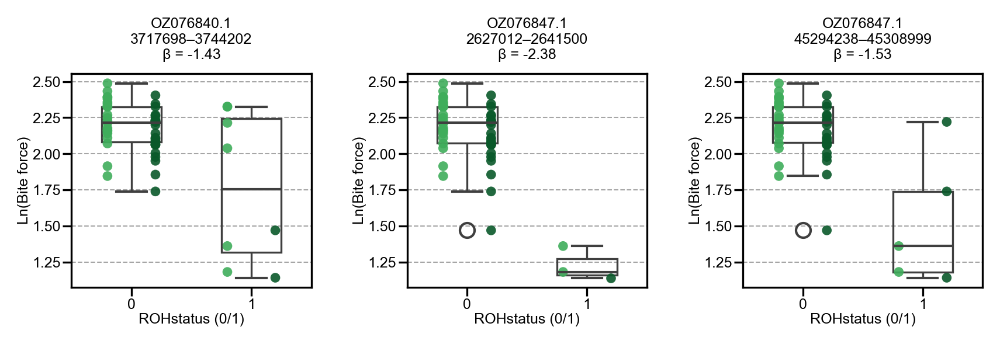

In [113]:
plot_roh_windows_grid(
    df_plot=df_plot_ML,
    sig_df=sig_df_ML,
    color_map=color_map2,
    out_file="ROH_windows_grid_ML.svg"
)

In [100]:
color_map2 = {'VS': '#0A592A',
    'TM': '#3FAD5B'}

In [32]:
sig_df_IL[["WINDOW_ID", "CHR", "BETA_ROH_STATUS", "N_ROH", "N_NONROH", "P_ROH_STATUS", "LOGP"]] \
    .to_csv("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_50/significant_windows/roh_neff_significant_windows_IL.tsv", sep="\t", index=False)


#### 11.1.3. All 

In [ ]:
##### SimpleM all samples

In [268]:
import pandas as pd
import numpy as np
import glob, os


def neff_from_roh_matrix(X, variance_threshold=0.995):
    """
    Compute effective number of independent tests (simpleM-style)
    from an individual × window ROH matrix.
    """

    # Drop windows with zero variance (all 0 or all 1)
    variances = X.var(axis=0)
    X = X.loc[:, variances > 0]

    # If too few windows remain, N_eff = number of windows
    if X.shape[1] <= 1:
        return X.shape[1]

    # Standardize
    X_std = (X - X.mean(axis=0)) / X.std(axis=0, ddof=0)
    X_std = X_std.fillna(0)

    # Correlation matrix
    R = np.corrcoef(X_std.values, rowvar=False)

    # Eigenvalues
    eigvals = np.linalg.eigvalsh(R)
    eigvals = np.sort(eigvals)[::-1]

    cumvar = np.cumsum(eigvals) / np.sum(eigvals)
    neff = np.searchsorted(cumvar, variance_threshold) + 1

    return neff


def compute_neff_from_window_folder_all(
    input_dir,
    variance_threshold=0.995,
    file_pattern="gwas_input_windows_covariates_*.tsv"
):
    """
    Compute genome-wide N_eff using ALL individuals together.
    """

    files = sorted(glob.glob(os.path.join(input_dir, file_pattern)))

    if not files:
        raise FileNotFoundError("No input files found in directory")

    total_neff = 0
    summary = []

    print(f"\nComputing N_eff using ALL individuals")
    print(f"Scanning {len(files)} chromosome files\n")

    for f in files:
        df = pd.read_csv(f, sep="\t")

        if df.empty:
            continue

        chrom = df["CHR"].iloc[0]

        # Individual × window matrix (ALL IIDs)
        X = (
            df.pivot_table(
                index="IID",
                columns="WINDOW_ID",
                values="ROH_STATUS",
                fill_value=0
            )
            .astype(float)
        )

        if X.shape[1] < 2:
            continue

        neff_chr = neff_from_roh_matrix(X, variance_threshold)

        total_neff += neff_chr

        summary.append({
            "CHR": chrom,
            "N_individuals": X.shape[0],
            "N_windows": X.shape[1],
            "N_eff": neff_chr
        })

        print(
            f"{chrom}: individuals={X.shape[0]} "
            f"windows={X.shape[1]}  N_eff={neff_chr}"
        )

    print(f"\nTOTAL genome-wide N_eff = {total_neff}\n")

    return total_neff, pd.DataFrame(summary)


In [269]:
INPUT_DIR = "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/roh_gwas_input_windows/1500_50"

neff_all, neff_all_chr = compute_neff_from_window_folder_all(
    INPUT_DIR,
)


Computing N_eff using ALL individuals
Scanning 18 chromosome files

OZ076838.1: individuals=134 windows=8590  N_eff=118
OZ076839.1: individuals=134 windows=7516  N_eff=119
OZ076840.1: individuals=134 windows=7606  N_eff=120
OZ076841.1: individuals=134 windows=6582  N_eff=118
OZ076842.1: individuals=134 windows=6252  N_eff=117
OZ076843.1: individuals=134 windows=6262  N_eff=118
OZ076844.1: individuals=134 windows=5538  N_eff=117
OZ076845.1: individuals=134 windows=5789  N_eff=117
OZ076846.1: individuals=134 windows=4895  N_eff=118
OZ076847.1: individuals=134 windows=4751  N_eff=116
OZ076848.1: individuals=134 windows=3952  N_eff=119
OZ076849.1: individuals=134 windows=3721  N_eff=118
OZ076850.1: individuals=134 windows=3130  N_eff=117
OZ076851.1: individuals=134 windows=3389  N_eff=115
OZ076853.1: individuals=134 windows=2977  N_eff=115
OZ076854.1: individuals=134 windows=2718  N_eff=116
OZ076855.1: individuals=134 windows=2627  N_eff=112
OZ076857.1: individuals=134 windows=728  N_eff=

In [ ]:
##### Exploratory plots


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 86,983
Windows excluded (NA/inf)  : 40

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 4832.4
  median = 4820.5
  range  = 728–8590

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 5.748e-07
  Classical Bonferroni -log10(p): 6.24
  Effective Bonferroni p   : 2.384e-05
  Effective Bonferroni -log10(p): 4.62



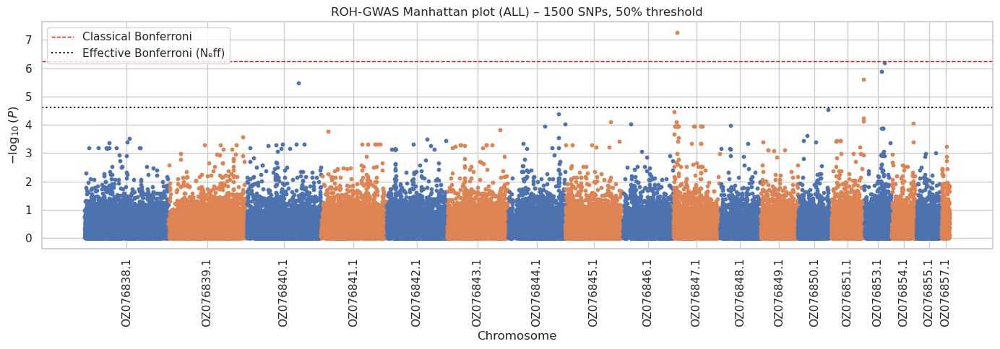

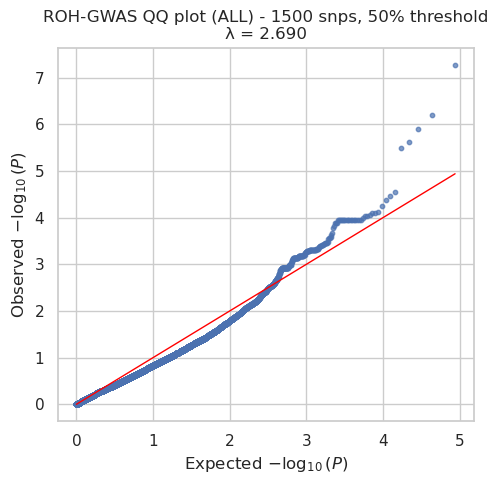

In [270]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_ALL_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (ALL) – 1500 SNPs, 50% threshold",
    neff_genome=2097
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_50/roh_gwas_windows_ALL_*.tsv"),
    "ROH-GWAS QQ plot (ALL) - 1500 snps, 50% threshold"
)


In [ ]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "gwas_roh/roh_gwas_results_windows/1500_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "ALL"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_ALL = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_ALL.shape[0]}")

# Load data
df_ALL = df_ALL.loc[
    df_ALL["P_ROH_STATUS"].notna()
    & np.isfinite(df_ALL["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_ALL["LOGP"] = -np.log10(df_ALL["P_ROH_STATUS"])
print(f"Total windows loaded: {df.shape[0]}")

neff_genome_ALL = 2097  # your simpleM result

p_eff_ALL = 0.05 / neff_genome_ALL
logp_eff_ALL = -np.log10(p_eff_ALL)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_ALL:.3e}")
print(f"  -log10(p) ≥ {logp_eff_ALL:.4f}")

sig_df_ALL = df_ALL.loc[
    df_ALL["LOGP"] >= logp_eff_ALL
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_ALL.shape[0]}")
print(sig_df_ALL)

Effect sizes excluded from plot (|β| outside [-10, 10]): 2411


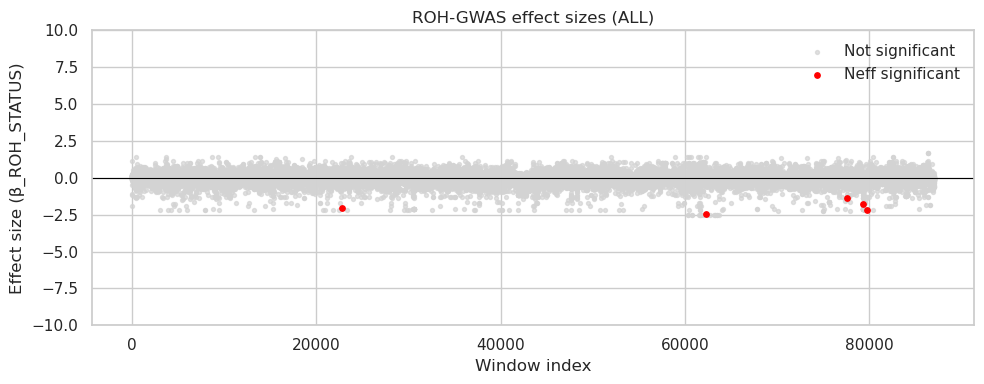

In [275]:
is_sig = df_ALL["LOGP"] >= logp_eff_ALL
beta_min = -10
beta_max = 10

beta_ok = (
    df_ALL["BETA_ROH_STATUS"].notna()
    & (df_ALL["BETA_ROH_STATUS"] >= beta_min)
    & (df_ALL["BETA_ROH_STATUS"] <= beta_max)
)
plot_mask = beta_ok
sig_plot_mask = beta_ok & is_sig

n_excluded = (~beta_ok).sum()
print(f"Effect sizes excluded from plot (|β| outside [{beta_min}, {beta_max}]): {n_excluded}")


plt.figure(figsize=(10, 4))

# Non-significant (within beta limits)
plt.scatter(
    df_ALL.loc[plot_mask & ~is_sig].index,
    df_ALL.loc[plot_mask & ~is_sig, "BETA_ROH_STATUS"],
    color="lightgrey",
    s=8,
    alpha=0.7,
    label="Not significant"
)

# Significant (within beta limits)
plt.scatter(
    df_ALL.loc[sig_plot_mask].index,
    df_ALL.loc[sig_plot_mask, "BETA_ROH_STATUS"],
    color="red",
    s=15,
    label="Neff significant"
)

plt.axhline(0, color="black", linewidth=0.8)

plt.ylim(beta_min, beta_max)

plt.xlabel("Window index")
plt.ylabel("Effect size (β_ROH_STATUS)")
plt.title("ROH-GWAS effect sizes (ALL)")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


Raw input rows loaded: 11661082
Significant windows: 5
Plotting 5 significant windows


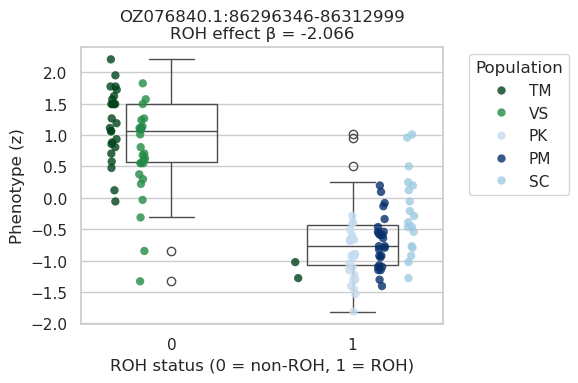

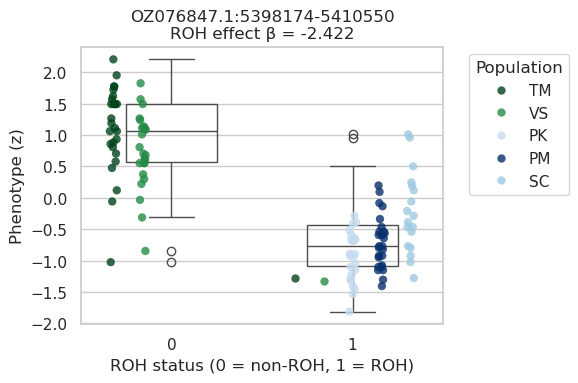

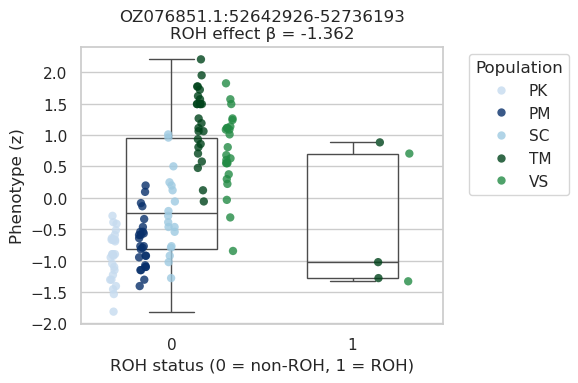

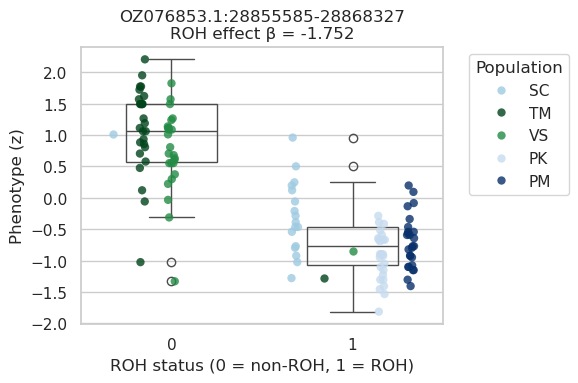

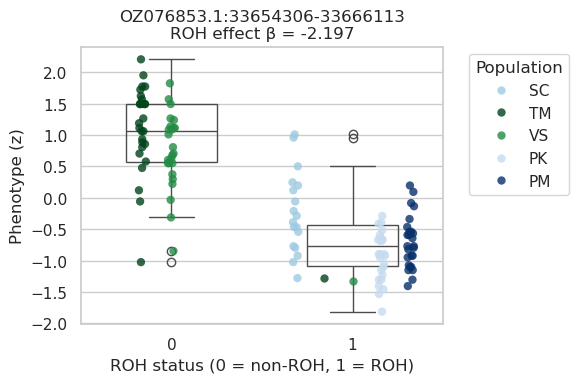

In [276]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_ALL = df_input[df_input["PC1"].notna()].copy()
df_input_ALL["Population"] = df_input_ALL["IID"].str.extract(r"([A-Z]+)")
df_input_ALL["Population"] = df_input_ALL["Population"].str.replace(r"^24", "", regex=True)

sig_windows = sig_df_ALL["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows)}")

df_plot_ALL = df_input_ALL[df_input_ALL["WINDOW_ID"].isin(sig_windows)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D'
}

windows = df_plot_ALL["WINDOW_ID"].unique()
print(f"Plotting {len(windows)} significant windows")

for window in windows:

    df_w = df_plot_ALL[df_plot_ALL["WINDOW_ID"] == window]

    # Skip windows with no ROH variation
    if df_w["ROH_STATUS"].nunique() < 2:
        continue

    # Get effect size from GWAS results
    beta = sig_df_ALL.loc[
        sig_df_ALL["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    plt.figure(figsize=(6, 4))

    # Boxplot
    sns.boxplot(
        x="ROH_STATUS",
        y="PHENO_z",     # or PHENO if you prefer raw scale
        data=df_w,
        showcaps=True,
        boxprops={"facecolor": "none"},
        width=0.5
    )

    # Population-coloured points
    sns.stripplot(
        x="ROH_STATUS",
        y="PHENO_z",
        data=df_w,
        hue="Population",
        dodge=True,
        jitter=True,
        size=6,
        alpha=0.8,
        palette=color_map
    )

    plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
    plt.ylabel("Phenotype (z)")
    plt.title(f"{window}\nROH effect β = {beta:.3f}")

    plt.legend(
        title="Population",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()


#### 11.1.4. Plots

In [41]:
def plot_manhattan_plot(
    file_glob,
    title,
    neff_genome,
    sig_file=None,                 # <--- NEW
    sig_effect_col="BETA_ROH_STATUS",         # effect size column
    chrom_colors=("#4C72B0", "#DD8452"),
    fig_width_cm=10,
    fig_height_cm=5,
    point_size=10,
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    out_file=None
):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import glob

    # ==================================================
    # Font: Arial
    # ==================================================
    arial_font = fm.FontProperties(fname=arial_path)
    plt.rcParams["font.family"] = arial_font.get_name()

    # ==================================================
    # Figure size
    # ==================================================
    cm = 1 / 2.54
    fig, ax = plt.subplots(figsize=(fig_width_cm * cm, fig_height_cm * cm))

    # ==================================================
    # Load GWAS windows
    # ==================================================
    files = sorted(glob.glob(file_glob))
    if not files:
        raise FileNotFoundError(f"No files matched glob: {file_glob}")

    df = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    df["POS"] = df["WINDOW_ID"].apply(window_midpoint)
    df["LOGP"] = -np.log10(df["P_ROH_STATUS"])

    # ==================================================
    # Chromosome order & cumulative position
    # ==================================================
    chrom_order = sorted(df["CHR"].unique(), key=chrom_numeric)

    chrom_offsets, offset = {}, 0
    for chrom in chrom_order:
        chrom_offsets[chrom] = offset
        offset += df.loc[df["CHR"] == chrom, "POS"].max()

    df["POS_CUM"] = df.apply(
        lambda r: r["POS"] + chrom_offsets[r["CHR"]],
        axis=1
    )

    chrom_centers = [
        (df[df["CHR"] == chrom]["POS_CUM"].min()
         + df[df["CHR"] == chrom]["POS_CUM"].max()) / 2
        for chrom in chrom_order
    ]

    # ==================================================
    # Threshold
    # ==================================================
    eff_bonf_logp = -np.log10(0.05 / neff_genome)

    # ==================================================
    # Main scatter
    # ==================================================
    for i, chrom in enumerate(chrom_order):
        sub = df[df["CHR"] == chrom]
        ax.scatter(
            sub["POS_CUM"],
            sub["LOGP"],
            s=point_size,
            color=chrom_colors[i % len(chrom_colors)],
            edgecolor="none",
            zorder=2
        )

    ax.axhline(
        eff_bonf_logp,
        color="black",
        linestyle="--",
        linewidth=1,
        zorder=1
    )

    # ==================================================
    # Overlay significant hits (optional)
    # ==================================================
    if sig_file is not None:

        # Load sig_df
        if isinstance(sig_file, str):
            sig_df = pd.read_csv(sig_file, sep=None, engine="python")
        else:
            sig_df = sig_file.copy()

        # Merge to get plotting coordinates
        sig_df = sig_df.merge(
            df[["WINDOW_ID", "POS_CUM"]],
            on="WINDOW_ID",
            how="left"
        )


        sig_pos = sig_df[sig_df[sig_effect_col] > 0]
        sig_neg = sig_df[sig_df[sig_effect_col] < 0]

        ax.scatter(
            sig_pos["POS_CUM"],
            sig_pos["LOGP"],
            s=point_size * 1.6,
            color="#7B1FA2",
            edgecolor="#7B1FA2",
            linewidth=0.3,
            zorder=4,
            label="Positive effect"
        )

        ax.scatter(
            sig_neg["POS_CUM"],
            sig_neg["LOGP"],
            s=point_size * 1.6,
            color="#B22222",
            edgecolor="#B22222",
            linewidth=0.3,
            zorder=4,
            label="Negative effect"
        )

    # ==================================================
    # Axis formatting
    # ==================================================
    chrom_labels = [str(i + 1) for i in range(len(chrom_centers))]

    ax.set_xticks(chrom_centers)
    ax.set_xticklabels(chrom_labels, fontsize=6)

    ax.tick_params(axis="y", labelsize=6)

    ax.set_xlabel("Chromosome", fontsize=8, fontproperties=arial_font)
    ax.set_ylabel(r"$-\log_{10}(p)$", fontsize=8, fontproperties=arial_font)
    ax.set_title(title)

    # Grid
    ax.set_axisbelow(True)
    ax.grid(axis="y", linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    ax.minorticks_on()
    ax.grid(
        which="minor",
        axis="y",
        linestyle="--",
        linewidth=0.3,
        color="grey",
        alpha=0.5
    )

    # Start dots at y=0
    ax.set_ylim(bottom=0)
    ax.margins(y=0, x=0.01)

    # Black box
    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(1)

    # Legend
    if sig_file is not None:
        ax.legend().remove()
    else:
        ax.legend().remove()

    plt.tight_layout()
    # ==================================================
    # Save figure (optional)
    # ==================================================
    if out_file is not None:
        plt.savefig(out_file, dpi=300, bbox_inches="tight")
        print(f"Saved figure to: {os.path.abspath(out_file)}")

    plt.show()


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_ML_manhattan.png


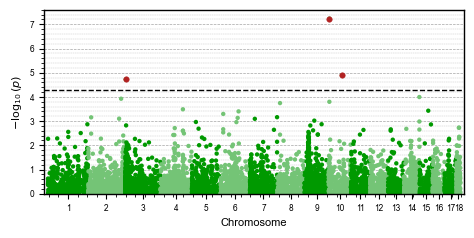

In [42]:
plot_manhattan_plot(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_MAINLAND_*.tsv",
    title="",
    sig_file=sig_df_ML,
    neff_genome=947,
    chrom_colors=("#009900", "#74C476"),
    fig_width_cm=12,
    fig_height_cm=6,
    out_file="ROH_GWAS_ML_manhattan.png"
)


In [39]:
def plot_manhattan_plot(
    file_glob,
    title,
    neff_genome,
    sig_file=None,
    sig_effect_col="BETA_ROH_STATUS",
    chrom_colors=("#208438", "#479BC9"),  # <- MATCHES your palette
    fig_width_cm=6.75,
    fig_height_cm=6,
    point_size=6,
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    out_file=None
):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import glob
    import os

    # =========================
    # Font (IDENTICAL SYSTEM)
    # =========================
    fm.fontManager.addfont(arial_path)
    arial_font = fm.FontProperties(fname=arial_path)
    arial_name = arial_font.get_name()

    plt.rcParams['font.family'] = arial_name
    plt.rcParams['font.sans-serif'] = [arial_name]

    plt.rcParams['font.size'] = 6
    plt.rcParams['axes.labelsize'] = 8
    plt.rcParams['xtick.labelsize'] = 6
    plt.rcParams['ytick.labelsize'] = 6

    # =========================
    # Figure (IDENTICAL SIZE)
    # =========================
    cm = 1 / 2.54
    fig, ax = plt.subplots(figsize=(fig_width_cm * cm, fig_height_cm * cm), dpi=300)

    # =========================
    # Load data
    # =========================
    files = sorted(glob.glob(file_glob))
    if not files:
        raise FileNotFoundError(f"No files matched glob: {file_glob}")

    df = pd.concat((pd.read_csv(f, sep="\t") for f in files), ignore_index=True)

    df["POS"] = df["WINDOW_ID"].apply(window_midpoint)
    df["LOGP"] = -np.log10(df["P_ROH_STATUS"])

    # =========================
    # Chromosome positions
    # =========================
    chrom_order = sorted(df["CHR"].unique(), key=chrom_numeric)

    chrom_offsets, offset = {}, 0
    for chrom in chrom_order:
        chrom_offsets[chrom] = offset
        offset += df.loc[df["CHR"] == chrom, "POS"].max()

    df["POS_CUM"] = df.apply(
        lambda r: r["POS"] + chrom_offsets[r["CHR"]],
        axis=1
    )

    chrom_centers = [
        (df[df["CHR"] == chrom]["POS_CUM"].min()
         + df[df["CHR"] == chrom]["POS_CUM"].max()) / 2
        for chrom in chrom_order
    ]

    # =========================
    # Threshold
    # =========================
    eff_bonf_logp = -np.log10(0.05 / neff_genome)

    # =========================
    # Grid (IDENTICAL STYLE)
    # =========================
    ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

    # =========================
    # Scatter
    # =========================
    for i, chrom in enumerate(chrom_order):
        sub = df[df["CHR"] == chrom]
        ax.scatter(
            sub["POS_CUM"],
            sub["LOGP"],
            s=point_size,
            color=chrom_colors[i % len(chrom_colors)],
            edgecolor="none",
            zorder=2
        )

    # Threshold line
    ax.axhline(eff_bonf_logp, linestyle="--", linewidth=0.5, color="black")

    # =========================
    # Significant overlay
    # =========================
    if sig_file is not None:

        if isinstance(sig_file, str):
            sig_df = pd.read_csv(sig_file, sep=None, engine="python")
        else:
            sig_df = sig_file.copy()

        sig_df = sig_df.merge(
            df[["WINDOW_ID", "POS_CUM"]],
            on="WINDOW_ID",
            how="left"
        )

        sig_pos = sig_df[sig_df[sig_effect_col] > 0]
        sig_neg = sig_df[sig_df[sig_effect_col] < 0]

        ax.scatter(
            sig_pos["POS_CUM"],
            sig_pos["LOGP"],
            s=point_size * 1.6,
            color="#7B1FA2",
            edgecolor="#7B1FA2",
            linewidth=0.3,
            zorder=4,
            label="Positive effect"
        )

        ax.scatter(
            sig_neg["POS_CUM"],
            sig_neg["LOGP"],
            s=point_size * 1.6,
            color="#B22222",
            edgecolor="#B22222",
            linewidth=0.3,
            zorder=4,
            label="Negative effect"
        )
    # =========================
    # Axes styling (MATCHED)
    # =========================
    ax.set_xlabel("")
    ax.set_ylabel(r"$-\log_{10}(p)$")

    ax.set_xticks(chrom_centers)
    ax.set_xticklabels([""] * len(chrom_centers))

    # remove y labels like your stripplot
    ax.set_ylabel("")
    ax.tick_params(axis='y', labelleft=False)

    ax.tick_params(axis='x', rotation=45, pad=4)
    ax.tick_params(axis='y', pad=4)

    # limits
    ax.set_ylim(bottom=0)
    ax.margins(x=0.01)

    # =========================
    # Layout (CRUCIAL MATCH)
    # =========================
    ax.set_position([0.10, 0.18, 0.74, 0.74])

    # =========================
    # Save
    # =========================
    fig.canvas.draw()

    if out_file is not None:
        plt.savefig(out_file, dpi=300)
        print(f"Saved figure to: {os.path.abspath(out_file)}")

    plt.show()

Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_ML_manhattan_test.png


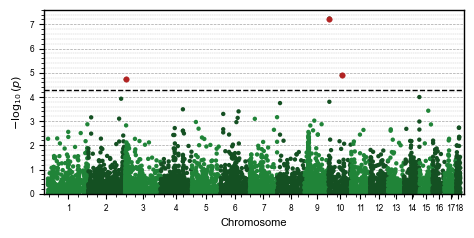

In [43]:
plot_manhattan_plot(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_MAINLAND_*.tsv",
    title="",
    sig_file=sig_df_ML,
    neff_genome=947,
    chrom_colors=("#208438", "#145022"),
    fig_width_cm=12,
    fig_height_cm=6,
    out_file="ROH_GWAS_ML_manhattan_test.png"
)

In [605]:
def plot_manhattan_plot(
    file_glob,
    title,
    neff_genome,
    sig_file=None,                 # <--- NEW
    sig_effect_col="BETA_ROH_STATUS",         # effect size column
    chrom_colors=("#4C72B0", "#DD8452"),
    fig_width_cm=10,
    fig_height_cm=5,
    point_size=10,
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    out_file=None
):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import glob

    # ==================================================
    # Font: Arial
    # ==================================================
    arial_font = fm.FontProperties(fname=arial_path)
    plt.rcParams["font.family"] = "Dejavu Sans"

    # ==================================================
    # Figure size
    # ==================================================
    cm = 1 / 2.54
    fig, ax = plt.subplots(figsize=(fig_width_cm * cm, fig_height_cm * cm))

    # ==================================================
    # Load GWAS windows
    # ==================================================
    files = sorted(glob.glob(file_glob))
    if not files:
        raise FileNotFoundError(f"No files matched glob: {file_glob}")

    df = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    df["POS"] = df["WINDOW_ID"].apply(window_midpoint)
    df["LOGP"] = -np.log10(df["P_ROH_STATUS"])

    # ==================================================
    # Chromosome order & cumulative position
    # ==================================================
    chrom_order = sorted(df["CHR"].unique(), key=chrom_numeric)

    chrom_offsets, offset = {}, 0
    for chrom in chrom_order:
        chrom_offsets[chrom] = offset
        offset += df.loc[df["CHR"] == chrom, "POS"].max()

    df["POS_CUM"] = df.apply(
        lambda r: r["POS"] + chrom_offsets[r["CHR"]],
        axis=1
    )

    chrom_centers = [
        (df[df["CHR"] == chrom]["POS_CUM"].min()
         + df[df["CHR"] == chrom]["POS_CUM"].max()) / 2
        for chrom in chrom_order
    ]

    # ==================================================
    # Threshold
    # ==================================================
    eff_bonf_logp = -np.log10(0.05 / neff_genome)

    # ==================================================
    # Main scatter
    # ==================================================
    for i, chrom in enumerate(chrom_order):
        sub = df[df["CHR"] == chrom]
        ax.scatter(
            sub["POS_CUM"],
            sub["LOGP"],
            s=point_size,
            color=chrom_colors[i % len(chrom_colors)],
            edgecolor="none",
            zorder=2
        )

    ax.axhline(
        eff_bonf_logp,
        color="black",
        linestyle="--",
        linewidth=3,
        zorder=1
    )

    # ==================================================
    # Overlay significant hits (optional)
    # ==================================================
    if sig_file is not None:

        # Load sig_df
        if isinstance(sig_file, str):
            sig_df = pd.read_csv(sig_file, sep=None, engine="python")
        else:
            sig_df = sig_file.copy()

        # Merge to get plotting coordinates
        sig_df = sig_df.merge(
            df[["WINDOW_ID", "POS_CUM"]],
            on="WINDOW_ID",
            how="left"
        )


        sig_pos = sig_df[sig_df[sig_effect_col] > 0]
        sig_neg = sig_df[sig_df[sig_effect_col] < 0]

        ax.scatter(
            sig_pos["POS_CUM"],
            sig_pos["LOGP"],
            s=point_size * 1.6,
            color="#7B1FA2",
            edgecolor="#7B1FA2",
            linewidth=0.3,
            zorder=4,
            label="Positive effect"
        )

        ax.scatter(
            sig_neg["POS_CUM"],
            sig_neg["LOGP"],
            s=point_size * 1.6,
            color="#B22222",
            edgecolor="#B22222",
            linewidth=0.3,
            zorder=4,
            label="Negative effect"
        )

    # ==================================================
    # Axis formatting
    # ==================================================
    chrom_labels = [str(i + 1) for i in range(len(chrom_centers))]

    ax.set_xticks(chrom_centers)
    ax.set_xticklabels(chrom_labels, fontsize=20)

    ax.tick_params(axis="y", labelsize=30)

    ax.set_xlabel("Chromosome", fontsize=30, fontproperties=arial_font)
    ax.set_ylabel(r"$-\log_{10}(p)$", fontsize=40, fontproperties=arial_font)
    ax.set_title(title)

    # Grid
    ax.set_axisbelow(True)
    ax.grid(axis="y", linestyle="--", linewidth=2, color="grey", alpha=0.7)
    # ax.minorticks_on()
    # ax.grid(
    #     which="minor",
    #     axis="y",
    #     linestyle="--",
    #     linewidth=2,
    #     color="grey",
    #     alpha=0.5
    # )

    # Start dots at y=0
    ax.set_ylim(bottom=0)
    ax.margins(y=0, x=0.01)

    # Black box
    # for spine in ax.spines.values():
    #     spine.set_color("black")
    #     spine.set_linewidth(1)

    # Legend
    if sig_file is not None:
        ax.legend().remove()
    else:
        ax.legend().remove()

    plt.tight_layout()
    # ==================================================
    # Save figure (optional)
    # ==================================================
    if out_file is not None:
        plt.savefig(out_file, dpi=300, bbox_inches="tight")
        print(f"Saved figure to: {os.path.abspath(out_file)}")

    plt.show()


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_ML_manhattan_poster.png


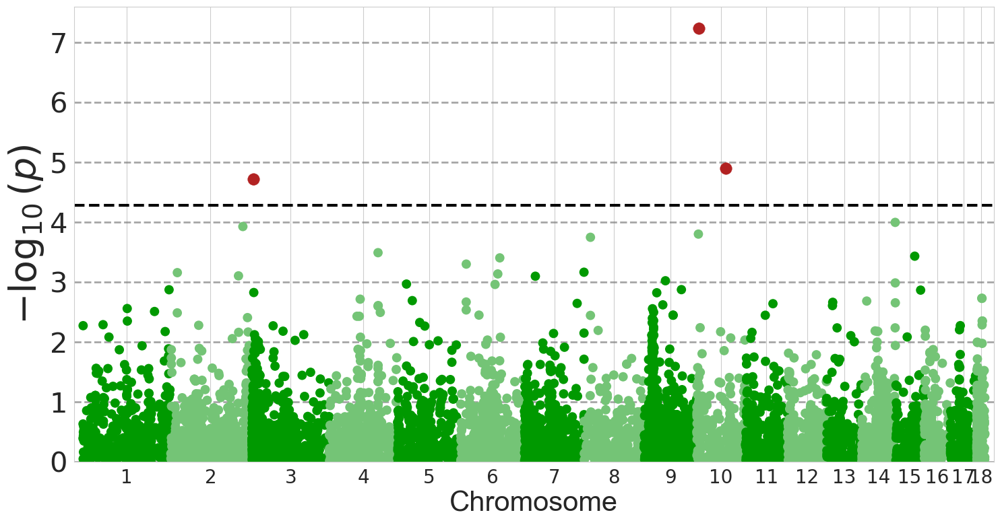

In [608]:
plot_manhattan_plot(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_MAINLAND_*.tsv",
    title="",
    sig_file=sig_df_ML,
    neff_genome=947,
    chrom_colors=("#009900", "#74C476"),
    fig_width_cm=38,
    fig_height_cm=20,
    point_size=100,
    out_file="ROH_GWAS_ML_manhattan_poster.png"
)

Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_IL_manhattan_poster.png


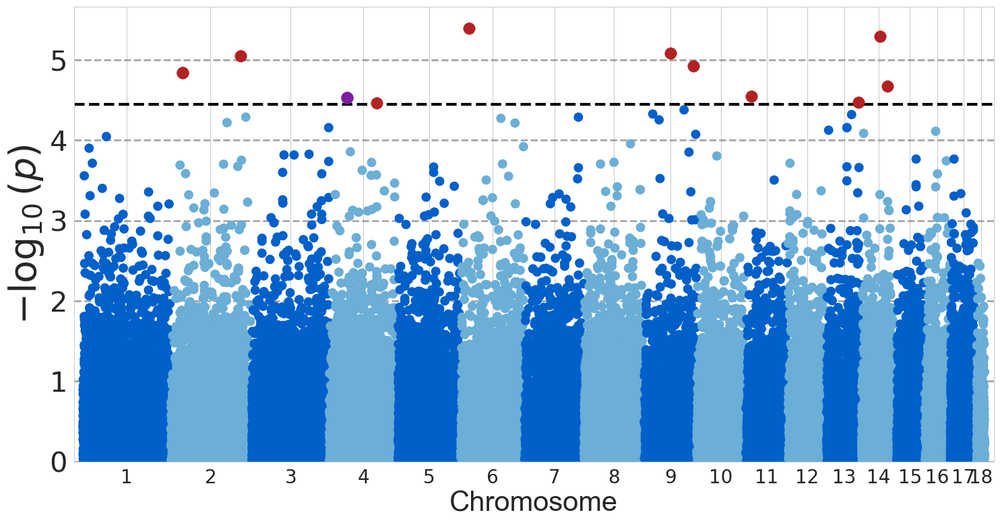

In [609]:
plot_manhattan_plot(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_ISLAND_*.tsv",
    title="",
    sig_file=sig_df_IL,
    neff_genome=1409,
    chrom_colors=("#0060CA", "#6BAED6"),
    fig_width_cm=38,
    fig_height_cm=20,
    point_size=100,
    out_file="ROH_GWAS_IL_manhattan_poster.png"
)


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_IL_manhattan.png


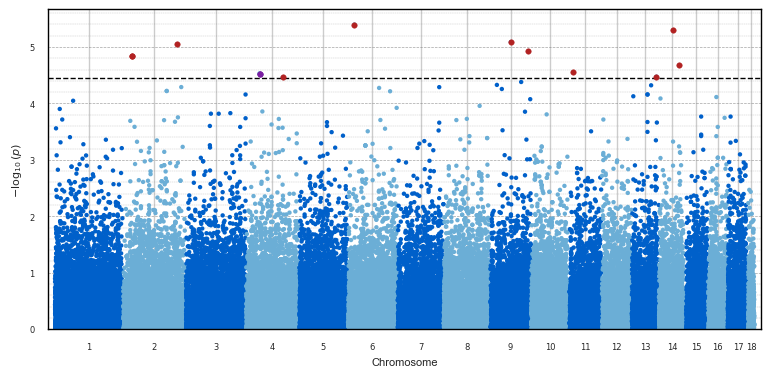

In [384]:
plot_manhattan_plot(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_ISLAND_*.tsv",
    title="",
    sig_file=sig_df_IL,
    neff_genome=1409,
    chrom_colors=("#0060CA", "#6BAED6"),
    fig_width_cm=20,
    fig_height_cm=10,
    out_file="ROH_GWAS_IL_manhattan.png"
)


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_IL_manhattan_test.png


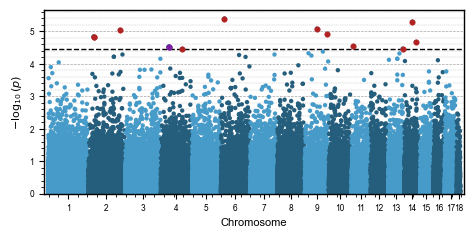

In [44]:
plot_manhattan_plot(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_ISLAND_*.tsv",
    title="",
    sig_file=sig_df_IL,
    neff_genome=1409,
    chrom_colors=("#479BC9", "#255E7D"),
    fig_width_cm=12,
    fig_height_cm=6,
    out_file="ROH_GWAS_IL_manhattan_test.png"
)


In [45]:
def plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob,
    sig_df,
    effect_col="BETA_ROH_STATUS",
    fig_width_cm=10,
    fig_height_cm=10,
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    neg_color="#2C7BB6",
    pos_color="#D7191C",
    curve_alpha=0.5,
    point_size=20,
    out_file=None
):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import glob
    from scipy.stats import gaussian_kde

    # ==================================================
    # Font: Arial (HPC-safe)
    # ==================================================
    arial_font = fm.FontProperties(fname=arial_path)
    plt.rcParams["font.family"] = arial_font.get_name()
    plt.rcParams["pdf.fonttype"] = 42
    plt.rcParams["ps.fonttype"] = 42

    # ==================================================
    # Load GWAS windows via glob (for KDE)
    # ==================================================
    files = sorted(glob.glob(file_glob))
    if not files:
        raise FileNotFoundError(f"No files matched glob: {file_glob}")

    df_all = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    if effect_col not in df_all.columns:
        raise KeyError(
            f"Column '{effect_col}' not found in GWAS files.\n"
            f"Available columns:\n{list(df_all.columns)}"
        )

    effects_all = df_all[effect_col].dropna().values
    if len(effects_all) < 2:
        raise ValueError("Need at least 2 effect sizes for KDE.")

    # ==================================================
    # KDE (single bell curve)
    # ==================================================
    kde = gaussian_kde(effects_all)
    x = np.linspace(
        effects_all.min() * 1.1,
        effects_all.max() * 1.1,
        1000
    )
    y = kde(x)

    # Split for coloring
    x_neg, y_neg = x[x <= 0], y[x <= 0]
    x_pos, y_pos = x[x >= 0], y[x >= 0]

    # ==================================================
    # Prepare significant points
    # ==================================================
    if effect_col not in sig_df.columns:
        raise KeyError(
            f"Column '{effect_col}' not found in sig_df.\n"
            f"Available columns:\n{list(sig_df.columns)}"
        )

    sig_effects = sig_df[effect_col].dropna().values
    pos = sig_effects > 0
    neg = sig_effects < 0

    # small vertical jitter so points sit on baseline
    y_jitter = np.random.uniform(
        low=0,
        high=y.max() * 0.04,
        size=len(sig_effects)
    )

    # ==================================================
    # Figure
    # ==================================================
    cm = 1 / 2.54
    fig, ax = plt.subplots(
        figsize=(fig_width_cm * cm, fig_height_cm * cm)
    )

    # Filled KDE
    ax.fill_between(x_neg, y_neg, color=neg_color, alpha=curve_alpha)
    ax.fill_between(x_pos, y_pos, color=pos_color, alpha=curve_alpha)

    # KDE outline
    ax.plot(x, y, color="black", linewidth=1)

    # Zero line
    ax.axvline(0, color="black", linestyle="--", linewidth=1)

    # ==================================================
    # Overlay significant points
    # ==================================================
    ax.scatter(
        sig_effects[pos],
        y_jitter[pos],
        color=pos_color,
        s=point_size,
        edgecolor=pos_color,
        linewidth=0.3,
        zorder=3,
        label="Positive effect"
    )

    ax.scatter(
        sig_effects[neg],
        y_jitter[neg],
        color=neg_color,
        s=point_size,
        edgecolor=neg_color,
        linewidth=0.3,
        zorder=3,
        label="Negative effect"
    )

    # ==================================================
    # Axes formatting
    # ==================================================
    ax.set_xlabel("Effect size", fontsize=8, fontproperties=arial_font)
    ax.set_ylabel("Density", fontsize=8, fontproperties=arial_font)
    ax.tick_params(axis="both", labelsize=6)

    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(1)
    # Grid
    ax.set_axisbelow(True)
    ax.grid(axis="y", linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    ax.minorticks_on()
    ax.grid(
        which="minor",
        axis="y",
        linestyle="--",
        linewidth=0.3,
        color="grey",
        alpha=0.5
    )

    # Start dots at y=0
    #ax.set_ylim(bottom=0.00000001)
    #ax.margins(y=0.01, x=0.01)

    #ax.legend(frameon=False, fontsize=6)

    plt.tight_layout()
    # ==================================================
    # Save figure (optional)
    # ==================================================
    if out_file is not None:
        plt.savefig(out_file, dpi=300, bbox_inches="tight")
        print(f"Saved figure to: {os.path.abspath(out_file)}")
    plt.show()


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_IL_effect.png


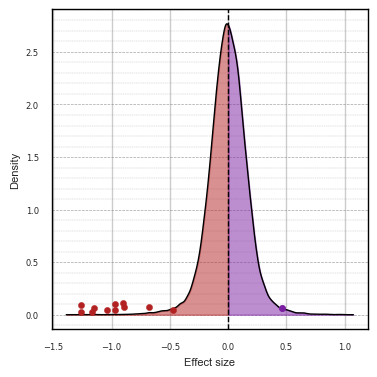

In [428]:
plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
              "gwas_roh/roh_gwas_results_windows/1500_50/"
              "roh_gwas_windows_ISLAND_*.tsv",
    sig_df = sig_df_IL,
    effect_col="BETA_ROH_STATUS",
    neg_color="#B22222",   
    pos_color="#7B1FA2",
    out_file="ROH_GWAS_IL_effect.png"
    
)


In [50]:
def plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob,
    sig_df,
    effect_col="BETA_ROH_STATUS",
    fig_width_cm=6.75,
    fig_height_cm=6,
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    neg_color="#479BC9",   # <- MATCH
    pos_color="#208438",   # <- MATCH
    curve_alpha=0.5,
    point_size=6,
    out_file=None
):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import glob
    import os
    from scipy.stats import gaussian_kde

    # =========================
    # Font (IDENTICAL SYSTEM)
    # =========================
    fm.fontManager.addfont(arial_path)
    arial_font = fm.FontProperties(fname=arial_path)
    arial_name = arial_font.get_name()

    plt.rcParams['font.family'] = arial_name
    plt.rcParams['font.sans-serif'] = [arial_name]

    plt.rcParams['font.size'] = 6
    plt.rcParams['axes.labelsize'] = 8
    plt.rcParams['xtick.labelsize'] = 6
    plt.rcParams['ytick.labelsize'] = 6

    # =========================
    # Figure (IDENTICAL SIZE)
    # =========================
    cm = 1 / 2.54
    fig, ax = plt.subplots(
        figsize=(fig_width_cm * cm, fig_height_cm * cm),
        dpi=300
    )

    # =========================
    # Load data
    # =========================
    files = sorted(glob.glob(file_glob))
    if not files:
        raise FileNotFoundError(f"No files matched glob: {file_glob}")

    df_all = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    effects_all = df_all[effect_col].dropna().values

    # =========================
    # KDE
    # =========================
    kde = gaussian_kde(effects_all)
    x = np.linspace(
        effects_all.min() * 1.1,
        effects_all.max() * 1.1,
        1000
    )
    y = kde(x)

    x_neg, y_neg = x[x <= 0], y[x <= 0]
    x_pos, y_pos = x[x >= 0], y[x >= 0]

    # =========================
    # Significant points
    # =========================
    sig_effects = sig_df[effect_col].dropna().values
    pos = sig_effects > 0
    neg = sig_effects < 0

    y_jitter = np.random.uniform(
        low=0,
        high=y.max() * 0.04,
        size=len(sig_effects)
    )

    # =========================
    # Grid (MATCHED)
    # =========================
    ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

    # =========================
    # KDE fill (soft)
    # =========================
    ax.fill_between(x_neg, y_neg, color=neg_color, alpha=curve_alpha)
    ax.fill_between(x_pos, y_pos, color=pos_color, alpha=curve_alpha)

    # outline (subtle)
    ax.plot(x, y, color="black", linewidth=0.5)

    # zero line
    ax.axvline(0, linestyle="--", linewidth=0.5, color="black")

    # =========================
    # Points (MATCH STYLE)
    # =========================
    ax.scatter(
        sig_effects[pos],
        y_jitter[pos],
        color=pos_color,
        s=point_size,
        alpha=1,
        zorder=2
    )

    ax.scatter(
        sig_effects[neg],
        y_jitter[neg],
        color=neg_color,
        s=point_size,
        alpha=1,
        zorder=2
    )

    # =========================
    # Axes styling (MATCHED)
    # =========================
    ax.set_xlabel("")
    ax.set_ylabel("")

    # remove y labels
    ax.tick_params(axis='y', labelleft=False)

    ax.tick_params(axis='x', pad=4, labelbottom=False)
    ax.tick_params(axis='y', pad=4)

    ax.margins(x=0.02)

    # =========================
    # Layout (CRUCIAL MATCH)
    # =========================
    ax.set_position([0.10, 0.18, 0.85, 0.74])

    # =========================
    # Save (FIXED)
    # =========================
    fig.canvas.draw()

    if out_file is not None:
        plt.savefig(out_file, dpi=300)  # NO tight bbox
        print(f"Saved figure to: {os.path.abspath(out_file)}")

    plt.show()

Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_IL_effect.png


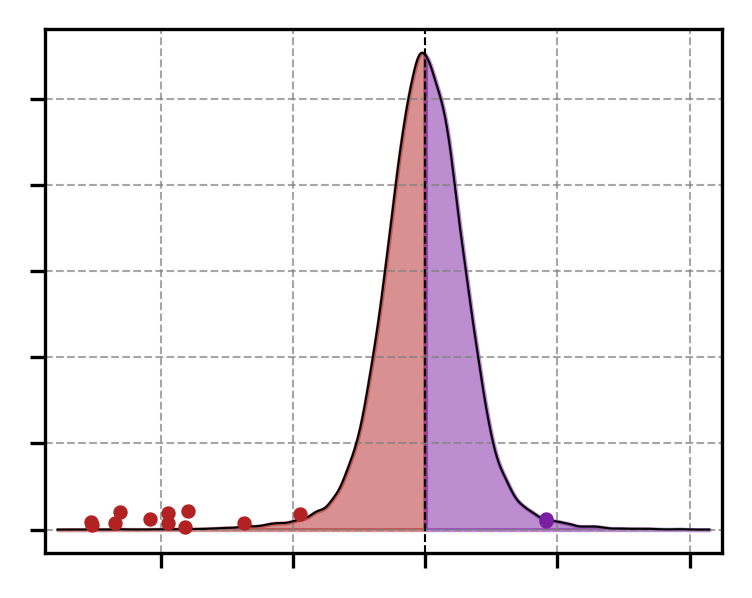

In [51]:
plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
              "gwas_roh/roh_gwas_results_windows/1500_50/"
              "roh_gwas_windows_ISLAND_*.tsv",
    sig_df = sig_df_IL,
    effect_col="BETA_ROH_STATUS",
    neg_color="#B22222",   
    pos_color="#7B1FA2",
    out_file="ROH_GWAS_IL_effect.png"
    
)


In [489]:
def plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob,
    sig_df,
    effect_col="BETA_ROH_STATUS",
    fig_width_cm=10,
    fig_height_cm=10,
    arial_path="/scratch/antwerpen/206/vsc20666/arial.ttf",
    neg_color="#2C7BB6",
    pos_color="#D7191C",
    curve_alpha=0.5,
    point_size=20,
    out_file=None
):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.font_manager as fm
    import glob
    from scipy.stats import gaussian_kde

    # ==================================================
    # Font: Arial (HPC-safe)
    # ==================================================
    arial_font = fm.FontProperties(fname=arial_path)
    plt.rcParams["font.family"] = arial_font.get_name()
    plt.rcParams["pdf.fonttype"] = 42
    plt.rcParams["ps.fonttype"] = 42

    # ==================================================
    # Load GWAS windows via glob (for KDE)
    # ==================================================
    files = sorted(glob.glob(file_glob))
    if not files:
        raise FileNotFoundError(f"No files matched glob: {file_glob}")

    df_all = pd.concat(
        (pd.read_csv(f, sep="\t") for f in files),
        ignore_index=True
    )

    if effect_col not in df_all.columns:
        raise KeyError(
            f"Column '{effect_col}' not found in GWAS files.\n"
            f"Available columns:\n{list(df_all.columns)}"
        )

    effects_all = df_all[effect_col].dropna().values
    if len(effects_all) < 2:
        raise ValueError("Need at least 2 effect sizes for KDE.")

    # ==================================================
    # KDE (single bell curve)
    # ==================================================
    kde = gaussian_kde(effects_all)
    x = np.linspace(
        effects_all.min() * 1.1,
        effects_all.max() * 1.1,
        1000
    )
    y = kde(x)

    # Split for coloring
    x_neg, y_neg = x[x <= 0], y[x <= 0]
    x_pos, y_pos = x[x >= 0], y[x >= 0]

    # ==================================================
    # Prepare significant points
    # ==================================================
    if effect_col not in sig_df.columns:
        raise KeyError(
            f"Column '{effect_col}' not found in sig_df.\n"
            f"Available columns:\n{list(sig_df.columns)}"
        )

    sig_effects = sig_df[effect_col].dropna().values
    pos = sig_effects > 0
    neg = sig_effects < 0

    # small vertical jitter so points sit on baseline
    y_jitter = np.random.uniform(
        low=0,
        high=y.max() * 0.04,
        size=len(sig_effects)
    )

    # ==================================================
    # Figure
    # ==================================================
    cm = 1 / 2.54
    fig, ax = plt.subplots(
        figsize=(fig_width_cm * cm, fig_height_cm * cm)
    )

    # Filled KDE
    ax.fill_between(x_neg, y_neg, color=neg_color, alpha=curve_alpha)
    ax.fill_between(x_pos, y_pos, color=pos_color, alpha=curve_alpha)

    # KDE outline
    ax.plot(x, y, color="black", linewidth=1)

    # Zero line
    ax.axvline(0, color="black", linestyle="--", linewidth=1)

    # ==================================================
    # Overlay significant points
    # ==================================================
    ax.scatter(
        sig_effects[pos],
        y_jitter[pos],
        color=pos_color,
        s=point_size,
        edgecolor=pos_color,
        linewidth=0.3,
        zorder=3,
        label="Positive effect"
    )

    ax.scatter(
        sig_effects[neg],
        y_jitter[neg],
        color=neg_color,
        s=point_size,
        edgecolor=neg_color,
        linewidth=0.3,
        zorder=3,
        label="Negative effect"
    )

    # ==================================================
    # Axes formatting
    # ==================================================
    ax.set_xlabel("Effect size", fontsize=30)
    ax.set_ylabel("Density", fontsize=30)
    ax.tick_params(axis="both", labelsize=20)

    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(1)
    # Grid
    ax.set_axisbelow(True)
    ax.grid(axis="y", linestyle="--", linewidth=1, color="grey", alpha=0.7)
    ax.minorticks_on()
    ax.grid(
        which="minor",
        axis="y",
        linestyle="--",
        linewidth=0.3,
        color="grey",
        alpha=0.5
    )

    # Start dots at y=0
    #ax.set_ylim(bottom=0.00000001)
    #ax.margins(y=0.01, x=0.01)

    #ax.legend(frameon=False, fontsize=6)

    plt.tight_layout()
    # ==================================================
    # Save figure (optional)
    # ==================================================
    if out_file is not None:
        plt.savefig(out_file, dpi=300, bbox_inches="tight")
        print(f"Saved figure to: {os.path.abspath(out_file)}")
    plt.show()


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_IL_effect_poster.svg


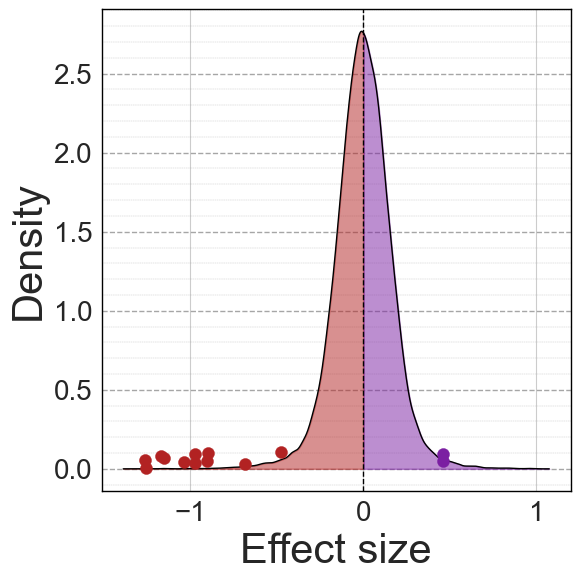

In [610]:
plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
              "gwas_roh/roh_gwas_results_windows/1500_50/"
              "roh_gwas_windows_ISLAND_*.tsv",
    sig_df = sig_df_IL,
    effect_col="BETA_ROH_STATUS",
    neg_color="#B22222",   
    pos_color="#7B1FA2",
    fig_width_cm=15,
    fig_height_cm=15,
    point_size=75,
    out_file="ROH_GWAS_IL_effect_poster.svg"
    
)


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_ML_effect_poster.svg


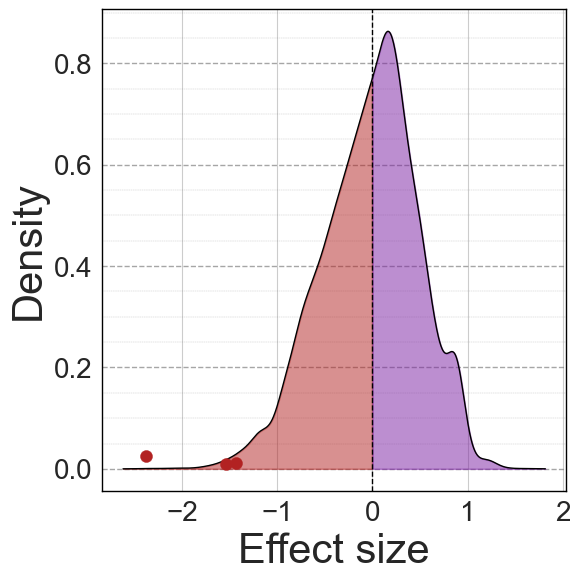

In [611]:
plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
              "gwas_roh/roh_gwas_results_windows/1500_50/"
              "roh_gwas_windows_MAINLAND_*.tsv",
    sig_df = sig_df_ML,
    effect_col="BETA_ROH_STATUS",
    neg_color="#B22222",   
    pos_color="#7B1FA2",
    fig_width_cm=15,
    fig_height_cm=15,
    point_size=75,
    out_file="ROH_GWAS_ML_effect_poster.svg"
)


Saved figure to: /scratch/antwerpen/grp/asvardal/projects/psiculus/notebooks/ROH_GWAS_ML_effect.png


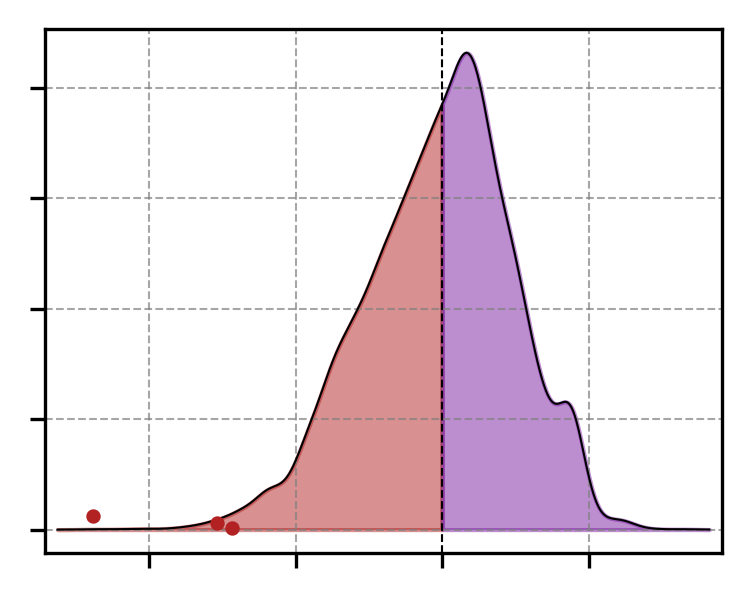

In [52]:
plot_effect_size_bellcurve_filled_with_sig_points(
    file_glob="../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
              "gwas_roh/roh_gwas_results_windows/1500_50/"
              "roh_gwas_windows_MAINLAND_*.tsv",
    sig_df = sig_df_ML,
    effect_col="BETA_ROH_STATUS",
    neg_color="#B22222",   
    pos_color="#7B1FA2",
    out_file="ROH_GWAS_ML_effect.png"
)


### 11.2. 1000 SNPs - 50% threshold

#### 11.2.1. Mainland


ROH-GWAS Manhattan plot summary
Total windows loaded       : 130,539
Windows tested             : 81,873
Windows excluded (NA/inf)  : 48,666

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 4548.5
  median = 4781.5
  range  = 662–7655

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 6.107e-07
  Classical Bonferroni -log10(p): 6.21
  Effective Bonferroni p   : 5.258e-05
  Effective Bonferroni -log10(p): 4.28



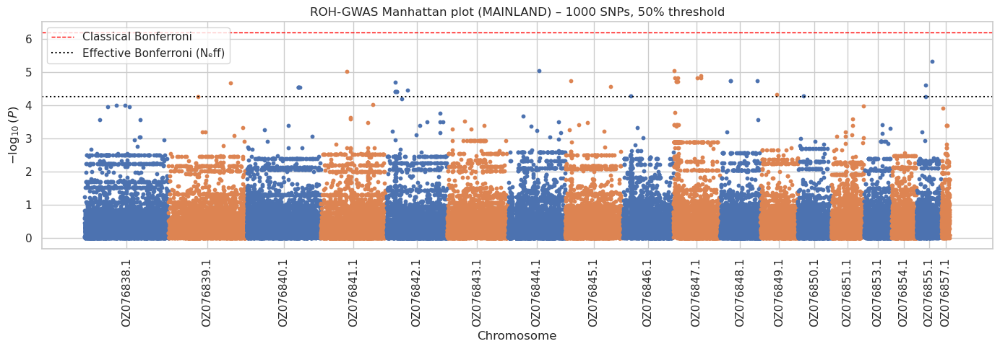

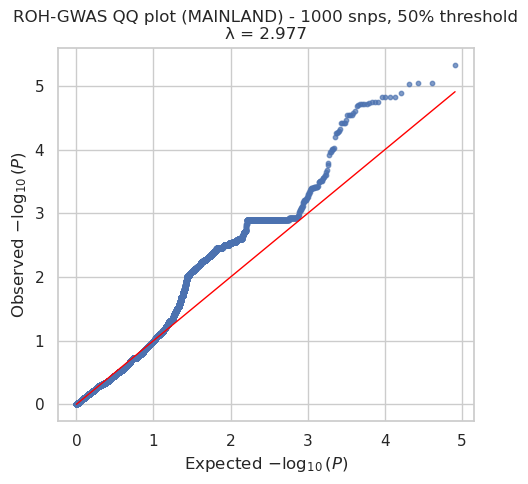

In [222]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1000_50/"
        "roh_gwas_windows_MAINLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (MAINLAND) – 1000 SNPs, 50% threshold",
    neff_genome=951
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1000_50/roh_gwas_windows_MAINLAND_*.tsv"),
    "ROH-GWAS QQ plot (MAINLAND) - 1000 snps, 50% threshold"
)


In [263]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "gwas_roh/roh_gwas_results_windows/1000_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "MAINLAND"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_ML = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_ML.shape[0]}")

# Load data
df_ML = df_ML.loc[
    df_ML["P_ROH_STATUS"].notna()
    & np.isfinite(df_ML["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_ML["LOGP"] = -np.log10(df_ML["P_ROH_STATUS"])
print(f"Total windows loaded: {df.shape[0]}")

neff_genome_ML = 951  # your simpleM result

p_eff_ML = 0.05 / neff_genome_ML
logp_eff_ML = -np.log10(p_eff_ML)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_ML:.3e}")
print(f"  -log10(p) ≥ {logp_eff_ML:.4f}")

sig_df_ML = df_ML.loc[
    df_ML["LOGP"] >= logp_eff_ML
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_ML.shape[0]}")
print(sig_df_ML)

Found 18 result files
Total windows loaded (raw): 130539
Total windows loaded: 10973
Neff Bonferroni threshold:
  p ≤ 5.258e-05
  -log10(p) ≥ 4.2792
Significant windows (Neff, LOGP-based): 33
                             WINDOW_ID         CHR   N   WIN  THR  BETA_const  \
13110   OZ076839.1:101954394-101961344  OZ076839.1  54  1000   50    0.599680   
34143     OZ076840.1:86291216-86301664  OZ076840.1  54  1000   50    1.396389   
34144     OZ076840.1:86301671-86312999  OZ076840.1  54  1000   50    1.396389   
34145     OZ076840.1:86313001-86324067  OZ076840.1  54  1000   50    1.396389   
34396     OZ076840.1:88744070-88753214  OZ076840.1  54  1000   50    1.396389   
39316     OZ076841.1:41635935-41644521  OZ076841.1  54  1000   50   -1.470757   
45888     OZ076842.1:15501401-15510179  OZ076842.1  54  1000   50    0.957034   
45911     OZ076842.1:15702291-15711077  OZ076842.1  54  1000   50    1.151346   
45913     OZ076842.1:15719306-15728745  OZ076842.1  54  1000   50    0.957034  

#### 12.2.2. Island


ROH-GWAS Manhattan plot summary
Total windows loaded       : 130,539
Windows tested             : 121,169
Windows excluded (NA/inf)  : 9,370

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 6731.6
  median = 6652.5
  range  = 1010–12037

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 4.126e-07
  Classical Bonferroni -log10(p): 6.38
  Effective Bonferroni p   : 3.546e-05
  Effective Bonferroni -log10(p): 4.45



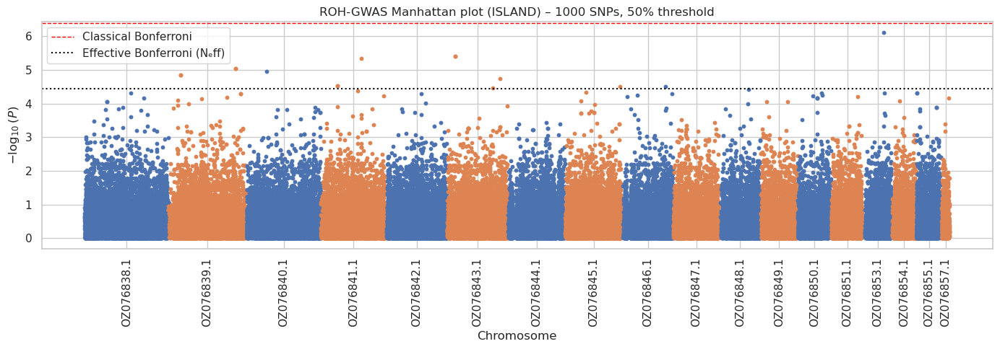

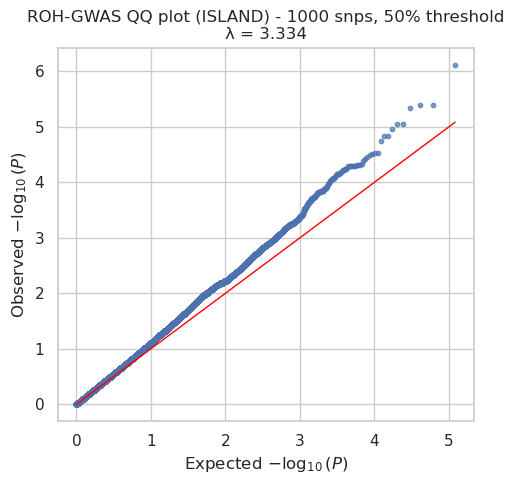

In [221]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1000_50/"
        "roh_gwas_windows_ISLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (ISLAND) – 1000 SNPs, 50% threshold",
    neff_genome=1410
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1000_50/roh_gwas_windows_ISLAND_*.tsv"),
    "ROH-GWAS QQ plot (ISLAND) - 1000 snps, 50% threshold"
)


In [264]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/bf/"
    "gwas_roh/roh_gwas_results_windows/1000_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "ISLAND"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_IL = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_IL.shape[0]}")

# Load data
df_IL = df_IL.loc[
    df_IL["P_ROH_STATUS"].notna()
    & np.isfinite(df_IL["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_IL["LOGP"] = -np.log10(df_IL["P_ROH_STATUS"])
print(f"Total windows loaded: {df.shape[0]}")

neff_genome_IL = 1410  # your simpleM result

p_eff_IL = 0.05 / neff_genome_IL
logp_eff_IL = -np.log10(p_eff_IL)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_IL:.3e}")
print(f"  -log10(p) ≥ {logp_eff_IL:.4f}")

sig_df_IL = df_IL.loc[
    df_IL["LOGP"] >= logp_eff_IL
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_IL.shape[0]}")
print(sig_df_IL)

Found 18 result files
Total windows loaded (raw): 130539
Total windows loaded: 10973
Neff Bonferroni threshold:
  p ≤ 3.546e-05
  -log10(p) ≥ 4.4502
Significant windows (Neff, LOGP-based): 15
                             WINDOW_ID         CHR   N   WIN  THR  BETA_const  \
14038   OZ076839.1:110098437-110108827  OZ076839.1  69  1000   50    1.213013   
14039   OZ076839.1:110108832-110121933  OZ076839.1  69  1000   50    1.213013   
15738     OZ076839.1:19600646-19611858  OZ076839.1  69  1000   50    0.641855   
15739     OZ076839.1:19611860-19620392  OZ076839.1  69  1000   50    0.641855   
28709     OZ076840.1:33694169-33702058  OZ076840.1  69  1000   50    0.373019   
37812     OZ076841.1:27294715-27302741  OZ076841.1  69  1000   50   -0.889283   
37813     OZ076841.1:27302744-27311150  OZ076841.1  69  1000   50   -0.889283   
41782     OZ076841.1:65434118-65443351  OZ076841.1  69  1000   50   -1.057471   
55016     OZ076843.1:12817942-12829755  OZ076843.1  69  1000   50   -0.002209  

### 11.3. 1500 SNPs - 80% threshold

#### 11.3.1. Mainland


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 29,684
Windows excluded (NA/inf)  : 57,339

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 1649.1
  median = 1556.0
  range  = 311–3244

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 1.684e-06
  Classical Bonferroni -log10(p): 5.77
  Effective Bonferroni p   : 5.280e-05
  Effective Bonferroni -log10(p): 4.28



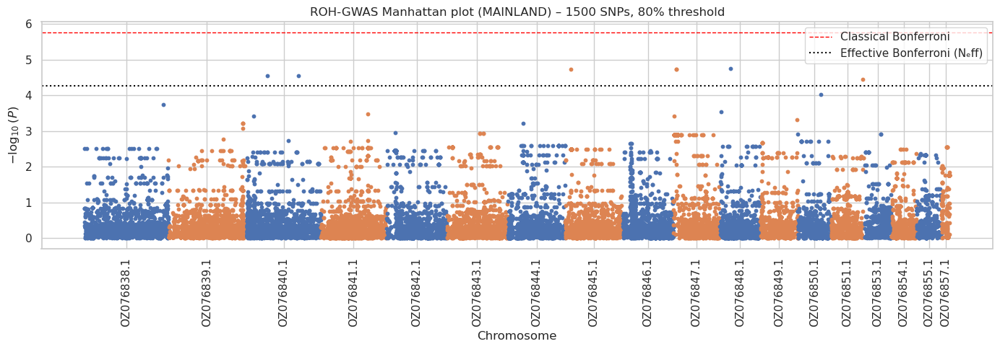

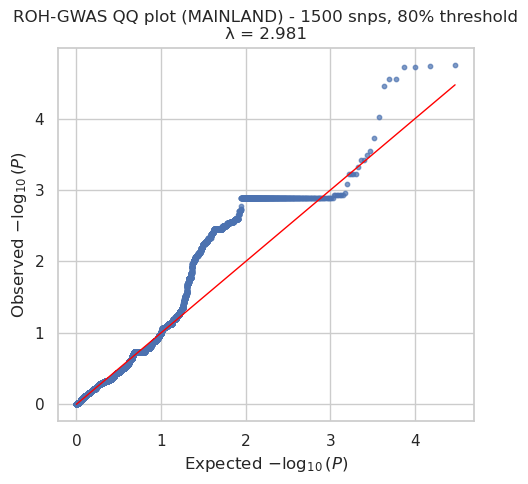

In [219]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_80/"
        "roh_gwas_windows_MAINLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (MAINLAND) – 1500 SNPs, 80% threshold",
    neff_genome=947
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_80/roh_gwas_windows_MAINLAND_*.tsv"),
    "ROH-GWAS QQ plot (MAINLAND) - 1500 snps, 80% threshold"
)


#### 11.3.2. Island


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 85,943
Windows excluded (NA/inf)  : 1,080

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 4774.6
  median = 4732.0
  range  = 719–8521

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 5.818e-07
  Classical Bonferroni -log10(p): 6.24
  Effective Bonferroni p   : 3.549e-05
  Effective Bonferroni -log10(p): 4.45



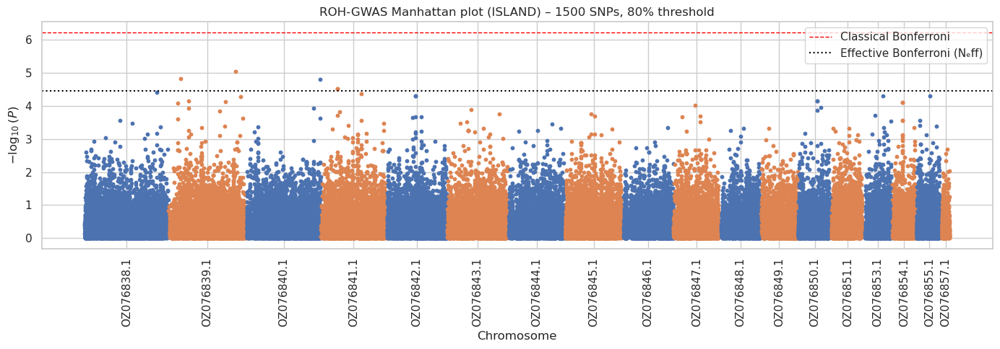

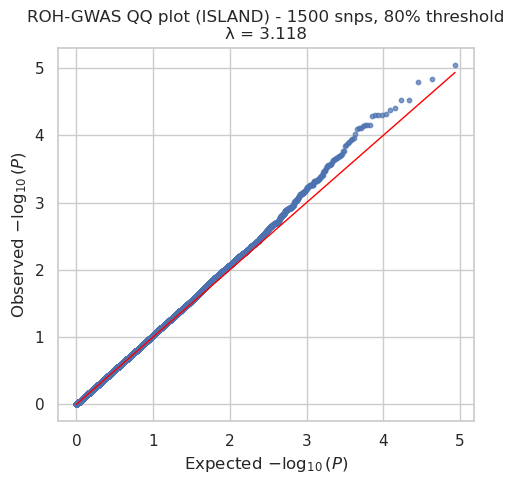

In [220]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/1500_80/"
        "roh_gwas_windows_ISLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (ISLAND) – 1500 SNPs, 80% threshold",
    neff_genome=1409
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/1500_80/roh_gwas_windows_ISLAND_*.tsv"),
    "ROH-GWAS QQ plot (ISLAND) - 1500 snps, 80% threshold"
)


### 11.4. 2500 SNPs - 50% threshold

#### 11.4.1. Mainland


ROH-GWAS Manhattan plot summary
Total windows loaded       : 52,212
Windows tested             : 23,628
Windows excluded (NA/inf)  : 28,584

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 1312.7
  median = 1316.5
  range  = 217–2389

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 2.116e-06
  Classical Bonferroni -log10(p): 5.67
  Effective Bonferroni p   : 5.280e-05
  Effective Bonferroni -log10(p): 4.28



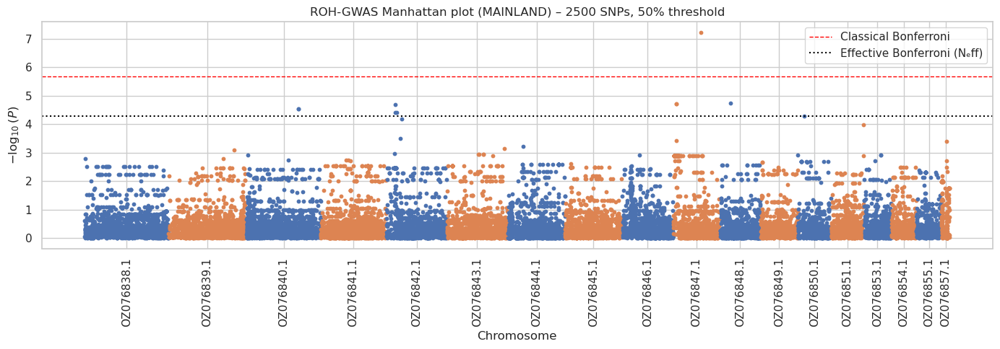

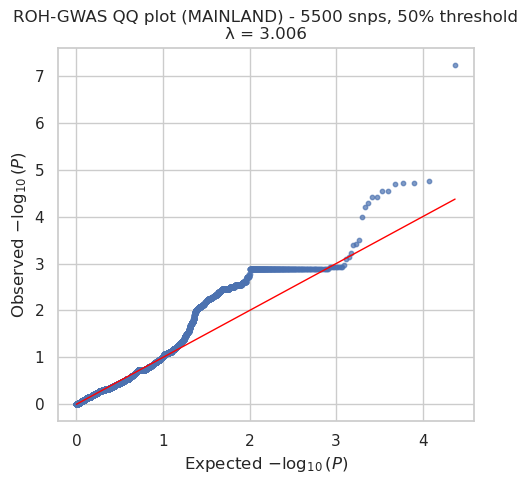

In [223]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/2500_50/"
        "roh_gwas_windows_MAINLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (MAINLAND) – 2500 SNPs, 50% threshold",
    neff_genome=947
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/2500_50/roh_gwas_windows_MAINLAND_*.tsv"),
    "ROH-GWAS QQ plot (MAINLAND) - 5500 snps, 50% threshold"
)


#### 11.4.2. Island


ROH-GWAS Manhattan plot summary
Total windows loaded       : 52,212
Windows tested             : 48,777
Windows excluded (NA/inf)  : 3,435

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 2709.8
  median = 2677.5
  range  = 404–4828

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 1.025e-06
  Classical Bonferroni -log10(p): 5.99
  Effective Bonferroni p   : 5.280e-05
  Effective Bonferroni -log10(p): 4.28



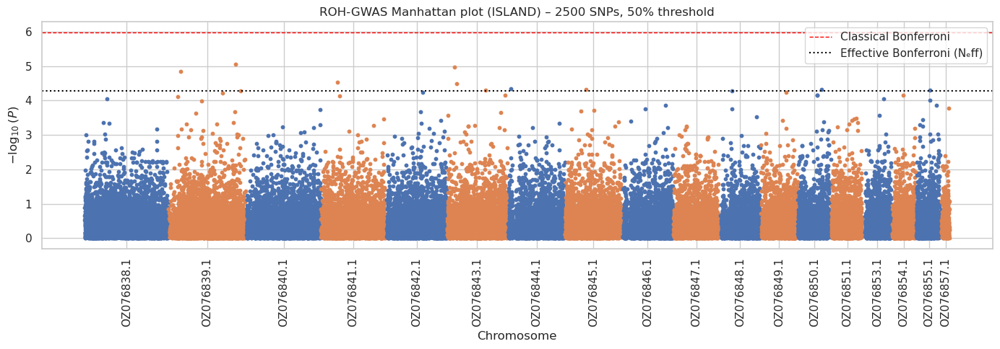

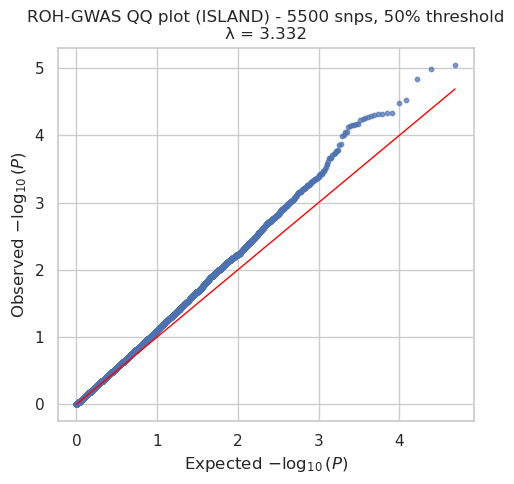

In [224]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/"
        "gwas_roh/roh_gwas_results_windows/2500_50/"
        "roh_gwas_windows_ISLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (ISLAND) – 2500 SNPs, 50% threshold",
    neff_genome=947
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_windows/2500_50/roh_gwas_windows_ISLAND_*.tsv"),
    "ROH-GWAS QQ plot (ISLAND) - 5500 snps, 50% threshold"
)


### 11.5. SVL (1500 SNPs - 50% threshold)

##### SimpleM

In [10]:
INPUT_DIR = "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/roh_gwas_input_windows/1500_50"

neff_ml, neff_ml_chr = compute_neff_from_window_folder(
    INPUT_DIR,
    pop="ML"
)

neff_il, neff_il_chr = compute_neff_from_window_folder(
    INPUT_DIR,
    pop="IL"
)



Computing N_eff for ML
Scanning 18 chromosome files

ML OZ076838.1: windows=8590  N_eff=85
ML OZ076839.1: windows=7516  N_eff=85
ML OZ076840.1: windows=7606  N_eff=85
ML OZ076841.1: windows=6582  N_eff=84
ML OZ076842.1: windows=6252  N_eff=85
ML OZ076843.1: windows=6262  N_eff=85
ML OZ076844.1: windows=5538  N_eff=85
ML OZ076845.1: windows=5789  N_eff=85
ML OZ076846.1: windows=4895  N_eff=84
ML OZ076847.1: windows=4751  N_eff=85
ML OZ076848.1: windows=3952  N_eff=85
ML OZ076849.1: windows=3721  N_eff=85
ML OZ076850.1: windows=3130  N_eff=84
ML OZ076851.1: windows=3389  N_eff=85
ML OZ076853.1: windows=2977  N_eff=83
ML OZ076854.1: windows=2718  N_eff=85
ML OZ076855.1: windows=2627  N_eff=84
ML OZ076857.1: windows=728  N_eff=81

ML TOTAL genome-wide N_eff = 1520


Computing N_eff for IL
Scanning 18 chromosome files

IL OZ076838.1: windows=8590  N_eff=142
IL OZ076839.1: windows=7516  N_eff=142
IL OZ076840.1: windows=7606  N_eff=141
IL OZ076841.1: windows=6582  N_eff=141
IL OZ076842.1: wi

#### 11.5.1. Mainland

##### Exploratory plots


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 27,815
Windows excluded (NA/inf)  : 59,208

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 1545.3
  median = 1285.5
  range  = 210–4055

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 1.798e-06
  Classical Bonferroni -log10(p): 5.75
  Effective Bonferroni p   : 3.289e-05
  Effective Bonferroni -log10(p): 4.48



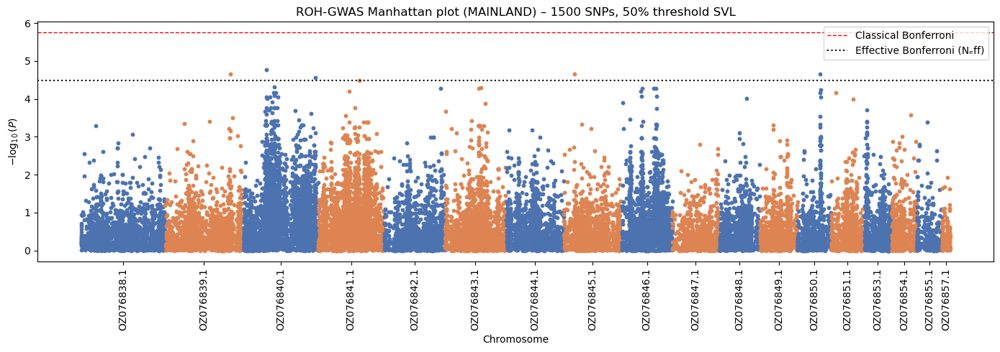

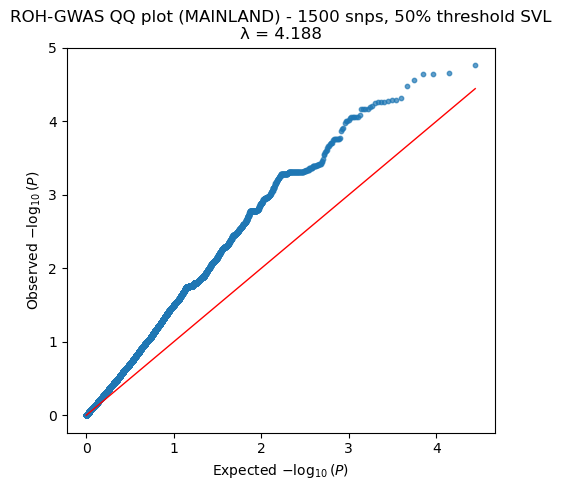

In [13]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_MAINLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (MAINLAND) – 1500 SNPs, 50% threshold SVL",
    neff_genome=1520
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/gwas_roh/roh_gwas_results_windows/1500_50/roh_gwas_windows_MAINLAND_*.tsv"),
    "ROH-GWAS QQ plot (MAINLAND) - 1500 snps, 50% threshold SVL"
)


##### Significant windows

In [16]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/svl/"
    "gwas_roh/roh_gwas_results_windows/1500_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "MAINLAND"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_ML = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_ML.shape[0]}")

# Load data
df_ML = df_ML.loc[
    df_ML["P_ROH_STATUS"].notna()
    & np.isfinite(df_ML["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_ML["LOGP"] = -np.log10(df_ML["P_ROH_STATUS"])
print(f"Total windows loaded: {df_ML.shape[0]}")

neff_genome_ML = 1520  # your simpleM result

p_eff_ML = 0.05 / neff_genome_ML
logp_eff_ML = -np.log10(p_eff_ML)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_ML:.3e}")
print(f"  -log10(p) ≥ {logp_eff_ML:.4f}")

sig_df_ML = df_ML.loc[
    df_ML["LOGP"] >= logp_eff_ML
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_ML.shape[0]}")
print(sig_df_ML)

Found 18 result files
Total windows loaded (raw): 87023
Total windows loaded: 27815
Neff Bonferroni threshold:
  p ≤ 3.289e-05
  -log10(p) ≥ 4.4829
Significant windows (Neff, LOGP-based): 6
                            WINDOW_ID         CHR   N   WIN  THR  BETA_const  \
9056   OZ076839.1:106190807-106202166  OZ076839.1  87  1500   50    0.559657   
17303  OZ076840.1:117554442-117594821  OZ076840.1  87  1500   50    0.298482   
19450    OZ076840.1:38137264-38160128  OZ076840.1  87  1500   50    1.125053   
27879    OZ076841.1:65802100-65812926  OZ076841.1  87  1500   50    0.729335   
48912    OZ076845.1:17430795-17445642  OZ076845.1  87  1500   50    0.639493   
73266    OZ076850.1:36185067-36203619  OZ076850.1  87  1500   50    0.524877   

       SE_const   P_const  BETA_ROH_STATUS  SE_ROH_STATUS  ...  BETA_PC3_ML  \
9056   0.444313  0.211476         2.083506       0.462120  ...    -6.066244   
17303  0.261386  0.256892        -2.488926       0.559629  ...    -4.461128   
19450  0.293

Effect sizes excluded from plot (|β| outside [-3, 3]): 4


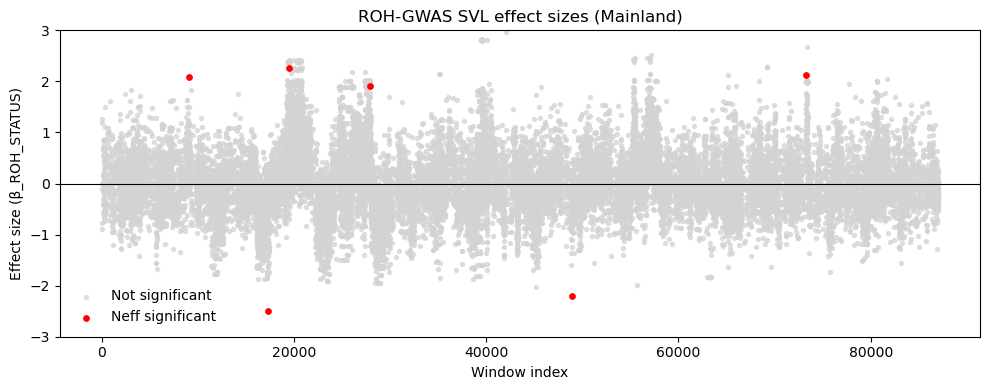

In [17]:
is_sig = df_ML["LOGP"] >= logp_eff_ML
beta_min = -3
beta_max = 3

beta_ok = (
    df_ML["BETA_ROH_STATUS"].notna()
    & (df_ML["BETA_ROH_STATUS"] >= beta_min)
    & (df_ML["BETA_ROH_STATUS"] <= beta_max)
)
plot_mask = beta_ok
sig_plot_mask = beta_ok & is_sig

n_excluded = (~beta_ok).sum()
print(f"Effect sizes excluded from plot (|β| outside [{beta_min}, {beta_max}]): {n_excluded}")


plt.figure(figsize=(10, 4))

# Non-significant (within beta limits)
plt.scatter(
    df_ML.loc[plot_mask & ~is_sig].index,
    df_ML.loc[plot_mask & ~is_sig, "BETA_ROH_STATUS"],
    color="lightgrey",
    s=8,
    alpha=0.7,
    label="Not significant"
)

# Significant (within beta limits)
plt.scatter(
    df_ML.loc[sig_plot_mask].index,
    df_ML.loc[sig_plot_mask, "BETA_ROH_STATUS"],
    color="red",
    s=15,
    label="Neff significant"
)

plt.axhline(0, color="black", linewidth=0.8)

plt.ylim(beta_min, beta_max)

plt.xlabel("Window index")
plt.ylabel("Effect size (β_ROH_STATUS)")
plt.title("ROH-GWAS SVL effect sizes (Mainland)")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


Raw input rows loaded: 20102313
Significant windows: 6
Plotting 6 significant windows


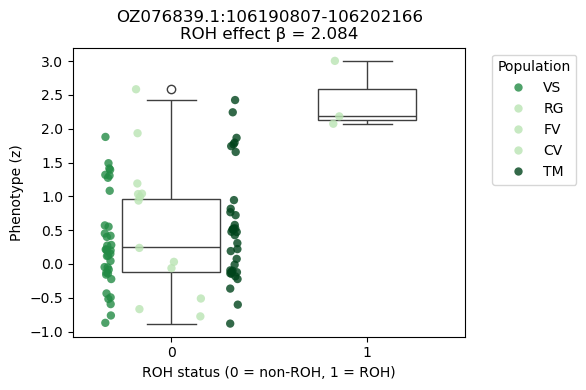

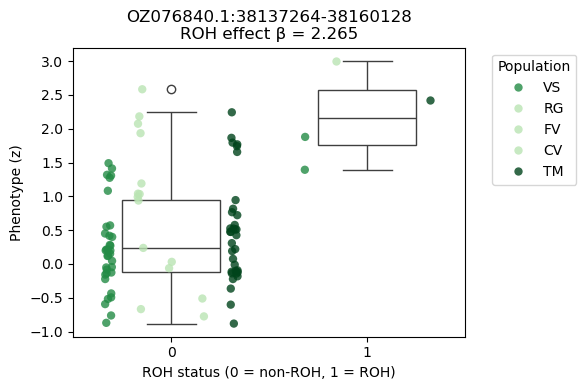

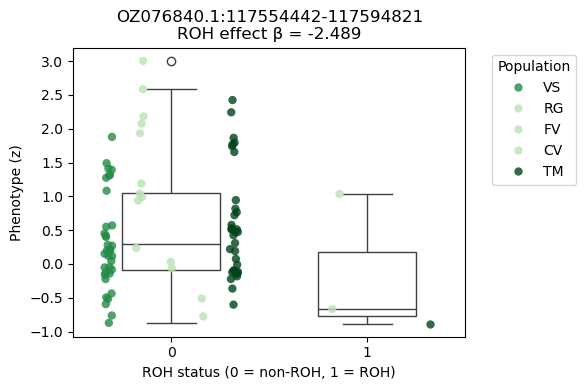

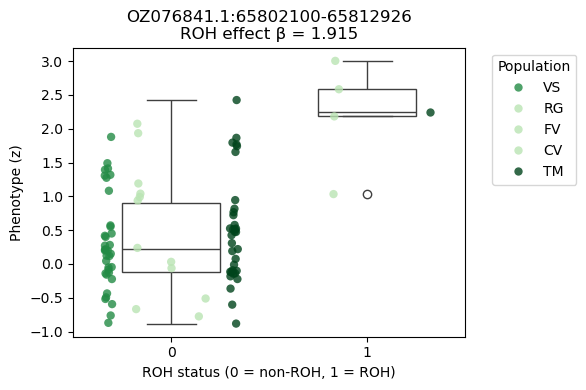

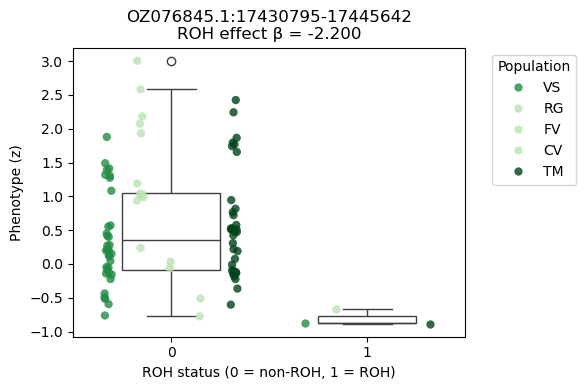

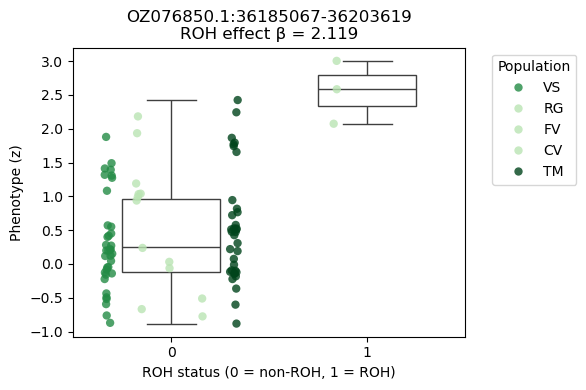

In [24]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/svl/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_ML = df_input[df_input["PC1_ML"].notna()].copy()
df_input_ML["Population"] = df_input_ML["IID"].str.extract(r"([A-Z]+)")
df_input_ML["Population"] = df_input_ML["Population"].str.replace(r"^24", "", regex=True)

sig_windows_ML = sig_df_ML["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows_ML)}")

df_plot_ML = df_input_ML[df_input_ML["WINDOW_ID"].isin(sig_windows_ML)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D', 'CV':'#BAE4B3', 'FV':'#BAE4B3'
}

windows_ML = df_plot_ML["WINDOW_ID"].unique()
print(f"Plotting {len(windows_ML)} significant windows")

for window in windows_ML:

    df_w = df_plot_ML[df_plot_ML["WINDOW_ID"] == window]

    # Skip windows with no ROH variation
    if df_w["ROH_STATUS"].nunique() < 2:
        continue

    # Get effect size from GWAS results
    beta = sig_df_ML.loc[
        sig_df_ML["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    plt.figure(figsize=(6, 4))

    # Boxplot
    sns.boxplot(
        x="ROH_STATUS",
        y="PHENO_z",     # or PHENO if you prefer raw scale
        data=df_w,
        showcaps=True,
        boxprops={"facecolor": "none"},
        width=0.5
    )

    # Population-coloured points
    sns.stripplot(
        x="ROH_STATUS",
        y="PHENO_z",
        data=df_w,
        hue="Population",
        dodge=True,
        jitter=True,
        size=6,
        alpha=0.8,
        palette=color_map
    )

    plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
    plt.ylabel("Phenotype (z)")
    plt.title(f"{window}\nROH effect β = {beta:.3f}")

    plt.legend(
        title="Population",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()


Raw input rows loaded: 20102313
Significant windows: 6
Plotting 6 significant windows


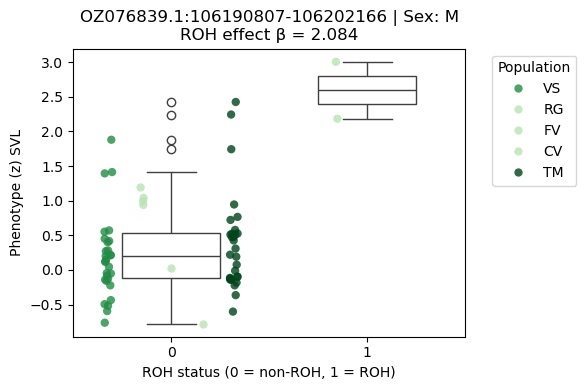

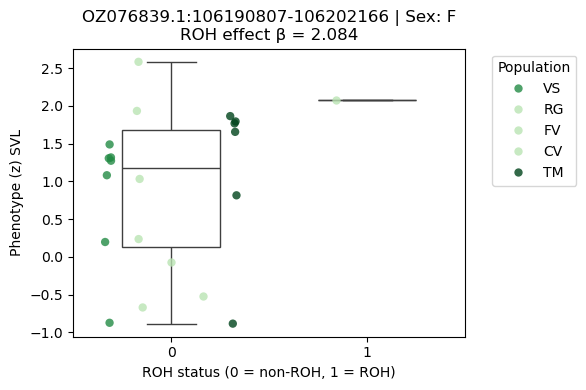

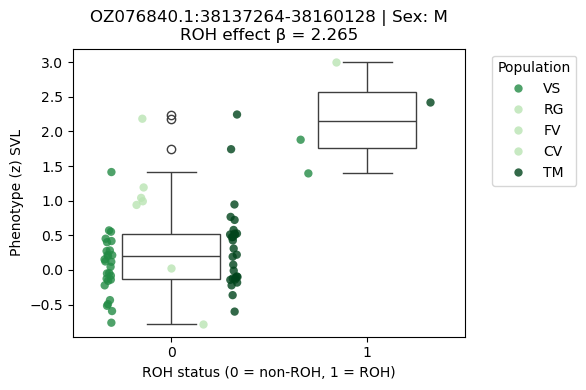

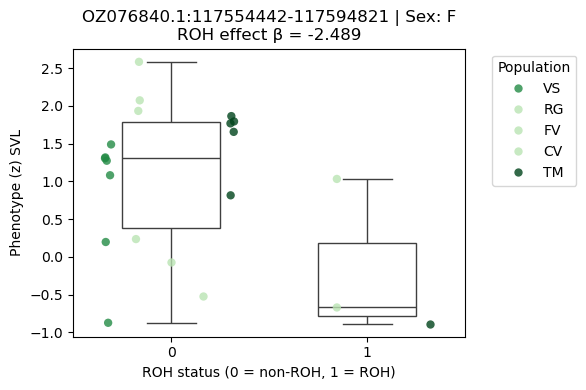

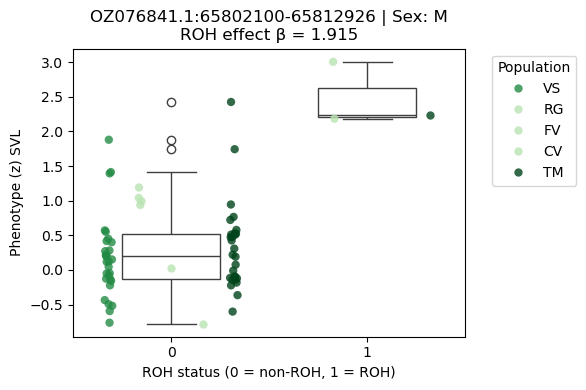

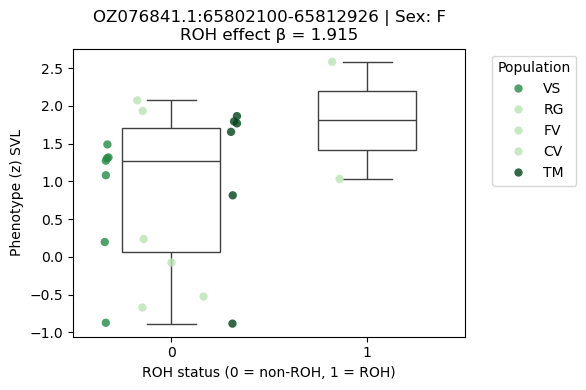

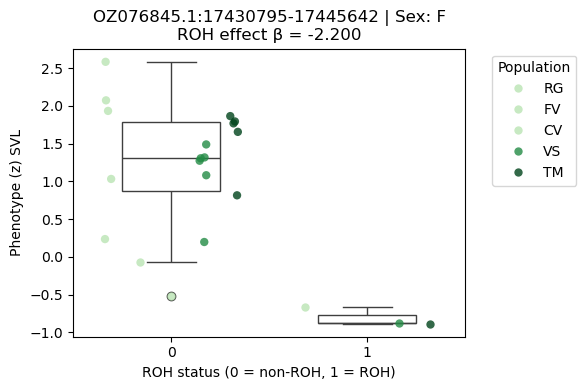

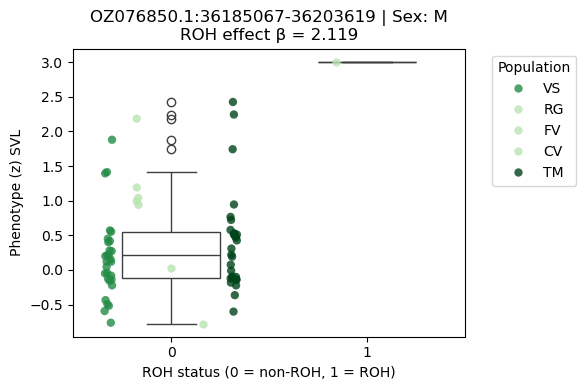

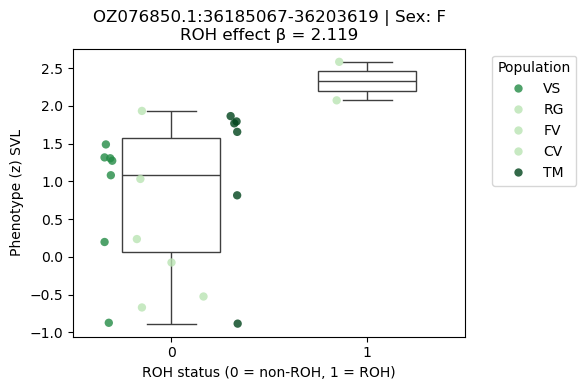

In [19]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/svl/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_ML = df_input[df_input["PC1_ML"].notna()].copy()
df_input_ML["Population"] = df_input_ML["IID"].str.extract(r"([A-Z]+)")
df_input_ML["Population"] = df_input_ML["Population"].str.replace(r"^24", "", regex=True)

sig_windows_ML = sig_df_ML["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows_ML)}")

df_plot_ML = df_input_ML[df_input_ML["WINDOW_ID"].isin(sig_windows_ML)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D', 'CV':'#BAE4B3', 'FV':'#BAE4B3'
}

windows_ML = df_plot_ML["WINDOW_ID"].unique()
print(f"Plotting {len(windows_ML)} significant windows")

for window in windows_ML:

    df_w_all = df_plot_ML[df_plot_ML["WINDOW_ID"] == window]

    # Get effect size from GWAS results
    beta = sig_df_ML.loc[
        sig_df_ML["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    for sex in ["M", "F"]:

        df_w = df_w_all[df_w_all["Sex"] == sex]

        # Skip if too few data
        if df_w.empty:
            continue

        # Skip windows with no ROH variation within sex
        if df_w["ROH_STATUS"].nunique() < 2:
            continue

        plt.figure(figsize=(6, 4))

        # Boxplot
        sns.boxplot(
            x="ROH_STATUS",
            y="PHENO_z",
            data=df_w,
            showcaps=True,
            boxprops={"facecolor": "none"},
            width=0.5
        )

        # Population-coloured points
        sns.stripplot(
            x="ROH_STATUS",
            y="PHENO_z",
            data=df_w,
            hue="Population",
            dodge=True,
            jitter=True,
            size=6,
            alpha=0.8,
            palette=color_map
        )

        plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
        plt.ylabel("Phenotype (z) SVL")
        plt.title(
            f"{window} | Sex: {sex}\nROH effect β = {beta:.3f}"
        )

        plt.legend(
            title="Population",
            bbox_to_anchor=(1.05, 1),
            loc="upper left"
        )

        plt.tight_layout()
        plt.show()

#### 11.5.2. Island

##### Exploratory plots


ROH-GWAS Manhattan plot summary
Total windows loaded       : 87,023
Windows tested             : 79,742
Windows excluded (NA/inf)  : 7,281

Number of chromosomes      : 18
Windows per chromosome     :
  mean   = 4430.1
  median = 4389.0
  range  = 670–7966

Sample size (N individuals): NA

Multiple testing thresholds
  Classical Bonferroni p   : 6.270e-07
  Classical Bonferroni -log10(p): 6.20
  Effective Bonferroni p   : 1.972e-05
  Effective Bonferroni -log10(p): 4.71



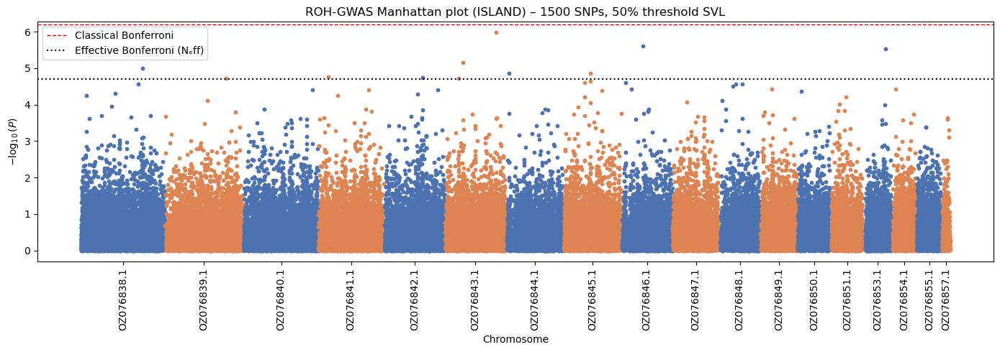

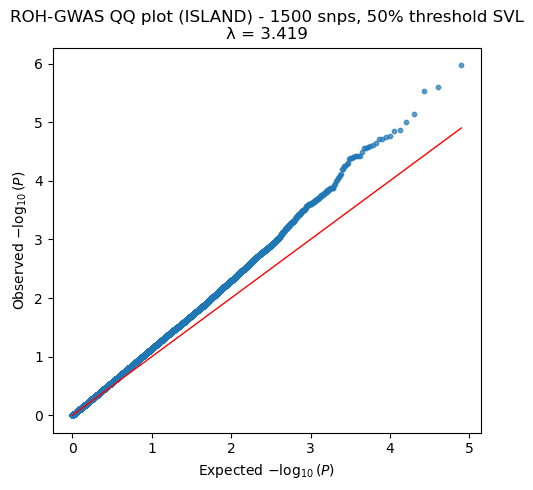

In [14]:
plot_manhattan(
    glob.glob(
        "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/"
        "gwas_roh/roh_gwas_results_windows/1500_50/"
        "roh_gwas_windows_ISLAND_*.tsv"
    ),
    "ROH-GWAS Manhattan plot (ISLAND) – 1500 SNPs, 50% threshold SVL",
    neff_genome=2535
)

plot_qq(
    glob.glob("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/gwas_roh/roh_gwas_results_windows/1500_50/roh_gwas_windows_ISLAND_*.tsv"),
    "ROH-GWAS QQ plot (ISLAND) - 1500 snps, 50% threshold SVL"
)


##### Significant windows

In [21]:
# Path to your window-GWAS results
RESULTS_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/svl/"
    "gwas_roh/roh_gwas_results_windows/1500_50/"
)

# Choose group: ALL, MAINLAND, ISLAND
GROUP = "ISLAND"

files = sorted(
    glob.glob(f"{RESULTS_DIR}/roh_gwas_windows_{GROUP}_*.tsv")
)

print(f"Found {len(files)} result files")

# ----------------------------
# Load all result files
# ----------------------------
df_IL = pd.concat(
    (pd.read_csv(f, sep="\t") for f in files),
    ignore_index=True
)

print(f"Total windows loaded (raw): {df_IL.shape[0]}")

# Load data
df_IL = df_IL.loc[
    df_IL["P_ROH_STATUS"].notna()
    & np.isfinite(df_IL["P_ROH_STATUS"])
].copy()

# Compute -log10(p) exactly as in the plot
df_IL["LOGP"] = -np.log10(df_IL["P_ROH_STATUS"])
print(f"Total windows loaded: {df_IL.shape[0]}")

neff_genome_IL = 2535  # your simpleM result

p_eff_IL = 0.05 / neff_genome_IL
logp_eff_IL = -np.log10(p_eff_IL)

print(f"Neff Bonferroni threshold:")
print(f"  p ≤ {p_eff_IL:.3e}")
print(f"  -log10(p) ≥ {logp_eff_IL:.4f}")

sig_df_IL = df_IL.loc[
    df_IL["LOGP"] >= logp_eff_IL
].copy()

print(f"Significant windows (Neff, LOGP-based): {sig_df_IL.shape[0]}")
print(sig_df_IL)

Found 18 result files
Total windows loaded (raw): 87023
Total windows loaded: 79742
Neff Bonferroni threshold:
  p ≤ 1.972e-05
  -log10(p) ≥ 4.7050
Significant windows (Neff, LOGP-based): 11
                            WINDOW_ID         CHR    N   WIN  THR  BETA_const  \
16     OZ076838.1:100221242-100235547  OZ076838.1  144  1500   50    3.477155   
16003    OZ076839.1:98654652-98668070  OZ076839.1  144  1500   50    2.729080   
24401    OZ076841.1:15894121-15906435  OZ076841.1  144  1500   50    4.945663   
33955    OZ076842.1:63163697-63180062  OZ076842.1  144  1500   50    1.768797   
37182    OZ076843.1:21933224-21949093  OZ076843.1  144  1500   50    3.526183   
37727    OZ076843.1:29355846-29368064  OZ076843.1  144  1500   50    2.359007   
41541    OZ076843.1:82675124-82689579  OZ076843.1  144  1500   50    1.841517   
45086      OZ076844.1:4566537-4582426  OZ076844.1  144  1500   50    3.444768   
50755    OZ076845.1:42845004-42858576  OZ076845.1  144  1500   50    3.509614   

Effect sizes excluded from plot (|β| outside [-3, 3]): 0


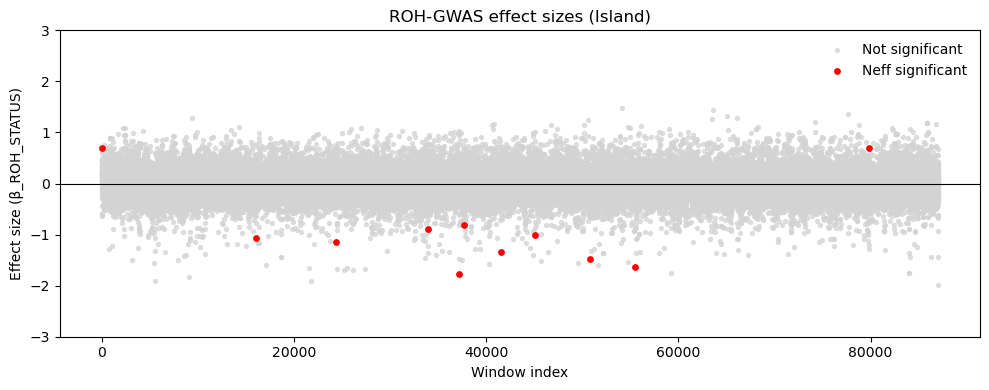

In [22]:
is_sig = df_IL["LOGP"] >= logp_eff_IL
beta_min = -3
beta_max = 3

beta_ok = (
    df_IL["BETA_ROH_STATUS"].notna()
    & (df_IL["BETA_ROH_STATUS"] >= beta_min)
    & (df_IL["BETA_ROH_STATUS"] <= beta_max)
)
plot_mask = beta_ok
sig_plot_mask = beta_ok & is_sig

n_excluded = (~beta_ok).sum()
print(f"Effect sizes excluded from plot (|β| outside [{beta_min}, {beta_max}]): {n_excluded}")


plt.figure(figsize=(10, 4))

# Non-significant (within beta limits)
plt.scatter(
    df_IL.loc[plot_mask & ~is_sig].index,
    df_IL.loc[plot_mask & ~is_sig, "BETA_ROH_STATUS"],
    color="lightgrey",
    s=8,
    alpha=0.7,
    label="Not significant"
)

# Significant (within beta limits)
plt.scatter(
    df_IL.loc[sig_plot_mask].index,
    df_IL.loc[sig_plot_mask, "BETA_ROH_STATUS"],
    color="red",
    s=15,
    label="Neff significant"
)

plt.axhline(0, color="black", linewidth=0.8)

plt.ylim(beta_min, beta_max)

plt.xlabel("Window index")
plt.ylabel("Effect size (β_ROH_STATUS)")
plt.title("ROH-GWAS effect sizes (Island)")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()


Raw input rows loaded: 20102313
Significant windows: 11
Plotting 11 significant windows


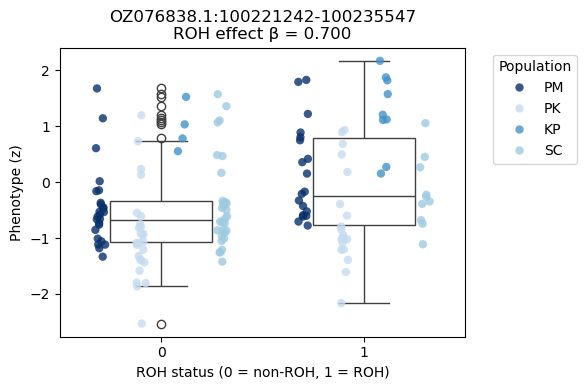

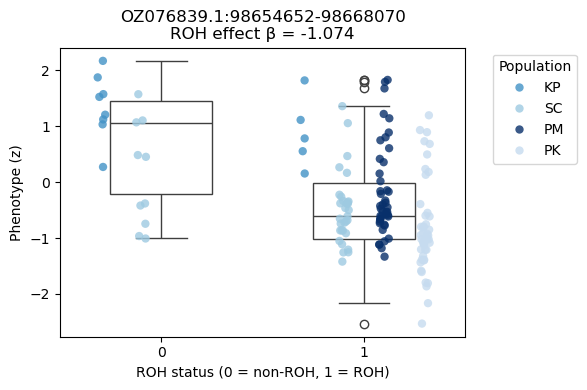

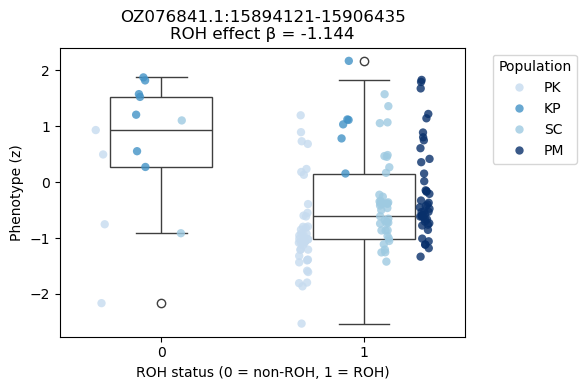

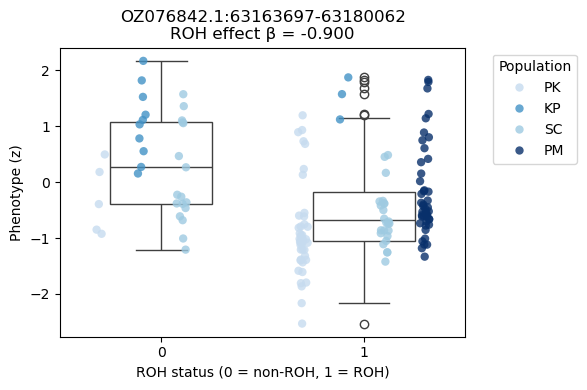

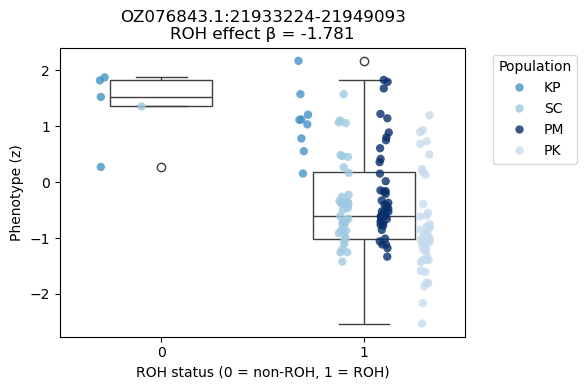

...

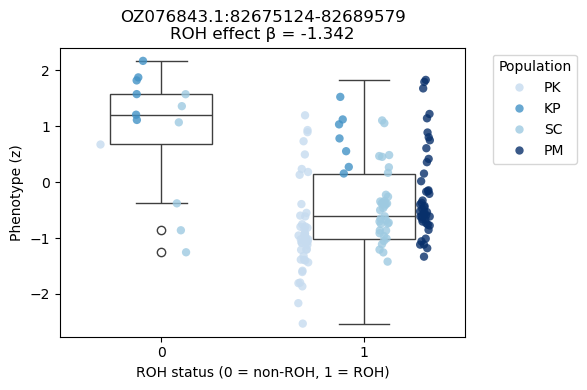

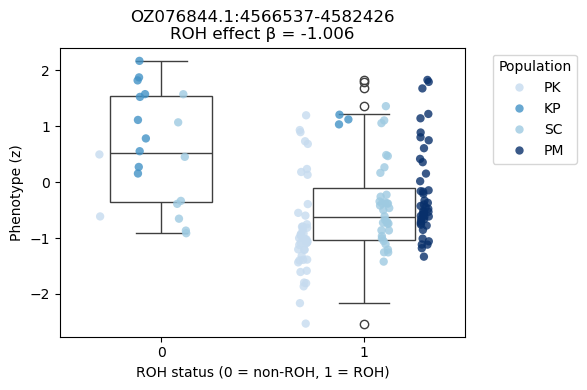

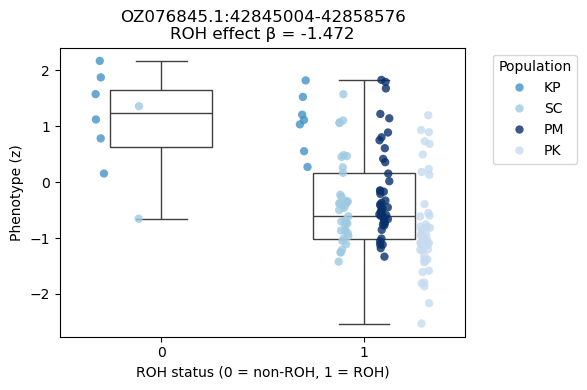

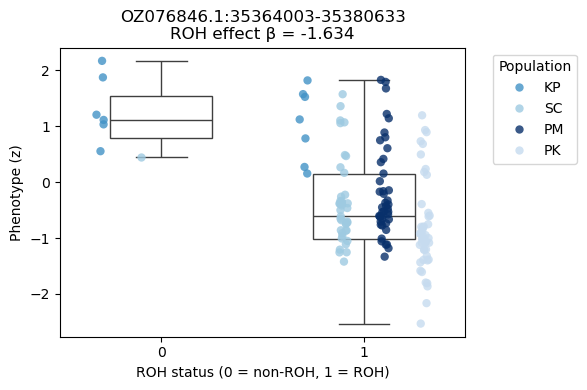

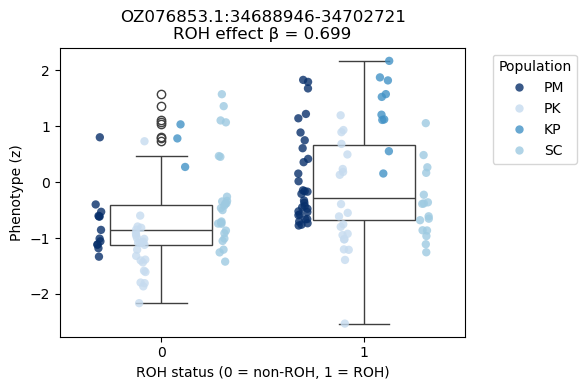

In [26]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/svl/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_IL = df_input[df_input["PC1_IL"].notna()].copy()
df_input_IL["Population"] = df_input_IL["IID"].str.extract(r"([A-Z]+)")
df_input_IL["Population"] = df_input_IL["Population"].str.replace(r"^24", "", regex=True)

sig_windows = sig_df_IL["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows)}")

df_plot_IL = df_input_IL[df_input_IL["WINDOW_ID"].isin(sig_windows)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D', 'CV':'#BAE4B3', 'FV':'#BAE4B3'
}

windows = df_plot_IL["WINDOW_ID"].unique()
print(f"Plotting {len(windows)} significant windows")

for window in windows:

    df_w = df_plot_IL[df_plot_IL["WINDOW_ID"] == window]

    # Skip windows with no ROH variation
    if df_w["ROH_STATUS"].nunique() < 2:
        continue

    # Get effect size from GWAS results
    beta = sig_df_IL.loc[
        sig_df_IL["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    plt.figure(figsize=(6, 4))

    # Boxplot
    sns.boxplot(
        x="ROH_STATUS",
        y="PHENO_z",     # or PHENO if you prefer raw scale
        data=df_w,
        showcaps=True,
        boxprops={"facecolor": "none"},
        width=0.5
    )

    # Population-coloured points
    sns.stripplot(
        x="ROH_STATUS",
        y="PHENO_z",
        data=df_w,
        hue="Population",
        dodge=True,
        jitter=True,
        size=6,
        alpha=0.8,
        palette=color_map
    )

    plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
    plt.ylabel("Phenotype (z)")
    plt.title(f"{window}\nROH effect β = {beta:.3f}")

    plt.legend(
        title="Population",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()


Raw input rows loaded: 20102313
Significant windows: 11
Plotting 11 significant windows


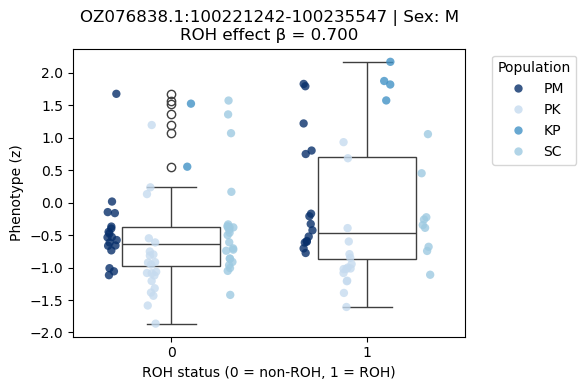

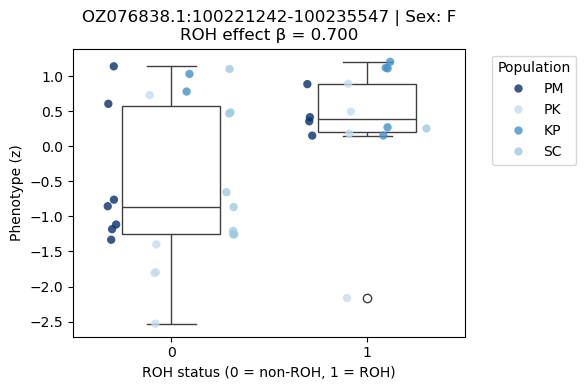

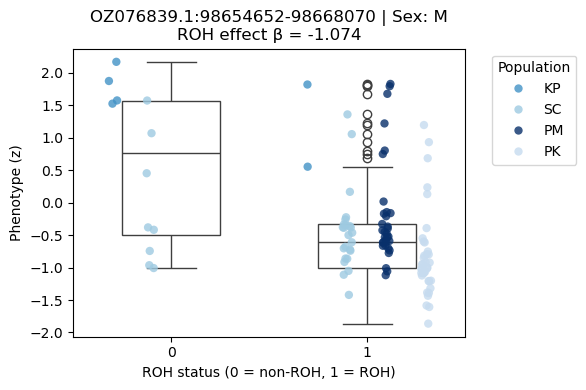

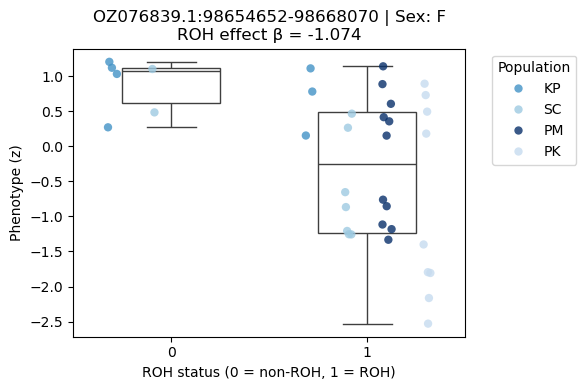

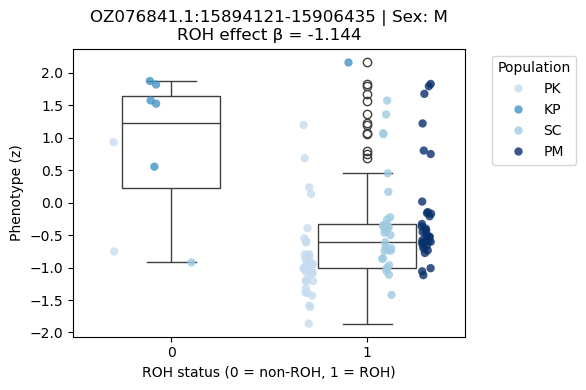

...

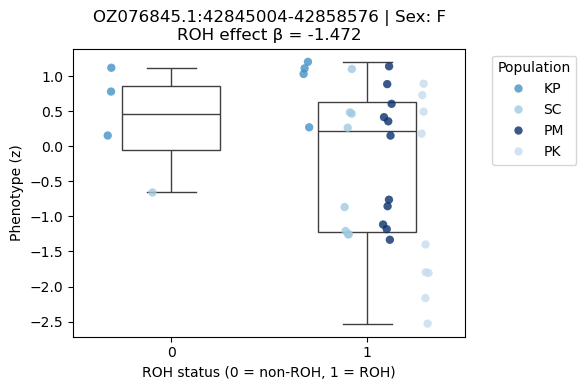

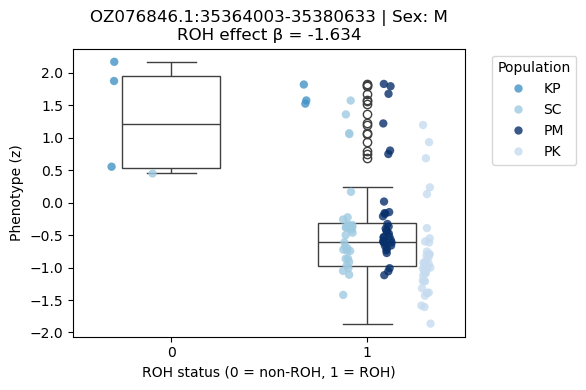

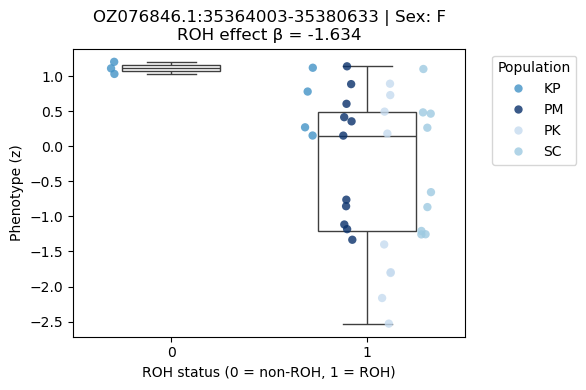

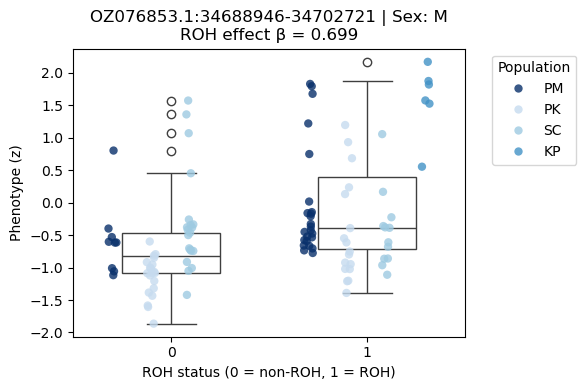

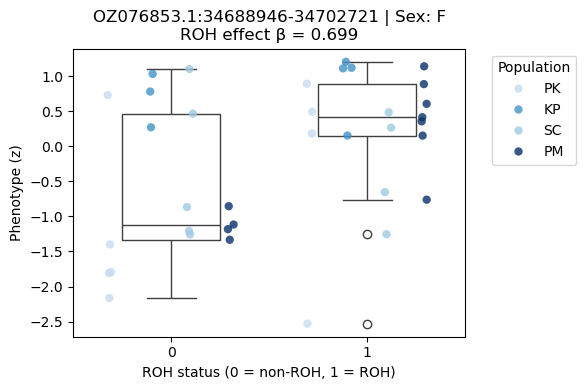

In [27]:
INPUT_DIR = (
    "../results/population_analyses/"
    "rPodSic1.hap1.1/roh_gwas/svl/"
    "roh_gwas_input_windows/1500_50/"
)

input_files = sorted(
    glob.glob(f"{INPUT_DIR}/gwas_input_windows_covariates_*.tsv")
)

df_input = pd.concat(
    (pd.read_csv(f, sep="\t") for f in input_files),
    ignore_index=True
)

print(f"Raw input rows loaded: {df_input.shape[0]}")

df_input_IL = df_input[df_input["PC1_IL"].notna()].copy()
df_input_IL["Population"] = df_input_IL["IID"].str.extract(r"([A-Z]+)")
df_input_IL["Population"] = df_input_IL["Population"].str.replace(r"^24", "", regex=True)

sig_windows = sig_df_IL["WINDOW_ID"].unique()
print(f"Significant windows: {len(sig_windows)}")

df_plot_IL = df_input_IL[df_input_IL["WINDOW_ID"].isin(sig_windows)].copy()

color_map = {
    'PJ':'#6BAED6', 'MP': '#2171B5', 'KP': '#4292C6', 'PM': '#08306B',
    'BJ':'#08519C', 'SC':'#9ECAE1', 'PK':'#C6DBEF', 'VS':'#238B45',
    'TM':'#00441B', 'RG':'#BAE4B3', 'SP':'#74C476', 'TR':'#006D2C',
    'PL':'#41AB5D', 'CV':'#BAE4B3', 'FV':'#BAE4B3'
}

windows = df_plot_IL["WINDOW_ID"].unique()
print(f"Plotting {len(windows)} significant windows")

for window in windows:

    df_w_all = df_plot_IL[df_plot_IL["WINDOW_ID"] == window]

    # Get effect size from GWAS results
    beta = sig_df_IL.loc[
        sig_df_IL["WINDOW_ID"] == window,
        "BETA_ROH_STATUS"
    ].iloc[0]

    for sex in ["M", "F"]:

        df_w = df_w_all[df_w_all["Sex"] == sex]

        # Skip if no data for this sex
        if df_w.empty:
            continue

        # Skip windows with no ROH variation within sex
        if df_w["ROH_STATUS"].nunique() < 2:
            continue

        plt.figure(figsize=(6, 4))

        # Boxplot
        sns.boxplot(
            x="ROH_STATUS",
            y="PHENO_z",
            data=df_w,
            showcaps=True,
            boxprops={"facecolor": "none"},
            width=0.5
        )

        # Population-coloured points
        sns.stripplot(
            x="ROH_STATUS",
            y="PHENO_z",
            data=df_w,
            hue="Population",
            dodge=True,
            jitter=True,
            size=6,
            alpha=0.8,
            palette=color_map
        )

        plt.xlabel("ROH status (0 = non-ROH, 1 = ROH)")
        plt.ylabel("Phenotype (z)")
        plt.title(
            f"{window} | Sex: {sex}\nROH effect β = {beta:.3f}"
        )

        plt.legend(
            title="Population",
            bbox_to_anchor=(1.05, 1),
            loc="upper left"
        )

        plt.tight_layout()
        plt.show()



In [28]:
sig_df_IL[["WINDOW_ID", "CHR", "BETA_ROH_STATUS", "N_ROH", "N_NONROH", "P_ROH_STATUS", "LOGP"]] \
    .to_csv("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/gwas_roh/roh_gwas_results_windows/1500_50/significant_windows/roh_neff_significant_windows_IL_svl.tsv", sep="\t", index=False)


In [29]:
sig_df_ML[["WINDOW_ID", "CHR", "BETA_ROH_STATUS", "N_ROH", "N_NONROH", "P_ROH_STATUS", "LOGP"]] \
    .to_csv("../results/population_analyses/rPodSic1.hap1.1/roh_gwas/svl/gwas_roh/roh_gwas_results_windows/1500_50/significant_windows/roh_neff_significant_windows_ML_svl.tsv", sep="\t", index=False)


/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


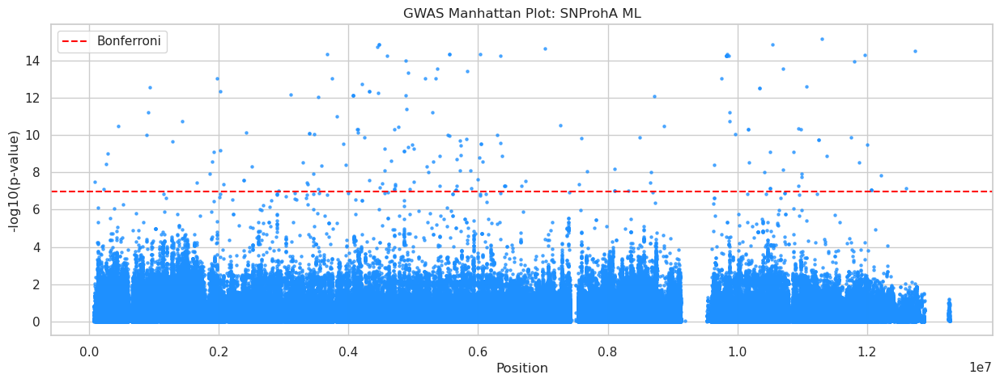

/data/antwerpen/grp/asvardal/miniconda3/envs/hscon6/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


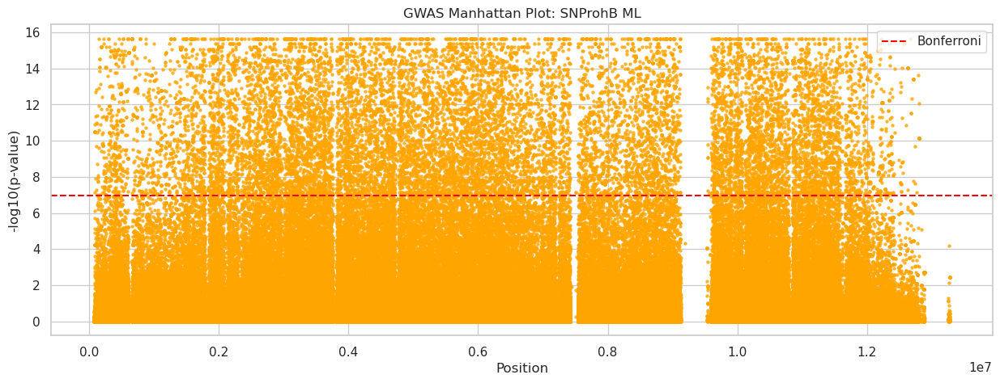

In [95]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

# --- Load GWAS results ---
gwas_file = "../results/population_analyses/rPodSic1.hap1.1/roh_gwas/bf/gwas_roh/roh_gwas_results_ML-IL/roh_gwas_OZ076857.1_ML_FULL.tsv"
df = pd.read_csv(gwas_file, sep="\t")

# --- Preprocess SNP info ---
df[['chrom','pos']] = df['SNP_ID'].str.split(':', expand=True)
df['pos'] = pd.to_numeric(df['pos'])

# Convert p-values and coefficients to numeric
for pred in ['SNProhA', 'SNProhB']:
    df[f'p_{pred}'] = pd.to_numeric(df[f'p_{pred}'], errors='coerce')
    df[f'{pred}'] = pd.to_numeric(df[f'{pred}'], errors='coerce')
    df[f'{pred}_log10p'] = -np.log10(df[f'p_{pred}'])

# Bonferroni threshold
n_snps = len(df)
bonf_thresh = 0.05 / n_snps
bonf_line = -np.log10(bonf_thresh)

# --- Manhattan plot for SNProhA ---
plt.figure(figsize=(15,5))
plt.scatter(df['pos'], df['SNProhA_log10p'], s=5, color='dodgerblue', alpha=0.7)
plt.axhline(bonf_line, color='red', linestyle='--', label='Bonferroni')
plt.xlabel('Position')
plt.ylabel('-log10(p-value)')
plt.title('GWAS Manhattan Plot: SNProhA ML')
plt.legend()
plt.show()

# --- Manhattan plot for SNProhB ---
plt.figure(figsize=(15,5))
plt.scatter(df['pos'], df['SNProhB_log10p'], s=5, color='orange', alpha=0.7)
plt.axhline(bonf_line, color='red', linestyle='--', label='Bonferroni')
plt.xlabel('Position')
plt.ylabel('-log10(p-value)')
plt.title('GWAS Manhattan Plot: SNProhB ML')
plt.legend()
plt.show()

In [275]:
beta_df = pd.DataFrame([
    # trait_group, trait, population, sex, beta_mean, beta_low, beta_high

    # ----------------------------
    # Physiological performance
    # ----------------------------
    ["Physiological performance", "Bite force", "Island", None,
     -3.5482, -6.1964, -1.1213],

    ["Physiological performance", "Bite force", "Mainland", None,
     -3.5482 + 7.9258, -6.1964 - 0.2403, -1.1213 + 16.9784],

    ["Physiological performance", "Sprint speed", "Island", None,
     -0.3993, -3.0506, 2.9016],

    ["Physiological performance", "Sprint speed", "Mainland", None,
     -0.3993 + 2.2160, -3.0506 - 7.3423, 2.9016 + 11.8007],

    # ----------------------------
    # Cognition
    # ----------------------------
    ["Cognition", "Spatial learning", "Island", None,
     -3.2790, -8.7185, 2.1795],

    ["Cognition", "Spatial learning", "Mainland", None,
     -3.2790 + 7.2065, -8.7185 - 13.9678, 2.1795 + 28.4195],

    # ----------------------------
    # Immune function
    # ----------------------------
    ["Immune function", "PHA", "Island", None,
     0.9820, -1.9394, 4.6328],

    ["Immune function", "PHA", "Mainland", None,
     0.9820 + 3.0403, -1.9394 - 7.7968, 4.6328 + 14.2091],

    # ----------------------------
    # Sperm quality
    # ----------------------------
    ["Sperm quality", "Sperm count", "Island", None,
     3.6640, -5.5056, 13.4636],

    ["Sperm quality", "Sperm count", "Mainland", None,
     3.6640 - 14.7551, -5.5056 - 57.0116, 13.4636 + 26.7705],

    ["Sperm quality", "Sperm length", "Island", None,
     -142.0420, -484.9891, 137.2284],

    ["Sperm quality", "Sperm length", "Mainland", None,
     -142.0420 + 510.7875, -484.9891 - 129.9171, 137.2284 + 1112.3841],

    ["Sperm quality", "Sperm velocity", "Island", None,
     -2.0387, -5.0270, 0.4513],

    ["Sperm quality", "Sperm velocity", "Mainland", None,
     -2.0387 + 5.5598, -5.0270 - 1.3515, 0.4513 + 12.6222],

    # ----------------------------
    # Morphology (sex-specific)
    # ----------------------------
    ["Morphology", "SVL", "Island", "Female",
     -1.1845, -2.1772, -0.0903],

    ["Morphology", "SVL", "Mainland", "Female",
     -1.1845 + 2.3807, -2.1772 + 1.0229, -0.0903 + 3.7563],

    ["Morphology", "SVL", "Island", "Male",
     -1.1845 + 0.1924, -2.1772 - 0.6873, -0.0903 + 1.0778],

    ["Morphology", "SVL", "Mainland", "Male",
     -1.1845 + 0.1924 + 2.3807,
     -2.1772 - 0.6873 + 1.0229,
     -0.0903 + 1.0778 + 3.7563],
],
columns=[
    "trait_group", "trait", "population", "sex",
    "beta_mean", "beta_low", "beta_high"
])

beta_df


,trait_group,trait,population,sex,beta_mean,beta_low,beta_high
0,Physiological performance,Bite force,Island,None,-3.5482,-6.1964,-1.1213
1,Physiological performance,Bite force,Mainland,None,4.3776,-6.4367,15.8571
2,Physiological performance,Sprint speed,Island,None,-0.3993,-3.0506,2.9016
3,Physiological performance,Sprint speed,Mainland,None,1.8167,-10.3929,14.7023
4,Cognition,Spatial learning,Island,None,-3.2790,-8.7185,2.1795
5,Cognition,Spatial learning,Mainland,None,3.9275,-22.6863,30.5990
6,Immune function,PHA,Island,None,0.9820,-1.9394,4.6328
7,Immune function,PHA,Mainland,None,4.0223,-9.7362,18.8419
8,Sperm quality,Sperm count,Island,None,3.6640,-5.5056,13.4636
9,Sperm quality,Sperm count,Mainland,None,-11.0911,-62.5172,40.2341


In [277]:
beta_df_std = pd.DataFrame([
    # trait_group, trait, population, sex, beta_mean, beta_low, beta_high

    # ----------------------------
    # Physiological performance
    # ----------------------------
    ["Physiological performance", "Bite force", "Island", None,
     -2.0825, -3.3115, -0.9022],

    ["Physiological performance", "Bite force", "Mainland", None,
     -2.0825 + 4.8643,
     -3.3115 - 0.5051,
     -0.9022 + 10.0810],
    
    ["Physiological performance", "Sprint speed", "Island", None,
     -0.666459, -2.576064, 1.226646],

    ["Physiological performance", "Sprint speed", "Mainland", None,
      1.570748, -8.789315, 11.841722],
    ["Sperm quality", "Sperm count", "Island", None,
      0.93628,  -1.27815,   3.41029],

    ["Sperm quality", "Sperm count", "Mainland", None,
     -2.80918, -15.93617,  10.01102],
    ["Sperm quality", "Sperm length", "Island", None,
      -2.9402315,  -9.7979168,   2.9294237],

    ["Sperm quality", "Sperm length", "Mainland", None,
       6.9772658, -11.6636482,  25.4322047],
    ["Sperm quality", "Sperm velocity", "Island", None,
      -3.19861,  -7.48717,   0.10589],

    ["Sperm quality", "Sperm velocity", "Mainland", None,
       6.06658, -10.15141,  21.56426],

    ["Immune function", "PHA", "Island", None,
      0.55276,  -1.64983,   3.23183],

    ["Immune function", "PHA", "Mainland", None,
      3.87819,  -9.83934,  17.96221],
    ["Cognition", "Spatial learning", "Island", None,
      -0.81946,  -2.13903,   0.60291],

    ["Cognition", "Spatial learning", "Mainland", None,
       0.92636,  -6.08416,   7.46533],

],
columns=[
    "trait_group", "trait", "population", "sex",
    "beta_mean", "beta_low", "beta_high"
])

beta_df_std

,trait_group,trait,population,sex,beta_mean,beta_low,beta_high
0,Physiological performance,Bite force,Island,None,-2.082500,-3.311500,-0.902200
1,Physiological performance,Bite force,Mainland,None,2.781800,-3.816600,9.178800
2,Physiological performance,Sprint speed,Island,None,-0.666459,-2.576064,1.226646
3,Physiological performance,Sprint speed,Mainland,None,1.570748,-8.789315,11.841722
4,Sperm quality,Sperm count,Island,None,0.936280,-1.278150,3.410290
5,Sperm quality,Sperm count,Mainland,None,-2.809180,-15.936170,10.011020
6,Sperm quality,Sperm length,Island,None,-2.940231,-9.797917,2.929424
7,Sperm quality,Sperm length,Mainland,None,6.977266,-11.663648,25.432205
8,Sperm quality,Sperm velocity,Island,None,-3.198610,-7.487170,0.105890
9,Sperm quality,Sperm velocity,Mainland,None,6.066580,-10.151410,21.564260


In [279]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# =========================
# Font (MATCHED)
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]
plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

# =========================
# Colors
# =========================
palette = {"Mainland": "#208438", "Island": "#479BC9"}


def plot_beta_combined(
    df,
    figsize_cm=(9.53, 9.15),   # <-- YOU CONTROL SIZE HERE
    x_label="Inbreeding depression (β)",  # <-- YOU CONTROL LABEL HERE
    xlim=(-26, 26)
):

    # =========================
    # Order traits
    # =========================
    order = df["trait"].unique()[::-1]
    y_positions = {trait: i for i, trait in enumerate(order)}

    offset = {"Island": -0.15, "Mainland": +0.15}

    # =========================
    # Figure
    # =========================
    cm = 1 / 2.54
    fig, ax = plt.subplots(
        figsize=(figsize_cm[0]*cm, figsize_cm[1]*cm),
        dpi=300
    )

    # =========================
    # Plot
    # =========================
    for _, row in df.iterrows():

        y = y_positions[row["trait"]] + offset[row["population"]]

        ax.errorbar(
            row["beta_mean"],
            y,
            xerr=[[row["beta_mean"] - row["beta_low"]],
                  [row["beta_high"] - row["beta_mean"]]],
            fmt="o",
            color=palette[row["population"]],
            capsize=3,
            markersize=4,
            linewidth=1.2,
            alpha=0.9,
            zorder=2
        )

    # =========================
    # Reference line
    # =========================
    ax.axvline(0, color="black", linestyle="--", linewidth=0.8, zorder=1)

    # =========================
    # Grid
    # =========================
    ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    ax.grid(axis="y", visible=False)

    # =========================
    # Y axis (traits)
    # =========================
    ax.set_yticks(range(len(order)))
    ax.set_yticklabels(order)

    # =========================
    # X axis
    # =========================
    ax.set_xlim(xlim)

    # =========================
    # Labels (USER CONTROLLED)
    # =========================
    ax.set_xlabel(x_label)
    ax.set_ylabel("")

    # =========================
    # Ticks (EXPLICIT CONTROL)
    # =========================
    ax.tick_params(
        axis='x',
        which='major',
        bottom=True,
        top=False,
        length=3,
        width=0.8,
        direction='out',
        pad=2
    )

    ax.tick_params(
        axis='y',
        which='major',
        left=True,
        right=False,
        length=3,
        width=0.8,
        direction='out',
        pad=2
    )

    # =========================
    # Spines
    # =========================
    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(0.8)

    # =========================
    # Layout (MATCH YOUR SYSTEM)
    # =========================
    ax.set_position([0.25, 0.12, 0.7, 0.82])

    # =========================
    # Legend
    # =========================
    handles = [
        plt.Line2D([0], [0], marker='o', color='w',
                   markerfacecolor=palette[k], markersize=5, label=k)
        for k in palette
    ]

    ax.legend(handles=handles, frameon=False, loc="lower right")

    return fig, ax

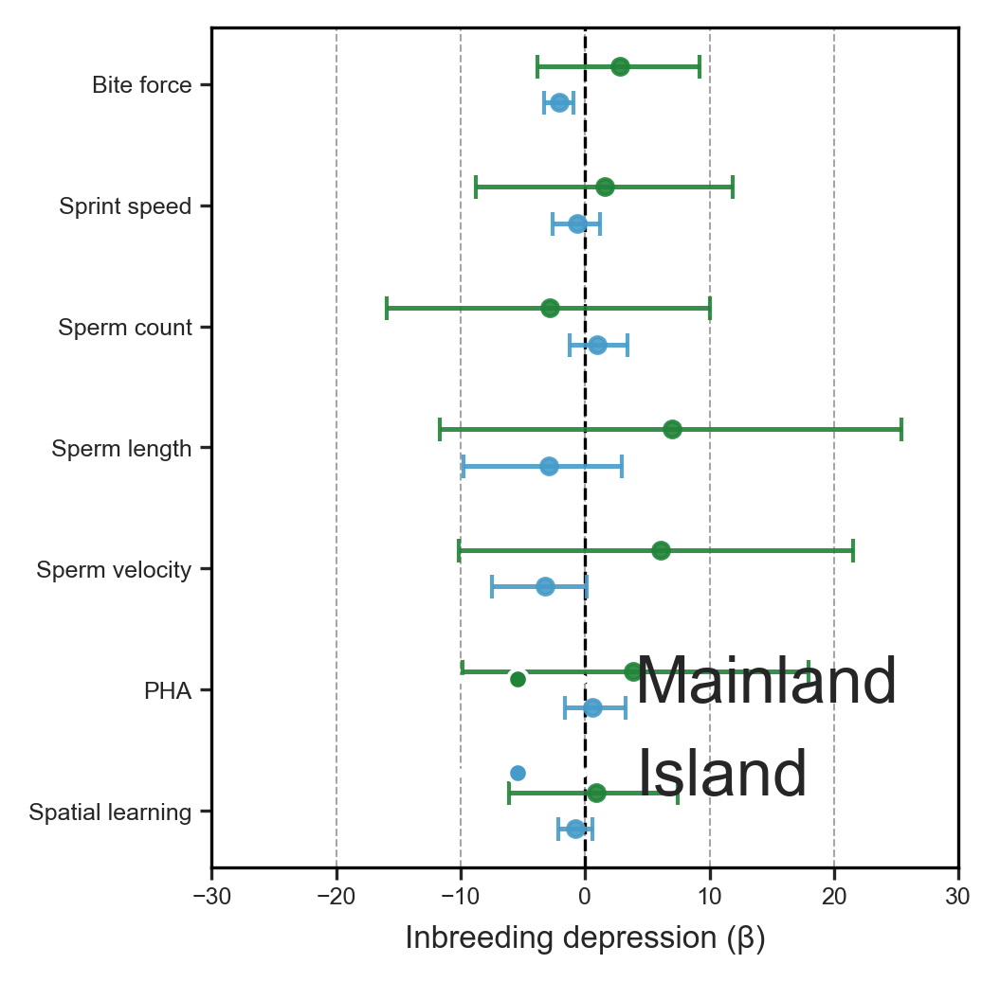

In [281]:
fig, ax = plot_beta_combined(
    beta_df_std,
    xlim=(-30, 30)                       # optional
)

plt.savefig("beta_combined.svg", dpi=300)
plt.show()

In [306]:
def plot_beta_combined(
    df,
    figsize_cm=(9.53, 9.15),
    xlim=(-26, 26)
):

    import numpy as np
    import matplotlib.pyplot as plt

    order = df["trait"].unique()[::-1]
    y_positions = {trait: i for i, trait in enumerate(order)}
    offset = {"Island": -0.15, "Mainland": +0.15}

    cm = 1 / 2.54
    fig, ax = plt.subplots(
        figsize=(figsize_cm[0]*cm, figsize_cm[1]*cm),
        dpi=300
    )

    # =========================
    # Plot (SOLID POINTS)
    # =========================
    ax.axvline(0, color="black", linestyle="--", linewidth=0.8, zorder=2)
    for _, row in df.iterrows():

        y = y_positions[row["trait"]] + offset[row["population"]]

        ax.errorbar(
            row["beta_mean"],
            y,
            xerr=[[row["beta_mean"] - row["beta_low"]],
                  [row["beta_high"] - row["beta_mean"]]],
            fmt="o",
            color=palette[row["population"]],
            capsize=3,
            markersize=4,
            linewidth=1.2,
            alpha=1.0,
            zorder=2
        )

    # =========================
    # Grid
    # =========================
    ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    ax.grid(axis="y", visible=False)

    # remove grid line at x = 0
    ax.axvline(0, color="white", linewidth=1.2, zorder=1)

    # =========================
    # Reference line (clean)
    # =========================


    # =========================
    # Y axis (structure only)
    # =========================
    ax.set_yticks(range(len(order)))
    ax.set_yticklabels([])

    # =========================
    # X axis
    # =========================
    ax.set_xlim(xlim)
    ax.set_xticklabels([])

    # =========================
    # Remove axis labels
    # =========================
    ax.set_xlabel("")
    ax.set_ylabel("")

    # =========================
    # Ticks
    # =========================
    ax.tick_params(
        axis='x',
        bottom=True,
        length=3,
        width=0.8,
        direction='out'
    )

    ax.tick_params(
        axis='y',
        left=True,
        length=3,
        width=0.8,
        direction='out'
    )

    # =========================
    # Spines
    # =========================
    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(0.8)

    # =========================
    # Layout
    # =========================
    ax.set_position([0.25, 0.12, 0.7, 0.82])

    # =========================
    # Legend (tight dots only)
    # =========================
    handles = [
        plt.Line2D([0], [0], marker='o', linestyle='',
                   markerfacecolor=palette[k],
                   markeredgecolor=palette[k],
                   markersize=5,
                   label="")
        for k in palette
    ]

    ax.legend(
        handles=handles,
        labels=["        ", "        "],
        frameon=False,
        loc="lower right",
        handlelength=0,
        handletextpad=0,
        borderpad=0,
        labelspacing=0.05,
        handleheight=0.1
    )

    return fig, ax

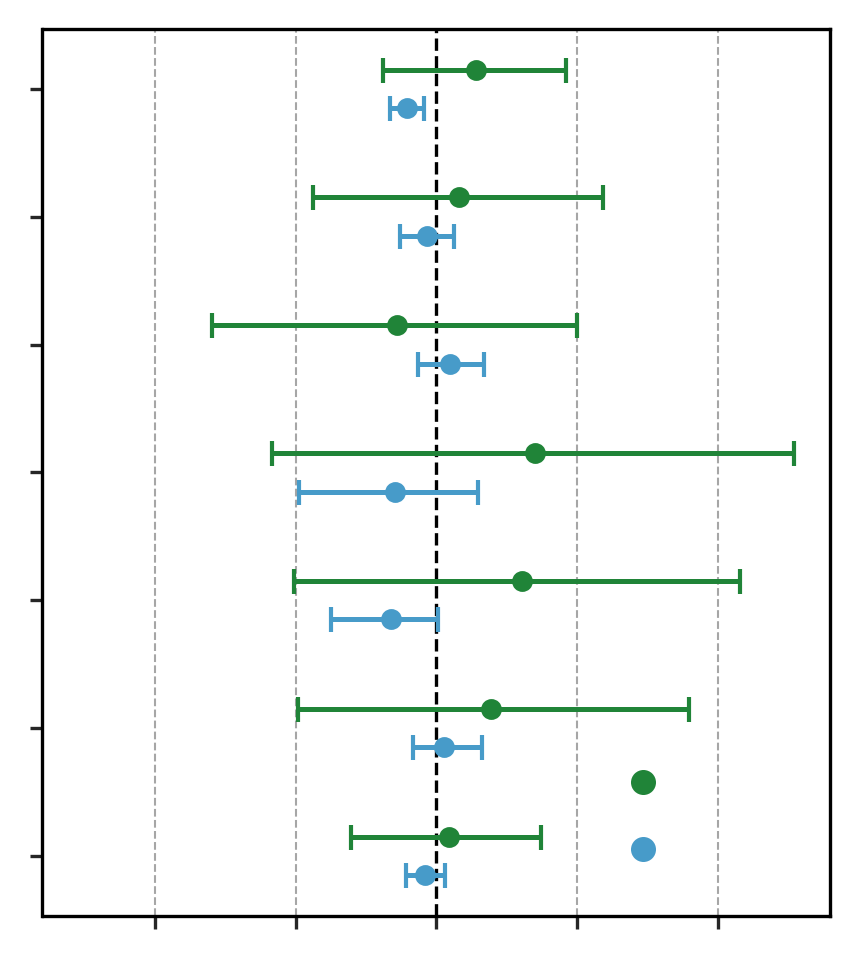

In [307]:
fig, ax = plot_beta_combined(
    beta_df_std,
    xlim=(-28, 28)                       # optional
)

plt.savefig("beta_combined1.svg", dpi=300)
plt.show()

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

sns.set_style("whitegrid")

COLORS = {
    "Mainland": "#009900",  # green
    "Island": "#0066CC"     # blue
}

# # --- Register Arial ---
# arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
# fm.fontManager.addfont(arial_path)
# arial_font = fm.FontProperties(fname=arial_path)

# plt.rcParams.update({
#     "font.family": arial_font.get_name(),
#     "font.size": 8,
#     "axes.labelsize": 8,
#     "axes.titlesize": 8,
#     "xtick.labelsize": 8,
#     "ytick.labelsize": 8,
#     "legend.fontsize": 8
# })


def plot_beta_trait(df, trait_name):
    d = df[df["trait"] == trait_name].reset_index(drop=True)

    width_cm = 7
    height_cm = 3
    fig, ax = plt.subplots(
        figsize=(width_cm / 2.54, height_cm / 2.54)
    )

    if len(d) == 2:
        y = np.array([-0.25, 0.25])
    else:
        y = np.linspace(-0.3, 0.3, len(d))

    for i, row in d.iterrows():
        ax.errorbar(
            row["beta_mean"],
            y[i],
            xerr=[[row["beta_mean"] - row["beta_low"]],
                  [row["beta_high"] - row["beta_mean"]]],
            fmt="o",
            color=COLORS[row["population"]],
            capsize=3,
            markersize=4,
            linewidth=1.2,
            alpha=0.9
        )

    # --- Fixed x-axis across all traits ---
    ax.set_xlim(-26, 26)
    ax.axvline(0, color="black", linestyle="--", linewidth=0.8)

    ax.set_yticks([])
    ax.set_yticklabels("")
    ax.set_ylim(-0.6, 0.6)

    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")
    if ax.get_legend() is not None:
        ax.legend_.remove()

    ax.grid(
        axis="x",
        color="grey",
        linestyle="--",
        linewidth=0.6,
        alpha=0.5
    )
    ax.grid(axis="y", visible=False)

    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(0.8)

    ax.tick_params(axis="both", colors="black", width=0.8, length=3)

    plt.tight_layout(pad=0.6)

    return fig, ax


In [ ]:
plot_beta_trait(beta_df, "Bite force")
plot_beta_trait(beta_df, "Sprint speed")
plot_beta_trait(beta_df, "PHA")
plot_beta_trait(beta_df, "Spatial learning")

(<Figure size 275.591x118.11 with 1 Axes>, <Axes: >)

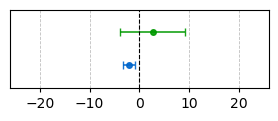

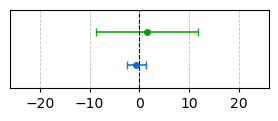

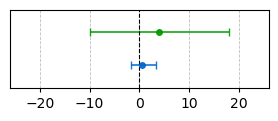

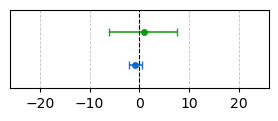

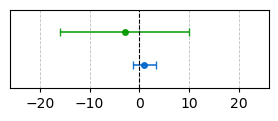

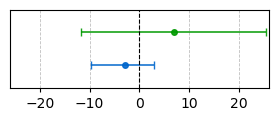

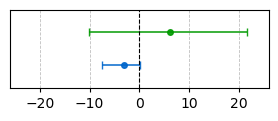

In [50]:
plot_beta_trait(beta_df_std, "Bite force")
plot_beta_trait(beta_df_std, "Sprint speed")
plot_beta_trait(beta_df_std, "PHA")
plot_beta_trait(beta_df_std, "Spatial learning")
plot_beta_trait(beta_df_std, "Sperm count")
plot_beta_trait(beta_df_std, "Sperm length")
plot_beta_trait(beta_df_std, "Sperm velocity")

In [51]:
fig, ax = plot_beta_trait(beta_df_std, "Bite force")
fig.savefig("bite_force_inbreeding.svg", format="svg")
plt.close(fig)

In [52]:
fig, ax = plot_beta_trait(beta_df_std, "Sprint speed")
fig.savefig("sprint_speed_inbreeding.svg", format="svg")
plt.close(fig)

In [53]:
fig, ax = plot_beta_trait(beta_df_std, "PHA")
fig.savefig("PHA_inbreeding.svg", format="svg")
plt.close(fig)

In [54]:
fig, ax = plot_beta_trait(beta_df_std, "Spatial learning")
fig.savefig("Spatial_learning_inbreeding.svg", format="svg")
plt.close(fig)

In [55]:
fig, ax = plot_beta_trait(beta_df_std, "Sperm count")
fig.savefig("Sperm_count_inbreeding.svg", format="svg")
plt.close(fig)

In [56]:
fig, ax = plot_beta_trait(beta_df_std, "Sperm length")
fig.savefig("Sperm_length_inbreeding.svg", format="svg")
plt.close(fig)

In [57]:
fig, ax = plot_beta_trait(beta_df_std, "Sperm velocity")
fig.savefig("Sperm_velocity_inbreeding.svg", format="svg")
plt.close(fig)

In [270]:
def plot_beta_trait(df, trait_name):
    d = df[df["trait"] == trait_name].reset_index(drop=True)

    # --- Figure size: 7 cm wide ---
    width_cm = 7
    height_cm = 2.50
    fig, ax = plt.subplots(
        figsize=(width_cm / 2.54, height_cm / 2.54)
    )

    # --- Centered y positions ---
    if len(d) == 2:
        y = np.array([-0.25, 0.25])
    else:
        y = np.linspace(-0.3, 0.3, len(d))

    for i, row in d.iterrows():
        ax.errorbar(
            row["beta_mean"],
            y[i],
            xerr=[[row["beta_mean"] - row["beta_low"]],
                  [row["beta_high"] - row["beta_mean"]]],
            fmt="o",
            color=COLORS[row["population"]],
            capsize=3,
            markersize=4,
            linewidth=1.2,
            alpha=0.9
        )

    # --- Center zero on x-axis ---
    max_abs = max(abs(d["beta_low"].min()), abs(d["beta_high"].max()))
    ax.set_xlim(-max_abs * 1.1, max_abs * 1.1)

    ax.axvline(0, color="black", linestyle="--", linewidth=0.8)

    # --- Y-axis ---
    ax.set_yticks(y)
    ax.set_yticklabels("")
    ax.set_ylim(-0.6, 0.6)

    # --- Remove labels, title, legend ---
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")
    if ax.get_legend() is not None:
        ax.legend_.remove()

    # --- Grey vertical grid lines ---
    ax.grid(
        axis="x",
        color="grey",
        linestyle="--",
        linewidth=0.6,
        alpha=0.5
    )
    ax.grid(axis="y", visible=False)

    # --- Black axes ---
    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(0.8)

    ax.tick_params(axis="both", colors="black", width=0.8, length=3)

    plt.tight_layout(pad=0.6)

    return fig, ax


(<Figure size 275.591x98.4252 with 1 Axes>, <Axes: >)

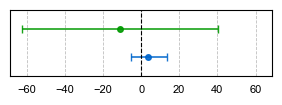

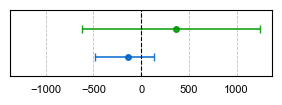

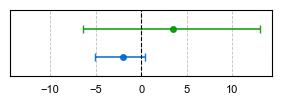

In [271]:
plot_beta_trait(beta_df, "Sperm count")
plot_beta_trait(beta_df, "Sperm length")
plot_beta_trait(beta_df, "Sperm velocity")

In [272]:
fig, ax = plot_beta_trait(beta_df, "Sperm count")
fig.savefig("Sperm_count_inbreeding.svg", format="svg")
plt.close(fig)

In [273]:
fig, ax = plot_beta_trait(beta_df, "Sperm length")
fig.savefig("Sperm_length_inbreeding.svg", format="svg")
plt.close(fig)

In [274]:
fig, ax = plot_beta_trait(beta_df, "Sperm velocity")
fig.savefig("Sperm_velocity_inbreeding.svg", format="svg")
plt.close(fig)

In [268]:
def plot_beta_trait_svl(df):
    # --- Filter and FORCE correct order ---
    d = (
        df[df["trait"] == "SVL"]
        .assign(
            pop_order=lambda x: x["population"].map(
                {"Mainland": 0, "Island": 1}
            ),
            sex_order=lambda x: x["sex"].map(
                {"Female": 0, "Male": 1}
            )
        )
        .sort_values(["pop_order", "sex_order"])
        .reset_index(drop=True)
    )

    # --- Figure size: 7 cm wide ---
    width_cm = 7
    height_cm = 4
    fig, ax = plt.subplots(
        figsize=(width_cm / 2.54, height_cm / 2.54)
    )

    # --- Centered y positions (top to bottom) ---
    y_positions = np.array([0.30, 0.10, -0.10, -0.30])

    marker_map = {
        "Male": "o",     # circles
        "Female": "^"    # triangles
    }

    for i, row in d.iterrows():
        ax.errorbar(
            row["beta_mean"],
            y_positions[i],
            xerr=[[row["beta_mean"] - row["beta_low"]],
                  [row["beta_high"] - row["beta_mean"]]],
            fmt=marker_map[row["sex"]],
            color=COLORS[row["population"]],
            capsize=3,
            markersize=4,
            linewidth=1.2,
            alpha=0.9
        )

    # --- Center zero on x-axis ---
    max_abs = max(abs(d["beta_low"].min()), abs(d["beta_high"].max()))
    ax.set_xlim(-max_abs * 1.1, max_abs * 1.1)

    ax.axvline(0, color="black", linestyle="--", linewidth=0.8)

    # --- Y-axis ---
    ax.set_yticks([])
    ax.set_ylim(-0.5, 0.5)

    # --- Remove labels, title, legend ---
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")
    if ax.get_legend() is not None:
        ax.legend_.remove()

    # --- Grey vertical grid lines ---
    ax.grid(
        axis="x",
        color="grey",
        linestyle="--",
        linewidth=0.6,
        alpha=0.5
    )
    ax.grid(axis="y", visible=False)

    # --- Black axes ---
    for spine in ax.spines.values():
        spine.set_color("black")
        spine.set_linewidth(0.8)

    ax.tick_params(axis="both", colors="black", width=0.8, length=3)

    plt.tight_layout(pad=0.6)

    return fig, ax


(<Figure size 275.591x157.48 with 1 Axes>, <Axes: >)

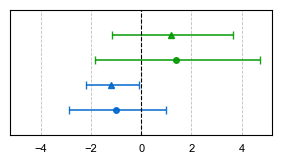

In [269]:
plot_beta_trait_svl(beta_df)

In [275]:
fig, ax = plot_beta_trait_svl(beta_df)
fig.savefig("svl_inbreeding.svg", format="svg")
plt.close(fig)

In [69]:
import pandas as pd

# ---- Load posterior samples ----
post = pd.read_csv(
    "mcmcglmm_posterior_fixed_effects.tsv",
    sep="\t"
)

# ---- Load predictions ----
pred = pd.read_csv(
    "mcmcglmm_BF_Froh_predictions.tsv",
    sep="\t"
)

pred.head()

import pandas as pd

df = pd.read_csv(
    "mcmcglmm_raw_data_BF_Froh.tsv",
    sep="\t"
)

df.head()



,log_BF_max,Froh,head_size,type
0,0.964700,0.611400,9.903045,island
1,1.568616,0.618833,10.226325,island
2,1.440783,0.603914,10.742541,island
3,1.568616,0.609881,10.793844,island
4,1.425515,0.622420,10.354302,island


In [70]:
df.head()

,log_BF_max,Froh,head_size,type
0,0.964700,0.611400,9.903045,island
1,1.568616,0.618833,10.226325,island
2,1.440783,0.603914,10.742541,island
3,1.568616,0.609881,10.793844,island
4,1.425515,0.622420,10.354302,island


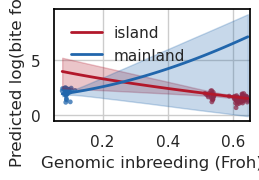

In [509]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(7/2.54, 5/2.54))

# ---- Raw data (background) ----
for t, color in zip(["island", "mainland"], ["#B2182B", "#2166AC"]):
    d_raw = df[df["type"] == t]

    ax.scatter(
        d_raw["Froh"],
        d_raw["log_BF_max"],
        s=12,
        alpha=0.75,
        color=color,
        edgecolor="none"
    )

# ---- Predictions (foreground) ----
pred_sub = pred[(pred["Froh"] >= 0.05) & (pred["Froh"] <= 0.65)]

for t, color in zip(["island", "mainland"], ["#B2182B", "#2166AC"]):
    d = pred_sub[pred_sub["type"] == t]

    ax.fill_between(
        d["Froh"],
        np.log(d["BF_low"]),
        np.log(d["BF_high"]),
        alpha=0.25,
        color=color
    )
    ax.plot(
        d["Froh"],
        np.log(d["BF_mean"]),
        color=color,
        linewidth=2.0,
        label=t
    )

# ---- Labels & styling ----
ax.set_xlabel("Genomic inbreeding (Froh)")
ax.set_ylabel("Predicted log(bite force)")

ax.legend(frameon=False, loc="upper left", bbox_to_anchor=(0.02, 0.98))

for spine in ax.spines.values():
    spine.set_color("black")

ax.set_xlim(0.05, 0.65)

plt.tight_layout()
plt.show()


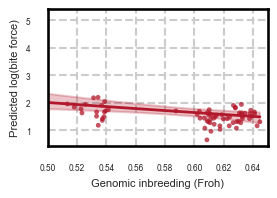

In [311]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(7/2.54, 5/2.54))

# =========================
# Raw data (Island only)
# =========================
d_raw = df[df["type"] == "island"]

ax.scatter(
    d_raw["Froh"],
    d_raw["log_BF_max"],
    s=12,
    alpha=0.75,
    color="#B2182B",
    edgecolor="none"
)

# =========================
# Predictions (Island only)
# =========================
pred_sub = pred[(pred["Froh"] >= 0.05) & (pred["Froh"] <= 0.65)]
d = pred_sub[pred_sub["type"] == "island"]

ax.fill_between(
    d["Froh"],
    np.log(d["BF_low"]),
    np.log(d["BF_high"]),
    alpha=0.25,
    color="#B2182B"
)

ax.plot(
    d["Froh"],
    np.log(d["BF_mean"]),
    color="#B2182B",
    linewidth=2.0
)

# =========================
# Labels & styling
# =========================
ax.set_xlabel("Genomic inbreeding (Froh)")
ax.set_ylabel("Predicted log(bite force)")

# (legend removed since only one group)

for spine in ax.spines.values():
    spine.set_color("black")

ax.set_xlim(0.5, 0.65)

plt.tight_layout()
plt.show()

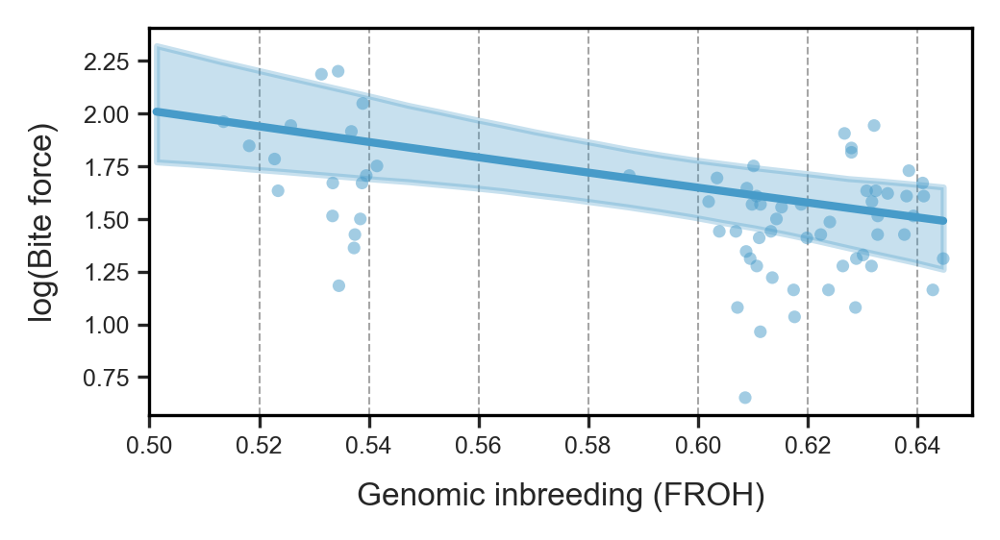

In [317]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.font_manager as fm

# =========================
# Load and register Arial (MATCHED)
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

# =========================
# Figure size (MATCH SYSTEM)
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(9.53*cm, 4.61*cm), dpi=300)

# =========================
# Colors (MATCH YOUR PALETTE)
# =========================
color = "#479BC9"  # Island blue (same as other panels)

# =========================
# Raw data
# =========================
d_raw = df[df["type"] == "island"]

ax.scatter(
    d_raw["Froh"],
    d_raw["log_BF_max"],
    s=10,
    alpha=0.5,
    color=color,
    edgecolor="none",
    zorder=1
)

# =========================
# Predictions
# =========================
pred_sub = pred[(pred["Froh"] >= 0.50) & (pred["Froh"] <= 0.70)]
d = pred_sub[pred_sub["type"] == "island"]

ax.fill_between(
    d["Froh"],
    np.log(d["BF_low"]),
    np.log(d["BF_high"]),
    alpha=0.3,
    color=color,
    zorder=2
)

ax.plot(
    d["Froh"],
    np.log(d["BF_mean"]),
    color=color,
    linewidth=2.0,
    zorder=3
)

# =========================
# Grid (MATCHED)
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
ax.grid(axis="y", visible=False)

# =========================
# Axes
# =========================
ax.set_xlim(0.50, 0.65)

ax.set_xlabel("Genomic inbreeding (FROH)", labelpad=6)
ax.set_ylabel("log(Bite force)", labelpad=6)

# =========================
# Tick styling (MATCHED)
# =========================
ax.tick_params(
    axis='x',
    bottom=True,
    length=3,
    width=0.8,
    direction='out',
    pad=2
)

ax.tick_params(
    axis='y',
    left=True,
    length=3,
    width=0.8,
    direction='out',
    pad=2
)

# =========================
# Spines (MATCHED BLACK BOX)
# =========================
for spine in ax.spines.values():
    spine.set_color("black")
    spine.set_linewidth(0.8)

# =========================
# Layout (CRUCIAL MATCH)
# =========================
ax.set_position([0.18, 0.18, 0.76, 0.74])

# =========================
# Finalize
# =========================
fig.canvas.draw()

plt.show()

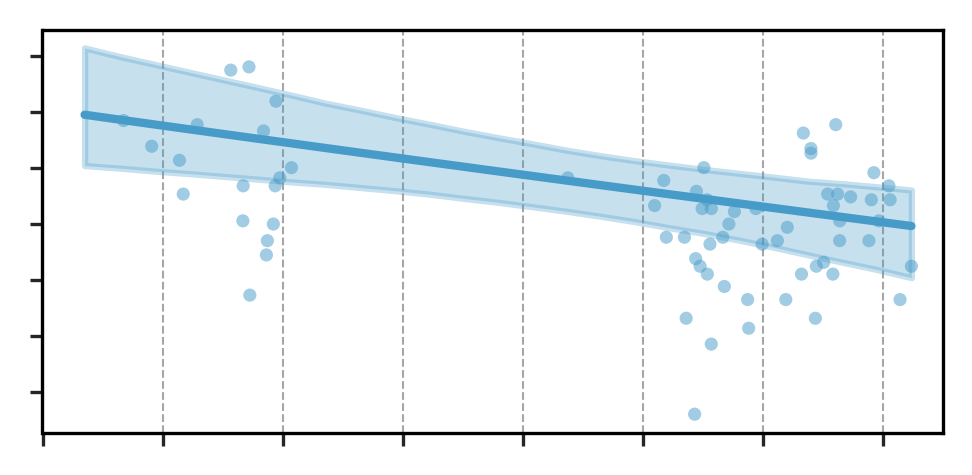

In [327]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.font_manager as fm

# =========================
# Load and register Arial (MATCHED)
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"

fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

# =========================
# Figure size (MATCH SYSTEM)
# =========================
cm = 1 / 2.54
fig, ax = plt.subplots(figsize=(9.53*cm, 4.61*cm), dpi=300)

# =========================
# Colors
# =========================
color = "#479BC9"

# =========================
# Raw data
# =========================
d_raw = df[df["type"] == "island"]

ax.scatter(
    d_raw["Froh"],
    d_raw["log_BF_max"],
    s=10,
    alpha=0.5,
    color=color,
    edgecolor="none",
    zorder=1
)

# =========================
# Predictions
# =========================
pred_sub = pred[(pred["Froh"] >= 0.505) & (pred["Froh"] <= 0.70)]
d = pred_sub[pred_sub["type"] == "island"]

ax.fill_between(
    d["Froh"],
    np.log(d["BF_low"]),
    np.log(d["BF_high"]),
    alpha=0.3,
    color=color,
    zorder=2
)

ax.plot(
    d["Froh"],
    np.log(d["BF_mean"]),
    color=color,
    linewidth=2.0,
    zorder=3
)

# =========================
# Grid
# =========================
ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
ax.grid(axis="y", visible=False)

# =========================
# Axes
# =========================
ax.set_xlim(0.50, 0.65)

# REMOVE LABELS
ax.set_xlabel("")
ax.set_ylabel("")

# =========================
# Tick styling
# =========================
ax.tick_params(
    axis='x',
    bottom=True,
    length=3,
    width=0.8,
    direction='out',
    pad=2
)

ax.tick_params(
    axis='y',
    left=True,
    length=3,
    width=0.8,
    direction='out',
    pad=2
)

# =========================
# Spines
# =========================
for spine in ax.spines.values():
    spine.set_color("black")
    spine.set_linewidth(0.8)

# =========================
# Layout
# =========================
ax.set_position([0.15, 0.18, 0.80, 0.74])
ax.set_xticklabels([])
ax.set_yticklabels([])

# =========================
# Save
# =========================
fig.canvas.draw()

plt.savefig(
    "island_biteforce_panel.svg",
    format="svg",
    dpi=300
)

plt.show()

In [597]:
import matplotlib as mpl

mpl.rcParams["font.family"] = "DejaVu Sans"

In [598]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def plot_beta_trait(
    df,
    trait_name,
    y_label="",
    label_fontsize=12,
    tick_fontsize=10,
    legend_fontsize=10
):
    d = df[df["trait"] == trait_name].reset_index(drop=True)

    # --- Figure size ---
    width_cm = 25
    height_cm = 8
    fig, ax = plt.subplots(figsize=(width_cm / 2.54, height_cm / 2.54))

    # --- Centered y positions ---
    if len(d) == 2:
        y = np.array([-0.25, 0.25])
    else:
        y = np.linspace(-0.3, 0.3, len(d))

    # --- Plot points + CI ---
    for i, row in d.iterrows():
        ax.errorbar(
            row["beta_mean"],
            y[i],
            xerr=[[row["beta_mean"] - row["beta_low"]],
                  [row["beta_high"] - row["beta_mean"]]],
            fmt="o",
            color=COLORS[row["population"]],
            capsize=10,
            markeredgewidth=5,
            markersize=25,
            linewidth=5,
            alpha=1
        )

    # --- Center zero on x-axis ---
    max_abs = max(abs(d["beta_low"].min()), abs(d["beta_high"].max()))
    ax.set_xlim(-max_abs * 1.1, max_abs * 1.1)
    ax.axvline(0, color="black", linestyle="--", linewidth=0.8, zorder = 0)

    # --- Y-axis ---
    ax.set_yticks(y)
    ax.set_yticklabels("")
    ax.set_ylim(-0.6, 0.6)
    ax.set_ylabel(y_label, fontsize=label_fontsize)

    # --- X ticks ---
    ax.tick_params(axis="x", labelsize=30)
    ax.tick_params(axis="y", labelsize=tick_fontsize)
    ax.set_xlabel("Inbreeding depression (β)", fontsize=35)

    # --- Grid ---
    ax.grid(
        axis="x",
        color="grey",
        linestyle="--",
        linewidth=1,
        alpha=0.5
    )
    ax.grid(axis="y", visible=False)

    # --- Legend order ---
    legend_order = ["Mainland", "Island"]
    
    legend_elements = [
        Line2D(
            [0], [0],
            marker="o",
            color="w",
            label=pop,
            markerfacecolor=COLORS[pop],
            markersize=12
        )
        for pop in legend_order
        if pop in d["population"].values
    ]
    
    ax.legend(
        handles=legend_elements,
        frameon=False,
        fontsize=30,
        loc="lower right",
        handletextpad=0.001,
        labelspacing=0.001
    )


    plt.tight_layout(pad=0.6)

    return fig, ax


In [599]:
plot_beta_trait(beta_df, "Bite force")

(<Figure size 984.252x314.961 with 1 Axes>,
 <Axes: xlabel='Inbreeding depression (β)'>)

In [600]:
fig, ax = plot_beta_trait(beta_df, "Bite force")
fig.savefig("bite_force_inbreeding_poster.svg", format="svg")
plt.close(fig)



In [588]:
print(plt.rcParams["font.family"])
print(plt.rcParams["font.size"])

['sans-serif']
10.0


In [593]:
import matplotlib as mpl

mpl.rcParams["font.family"] = "DejaVu Sans"

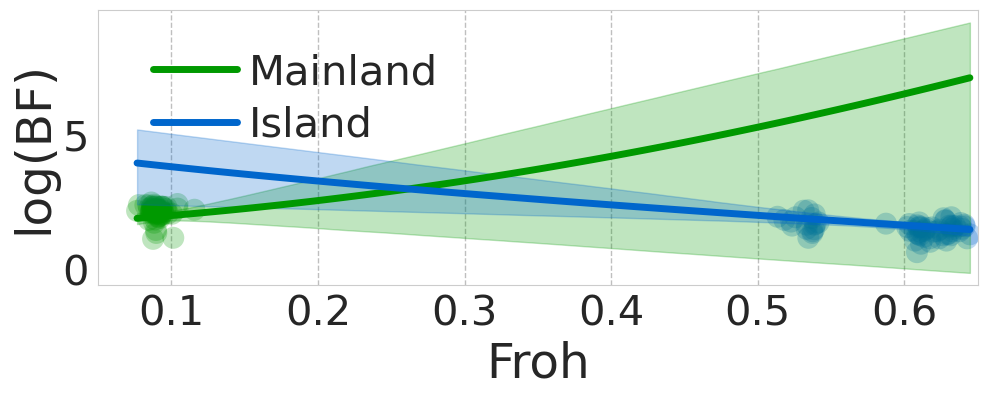

In [594]:
import matplotlib.pyplot as plt
import numpy as np

COLORS = {
    "island": "#0066CC",
    "mainland": "#009900"
}

fig, ax = plt.subplots(figsize=(25/2.54, 10/2.54))

# -------------------------------
# Raw data (background)
# -------------------------------
for t in ["mainland", "island"]:   # mainland plotted first (under)
    d_raw = df[df["type"] == t]

    ax.scatter(
        d_raw["Froh"],
        d_raw["log_BF_max"],
        s=250,
        alpha=0.25,                 # subtle background
        color=COLORS[t],
        edgecolor="none",
        zorder=1
    )

# -------------------------------
# Predictions (foreground)
# -------------------------------
pred_sub = pred[(pred["Froh"] >= 0.05) & (pred["Froh"] <= 0.65)]

for t in ["mainland", "island"]:
    d = pred_sub[pred_sub["type"] == t]

    ax.fill_between(
        d["Froh"],
        np.log(d["BF_low"]),
        np.log(d["BF_high"]),
        color=COLORS[t],
        alpha=0.25,
        zorder=2
    )

    ax.plot(
        d["Froh"],
        np.log(d["BF_mean"]),
        color=COLORS[t],
        linewidth=5,
        label=t.capitalize(),
        zorder=3
    )

# -------------------------------
# Axes, labels, grid
# -------------------------------
ax.set_xlabel("Froh", fontsize=35)
ax.set_ylabel("log(BF)", fontsize=35)

ax.set_xlim(0.05, 0.65)

ax.grid(
    axis="x",
    color="grey",
    linestyle="--",
    linewidth=1,
    alpha=0.5
)
ax.grid(axis="y", visible=False)

ax.tick_params(axis="both", labelsize=30, width=0.8, length=3)

# -------------------------------
# Legend (style-matched)
# -------------------------------
ax.legend(
    frameon=False,
    loc="upper left",
    bbox_to_anchor=(0.02, 0.98),
    fontsize=30,
    handletextpad=0.3,
    labelspacing=0.3
)

plt.tight_layout(pad=0.6)
plt.savefig("model_inbreeding_depression_poster.svg", format="svg", dpi=300)
plt.show()


## 14. Genetic load

### 14.1. SNPeff output

In [142]:
df_load = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genetic_load/genetic_load_counts.tsv", sep="\t")
df_load.head()

,sample,population,population_type,category,Tot,Hom,Het
0,BJ04,BJ,island,DEL,60693,27810,5073
1,BJ04,BJ,island,LOF,830,378,74
2,BJ04,BJ,island,SYN,774474,379783,14908
3,BJ06,BJ,island,DEL,60790,27624,5542
4,BJ06,BJ,island,LOF,826,375,76


In [143]:
df_load.groupby(["population_type","category"])[["Hom","Het","Tot"]].mean()

Hom            Het            Tot
population_type category                                             
island          DEL        25050.484277   10811.874214   60912.842767
                LOF          341.685535     142.075472     825.446541
                SYN       371554.427673   31745.257862  774854.113208
mainland        DEL        13330.201923   36529.538462   63189.942308
                LOF          163.240385     510.192308     836.673077
                SYN       328337.990385  125018.865385  781694.846154

In [146]:
df_ratio = df_load.pivot_table(
    index=["sample", "population", "population_type"],
    columns="category",
    values=["Tot", "Hom", "Het"]
).reset_index()

In [147]:
df_ratio.columns = [
    "_".join(col).strip("_") if isinstance(col, tuple) else col
    for col in df_ratio.columns
]

In [148]:
df_ratio["DEL_SYN"] = df_ratio["Tot_DEL"] / df_ratio["Tot_SYN"]

df_ratio["LOF_SYN"] = df_ratio["Tot_LOF"] / df_ratio["Tot_SYN"]

df_ratio["HomDEL_HomSYN"] = df_ratio["Hom_DEL"] / df_ratio["Hom_SYN"]

df_ratio["HetDEL_HetSYN"] = df_ratio["Het_DEL"] / df_ratio["Het_SYN"]

df_ratio["HomLOF_HomSYN"] = df_ratio["Hom_LOF"] / df_ratio["Hom_SYN"]

df_ratio["HetLOF_HetSYN"] = df_ratio["Het_LOF"] / df_ratio["Het_SYN"]

In [149]:
df_ratio.head()

,sample,population,population_type,Het_DEL,Het_LOF,Het_SYN,Hom_DEL,Hom_LOF,Hom_SYN,Tot_DEL,Tot_LOF,Tot_SYN,DEL_SYN,LOF_SYN,HomDEL_HomSYN,HetDEL_HetSYN,HomLOF_HomSYN,HetLOF_HetSYN
0,24PK01,PK,island,9882.0,123.0,28861.0,25431.0,342.0,372286.0,60744.0,807.0,773433.0,0.078538,0.001043,0.068310,0.342400,0.000919,0.004262
1,24PK02,PK,island,10464.0,141.0,30449.0,25364.0,343.0,372329.0,61192.0,827.0,775107.0,0.078947,0.001067,0.068123,0.343657,0.000921,0.004631
2,24PK03,PK,island,10542.0,131.0,31382.0,25159.0,344.0,371498.0,60860.0,819.0,774378.0,0.078592,0.001058,0.067723,0.335925,0.000926,0.004174
3,24PK04,PK,island,10149.0,112.0,29497.0,25268.0,357.0,371783.0,60685.0,826.0,773063.0,0.078499,0.001068,0.067964,0.344069,0.000960,0.003797
4,24PK05,PK,island,10514.0,135.0,29798.0,25187.0,333.0,371354.0,60888.0,801.0,772506.0,0.078819,0.001037,0.067825,0.352842,0.000897,0.004531


In [126]:
df_ratio_plot = df_ratio.melt(
    id_vars=["sample", "population", "population_type"],
    value_vars=["DEL_SYN", "LOF_SYN", "HomDEL_HomSYN", "HetDEL_HetSYN", "HomLOF_HomSYN","HetLOF_HetSYN"],
    var_name="metric",
    value_name="ratio"
)

In [150]:
df_ratio_plot = df_ratio.melt(
    id_vars=["sample", "population", "population_type"],
    value_vars=["HomDEL_HomSYN", "HetDEL_HetSYN", "HomLOF_HomSYN","HetLOF_HetSYN"],
    var_name="metric",
    value_name="ratio"
)

df_ratio_plot["zygosity"] = df_ratio_plot["metric"].str.extract(r'^(Hom|Het)')[0].str.lower()

df_ratio_plot["metric_type"] = df_ratio_plot["metric"].str.extract(r'(DEL|LOF)')[0].map({
    "DEL": "deleterious",
    "LOF": "lof"
})
df_ratio_plot.head()

,sample,population,population_type,metric,ratio,zygosity,metric_type
0,24PK01,PK,island,HomDEL_HomSYN,0.068310,hom,deleterious
1,24PK02,PK,island,HomDEL_HomSYN,0.068123,hom,deleterious
2,24PK03,PK,island,HomDEL_HomSYN,0.067723,hom,deleterious
3,24PK04,PK,island,HomDEL_HomSYN,0.067964,hom,deleterious
4,24PK05,PK,island,HomDEL_HomSYN,0.067825,hom,deleterious


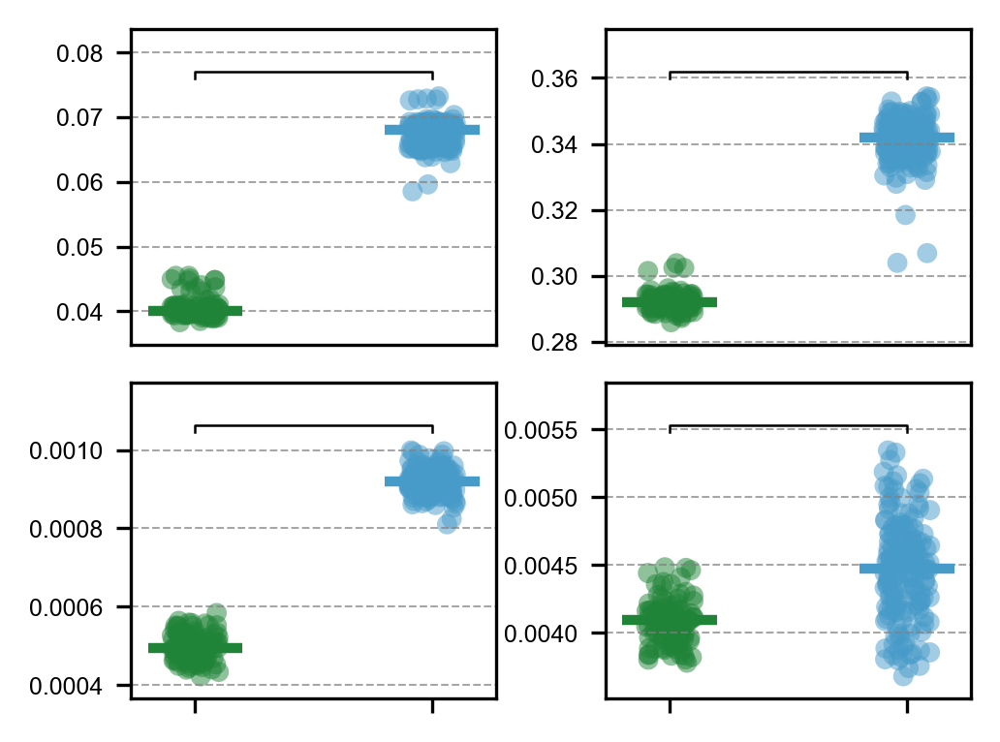

In [164]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# =========================
# Load Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

# =========================
# Figure (square)
# =========================
cm = 1 / 2.54
fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(9.53*cm, 7.51*cm),   # <-- square figure
    dpi=300,
    sharex=True,
    sharey=False
)

# =========================
# Colors
# =========================
palette = {"mainland": "#208438", "island": "#479BC9"}

order = ["mainland", "island"]
metrics = ["deleterious", "lof"]
zyg = ["hom", "het"]

# =========================
# Loop over panels
# =========================
for i, metric in enumerate(metrics):
    for j, z in enumerate(zyg):

        ax = axes[i, j]

        sub = df_ratio_plot[
            (df_ratio_plot["metric_type"] == metric) &
            (df_ratio_plot["zygosity"] == z)
        ]

        # Grid
        ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)

        # Stripplot
        sns.stripplot(
            data=sub,
            x="population_type",
            y="ratio",
            hue="population_type",
            palette=palette,
            order=order,
            jitter=True,
            size=5,
            alpha=0.5,
            dodge=False,
            zorder=1,
            ax=ax
        )

        # Remove legend
        if ax.get_legend():
            ax.get_legend().remove()

        # =========================
        # Median lines
        # =========================
        stats = sub.groupby("population_type")["ratio"].median().reindex(order)

        for k, pop in enumerate(stats.index):
            median = stats.loc[pop]

            ax.hlines(
                y=median,
                xmin=k-0.2,
                xmax=k+0.2,
                color=palette[pop],
                linewidth=2.5,
                zorder=2
            )

        # =========================
        # Clean axes
        # =========================
        ax.set_ylabel("")
        ax.tick_params(axis='y', labelleft=True)
        ax.set_xlabel("")

        # =========================
        # X-axis control
        # =========================
        if i == 0:
            ax.set_xticks(range(len(order)))   # keep structure
            ax.set_xticklabels([])             # no labels
            ax.tick_params(axis='x', length=0) # no tick marks
        else:
            # BOTTOM ROW → keep structure but no labels
            ax.set_xticks(range(len(order)))
            ax.set_xticklabels([""] * len(order))

        # =========================
        # Add headroom
        y_max = sub["ratio"].max()
        y_min = sub["ratio"].min()
        
        # total range
        yrange = y_max - y_min
        
        # add padding to BOTH sides
        padding_top = yrange * 0.30
        padding_bottom = yrange * 0.10  # slightly less bottom padding looks nicer
        
        ax.set_ylim(y_min - padding_bottom, y_max + padding_top)
        ## =========================
        # Statistical annotation (per panel)
        # =========================
        x1, x2 = 0, 1
        
        y_max = sub["ratio"].max()
        y_min = sub["ratio"].min()
        yrange = y_max - y_min
        
        # position line ABOVE data
        y = y_max + yrange * 0.08
        h = yrange * 0.03
        
        ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y],
                lw=0.6, c='black', zorder=3)
        
        # optional: add text (e.g. "*", "ns", p-value)
        ax.text(
            (x1 + x2) * 0.5,
            y + h + yrange * 0.02,
            "",
            ha='center',
            va='bottom',
            fontsize=6,
            fontproperties=arial_font
        )

# =========================
# Bottom labels
# =========================
for ax in axes[-1, :]:
    ax.set_xlabel("")

# =========================
# Layout tuning
# =========================
plt.subplots_adjust(
    left=0.18,
    right=0.95,
    top=0.90,
    bottom=0.12,
    wspace=0.30,
    hspace=0.12
)

# =========================
# Save
# =========================
plt.savefig("Figure_ratio_4panels.svg", format="svg", dpi=300)
plt.show()

### 14.2. NS and SFS

In [179]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")
sns.set_context("talk")

ns = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genetic_load/AF_outputs/NS_dataset_all.tsv", sep="\t")
sfs = pd.read_csv("../results/population_analyses/rPodSic1.hap1.1/genetic_load/AF_outputs/SFS_dataset_all.tsv", sep="\t")

print(ns.head())
print(sfs.head())

pop_order = ["PL","TR","SP","TM","RG","VS","MP","SC","BJ","KP","PK","PM","PJ","Island","Mainland", "Island_fieldwork","Mainland_fieldwork"]

ns["group"] = pd.Categorical(ns["group"], categories=pop_order, ordered=True)
sfs["group"] = pd.Categorical(sfs["group"], categories=pop_order, ordered=True)

    group     bin    SYN    DEL  LOF      N       N_S
0  Island    0-5%  88738  51544  796  52340  0.589826
1  Island   5-10%   9228   4567   55   4622  0.500867
2  Island  10-20%  13180   5824   49   5873  0.445599
3  Island  20-80%  57103  18552  178  18730  0.328004
4  Island    >80%  57809  11827  109  11936  0.206473
    group      bin category   count      prop
0  Island    0-20%      SYN  111146  0.491670
1  Island  80-100%      SYN   57809  0.255726
2  Island  80-100%      DEL   11827  0.128117
3  Island    0-20%      DEL   61935  0.670917
4  Island   20-40%      SYN   21522  0.095206


In [180]:
sfs.head()

,group,bin,category,count,prop
0,Island,0-20%,SYN,111146,0.491670
1,Island,80-100%,SYN,57809,0.255726
2,Island,80-100%,DEL,11827,0.128117
3,Island,0-20%,DEL,61935,0.670917
4,Island,20-40%,SYN,21522,0.095206


/tmp/ipykernel_1741598/1947192006.py:91: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/tmp/ipykernel_1741598/1947192006.py:91: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/tmp/ipykernel_1741598/1947192006.py:113: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/tmp/ipykernel_1741598/1947192006.py:113: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


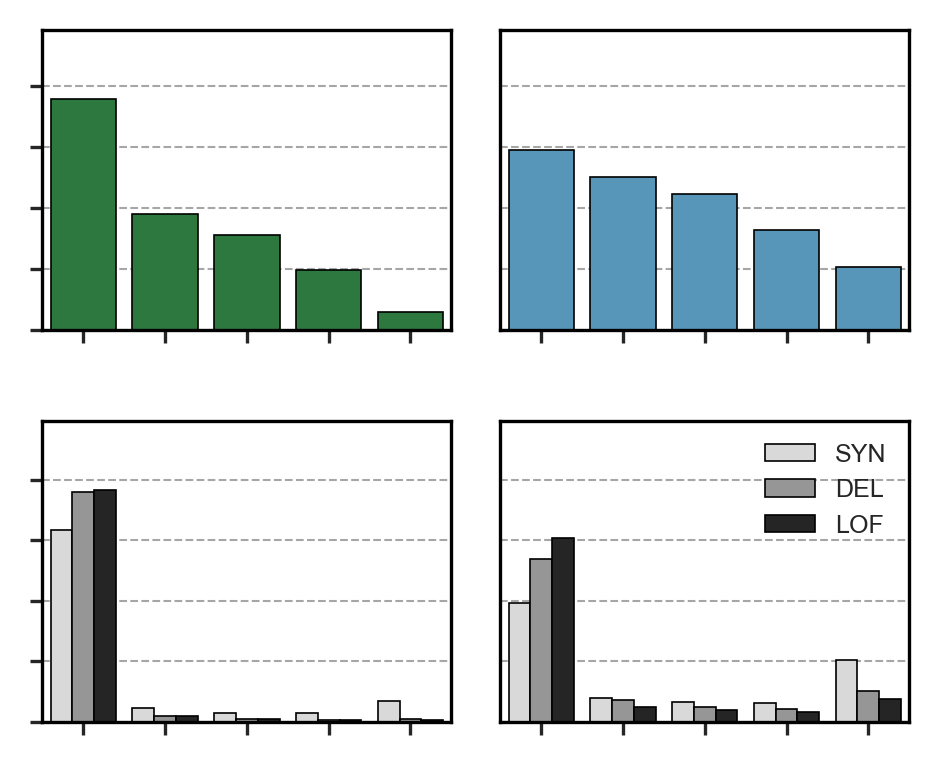

In [205]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np
import pandas as pd

# =========================
# Load Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

sns.set_style("whitegrid")

# =========================
# Data prep
# =========================
bin_order_ns = ["0-5%", "5-10%", "10-20%", "20-80%", ">80%"]
bin_order_sfs = ["0-20%", "20-40%", "40-60%", "60-80%", "80-100%"]

ns_subset = ns.query("group in ['Mainland', 'Island']").copy()
sfs_subset = sfs.query("group in ['Mainland', 'Island']").copy()

groups = ["Mainland", "Island"]

colors = {"Mainland": "#208438", "Island": "#479BC9"}

gray_palette = {
    "SYN": "#d9d9d9",
    "DEL": "#969696",
    "LOF": "#252525"
}

# =========================
# Y limits
# =========================
def get_max(vals):
    vals = vals[~np.isnan(vals)]
    return np.max(vals) * 1.3

ns_ymax = get_max(ns_subset["N_S"].values)
sfs_ymax = get_max(sfs_subset["prop"].values)

# =========================
# Figure
# =========================
cm = 1 / 2.54
fig, axes = plt.subplots(
    2, 2,
    figsize=(9.53*cm, 7.51*cm),
    dpi=300,
    sharex=False,
    sharey='row'
)

# =========================
# Loop panels
# =========================
for i, row in enumerate(["NS", "SFS"]):
    for j, group in enumerate(groups):

        ax = axes[i, j]

        # Grid
        ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
        ax.set_axisbelow(True)

        # Spines
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color("black")
            spine.set_linewidth(0.8)

        # -----------------------
        # NS
        # -----------------------
        if row == "NS":

            data = ns_subset[ns_subset["group"] == group]

            sns.barplot(
                data=data,
                x="bin",
                y="N_S",
                order=bin_order_ns,
                color=colors[group],
                edgecolor="black",
                linewidth=0.4,
                ci=None,
                ax=ax
            )

            ax.set_xlim(-0.5, len(bin_order_ns)-0.5)
            ax.set_ylim(0, ns_ymax)

        # -----------------------
        # SFS
        # -----------------------
        else:

            data = sfs_subset[sfs_subset["group"] == group]

            sns.barplot(
                data=data,
                x="bin",
                y="prop",
                hue="category",
                order=bin_order_sfs,
                hue_order=["SYN", "DEL", "LOF"],
                palette=gray_palette,
                edgecolor="black",
                linewidth=0.4,
                ci=None,
                ax=ax
            )

            ax.set_xlim(-0.5, len(bin_order_sfs)-0.5)
            ax.set_ylim(0, sfs_ymax)

            if j != 1:
                ax.get_legend().remove()
            else:
                ax.legend(frameon=False, fontsize=6)

        # =========================
        # X-axis → ALWAYS ON
        # =========================
        ax.tick_params(axis='x', bottom=True, labelbottom=False, length=3, width=0.8)

        # =========================
        # Y-axis → ONLY LEFT COLUMN
        # =========================
        if j == 0:
            ax.tick_params(axis='y', left=True, labelleft=False, length=3, width=0.8)
        else:
            ax.tick_params(axis='y', left=False, labelleft=False)

        # Clean labels
        ax.set_ylabel("")
        ax.set_xlabel("")

        # # Titles
        # if i == 0:
        #     ax.set_title(group, fontsize=8)

# =========================
# Layout
# =========================
plt.subplots_adjust(
    left=0.18,
    right=0.95,
    top=0.90,
    bottom=0.12,
    wspace=0.12,
    hspace=0.30
)

# =========================
# Save
# =========================
plt.savefig("Figure_NS_SFS_final.svg", format="svg", dpi=300)
plt.show()

### 14.3. In ROHs vs. outside ROHs

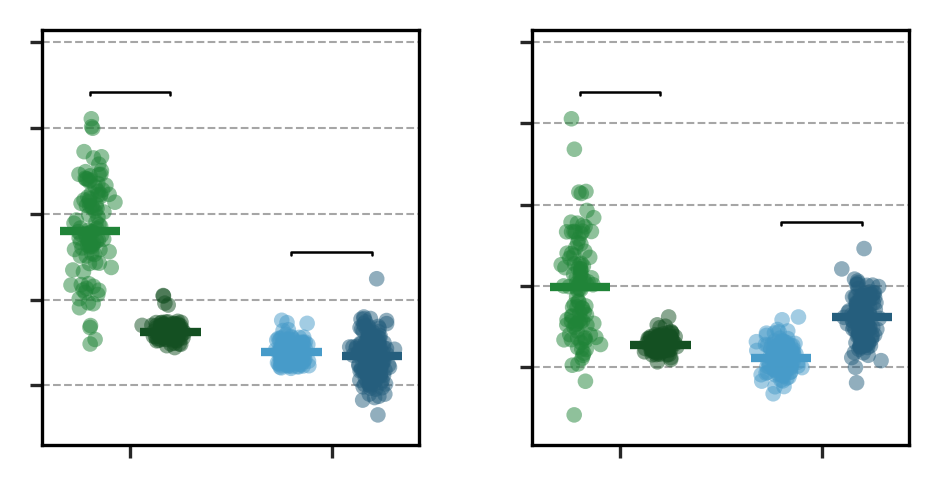

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# =========================
# Load Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

sns.set_style("whitegrid")

# =========================
# Load data
# =========================
df = pd.read_csv(
    "../results/population_analyses/rPodSic1.hap1.1/genetic_load/rohs/roh_load_summary.tsv",
    sep="\t"
)

# =========================
# Compute load ratios
# =========================
df["del_total"] = df["total_del"] / df["total_syn"]
df["lof_total"] = df["total_lof"] / df["total_syn"]

# =========================
# Reshape
# =========================
df_plot = pd.melt(
    df,
    id_vars=["sample", "region", "location"],
    value_vars=["del_total", "lof_total"],
    var_name="metric",
    value_name="ratio"
)

df_plot["metric"] = df_plot["metric"].map({
    "del_total": "DEL/SYN",
    "lof_total": "LOF/SYN"
})

# =========================
# Colors
# =========================
palette = {
    ("mainland", "in_roh"): "#208438",
    ("mainland", "out_roh"): "#145022",
    ("island", "in_roh"): "#479BC9",
    ("island", "out_roh"): "#255E7D"
}

order = ["mainland", "island"]
locations = ["in_roh", "out_roh"]

# =========================
# Figure
# =========================
cm = 1 / 2.54
fig, axes = plt.subplots(
    1, 2,
    figsize=(9.53 * cm, 4.5 * cm),
    dpi=300,
    sharex=True
)

metrics = ["DEL/SYN", "LOF/SYN"]

# =========================
# Plot
# =========================
for i, metric in enumerate(metrics):

    ax = axes[i]
    sub = df_plot[df_plot["metric"] == metric]

    # Grid
    ax.grid(axis='y', linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    ax.grid(axis='x', linestyle="--", linewidth=0.5, color="white", alpha=0.7)
    ax.set_axisbelow(True)

    # Box
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color("black")
        spine.set_linewidth(0.8)

    # -------------------------
    # Scatter + medians
    # -------------------------
    for j, region in enumerate(order):
        for loc in locations:

            vals = sub[
                (sub["region"] == region) &
                (sub["location"] == loc)
            ]["ratio"]

            if len(vals) == 0:
                continue

            offset = -0.2 if loc == "in_roh" else 0.2
            x = j + offset

            color = palette[(region, loc)]
            jitter = np.random.normal(0, 0.04, size=len(vals))

            ax.scatter(
                np.full(len(vals), x) + jitter,
                vals,
                s=14,
                alpha=0.5,
                color=color,
                edgecolors='none',
                linewidths=0
            )

            # median
            median = np.median(vals)
            ax.hlines(
                y=median,
                xmin=x - 0.15,
                xmax=x + 0.15,
                color=color,
                linewidth=2
            )

    # -------------------------
    # GLOBAL scaling for brackets
    # -------------------------
    all_vals = sub["ratio"]
    y_max_global = all_vals.max()
    y_min_global = all_vals.min()
    yrange_global = y_max_global - y_min_global

    # -------------------------
    # Statistical brackets (PROPER POSITIONING)
    # -------------------------
    for j, region in enumerate(order):
    
        x1 = j - 0.2
        x2 = j + 0.2
    
        vals1 = sub[(sub["region"] == region) & (sub["location"] == "in_roh")]["ratio"]
        vals2 = sub[(sub["region"] == region) & (sub["location"] == "out_roh")]["ratio"]
    
        if len(vals1) == 0 or len(vals2) == 0:
            continue
    
        # 🔥 KEY CHANGE: region-specific max
        local_vals = pd.concat([vals1, vals2])
        y_max_local = local_vals.max()
    
        # GLOBAL for scaling only
        h = yrange_global * 0.01
    
        if region == "mainland":
            # keep high (global)
            y = y_max_global + yrange_global * 0.08
        else:
            # 🔥 anchor to island data → MUCH lower
            y = y_max_local + yrange_global * 0.08
    
        ax.plot(
            [x1, x1, x2, x2],
            [y, y + h, y + h, y],
            lw=0.6,
            c='black',
            zorder=3
        )
    
        ax.text(
            (x1 + x2) / 2,
            y + h + yrange_global * 0.015,
            "",
            ha='center',
            va='bottom',
            fontsize=6,
            fontproperties=arial_font
        )
    # -------------------------
    # Fix y-limits (avoid clipping)
    # -------------------------
    ax.set_ylim(
        y_min_global - yrange_global * 0.1,
        y_max_global + yrange_global * 0.3
    )

    # -------------------------
    # Remove ALL text
    # -------------------------
    ax.set_xticks(range(len(order)))
    ax.set_xticklabels([])

    ax.set_yticklabels([])

    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")

    ax.tick_params(axis='x', bottom=True, labelbottom=False, length=3, width=0.8)
    ax.tick_params(axis='y', left=True, labelleft=False, length=3, width=0.8)

# =========================
# Layout
# =========================
plt.subplots_adjust(
    left=0.18,
    right=0.95,
    top=0.90,
    bottom=0.12,
    wspace=0.30,
)

# =========================
# Save
# =========================
plt.savefig("Figure_total_load_ROH_clean.svg", format="svg", dpi=300)
plt.show()

### 14.4. ~Froh

In [246]:
# Load your Excel file
df_long = pd.read_excel("df_long.xlsx")

# Optional: check it loaded correctly
df_long.head()

,Froh_centered,Region,variant_type,log_hom
0,0.180651,island,log_hom_del,10.233151
1,0.180651,island,log_hom_lof,5.934894
2,0.166091,island,log_hom_del,10.226440
3,0.166091,island,log_hom_lof,5.926926
4,0.166997,island,log_hom_del,10.224846


In [264]:
# Load your Excel file
df_long_hom = pd.read_excel("df_long_hom.xlsx")

# Optional: check it loaded correctly
df_long_hom.head()

,Froh_centered,Region,variant_type,hom
0,0.180651,island,hom_del,27810
1,0.180651,island,hom_lof,378
2,0.166091,island,hom_del,27624
3,0.166091,island,hom_lof,375
4,0.166997,island,hom_del,27580


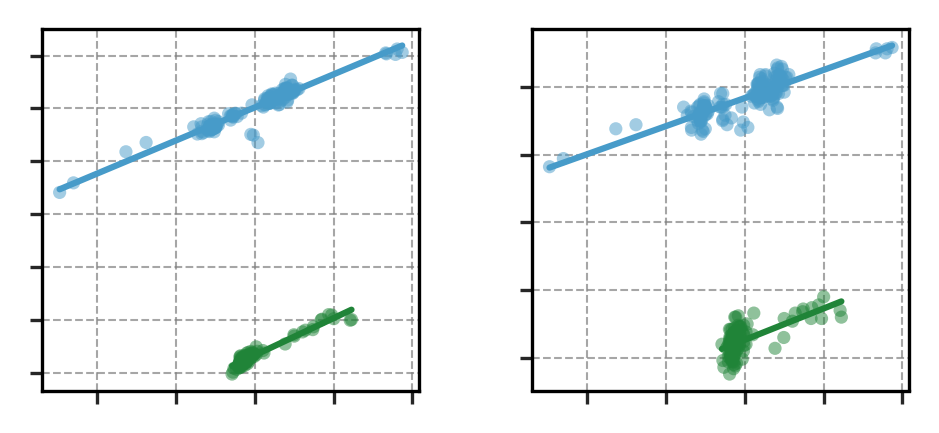

In [269]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import numpy as np

# =========================
# USER-DEFINED FIGURE SIZE
# =========================
width_cm = 9.53   # <-- change this
height_cm = 4.5   # <-- change this

# =========================
# Load Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

sns.set_style("white")

# =========================
# Figure layout (2 panels)
# =========================
cm = 1 / 2.54
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(width_cm*cm, height_cm*cm),
    dpi=300,
    sharex=True,
    sharey=False
)

# =========================
# Colors
# =========================
palette = {
    "mainland": "#208438",
    "island": "#479BC9"
}

regions = ["mainland", "island"]

# enforce order if needed
variants = ["hom_del", "hom_lof"]   # <-- safer than .unique()

# =========================
# Loop panels
# =========================
for i, variant in enumerate(variants):

    ax = axes[i]

    sub = df_long_hom[df_long_hom["variant_type"] == variant]

    # Grid
    ax.grid(True, linestyle="--", linewidth=0.5, color="grey", alpha=0.7)
    ax.grid(axis="y", visible=True)

    # Plot both regions
    for region in regions:
        d = sub[sub["Region"] == region]

        # Scatter
        ax.scatter(
            d["Froh_centered"],
            d["hom"],
            s=10,
            alpha=0.5,
            color=palette[region],
            edgecolor="none",
            zorder=1
        )

        # Regression
        if len(d) > 1:
            x = d["Froh_centered"].values
            y = d["hom"].values

            coeffs = np.polyfit(x, y, 1)
            x_line = np.linspace(x.min(), x.max(), 100)
            y_line = np.polyval(coeffs, x_line)

            ax.plot(
                x_line,
                y_line,
                color=palette[region],
                linewidth=1.5,
                zorder=2
            )

    # Axes styling
    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.tick_params(axis='x', bottom=True, length=3, width=0.8, direction='out', pad=2)
    ax.tick_params(axis='y', left=True, length=3, width=0.8, direction='out', pad=2)

    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title("")

    # Full box
    for side in ["top", "right", "bottom", "left"]:
        ax.spines[side].set_visible(True)
        ax.spines[side].set_color("black")
        ax.spines[side].set_linewidth(0.8)

    # Panel title
    #ax.set_title(variant, fontsize=7)

# =========================
# Axis labels
# =========================
for ax in axes:
    ax.set_xlabel("")

axes[0].set_ylabel("")

# =========================
# Layout tuning
# =========================
plt.subplots_adjust(
    left=0.18,
    right=0.95,
    top=0.88,
    bottom=0.20,
    wspace=0.30
)

# =========================
# Save
# =========================
plt.savefig("Figure_regression_2panels.svg", format="svg", dpi=300)

plt.show()

In [32]:
import pandas as pd
import numpy as np
import glob
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import re

In [33]:
files = sorted(glob.glob("../results/population_analyses/rPodSic1.hap1.1//genetic_diversity/bcftools_roh/ind_roh_windows/all_samples_windows_rohs/roh_windows_*.tsv"))

dfs = []

for f in files:
    df_rohs_cor = pd.read_csv(f, sep="\t")
    
    chrom = f.split("roh_windows_")[1].split("_")[0]
    df_rohs_cor["chrom"] = chrom
    
    dfs.append(df_rohs_cor)

df_rohs_cor = pd.concat(dfs, ignore_index=True)

print(df_rohs_cor.shape)
df_rohs_cor.head()

(87023, 265)


,WINDOW_ID,VS12,VS11,RG21,RG32,FV44,FV46,CV61,CV68,TM84,...,SP33,TR01,TR04,TR07,TR08,TR09,24TM05,24TM14,24VS26,chrom
0,OZ076838.1:33015-132508,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,1,0,0,OZ076838.1
1,OZ076838.1:132515-159082,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,OZ076838.1
2,OZ076838.1:159097-189438,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,OZ076838.1
3,OZ076838.1:189457-220838,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,OZ076838.1
4,OZ076838.1:220852-254607,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,OZ076838.1


In [34]:
# exclude WINDOW_ID and chrom
sample_cols = df_rohs_cor.columns[1:-1]

len(sample_cols)  # should be 263

def get_population(sample):
    pop = ''.join(re.findall(r'[A-Z]+', sample))
    pop = re.sub(r'^24', '', pop)
    if pop in ["CV", "FV"]:
        pop = "RG"
    return pop

def assign_region(pop):
    if pop in ["PL", "TR", "SP", "TM", "RG", "VS"]:
        return "Mainland"
    elif pop in ["MP", "SC", "BJ", "KP", "PK", "PM", "PJ"]:
        return "Island"
    else:
        return "Unknown"

sample_info = pd.DataFrame({"sample": sample_cols})
sample_info["Population"] = sample_info["sample"].apply(get_population)
sample_info["Region"] = sample_info["Population"].apply(assign_region)

sample_info.head()

,sample,Population,Region
0,VS12,VS,Mainland
1,VS11,VS,Mainland
2,RG21,RG,Mainland
3,RG32,RG,Mainland
4,FV44,RG,Mainland


In [35]:
# Create a copy
df_freq = df_rohs_cor.copy()

# Loop over populations
for pop in sample_info["Population"].unique():
    inds = sample_info.loc[sample_info["Population"] == pop, "sample"]
    df_freq[pop] = df_rohs_cor[inds].mean(axis=1)

# Keep only relevant columns
pop_cols = sample_info["Population"].unique().tolist()
df_freq = df_freq[["WINDOW_ID", "chrom"] + pop_cols]

df_freq.head()

,WINDOW_ID,chrom,VS,RG,TM,PM,PK,KP,SC,PJ,MP,BJ,PL,SP,TR
0,OZ076838.1:33015-132508,OZ076838.1,0.131579,0.2500,0.175,0.391304,0.456522,0.538462,0.232558,0.333333,0.666667,0.6,0.666667,1.0,0.2
1,OZ076838.1:132515-159082,OZ076838.1,0.052632,0.0625,0.150,0.500000,0.456522,0.615385,0.255814,0.333333,0.666667,0.6,0.333333,0.0,0.0
2,OZ076838.1:159097-189438,OZ076838.1,0.026316,0.0625,0.100,0.521739,0.565217,0.538462,0.465116,0.333333,0.666667,1.0,0.333333,0.0,0.0
3,OZ076838.1:189457-220838,OZ076838.1,0.000000,0.0625,0.075,0.608696,0.586957,0.538462,0.395349,0.333333,1.000000,1.0,0.333333,0.0,0.0
4,OZ076838.1:220852-254607,OZ076838.1,0.078947,0.1250,0.075,0.413043,0.413043,0.538462,0.348837,0.333333,1.000000,0.6,0.333333,0.0,0.0


In [15]:
corr_pop = df_freq[pop_cols].corr()
corr_pop

,VS,RG,TM,PM,PK,KP,SC,PJ,MP,BJ,PL,SP,TR
VS,1.000000,0.408749,0.597327,-0.004209,0.003159,0.010119,0.007853,-0.012657,-0.002906,-0.004800,0.088288,0.064916,0.089039
RG,0.408749,1.000000,0.370771,-0.006873,0.003015,-0.000944,-0.004658,-0.016290,-0.008918,0.034019,0.077252,0.033873,0.030163
TM,0.597327,0.370771,1.000000,-0.013379,-0.011672,-0.003089,-0.005282,-0.001422,-0.010358,-0.031384,0.087555,0.059944,0.076879
PM,-0.004209,-0.006873,-0.013379,1.000000,0.849962,0.661801,0.658590,0.145678,0.270698,0.297315,0.015563,-0.006665,-0.014152
PK,0.003159,0.003015,-0.011672,0.849962,1.000000,0.718163,0.715308,0.154026,0.292946,0.320272,0.011388,-0.012193,-0.011574
KP,0.010119,-0.000944,-0.003089,0.661801,0.718163,1.000000,0.752140,0.165727,0.314087,0.343051,0.011675,-0.007162,-0.003145
SC,0.007853,-0.004658,-0.005282,0.658590,0.715308,0.752140,1.000000,0.194339,0.373877,0.340236,0.017750,-0.006281,-0.007924
PJ,-0.012657,-0.016290,-0.001422,0.145678,0.154026,0.165727,0.194339,1.000000,0.071415,0.075442,0.015567,-0.022888,0.000890
MP,-0.002906,-0.008918,-0.010358,0.270698,0.292946,0.314087,0.373877,0.071415,1.000000,0.150635,0.009219,-0.009755,0.000490
BJ,-0.004800,0.034019,-0.031384,0.297315,0.320272,0.343051,0.340236,0.075442,0.150635,1.000000,0.019650,0.007763,-0.015597


In [16]:
# Map population → region
pop_to_region = dict(zip(sample_info["Population"], sample_info["Region"]))

# Compute region-level ROH frequency
for region in ["Mainland", "Island"]:
    pops = [p for p in pop_cols if pop_to_region[p] == region]
    df_freq[region] = df_freq[pops].mean(axis=1)

df_freq[["Mainland", "Island"]].head()

,Mainland,Island
0,0.403874,0.459835
1,0.099744,0.489674
2,0.087025,0.584362
3,0.078472,0.637542
4,0.102047,0.520960


In [17]:
corr_mainland_island = df_freq["Mainland"].corr(df_freq["Island"])
print("Mainland vs Island ROH correlation:", corr_mainland_island)

Mainland vs Island ROH correlation: -0.004760495805893968


In [18]:
import itertools

results = []

for pop1, pop2 in itertools.combinations(pop_cols, 2):
    
    r = df_freq[pop1].corr(df_freq[pop2])
    
    region1 = pop_to_region[pop1]
    region2 = pop_to_region[pop2]
    
    if region1 == region2:
        comparison = f"{region1}-{region1}"
    else:
        comparison = "Mainland-Island"
    
    results.append({
        "pop1": pop1,
        "pop2": pop2,
        "correlation": r,
        "comparison": comparison
    })

df_corr = pd.DataFrame(results)
df_corr.head()

,pop1,pop2,correlation,comparison
0,VS,RG,0.408749,Mainland-Mainland
1,VS,TM,0.597327,Mainland-Mainland
2,VS,PM,-0.004209,Mainland-Island
3,VS,PK,0.003159,Mainland-Island
4,VS,KP,0.010119,Mainland-Island


In [19]:
df_corr

,pop1,pop2,correlation,comparison
0,VS,RG,0.408749,Mainland-Mainland
1,VS,TM,0.597327,Mainland-Mainland
2,VS,PM,-0.004209,Mainland-Island
3,VS,PK,0.003159,Mainland-Island
4,VS,KP,0.010119,Mainland-Island
...,...,...,...,...
73,BJ,SP,0.007763,Mainland-Island
74,BJ,TR,-0.015597,Mainland-Island
75,PL,SP,0.035419,Mainland-Mainland
76,PL,TR,0.021336,Mainland-Mainland


In [26]:
summary = df_corr.groupby("comparison")["correlation"].agg(
    mean="mean",
    sd="std",
    min="min",
    max="max",
    n="count"
)

summary

,mean,sd,min,max,n
comparison,,,,,
Island-Island,0.374558,0.245636,0.071415,0.849962,21
Mainland-Island,-0.002097,0.012472,-0.031384,0.034019,42
Mainland-Mainland,0.137611,0.174161,0.021336,0.597327,15


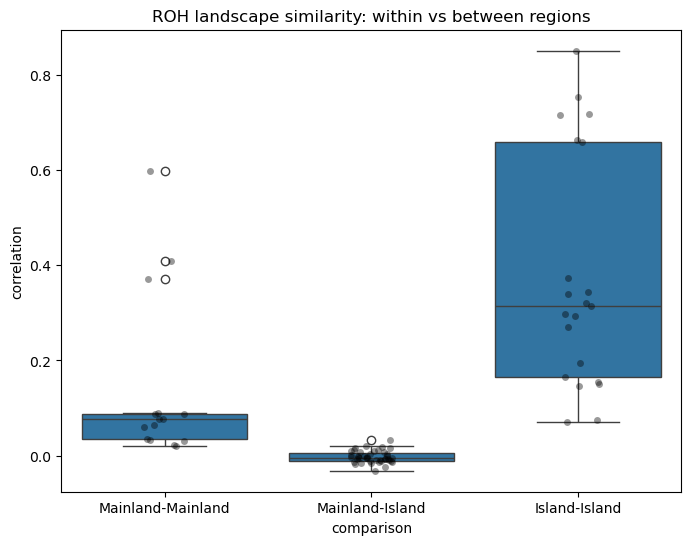

In [20]:
import seaborn as sns

plt.figure(figsize=(8,6))
sns.boxplot(data=df_corr, x="comparison", y="correlation")
sns.stripplot(data=df_corr, x="comparison", y="correlation", color="black", alpha=0.4)

plt.title("ROH landscape similarity: within vs between regions")
plt.show()

In [24]:
island_inds = sample_info.loc[sample_info["Region"] == "Island", "sample"]
# Sum across island individuals
roh_counts = df_rohs_cor[island_inds].sum(axis=1)

# Number of island individuals
n_island = len(island_inds)

# Windows where ALL individuals are in ROH
always_roh = roh_counts == n_island
fraction = always_roh.mean()
percentage = fraction * 100

print(f"{percentage:.2f}% of the genome is in ROH in all island individuals")

1.71% of the genome is in ROH in all island individuals


In [25]:
always_roh.sum()

1484

In [37]:
mainland_samples = sample_info[sample_info["Region"] == "Mainland"]["sample"].tolist()
island_samples   = sample_info[sample_info["Region"] == "Island"]["sample"].tolist()

print(len(mainland_samples), len(island_samples))

104 159


In [38]:
# convert to numeric just in case
df_rohs_cor[sample_cols] = df_rohs_cor[sample_cols].apply(pd.to_numeric, errors='coerce')

# compute frequencies
df_rohs_cor["roh_all"] = (df_rohs_cor[sample_cols] > 0).mean(axis=1)
df_rohs_cor["roh_mainland"] = (df_rohs_cor[mainland_samples] > 0).mean(axis=1)
df_rohs_cor["roh_island"] = (df_rohs_cor[island_samples] > 0).mean(axis=1)

/tmp/ipykernel_2736943/96497591.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rohs_cor["roh_all"] = (df_rohs_cor[sample_cols] > 0).mean(axis=1)
/tmp/ipykernel_2736943/96497591.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rohs_cor["roh_mainland"] = (df_rohs_cor[mainland_samples] > 0).mean(axis=1)
/tmp/ipykernel_2736943/96497591.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at o

In [39]:
coords = df_rohs_cor["WINDOW_ID"].str.extract(r":(\d+)-(\d+)")

df_rohs_cor["start"] = coords[0].astype(int)
df_rohs_cor["end"] = coords[1].astype(int)
df_rohs_cor["mid"] = (df_rohs_cor["start"] + df_rohs_cor["end"]) / 2 / 1e6

/tmp/ipykernel_2736943/631114813.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rohs_cor["start"] = coords[0].astype(int)
/tmp/ipykernel_2736943/631114813.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rohs_cor["end"] = coords[1].astype(int)
/tmp/ipykernel_2736943/631114813.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

In [40]:
def plot_roh_correct(df, value_col, title):

    chroms = sorted(df["chrom"].unique())
    
    fig, ax = plt.subplots(figsize=(12, 8))

    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=100)

    for i, chrom in enumerate(chroms):
        sub = df[df["chrom"] == chrom].sort_values("start")
        
        x = np.concatenate([sub["start"].values / 1e6,
                            [sub["end"].values[-1] / 1e6]])
        
        y = np.array([i - 0.4, i + 0.4])
        
        z = (sub[value_col].values * 100)[np.newaxis, :]

        ax.pcolormesh(
            x,
            y,
            z,
            cmap=cmap,
            norm=norm,
            shading='auto'
        )

    # axes
    ax.set_yticks(range(len(chroms)))
    ax.set_yticklabels(range(1, len(chroms)+1))

    ax.set_xlabel("Position in Mb", fontsize=12)
    ax.set_ylabel("Chromosome", fontsize=12)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    ax.grid(False)

    # colorbar
    cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, pad=0.02)
    cbar.set_label("% of individuals with ROH")

    # density inset
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    axins = inset_axes(ax, width="35%", height="30%", loc="upper right", borderpad=2)

    sns.kdeplot(df[value_col] * 100, fill=True, ax=axins, color="black")

    axins.set_xlabel("% with ROH", fontsize=8)
    axins.set_ylabel("Density", fontsize=8)
    axins.tick_params(axis='both', labelsize=8)

    for spine in ["top", "right"]:
        axins.spines[spine].set_visible(False)

    plt.title(title)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_2736943/3986279874.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findf

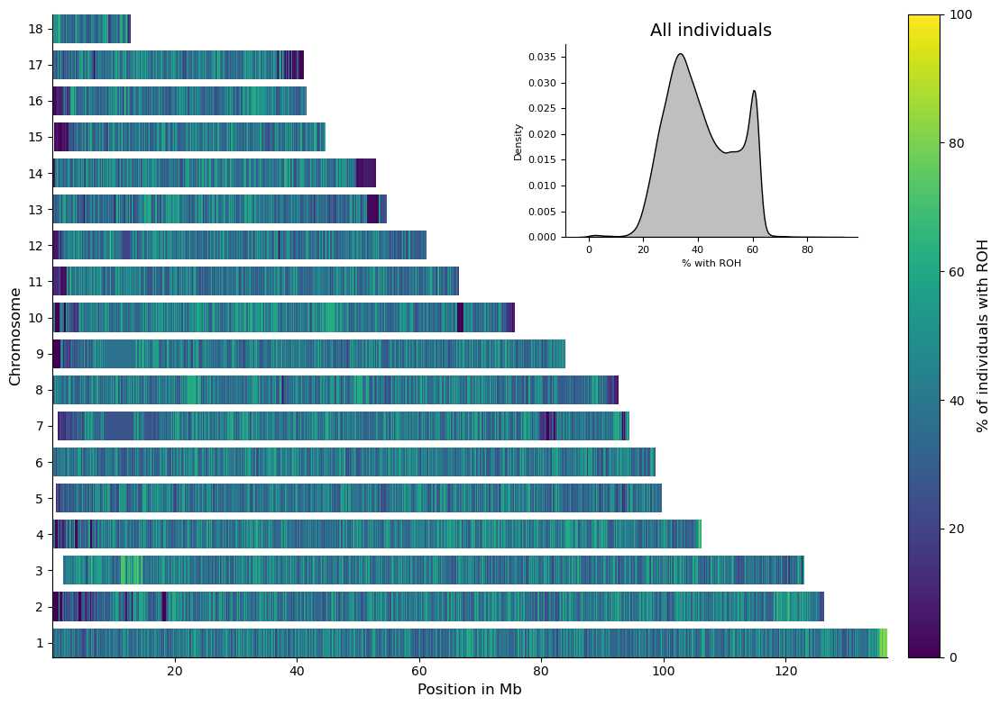

In [41]:
plot_roh_correct(df_rohs_cor, "roh_all", "All individuals")


KeyError: 'start'

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

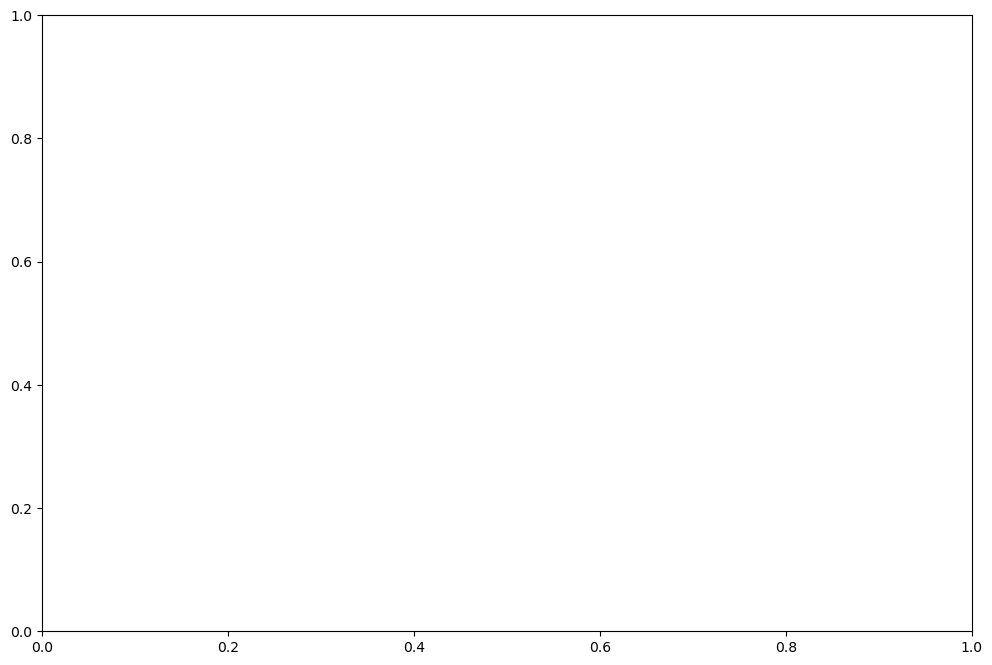

In [36]:
plot_roh_correct(df_rohs_cor, "roh_mainland", "Mainland only")

/tmp/ipykernel_2736943/3986279874.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


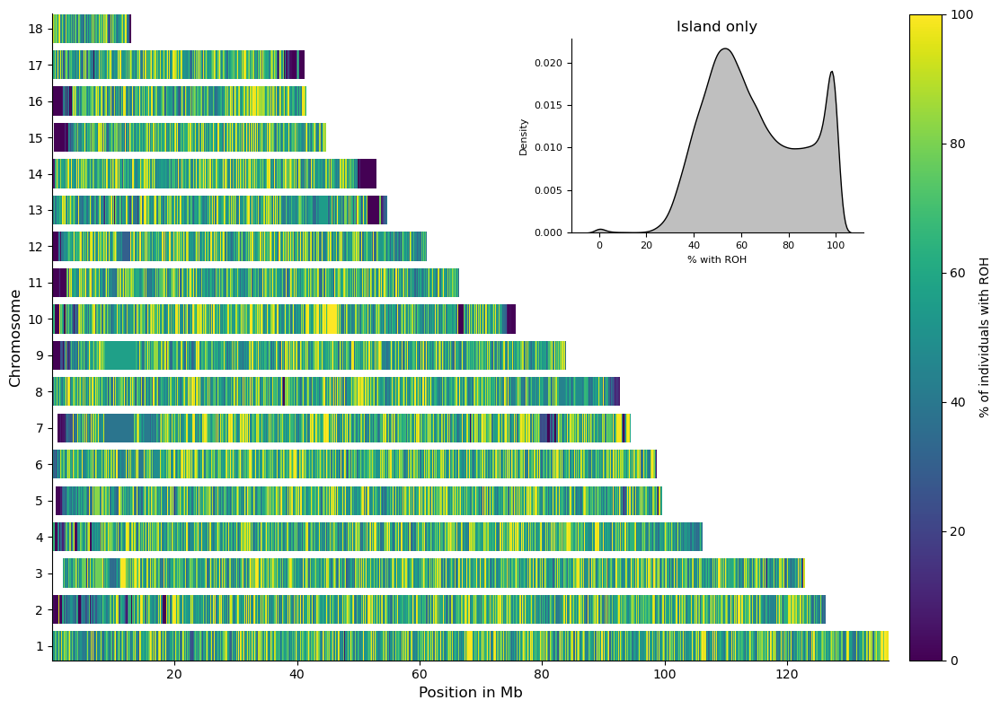

In [11]:
plot_roh_correct(df_rohs_cor, "roh_island", "Island only")

In [29]:
import re

# Extract start and end positions
df_rohs_cor[["start", "end"]] = df_rohs_cor["WINDOW_ID"].str.extract(r":(\d+)-(\d+)").astype(int)

In [46]:
df_rohs_cor

,WINDOW_ID,VS12,VS11,RG21,RG32,FV44,FV46,CV61,CV68,TM84,...,24TM05,24TM14,24VS26,chrom,roh_all,roh_mainland,roh_island,start,end,mid
0,OZ076838.1:33015-132508,1,0,0,0,0,0,0,0,1,...,1,0,0,OZ076838.1,0.315589,0.201923,0.389937,33015,132508,0.082762
1,OZ076838.1:132515-159082,0,1,0,0,0,0,0,0,0,...,1,0,0,OZ076838.1,0.300380,0.096154,0.433962,132515,159082,0.145798
2,OZ076838.1:159097-189438,0,1,0,0,0,0,0,0,0,...,1,0,0,OZ076838.1,0.349810,0.067308,0.534591,159097,189438,0.174267
3,OZ076838.1:189457-220838,0,0,0,0,0,0,0,0,0,...,0,0,0,OZ076838.1,0.353612,0.048077,0.553459,189457,220838,0.205148
4,OZ076838.1:220852-254607,0,0,0,0,0,0,0,0,0,...,0,0,0,OZ076838.1,0.288973,0.086538,0.421384,220852,254607,0.237730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87018,OZ076857.1:12411276-12498922,0,0,0,0,0,0,0,0,0,...,0,0,0,OZ076857.1,0.060837,0.134615,0.012579,12411276,12498922,12.455099
87019,OZ076857.1:12499009-12555535,0,0,1,0,0,0,0,0,0,...,0,0,0,OZ076857.1,0.342205,0.201923,0.433962,12499009,12555535,12.527272
87020,OZ076857.1:12555570-12635255,0,0,1,0,0,0,0,1,0,...,0,0,0,OZ076857.1,0.281369,0.230769,0.314465,12555570,12635255,12.595413
87021,OZ076857.1:12635312-12705686,0,0,1,0,0,0,0,0,0,...,0,0,0,OZ076857.1,0.098859,0.240385,0.006289,12635312,12705686,12.670499


In [42]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import seaborn as sns

def plot_roh_correct(df, value_col, title):

    # ---- Global style ----
    mpl.rcParams.update({
        "font.family": "Arial",
        "font.size": 12,
        "axes.titlesize": 14,
        "axes.labelsize": 12,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10
    })

    chroms = sorted(df["chrom"].unique())
    
    fig, ax = plt.subplots(figsize=(12, 8))

    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=100)

    # ---- ROH landscape ----
    for i, chrom in enumerate(chroms):
        sub = df[df["chrom"] == chrom].sort_values("start")
        
        x = np.concatenate([
            sub["start"].values / 1e6,
            [sub["end"].values[-1] / 1e6]
        ])
        
        y = np.array([i - 0.4, i + 0.4])
        
        z = (sub[value_col].values * 100)[np.newaxis, :]

        ax.pcolormesh(
            x,
            y,
            z,
            cmap=cmap,
            norm=norm,
            shading='auto'
        )

    # ---- Axes ----
    ax.set_yticks(range(len(chroms)))
    ax.set_yticklabels(range(1, len(chroms)+1))

    ax.set_xlabel("Position (Mb)")
    ax.set_ylabel("Chromosome")

    # clean spines
    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    ax.tick_params(direction="out", length=4, width=1)

    # ---- Colorbar ----
    cbar = plt.colorbar(
        mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
        ax=ax,
        pad=0.02,
        fraction=0.04
    )
    cbar.set_label("% individuals in ROH", rotation=90)
    cbar.ax.tick_params(labelsize=10)

    # ---- Density inset ----
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    axins = inset_axes(ax, width="32%", height="28%", loc="upper right", borderpad=2)

    sns.kdeplot(
        df[value_col] * 100,
        fill=True,
        ax=axins,
        color="black",
        linewidth=1
    )

    axins.set_xlabel("% ROH", fontsize=9)
    axins.set_ylabel("Density", fontsize=9)
    axins.tick_params(axis='both', labelsize=8)

    for spine in ["top", "right"]:
        axins.spines[spine].set_visible(False)

    # ---- Title ----
    ax.set_title(title, pad=10)

    plt.tight_layout()
    plt.show()

/tmp/ipykernel_2736943/3331930375.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findf

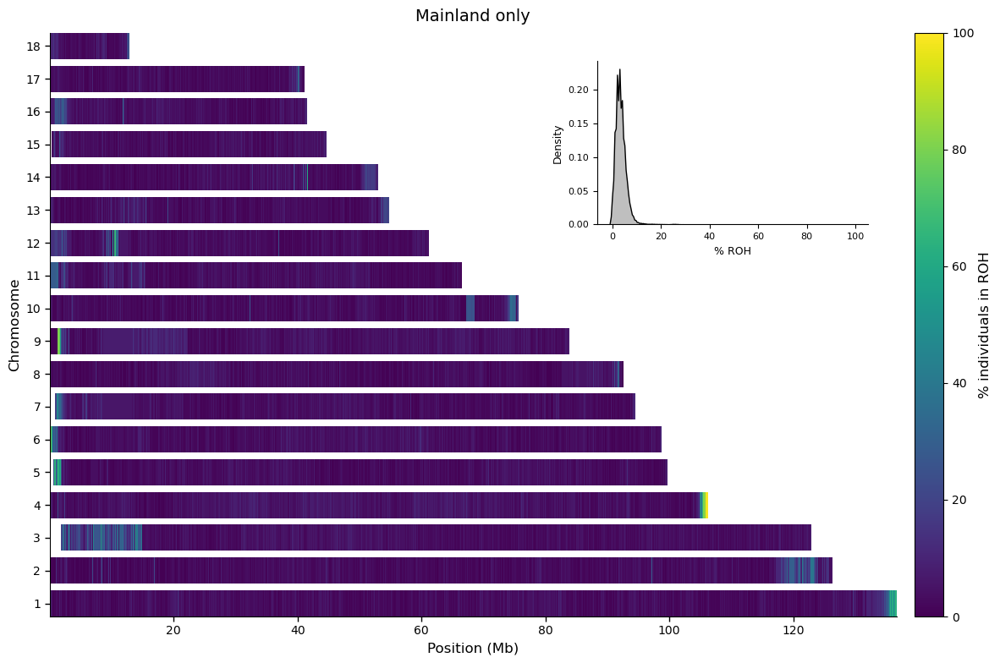

In [43]:
plot_roh_correct(df_rohs_cor, "roh_mainland", "Mainland only")

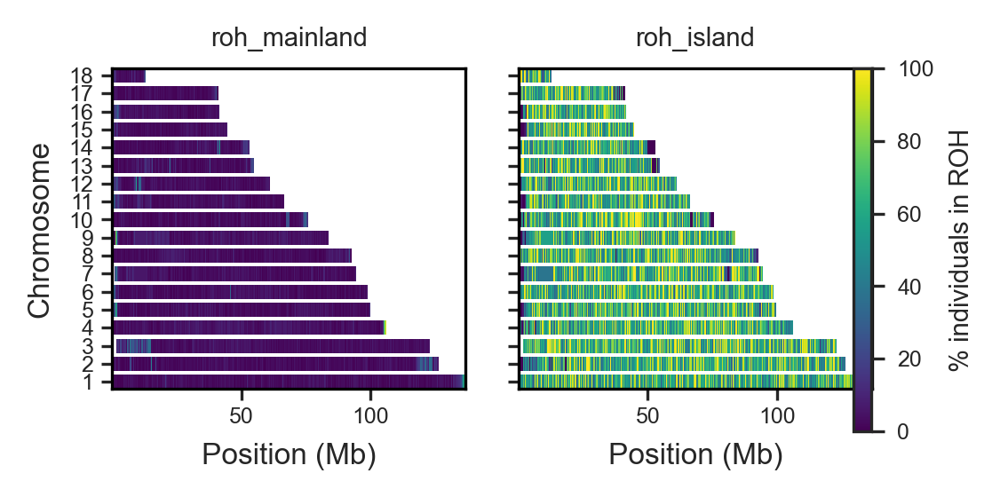

In [47]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import numpy as np
import matplotlib.font_manager as fm

# =========================
# USER-DEFINED FIGURE SIZE
# =========================
width_cm = 9.53
height_cm = 4.5

# =========================
# Load Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

sns.set_style("white")

# =========================
# Prepare coordinates
# =========================
df_rohs_cor[["start", "end"]] = df_rohs_cor["WINDOW_ID"].str.extract(r":(\d+)-(\d+)").astype(int)

# =========================
# Figure layout (2 panels)
# =========================
cm = 1 / 2.54
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(width_cm*cm, height_cm*cm),
    dpi=300,
    sharex=True,
    sharey=True
)

regions = ["roh_mainland", "roh_island"]

cmap = plt.cm.viridis
norm = mpl.colors.Normalize(vmin=0, vmax=100)

# =========================
# Plot panels
# =========================
for i, region in enumerate(regions):

    ax = axes[i]
    chroms = sorted(df_rohs_cor["chrom"].unique())

    for j, chrom in enumerate(chroms):

        sub = df_rohs_cor[df_rohs_cor["chrom"] == chrom].sort_values("start")

        x = np.concatenate([
            sub["start"].values / 1e6,
            [sub["end"].values[-1] / 1e6]
        ])

        y = np.array([j - 0.4, j + 0.4])

        z = (sub[region].values * 100)[np.newaxis, :]

        ax.pcolormesh(
            x,
            y,
            z,
            cmap=cmap,
            norm=norm,
            shading='auto'
        )

    # =========================
    # Axes styling (match your style)
    # =========================
    ax.set_yticks(range(len(chroms)))
    ax.set_yticklabels(range(1, len(chroms)+1))

    ax.tick_params(axis='x', bottom=True, length=3, width=0.8, direction='out', pad=2)
    ax.tick_params(axis='y', left=True, length=3, width=0.8, direction='out', pad=2)

    # Full box
    for side in ["top", "right", "bottom", "left"]:
        ax.spines[side].set_visible(True)
        ax.spines[side].set_color("black")
        ax.spines[side].set_linewidth(0.8)

    # Titles
    ax.set_title(region, fontsize=7)

# =========================
# Labels
# =========================
for ax in axes:
    ax.set_xlabel("Position (Mb)")

axes[0].set_ylabel("Chromosome")

# =========================
# Colorbar (shared)
# =========================
cbar = fig.colorbar(
    mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=axes,
    orientation='vertical',
    fraction=0.05,
    pad=0.02
)

cbar.set_label("% individuals in ROH", fontsize=7)
cbar.ax.tick_params(labelsize=6)

# =========================
# Layout tuning
# =========================
plt.subplots_adjust(
    left=0.12,
    right=0.88,
    top=0.88,
    bottom=0.20,
    wspace=0.15
)

# =========================
# Save
# =========================
plt.savefig("Figure_ROH_landscape_2panel.svg", format="svg", dpi=300)

plt.show()

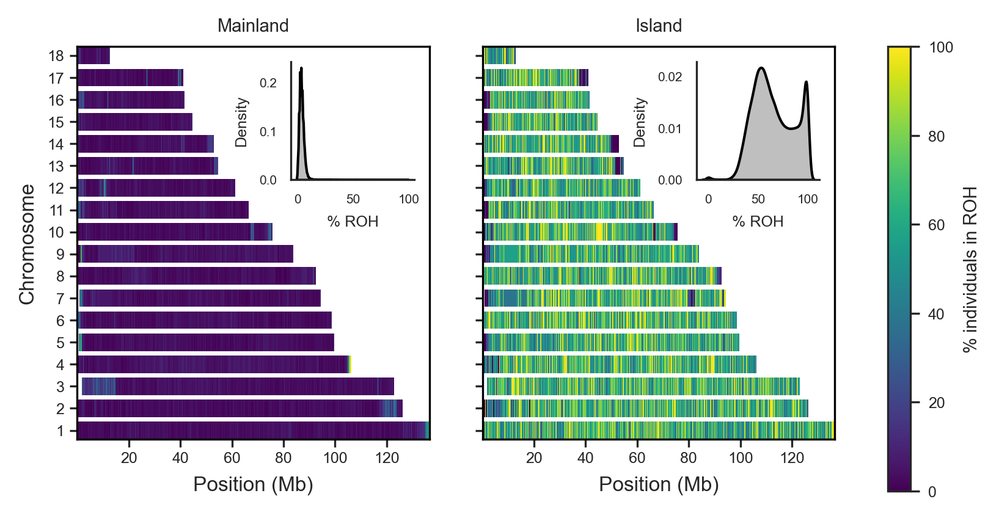

In [51]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import numpy as np
import matplotlib.font_manager as fm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# =========================
# USER-DEFINED FIGURE SIZE
# =========================
width_cm = 15
height_cm = 8

# =========================
# Load Arial
# =========================
arial_path = "/scratch/antwerpen/206/vsc20666/arial.ttf"
fm.fontManager.addfont(arial_path)
arial_font = fm.FontProperties(fname=arial_path)
arial_name = arial_font.get_name()

plt.rcParams['font.family'] = arial_name
plt.rcParams['font.sans-serif'] = [arial_name]

plt.rcParams['font.size'] = 6
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

sns.set_style("white")

# =========================
# Prepare coordinates
# =========================
df_rohs_cor[["start", "end"]] = df_rohs_cor["WINDOW_ID"].str.extract(r":(\d+)-(\d+)").astype(int)

# =========================
# Figure layout
# =========================
cm = 1 / 2.54
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(width_cm*cm, height_cm*cm),
    dpi=300,
    sharex=True,
    sharey=True
)

regions = ["roh_mainland", "roh_island"]

cmap = plt.cm.viridis
norm = mpl.colors.Normalize(vmin=0, vmax=100)

# =========================
# Plot panels
# =========================
for i, region in enumerate(regions):

    ax = axes[i]
    chroms = sorted(df_rohs_cor["chrom"].unique())

    for j, chrom in enumerate(chroms):

        sub = df_rohs_cor[df_rohs_cor["chrom"] == chrom].sort_values("start")

        x = np.concatenate([
            sub["start"].values / 1e6,
            [sub["end"].values[-1] / 1e6]
        ])

        y = np.array([j - 0.4, j + 0.4])
        z = (sub[region].values * 100)[np.newaxis, :]

        ax.pcolormesh(x, y, z, cmap=cmap, norm=norm, shading='auto')

    # ---- Axes styling ----
    ax.set_yticks(range(len(chroms)))
    ax.set_yticklabels(range(1, len(chroms)+1))

    ax.tick_params(axis='x', bottom=True, length=3, width=0.8, direction='out', pad=2)
    ax.tick_params(axis='y', left=True, length=3, width=0.8, direction='out', pad=2)

    for side in ["top", "right", "bottom", "left"]:
        ax.spines[side].set_visible(True)
        ax.spines[side].set_color("black")
        ax.spines[side].set_linewidth(0.8)

    ax.set_title(region.replace("roh_", "").capitalize(), fontsize=7)

    # =========================
    # Density inset (NEW)
    # =========================
    axins = inset_axes(ax, width="35%", height="30%", loc="upper right", borderpad=1)

    sns.kdeplot(
        df_rohs_cor[region] * 100,
        fill=True,
        ax=axins,
        color="black",
        linewidth=1
    )

    axins.set_xlabel("% ROH", fontsize=6)
    axins.set_ylabel("Density", fontsize=6)
    axins.tick_params(axis='both', labelsize=5, length=2)

    for spine in ["top", "right"]:
        axins.spines[spine].set_visible(False)

# =========================
# Labels
# =========================
for ax in axes:
    ax.set_xlabel("Position (Mb)")

axes[0].set_ylabel("Chromosome")

# =========================
# Colorbar (moved right)
# =========================
cbar = fig.colorbar(
    mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=axes,
    orientation='vertical',
    fraction=0.04,
    pad=0.08   # <-- increased spacing (KEY CHANGE)
)

cbar.set_label("% individuals in ROH", fontsize=7)
cbar.ax.tick_params(labelsize=6)

# =========================
# Layout tuning
# =========================
plt.subplots_adjust(
    left=0.12,
    right=0.82,   # <-- more space for colorbar
    top=0.88,
    bottom=0.20,
    wspace=0.15
)

# =========================
# Save
# =========================
plt.savefig("Figure_ROH_landscape_2panel.png", format="png", dpi=300)

plt.show()

In [145]:
def get_islands_deserts(df, col, pct=0.005):
    k = int(len(df) * pct)
    
    sorted_df = df.sort_values(col)
    
    islands = sorted_df.tail(k)
    
    # deserts = lowest non-zero
    nonzero = sorted_df[sorted_df[col] > 0]
    deserts = nonzero.head(k)
    
    return islands, deserts

islands_main, deserts_main = get_islands_deserts(df_rohs_cor, "roh_mainland")
islands_island, deserts_island = get_islands_deserts(df_rohs_cor, "roh_island")

In [148]:
main_ids = set(islands_main["WINDOW_ID"])
island_ids = set(islands_island["WINDOW_ID"])

print("Shared islands:", len(main_ids & island_ids))
print("Island-specific islands:", len(island_ids - main_ids))
print("Mainland-specific islands:", len(main_ids - island_ids))

main_desert_ids = set(deserts_main["WINDOW_ID"])
island_desert_ids = set(deserts_island["WINDOW_ID"])

print("Shared deserts:", len(main_desert_ids & island_desert_ids))
print("Island-specific islands:", len(island_desert_ids - main_desert_ids))
print("Mainland-specific islands:", len(main_desert_ids - island_desert_ids))

Shared islands: 0
Island-specific islands: 435
Mainland-specific islands: 435
Shared deserts: 1
Island-specific islands: 434
Mainland-specific islands: 434


In [157]:
high_main = df_rohs_cor["roh_mainland"] > 0.8
high_island = df_rohs_cor["roh_island"] > 0.8

shared = sum(high_main & high_island)
main_only = sum(high_main & ~high_island)
island_only = sum(high_island & ~high_main)

print("Shared high ROH:", shared)
print("Mainland only:", main_only)
print("Island only:", island_only)

Shared high ROH: 1
Mainland only: 8
Island only: 23363


In [158]:
import numpy as np

corr = np.corrcoef(df_rohs_cor["roh_mainland"],
                   df_rohs_cor["roh_island"])[0,1]

print("Correlation:", corr)

Correlation: -0.005721972826115662


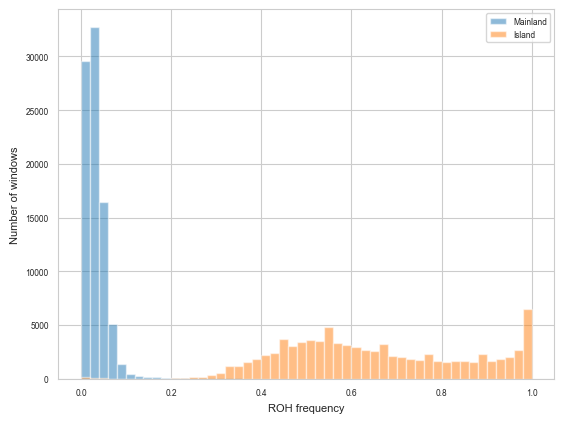

In [159]:
plt.hist(df_rohs_cor["roh_mainland"], bins=50, alpha=0.5, label="Mainland")
plt.hist(df_rohs_cor["roh_island"], bins=50, alpha=0.5, label="Island")

plt.xlabel("ROH frequency")
plt.ylabel("Number of windows")
plt.legend()

plt.show()

### Per population

In [160]:
def get_population(sample):
    pop = ''.join(re.findall(r'[A-Z]+', sample))
    pop = re.sub(r'^24', '', pop)
    if pop in ["CV", "FV"]:
        pop = "RG"
    return pop

sample_info = pd.DataFrame({"sample": sample_cols})
sample_info["Population"] = sample_info["sample"].apply(get_population)

sample_info.head()

,sample,Population
0,VS12,VS
1,VS11,VS
2,RG21,RG
3,RG32,RG
4,FV44,RG


In [161]:
pop_groups = sample_info.groupby("Population")["sample"].apply(list)

pop_groups

Population
BJ                       [BJ04, BJ16, BJ18, BJ09, BJ06]
KP    [KP02, KP03, KP04, KP05, KP06, KP07, KP08, KP1...
MP                                   [MP03, MP07, MP13]
PJ                                   [PJ19, PJ14, PJ17]
PK    [PK121, PK122, PK123, PK124, PK125, PK01, PK02...
PL                                   [PL01, PL02, PL03]
PM    [PM03, PM04, PM06, PM07, PM08, PM09, PM10, PM1...
RG    [RG21, RG32, FV44, FV46, CV61, CV68, RG26, RG2...
SC    [SC01, SC03, SC04, SC05, SC06, SC08, SC09, SC1...
SP                                         [SP19, SP33]
TM    [TM84, TM01, TM02, TM03, TM05, TM06, TM07, TM0...
TR                       [TR01, TR04, TR07, TR08, TR09]
VS    [VS12, VS11, VS01, VS02, VS03, VS04, VS05, VS0...
Name: sample, dtype: object

In [163]:
df_rohs_cor[sample_cols] = df_rohs_cor[sample_cols].apply(pd.to_numeric, errors='coerce')
for pop, samples in pop_groups.items():
    df_rohs_cor[f"roh_{pop}"] = (df_rohs_cor[samples] > 0).mean(axis=1)

# check
df_rohs_cor.filter(like="roh_").head()

/tmp/ipykernel_2116836/3956372954.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rohs_cor[f"roh_{pop}"] = (df_rohs_cor[samples] > 0).mean(axis=1)
/tmp/ipykernel_2116836/3956372954.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rohs_cor[f"roh_{pop}"] = (df_rohs_cor[samples] > 0).mean(axis=1)
/tmp/ipykernel_2116836/3956372954.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once us

,roh_all,roh_mainland,roh_island,roh_BJ,roh_KP,roh_MP,roh_PJ,roh_PK,roh_PL,roh_PM,roh_RG,roh_SC,roh_SP,roh_TM,roh_TR,roh_VS
0,0.315589,0.201923,0.389937,0.6,0.538462,0.666667,0.333333,0.456522,0.666667,0.391304,0.2500,0.232558,1.0,0.175,0.2,0.131579
1,0.300380,0.096154,0.433962,0.6,0.615385,0.666667,0.333333,0.456522,0.333333,0.500000,0.0625,0.255814,0.0,0.150,0.0,0.052632
2,0.349810,0.067308,0.534591,1.0,0.538462,0.666667,0.333333,0.565217,0.333333,0.521739,0.0625,0.465116,0.0,0.100,0.0,0.026316
3,0.353612,0.048077,0.553459,1.0,0.538462,1.000000,0.333333,0.586957,0.333333,0.608696,0.0625,0.395349,0.0,0.075,0.0,0.000000
4,0.288973,0.086538,0.421384,0.6,0.538462,1.000000,0.333333,0.413043,0.333333,0.413043,0.1250,0.348837,0.0,0.075,0.0,0.078947


In [164]:
coords = df_rohs_cor["WINDOW_ID"].str.extract(r":(\d+)-(\d+)")

df_rohs_cor["start"] = coords[0].astype(int)
df_rohs_cor["end"] = coords[1].astype(int)
df_rohs_cor["mid"] = (df_rohs_cor["start"] + df_rohs_cor["end"]) / 2 / 1e6

In [165]:
def plot_roh(df, value_col, title):

    chroms = sorted(df["chrom"].unique())
    
    fig, ax = plt.subplots(figsize=(12, 8))

    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=100)

    for i, chrom in enumerate(chroms):
        sub = df[df["chrom"] == chrom].sort_values("start")
        
        x = np.concatenate([sub["start"].values / 1e6,
                            [sub["end"].values[-1] / 1e6]])
        
        y = np.array([i - 0.4, i + 0.4])
        
        z = (sub[value_col].values * 100)[np.newaxis, :]

        ax.pcolormesh(
            x,
            y,
            z,
            cmap=cmap,
            norm=norm,
            shading='auto'
        )

    ax.set_yticks(range(len(chroms)))
    ax.set_yticklabels(range(1, len(chroms)+1))

    ax.set_xlabel("Position (Mb)")
    ax.set_ylabel("Chromosome")
    ax.set_title(title)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    ax.grid(False)

    # colorbar
    cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, pad=0.02)
    cbar.set_label("% of individuals with ROH")

    # inset density (top right)
    axins = inset_axes(ax, width="30%", height="25%", loc="upper right", borderpad=1.5)
    sns.kdeplot(df[value_col] * 100, fill=True, ax=axins, color="black")

    axins.set_xlabel("% ROH", fontsize=8)
    axins.set_ylabel("Density", fontsize=8)
    axins.tick_params(labelsize=8)

    for spine in ["top", "right"]:
        axins.spines[spine].set_visible(False)

    plt.tight_layout()
    plt.show()

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


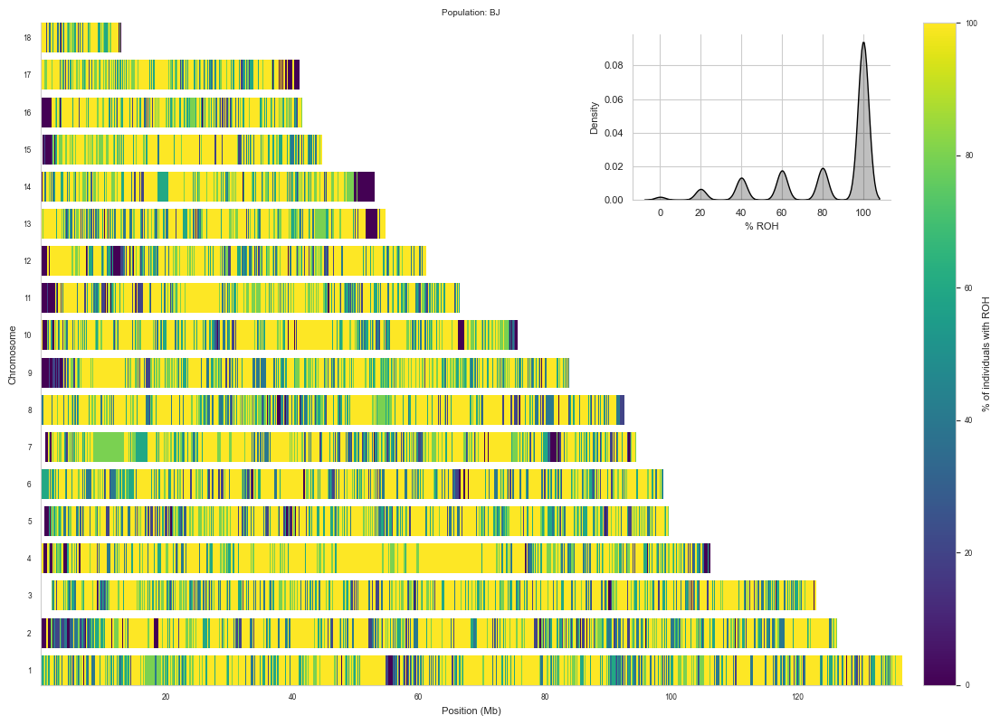

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


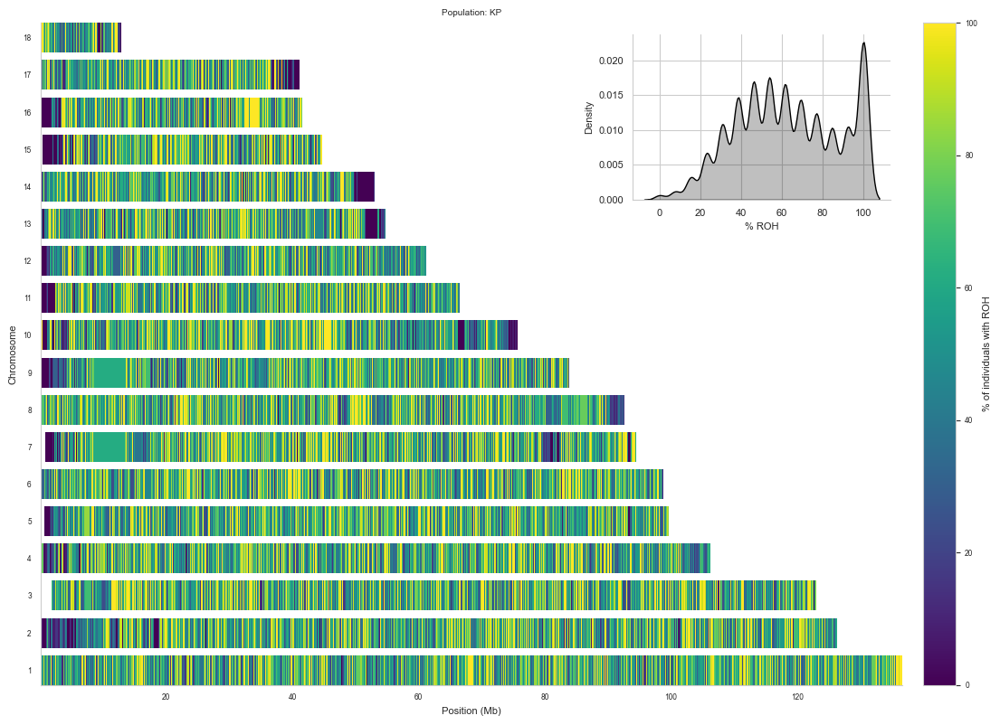

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


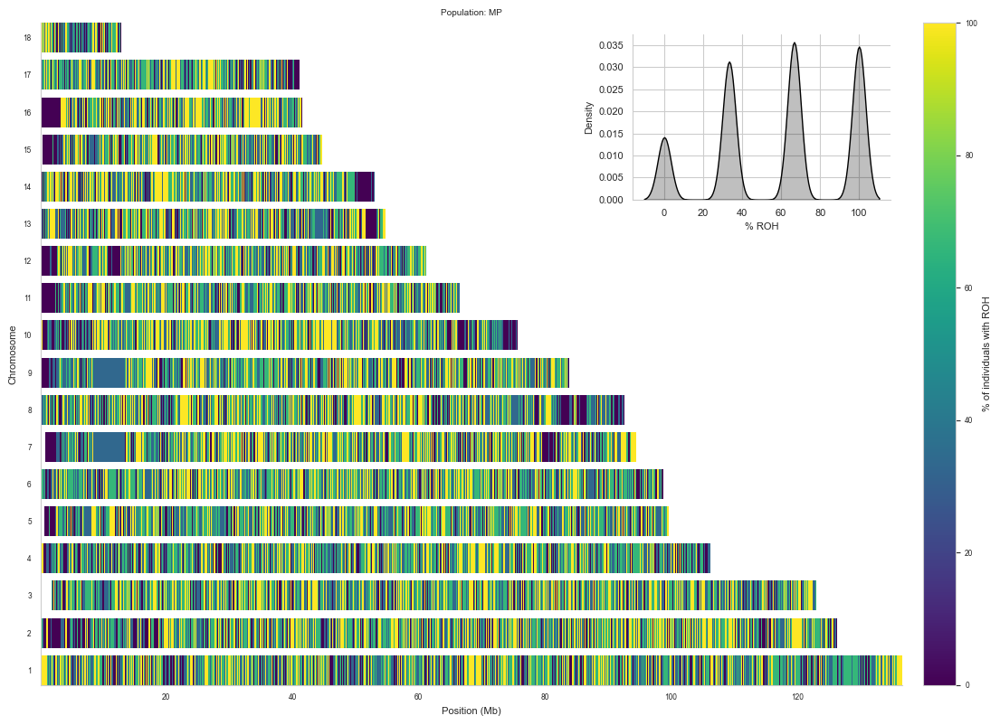

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


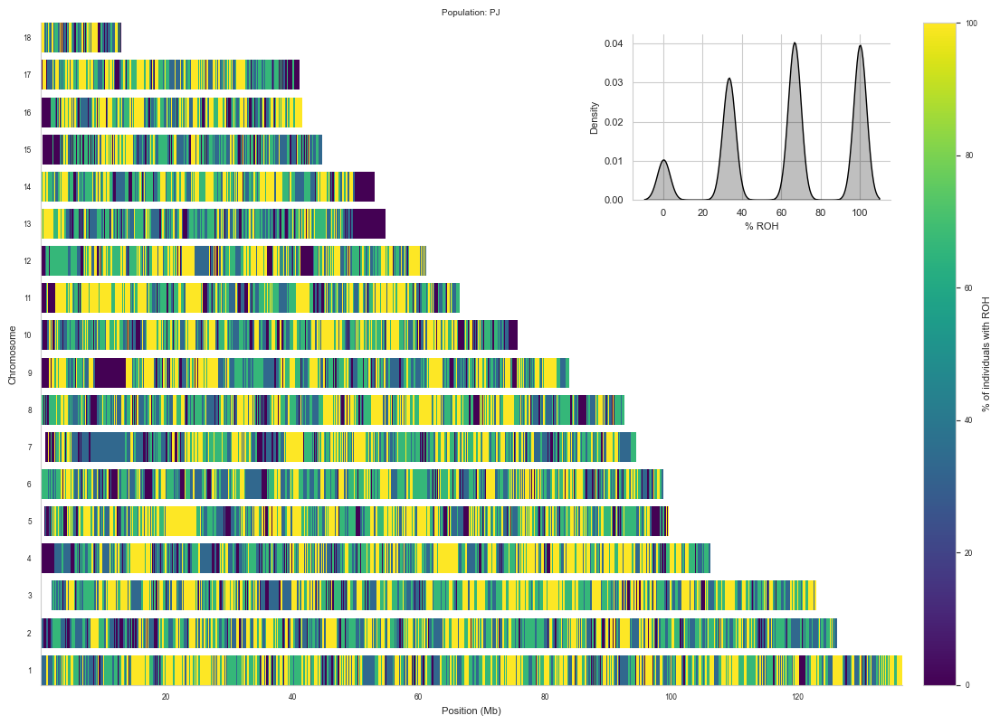

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


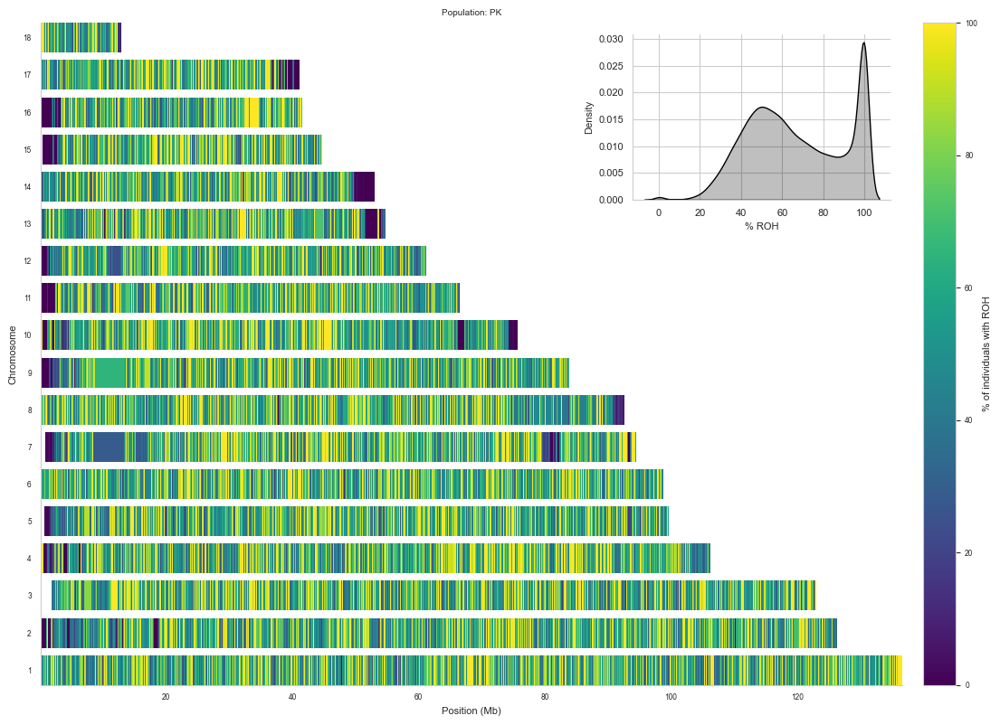

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


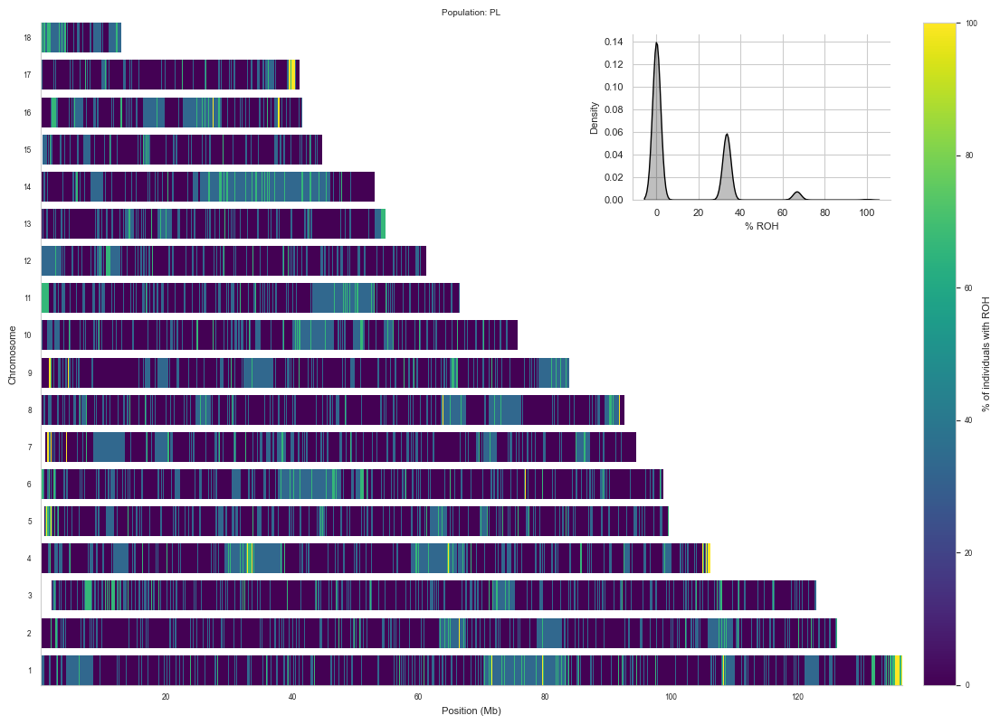

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


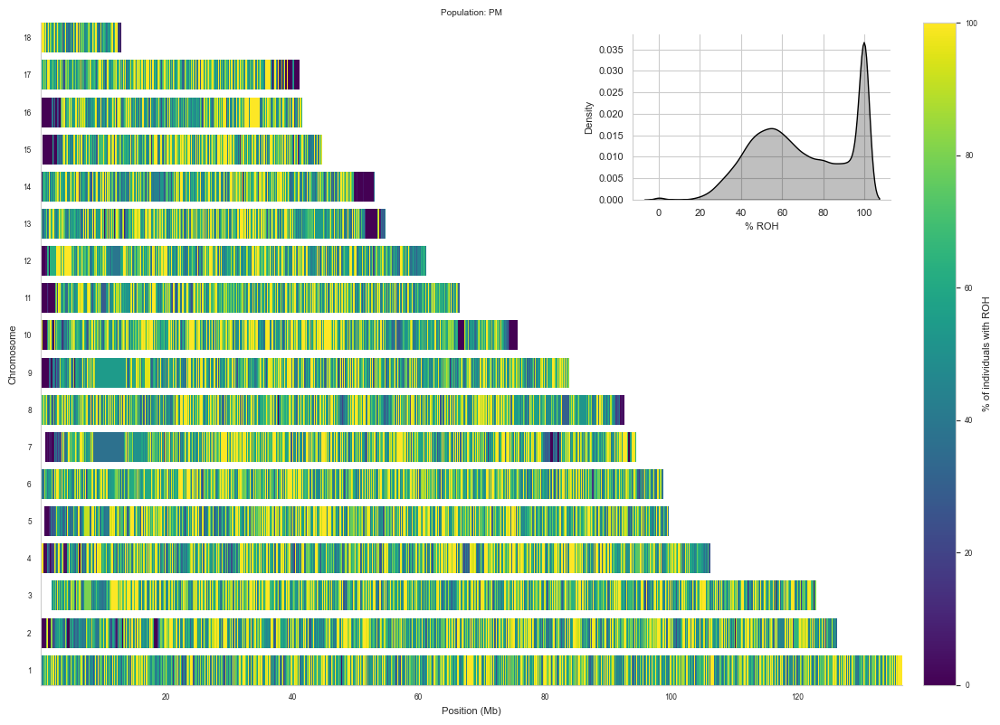

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


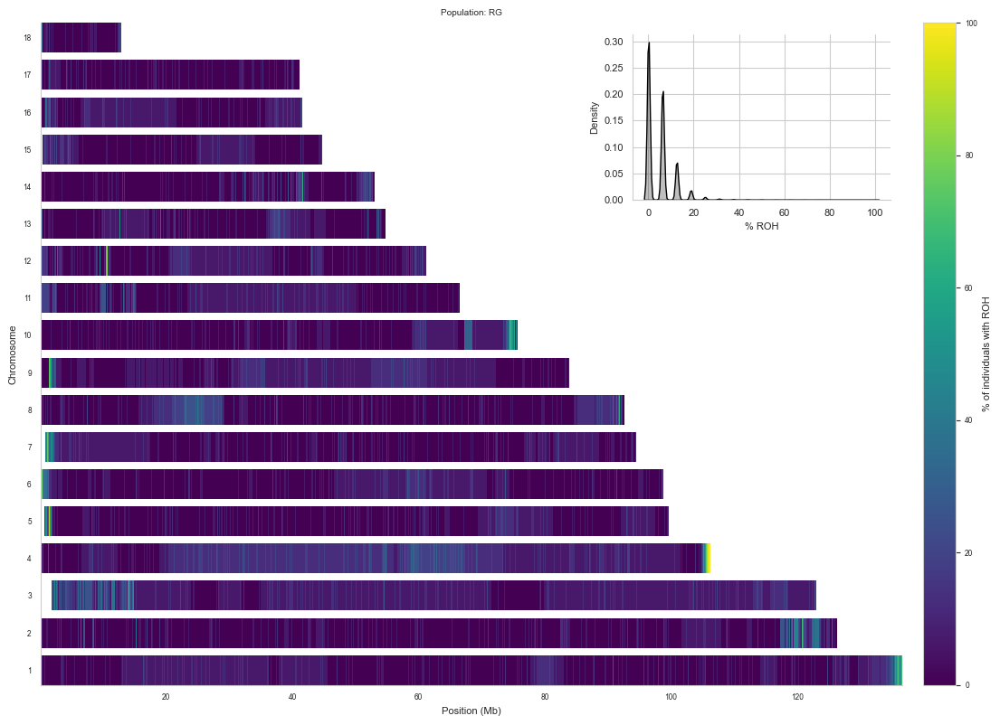

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


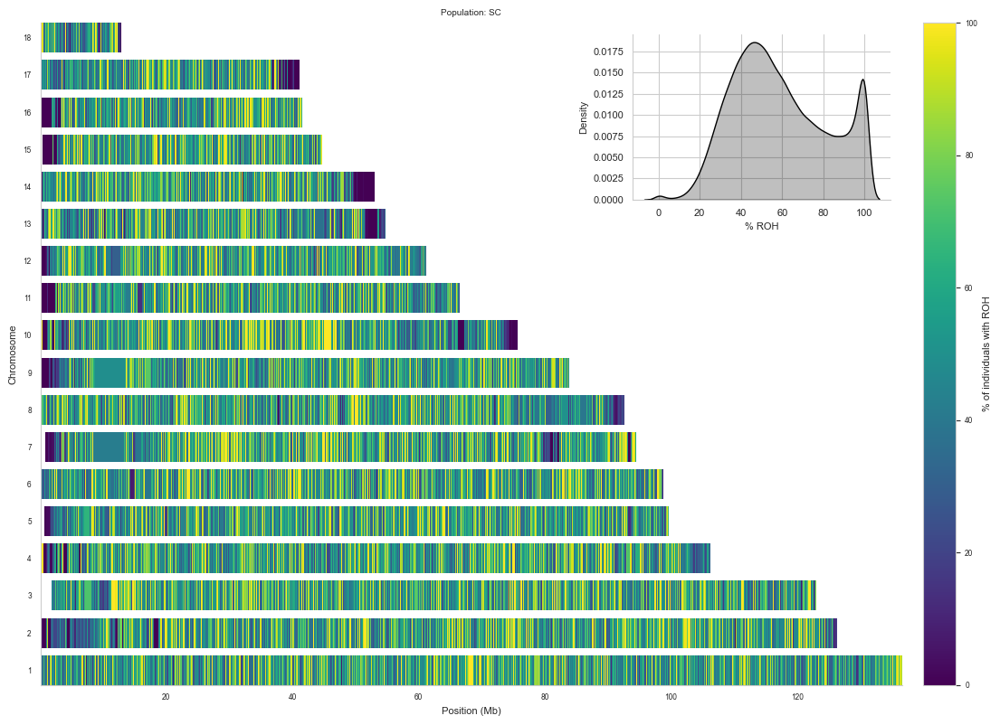

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


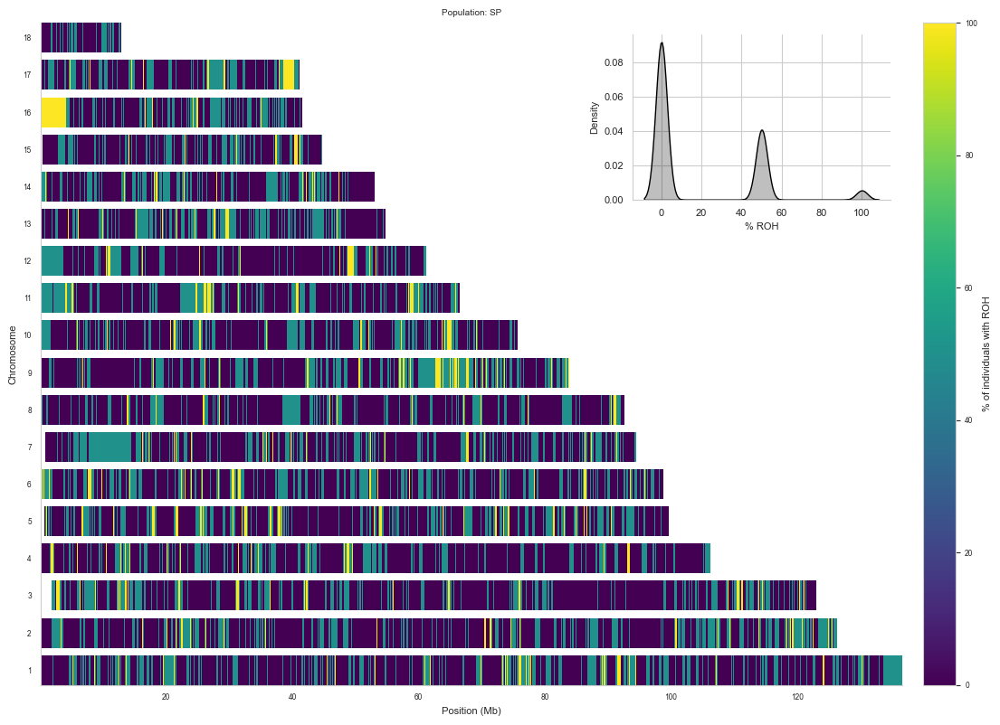

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


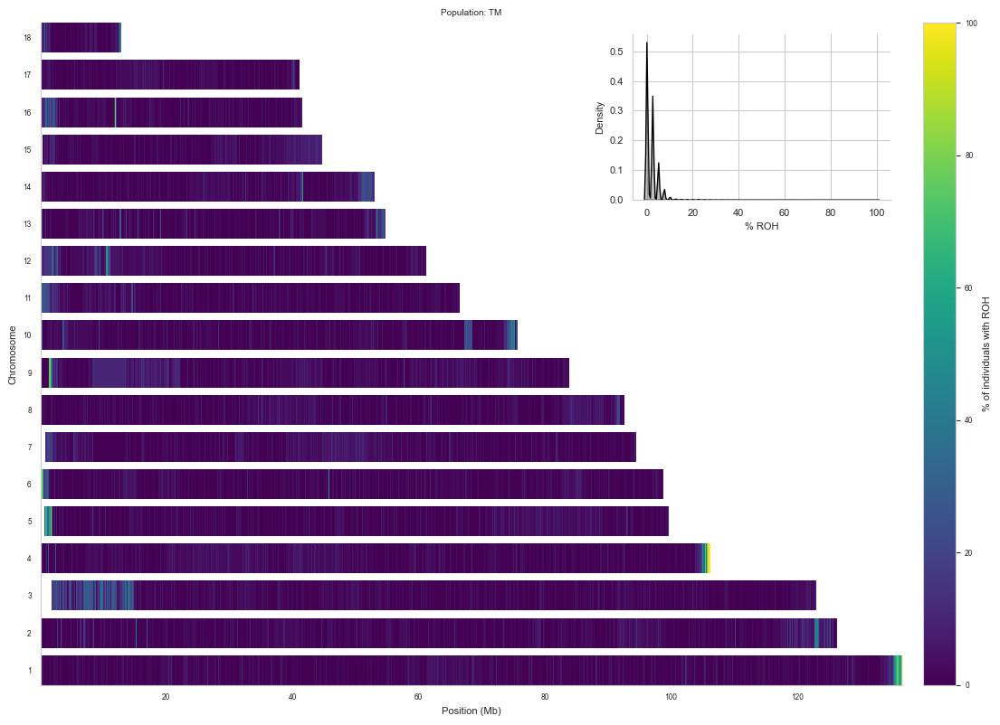

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


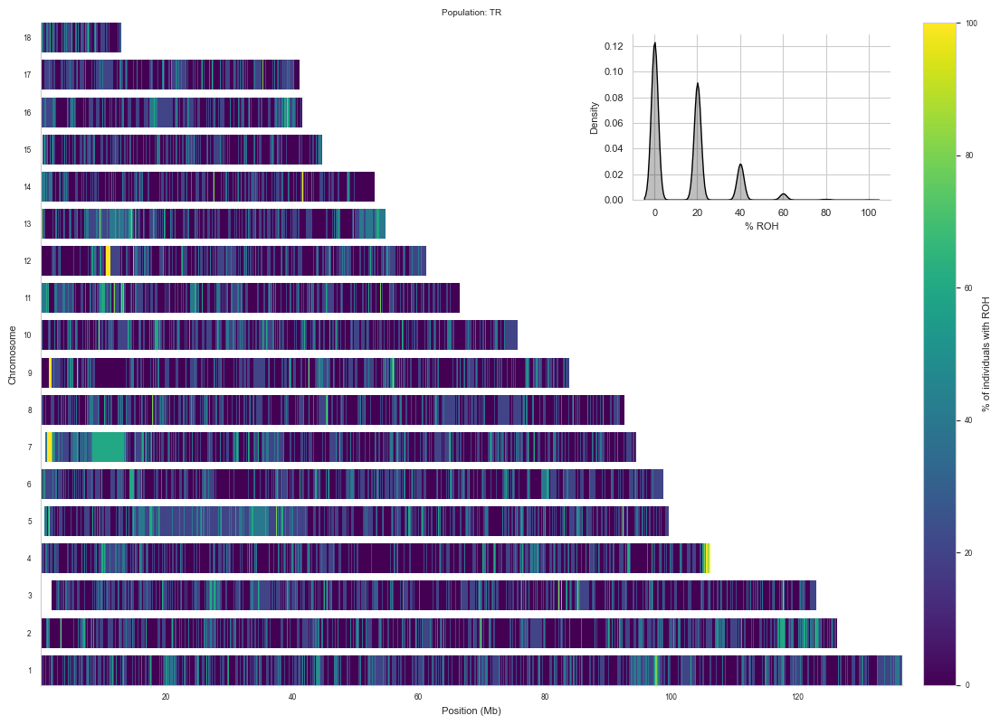

/tmp/ipykernel_2116836/586727613.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


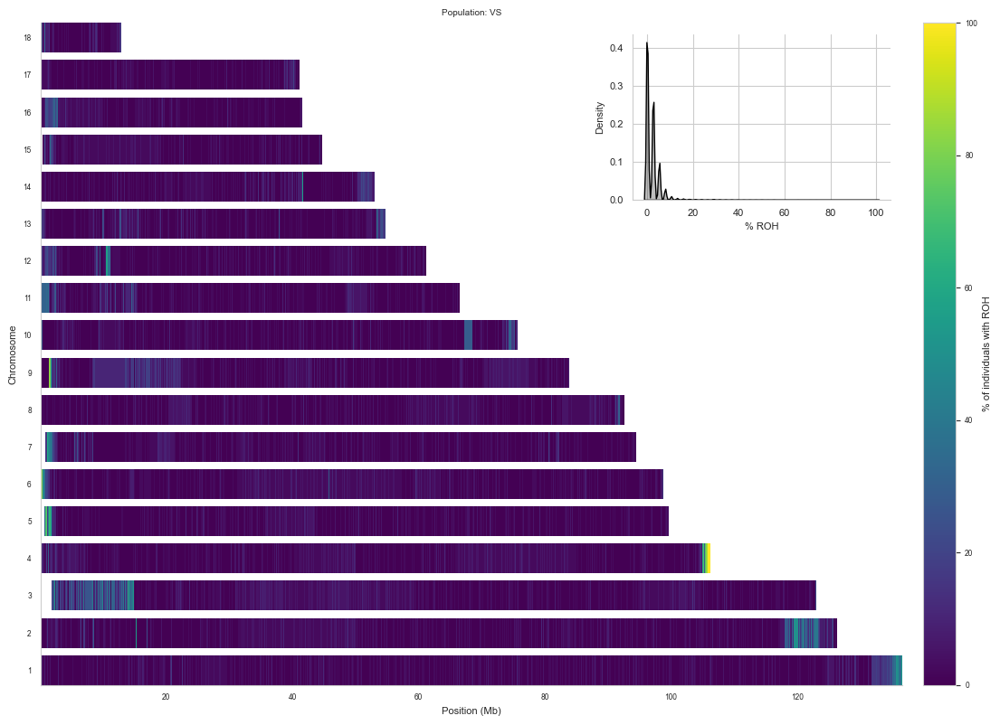

In [166]:
for pop in pop_groups.index:
    plot_roh(df_rohs_cor, f"roh_{pop}", f"Population: {pop}")

In [168]:
def get_islands(df, col, pct=0.005):
    k = int(len(df) * pct)
    return df.sort_values(col).tail(k)

In [172]:
set_SC = set(islands_per_pop["SC"]["WINDOW_ID"])
set_PK = set(islands_per_pop["PK"]["WINDOW_ID"])

print("Shared:", len(set_SC & set_PK))
print("SC only:", len(set_SC - set_PK))
print("PK only:", len(set_PK - set_SC))

Shared: 26
SC only: 409
PK only: 409


In [173]:
set_PM = set(islands_per_pop["PM"]["WINDOW_ID"])
set_PK = set(islands_per_pop["PK"]["WINDOW_ID"])

print("Shared:", len(set_PM & set_PK))
print("PM only:", len(set_PM - set_PK))
print("PK only:", len(set_PK - set_PM))

Shared: 58
PM only: 377
PK only: 377


In [178]:
import seaborn as sns

def plot_individual_correlation(df, samples, title):
    
    mat = (df[samples] > 0).astype(int)
    
    corr = mat.corr()
    
    plt.figure(figsize=(8,6))
    sns.heatmap(corr, cmap="viridis")
    
    plt.title(title)
    plt.show()

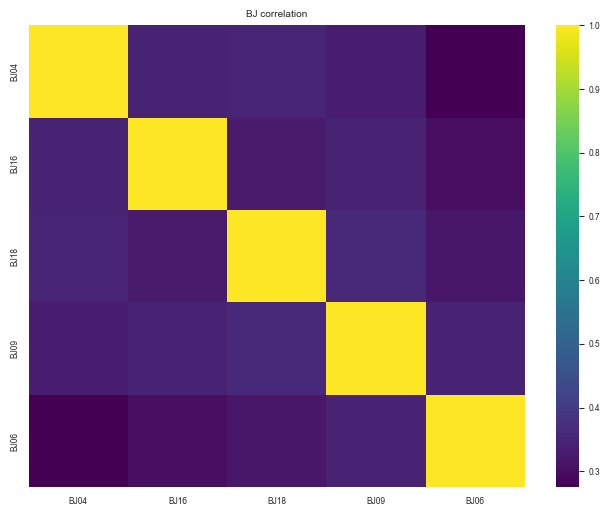

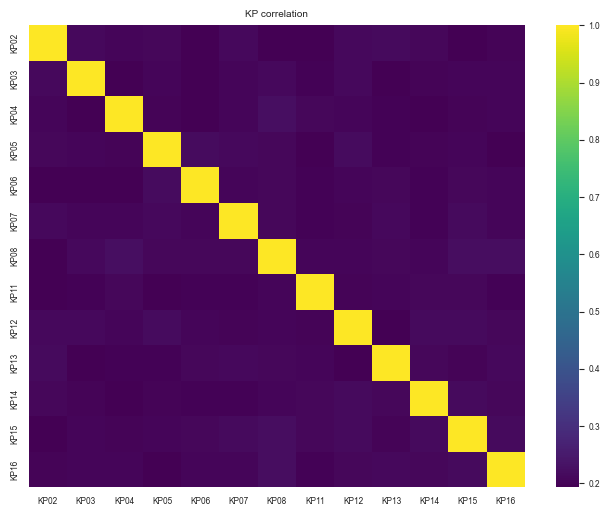

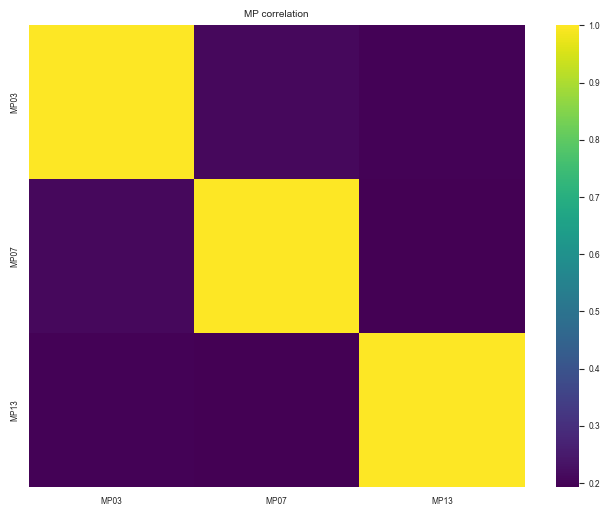

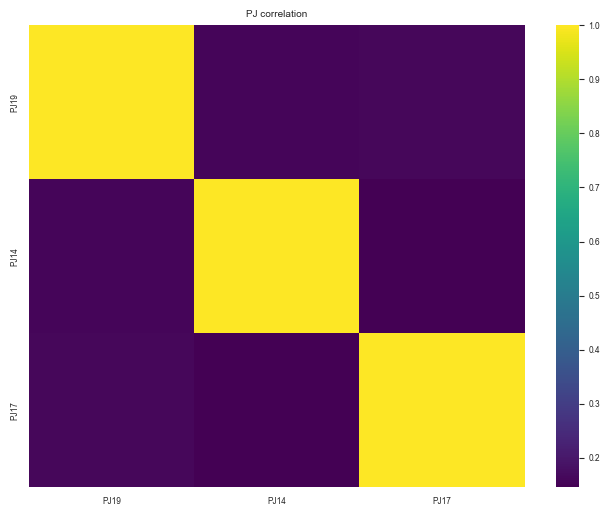

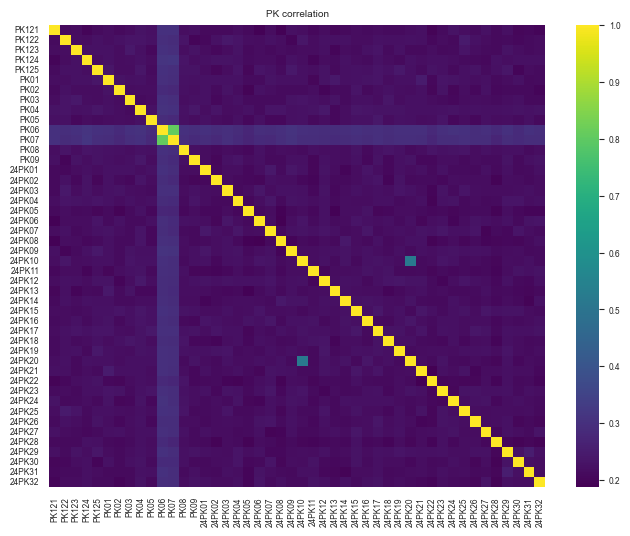

...

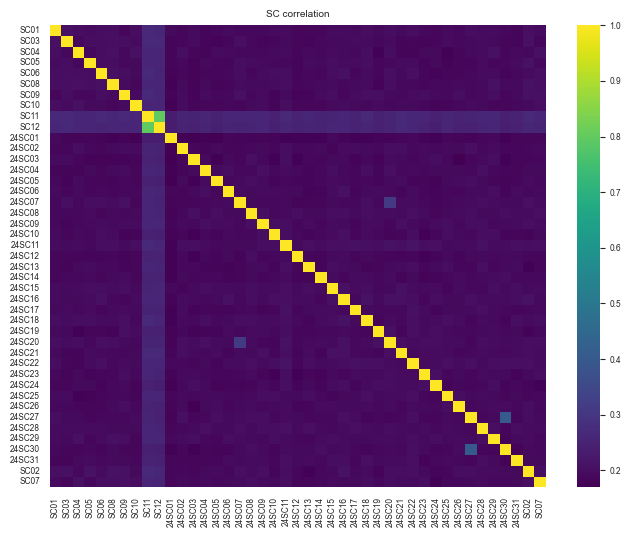

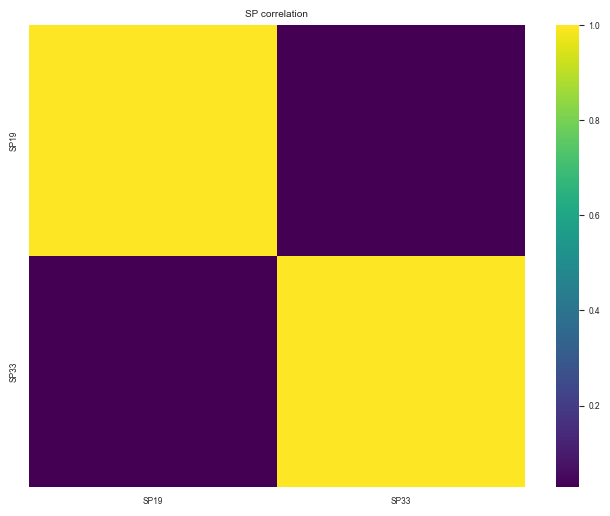

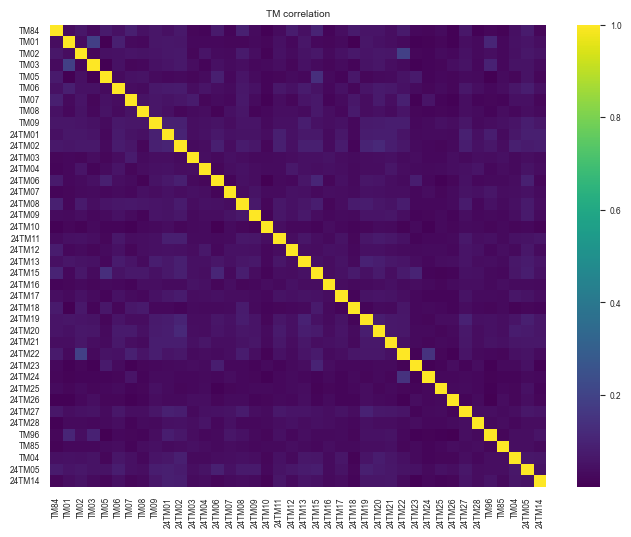

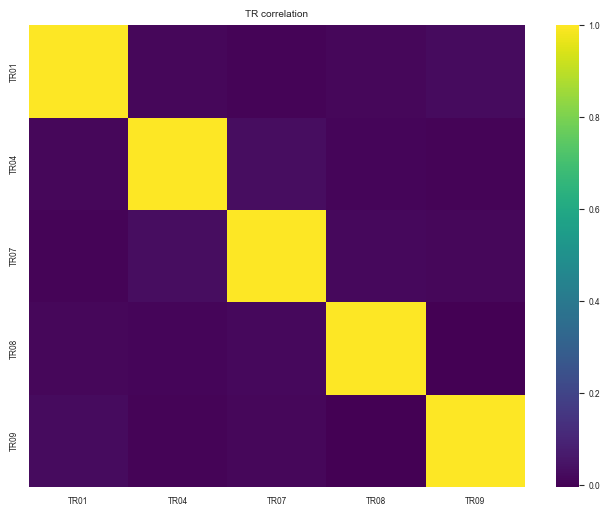

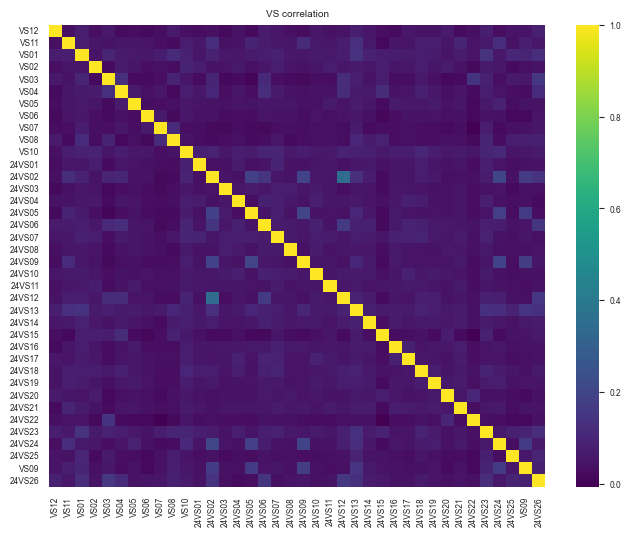

In [180]:
for pop, samples in pop_groups.items():
    plot_individual_correlation(df_rohs_cor, samples, f"{pop} correlation")

In [187]:
from sklearn.metrics.pairwise import cosine_similarity

def plot_cosine(df, samples, title):
    
    mat = (df[samples] > 0).astype(int).T
    
    sim = cosine_similarity(mat)
    
    plt.figure(figsize=(8,6))
    sns.heatmap(sim, cmap="viridis")
    
    plt.title(title + " (cosine)")
    plt.show()

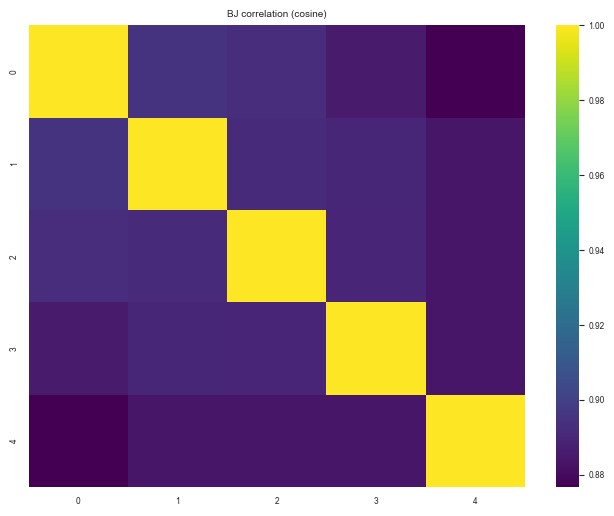

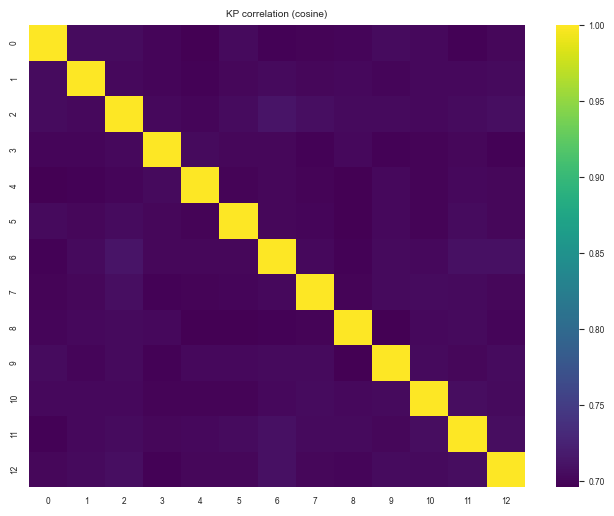

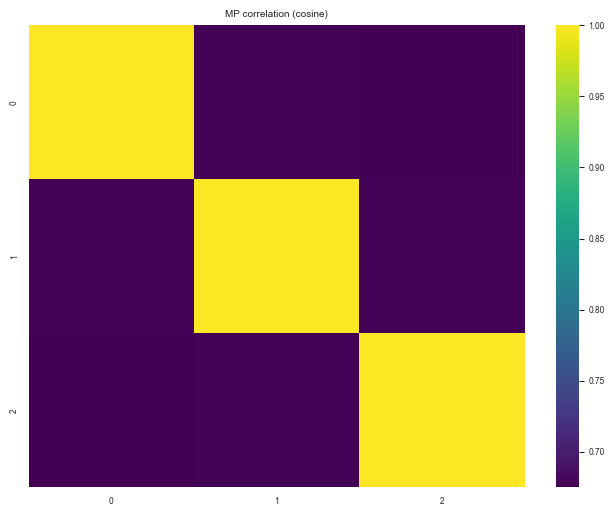

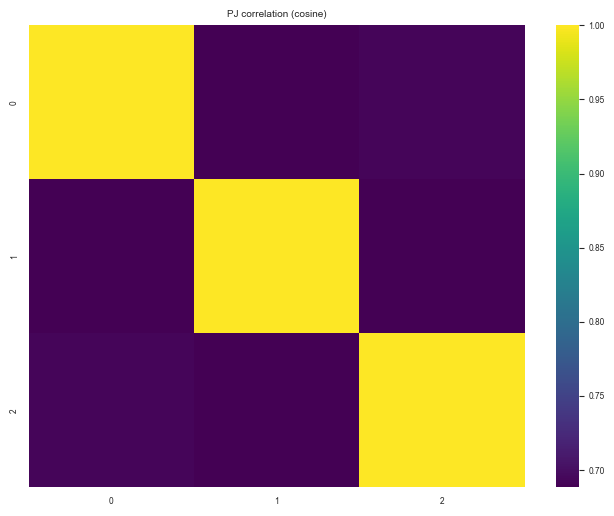

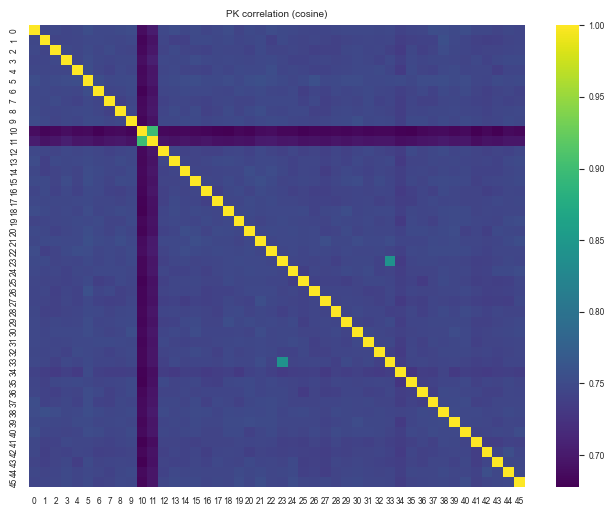

...

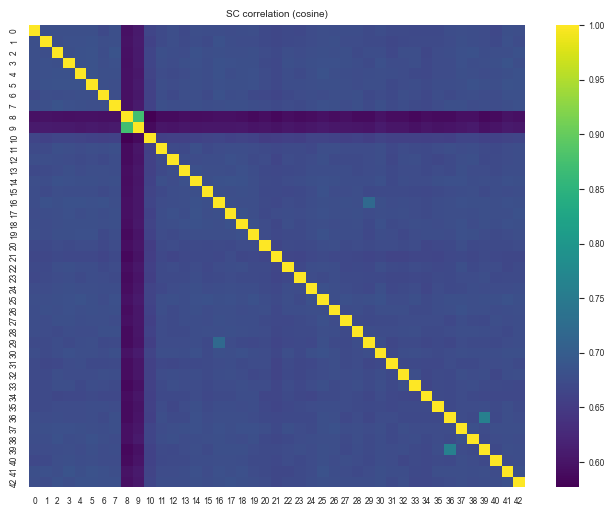

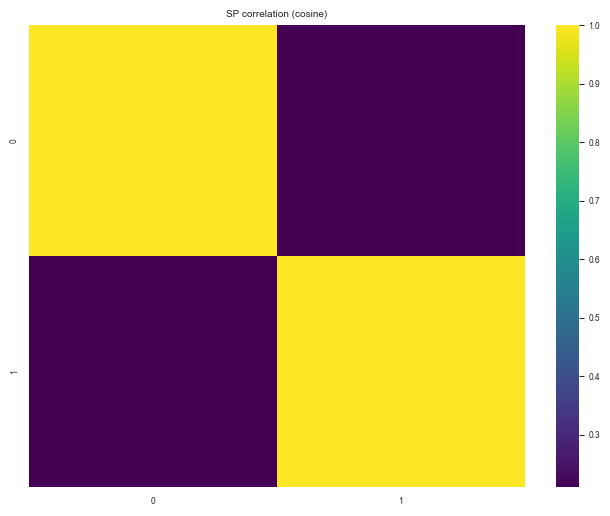

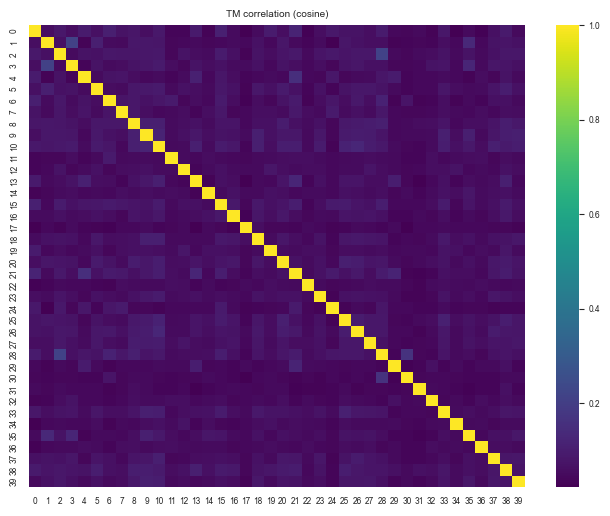

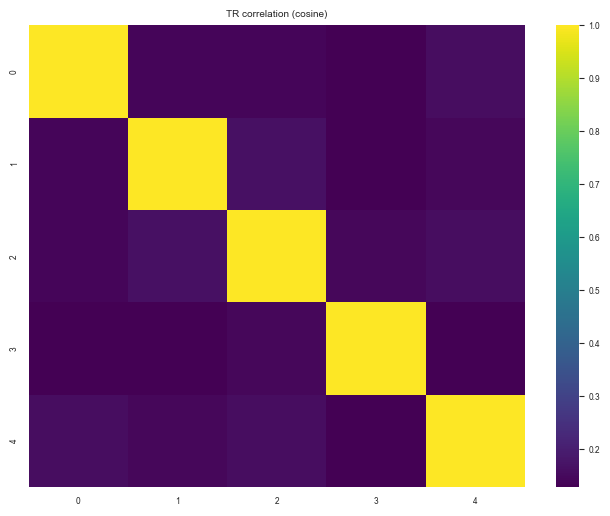

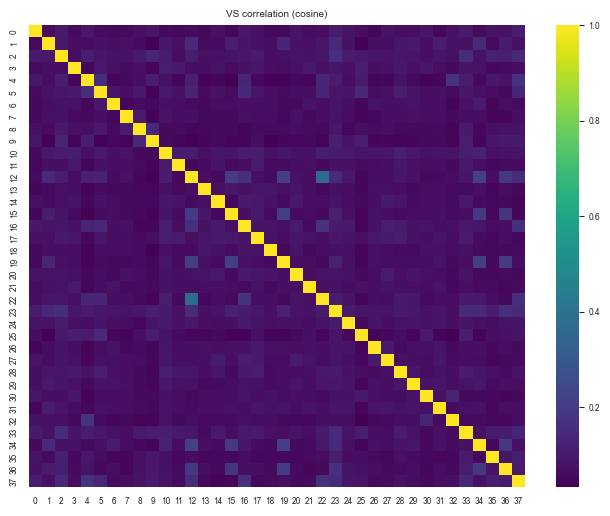

In [188]:
for pop, samples in pop_groups.items():
    plot_cosine(df_rohs_cor, samples, f"{pop} correlation")

In [189]:
def shared_roh_fraction(df, samples):
    
    mat = (df[samples] > 0).astype(int)
    
    freq = mat.mean(axis=1)
    
    shared_all = (freq == 1).mean()
    shared_90 = (freq > 0.90).mean()
    shared_75 = (freq > 0.75).mean()
    shared_half = (freq > 0.5).mean()
    shared_25 = (freq > 0.25).mean()
    shared_none = (freq == 0).mean()

    
    return shared_all, shared_90, shared_75, shared_half, shared_25, shared_none

In [191]:
for pop, samples in pop_groups.items():
    shared_all, shared_90, shared_75, shared_half, shared_25, shared_none = shared_roh_fraction(df_rohs_cor, samples)
    
    print(f"{pop}")
    print("  Shared by ALL:", shared_all)
    print("  Shared by >90%:", shared_90)
    print("  Shared by >75%:", shared_75)
    print("  Shared by >50%:", shared_half)
    print("  Shared by >25%:", shared_25)
    print("  Shared by NONE:", shared_none)

BJ
  Shared by ALL: 0.6198361352745826
  Shared by >90%: 0.6198361352745826
  Shared by >75%: 0.7446766946669271
  Shared by >50%: 0.8596348091883755
  Shared by >25%: 0.9462670788182435
  Shared by NONE: 0.011410776461395263
KP
  Shared by ALL: 0.14490422072325707
  Shared by >90%: 0.20999046229157808
  Shared by >75%: 0.35265389609643427
  Shared by >50%: 0.6579984601771945
  Shared by >25%: 0.9258127161784816
  Shared by NONE: 0.004125346172850855
MP
  Shared by ALL: 0.29947255323305333
  Shared by >90%: 0.29947255323305333
  Shared by >75%: 0.29947255323305333
  Shared by >50%: 0.6076439561954885
  Shared by >25%: 0.8778368936947704
  Shared by NONE: 0.12216310630522965
PJ
  Shared by ALL: 0.3262585753191685
  Shared by >90%: 0.3262585753191685
  Shared by >75%: 0.3262585753191685
  Shared by >50%: 0.6580903898969238
  Shared by >25%: 0.9152407984096158
  Shared by NONE: 0.08475920159038415
PK
  Shared by ALL: 0.14645553474368844
  Shared by >90%: 0.24037323466210084
  Shared by >7

In [198]:
import numpy as np

for pop1 in pop_groups.index:
    for pop2 in pop_groups.index:
        if pop1 >= pop2:
            continue
        
        r = np.corrcoef(
            df_rohs_cor[f"roh_{pop1}"],
            df_rohs_cor[f"roh_{pop2}"]
        )[0,1]
        
        
        print(f"{pop1} vs {pop2}: {r:.3f}")

BJ vs KP: 0.343
BJ vs MP: 0.151
BJ vs PJ: 0.075
BJ vs PK: 0.320
BJ vs PL: 0.020
BJ vs PM: 0.297
BJ vs RG: 0.034
BJ vs SC: 0.340
BJ vs SP: 0.008
BJ vs TM: -0.031
BJ vs TR: -0.016
BJ vs VS: -0.005
KP vs MP: 0.314
KP vs PJ: 0.166
KP vs PK: 0.718
KP vs PL: 0.012
KP vs PM: 0.662
KP vs RG: -0.001
KP vs SC: 0.752
KP vs SP: -0.007
KP vs TM: -0.003
KP vs TR: -0.003
KP vs VS: 0.010
MP vs PJ: 0.071
MP vs PK: 0.293
MP vs PL: 0.009
MP vs PM: 0.271
MP vs RG: -0.009
MP vs SC: 0.374
MP vs SP: -0.010
MP vs TM: -0.010
MP vs TR: 0.000
MP vs VS: -0.003
PJ vs PK: 0.154
PJ vs PL: 0.016
PJ vs PM: 0.146
PJ vs RG: -0.016
PJ vs SC: 0.194
PJ vs SP: -0.023
PJ vs TM: -0.001
PJ vs TR: 0.001
PJ vs VS: -0.013
PK vs PL: 0.011
PK vs PM: 0.850
PK vs RG: 0.003
PK vs SC: 0.715
PK vs SP: -0.012
PK vs TM: -0.012
PK vs TR: -0.012
PK vs VS: 0.003
PL vs PM: 0.016
PL vs RG: 0.077
PL vs SC: 0.018
PL vs SP: 0.035
PL vs TM: 0.088
PL vs TR: 0.021
PL vs VS: 0.088
PM vs RG: -0.007
PM vs SC: 0.659
PM vs SP: -0.007
PM vs TM: -0.013
PM 

0        0
1        0
2        0
3        0
4        0
        ..
87018    0
87019    0
87020    0
87021    0
87022    0
Name: roh_VS, Length: 87023, dtype: int64

In [193]:
for pop, samples in pop_groups.items():
    core = core_roh_regions(df_rohs_cor, samples)
    print(pop, len(core))

BJ 53940
KP 18274
MP 26061
PJ 28392
PK 20918
PL 203
PM 24498
RG 6
SC 12349
SP 3421
TM 3
TR 28
VS 3


In [199]:
df_rohs_cor[["roh_PK", "roh_PM", "roh_SC"]].head(20)

,roh_PK,roh_PM,roh_SC
0,0.456522,0.391304,0.232558
1,0.456522,0.500000,0.255814
2,0.565217,0.521739,0.465116
3,0.586957,0.608696,0.395349
4,0.413043,0.413043,0.348837
5,0.478261,0.478261,0.441860
6,0.478261,0.478261,0.441860
7,0.456522,0.456522,0.372093
8,0.478261,0.434783,0.488372
9,0.586957,0.608696,0.372093


In [201]:
df_rohs_cor[pop_groups["PK"]].head(20)

,PK121,PK122,PK123,PK124,PK125,PK01,PK02,PK03,PK04,PK05,...,24PK23,24PK24,24PK25,24PK26,24PK27,24PK28,24PK29,24PK30,24PK31,24PK32
0,0,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
1,0,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
2,1,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
3,1,1,1,1,1,0,1,1,0,1,...,0,1,1,1,0,1,1,1,1,0
4,0,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
5,0,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
6,0,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
7,0,0,1,1,1,0,1,1,0,1,...,0,0,1,1,0,1,1,0,1,0
8,1,0,1,1,1,0,1,1,0,1,...,1,0,1,1,0,1,1,0,1,0
9,1,1,1,1,1,0,1,1,0,1,...,0,1,1,1,0,1,1,1,1,0
